In [1]:
# Load in our libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib as mpl
%matplotlib inline
mpl.style.use('seaborn')

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')

import time
import datetime as dt

from sklearn import preprocessing
from sklearn import svm

import math

In [114]:
data = pd.read_csv("tsharep.csv",encoding=' big5-hkscs ').rename(columns={'代碼':'code','日期':'date','中文簡稱':'name','開盤價(元)':'open','最高價(元)':'high','最低價(元)':'low','收盤價(元)':'close','成交張數(張)':'volume'})
data.tail()

,code,date,name,open,high,low,close,volume
2042064,9962,20180521,有益,11.1,11.1,11,11.05,89
2042065,9962,20180522,有益,11.15,11.15,11,11.05,45
2042066,9962,20180523,有益,11.05,11.05,11,11,29
2042067,9962,20180524,有益,11.05,11.05,11,11.05,25
2042068,9962,20180525,有益,11.05,11.05,11,11.05,21


# Data prosessing

## Index data

In [115]:
def extract_target_index(etf_propotion_filepath,stock):
    ETF_propotion = pd.read_excel(etf_propotion_filepath)
    ETF_target = pd.DataFrame(columns = stock.columns)
    
    for code in ETF_propotion['code'].values:
        temp = stock[stock['code']== code]
        ETF_target = pd.concat([ETF_target,temp],axis = 0)
    
    #process data type
    ETF_target['date'] = ETF_target['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y%m%d'))
    ETF_target['open'] = ETF_target['open'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETF_target['high'] = ETF_target['high'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETF_target['low'] = ETF_target['low'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETF_target['close'] = ETF_target['close'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETF_target['volume'] = ETF_target['volume'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    
    #map with propotion (first column:date , last column:propotion , middle: features)
    ETF_target['propotion'] = ETF_target['code'].map(lambda x: ETF_propotion[ETF_propotion['code']==x]['propotion'].values[0])
    ETF_target.drop(['code','name'],axis = 1,inplace = True)
    
    for columnname in ETF_target.columns[1:-1]:
        ETF_target[columnname] = ETF_target[columnname] * ETF_target['propotion'] * 0.01
    ETF_target.drop(['propotion'],axis = 1,inplace = True)
    
    #for constituent stock into index
    ETF_target = ETF_target.groupby(['date']).sum()
    
    #rename columns
    ETF_target = ETF_target.rename(columns = {'open':'i_open','high':'i_high','low':'i_low','close':'i_close','volume':'i_volume'})
    
    return ETF_target 
    

In [116]:
# Taiwan50 = extract_target_index('ETF50.xlsx',data)
# Taiwan50.head()

,i_open,i_high,i_low,i_close,i_volume
date,,,,,
2013-01-02,94.684852,96.551988,94.005632,96.233431,23918.3962
2013-01-03,96.772465,97.774109,96.002028,96.700293,29755.7235
2013-01-04,95.923933,96.701394,94.465837,95.679435,27253.8958
2013-01-07,95.366814,95.490941,92.904071,93.766549,25203.1961
2013-01-08,93.298728,93.838110,92.366784,93.389683,20860.6399


# ETF positive negative 

In [71]:
dic_ = {}
temp = [i for i in range(6)]
etf = ['Yunta50_n','Cathay_n','Fubon_n','Fubon_p','Cathay_p','Yunta50_p']
fea = ['open','high','low','close','volume','out']
for index,col in enumerate(ETF_inv.columns):
    t = index // 6
    f = index % 6
    dic_[col] = etf[t]+'_'+fea[f]

ETF_inv = pd.read_excel('ETF_inv.xlsx').rename(columns = dic_).iloc[1:]
for col in ETF_inv.columns:
    ETF_inv[col] = ETF_inv[col].map(lambda x: float(x))

Yunta50_n = ETF_inv.iloc[:,:6]
Cathay_n = ETF_inv.iloc[:,6:12]
Fubon_n = ETF_inv.iloc[:,12:18]
Fubon_p = ETF_inv.iloc[:,18:24]
Cathay_p = ETF_inv.iloc[:,24:30]
Yunta50_p = ETF_inv.iloc[:,-6:]

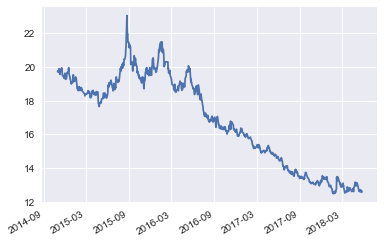

In [61]:
Yunta50_n['Yunta50_n1_close'].plot()

# TXF

In [30]:
def load_txt(filepath,target):
    file = []
    with open(filepath,'r') as filein:
        for line in filein:
            file.append(line.strip('\n').split(','))
    file = np.array(file)

    df = pd.DataFrame(file[1:],columns=['date','open','high','low','close','volume'])
    df['date'] = df['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y/%m/%d'))
    df['open'] = df['open'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['high'] = df['high'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['low'] = df['low'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['close'] = df['close'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['volume'] = df['volume'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df = df.set_index('date')
    return df.loc[target.index[0]:]

def load_txt_TXF(filepath,target):
    file = []
    with open(filepath,'r') as filein:
        for line in filein:
            file.append(line.strip('\n').split(','))
    file = np.array(file)

    df = pd.DataFrame(file[1:],columns=['date','time','open','high','low','close','volume'])
    df.drop(['time'],axis = 1,inplace = True)
    df['date'] = df['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y/%m/%d'))
    df['open'] = df['open'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['high'] = df['high'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['low'] = df['low'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['close'] = df['close'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['volume'] = df['volume'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df = df.set_index('date')
    return df.loc[target.index[0]:]

In [119]:
TXF = load_txt_TXF('TXF-1-300-分鐘.txt',Taiwan50)

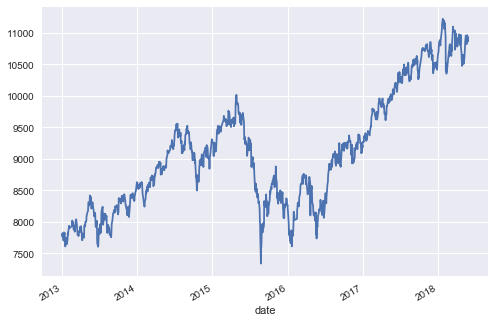

In [120]:
TXF['close'].plot()

In [121]:
TXF.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,10865.0,10966.0,10863.0,10965.0,100698.0
2018-05-22,10969.0,10999.0,10913.0,10922.0,114528.0
2018-05-23,10933.0,10998.0,10855.0,10858.0,137646.0
2018-05-24,10879.0,10923.0,10851.0,10917.0,113066.0
2018-05-25,10921.0,10956.0,10890.0,10932.0,107199.0


In [122]:
Taiwan50.iloc[:TXF.shape[0]].tail()

,i_open,i_high,i_low,i_close,i_volume
date,,,,,
2018-05-21,224.802825,228.712885,223.749880,227.153125,12508.7878
2018-05-22,227.490370,229.399915,225.172620,225.711065,14754.9472
2018-05-23,227.042660,228.462785,222.497690,222.933165,16097.3659
2018-05-24,224.474565,226.656605,222.664055,225.385240,10727.7804
2018-05-25,225.652195,227.503195,224.386955,225.913430,13993.1033


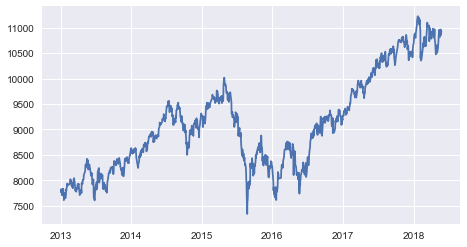

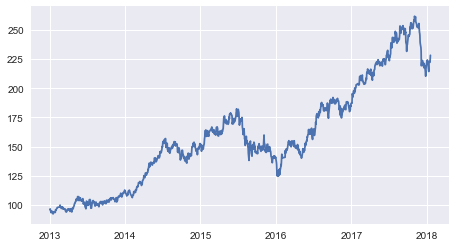

In [123]:
plt.figure(figsize=(7.5,4))
plt.plot(TXF.index,TXF['close'])
plt.show()
plt.figure(figsize=(7.5,4))
plt.plot(Taiwan50[:-80].index,Taiwan50.iloc[:-80]['i_close'])

# EXF

In [124]:
def load_txt_2(filepath,target):
    file = []
    with open(filepath,'r') as filein:
        for line in filein:
            file.append(line.strip('\n').split(','))
    file = np.array(file)

    df = pd.DataFrame(file[1:],columns=['date','time','open','high','low','close','volume'])
    df['date'] = df['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y/%m/%d'))
    df['open'] = df['open'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['high'] = df['high'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['low'] = df['low'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['close'] = df['close'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df['volume'] = df['volume'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    df = df.set_index('date').drop(['time'],axis = 1)
    return df.loc[target.index[0]:target.index[-1]]

In [125]:
EXF = load_txt_2('EXF-1-1-日.txt',Taiwan50)

In [126]:
EXF.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,440.00,446.45,440.00,446.15,3593.0
2018-05-22,446.40,449.10,444.50,444.85,3084.0
2018-05-23,445.50,447.90,442.25,442.50,3619.0
2018-05-24,444.00,446.35,442.55,445.90,3033.0
2018-05-25,446.15,449.80,444.80,448.95,3341.0


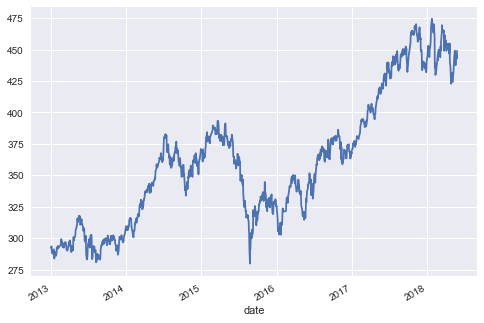

In [127]:
EXF['close'].plot()

# FXF

In [128]:
FXF = load_txt_2('FXF-1-1-日.txt',Taiwan50)

In [129]:
FXF.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,1268.4,1275.8,1268.4,1273.4,1655.0
2018-05-22,1274.6,1274.6,1272.0,1272.6,1038.0
2018-05-23,1272.2,1274.6,1266.4,1266.8,1413.0
2018-05-24,1269.0,1271.6,1265.6,1269.6,1226.0
2018-05-25,1271.0,1272.0,1266.6,1268.0,1175.0


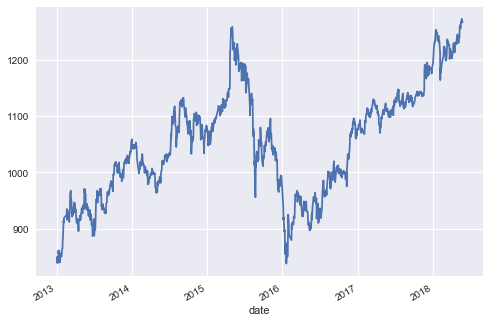

In [130]:
FXF['close'].plot()

# E_F

In [131]:
E_F = EXF/FXF

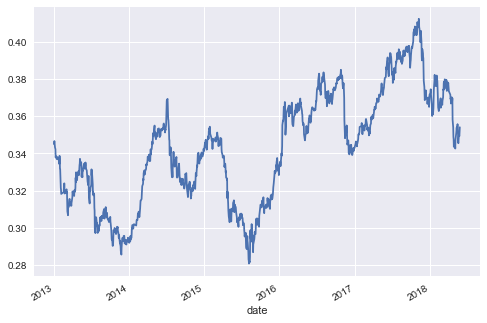

In [132]:
E_F['close'].plot()

# Nikkei 225

In [133]:
def load_csv(filename,target):
    df = pd.read_csv(filename).drop(['Adj Close'],axis = 1)
    columnnames = df.columns
    df = df.rename(columns = {columnnames[0]:'date',columnnames[1]:'open',columnnames[2]:'high',columnnames[3]:'low',
                             columnnames[4]:'close',columnnames[5]:'volume'})
    df['date'] = df['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y/%m/%d'))
    df['open'] = df['open'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df['high'] = df['high'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df['low'] = df['low'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df['close'] = df['close'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df['volume'] = df['volume'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df = df.set_index('date')
    
    return df.loc[target.index[0]:target.index[-1]]

In [134]:
Nikkei = load_csv('Nikkei225.csv',Taiwan50)

In [135]:
Nikkei.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,22937.58008,23050.39063,22935.31055,23002.36914,59100.0
2018-05-22,23025.94922,23031.66992,22952.86914,22960.33984,59400.0
2018-05-23,22868.78906,22949.73047,22649.84961,22689.74023,75000.0
2018-05-24,22621.28906,22644.68945,22366.59961,22437.00977,85600.0
2018-05-25,22380.22070,22509.35938,22318.15039,22450.78906,70400.0


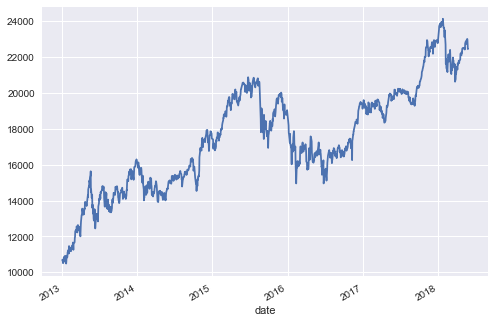

In [136]:
Nikkei['close'].dropna(axis = 0,how = 'any').plot()

# VIX

In [137]:
VIX = load_csv('VIX.csv',Taiwan50).drop(['volume'],axis = 1)

In [138]:
VIX.tail()

,open,high,low,close
date,,,,
2018-05-21,12.99,13.59,12.78,13.08
2018-05-22,13.03,13.42,12.77,13.22
2018-05-23,13.50,14.60,12.49,12.58
2018-05-24,12.73,14.24,12.53,12.53
2018-05-25,12.44,13.52,12.29,13.22


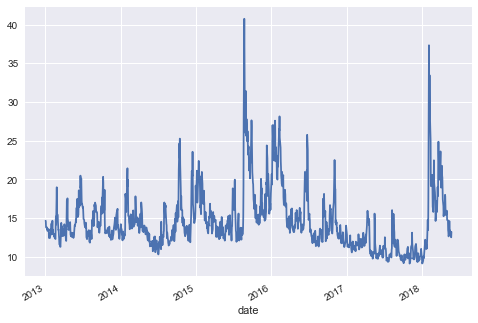

In [139]:
VIX['close'].plot()

# Russell 2000

In [140]:
Russell = load_csv('Russell2000.csv',Taiwan50)

In [141]:
Russell.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,1627.770020,1639.040039,1627.770020,1637.439941,30098900.0
2018-05-22,1637.650024,1639.890015,1625.239990,1625.239990,33663100.0
2018-05-23,1624.920044,1629.400024,1618.560059,1627.609985,33262900.0
2018-05-24,1627.219971,1630.310059,1616.589966,1628.219971,32560300.0
2018-05-25,1627.930054,1628.729980,1623.329956,1626.930054,29952600.0


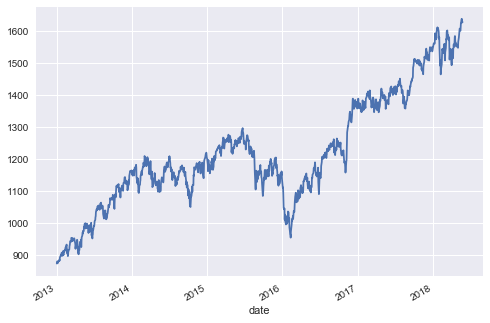

In [142]:
Russell['close'].plot()

# S&P 500

In [143]:
SP = load_csv('S&P500.csv',Taiwan50)

In [144]:
SP.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,2735.389893,2739.189941,2725.699951,2733.010010,3019890000
2018-05-22,2738.340088,2742.239990,2721.879883,2724.439941,3366310000
2018-05-23,2713.979980,2733.330078,2709.540039,2733.290039,3326290000
2018-05-24,2730.939941,2731.969971,2707.379883,2727.760010,3256030000
2018-05-25,2723.600098,2727.360107,2714.989990,2721.330078,2995260000


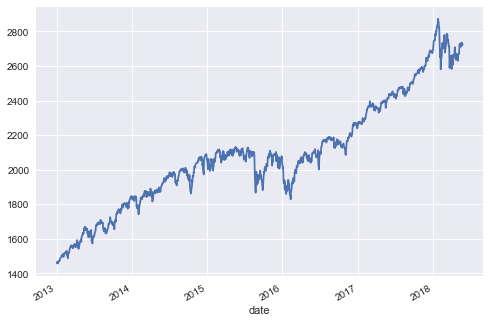

In [145]:
SP['close'].plot()

# Dow Jones

In [146]:
DJ = load_csv('Dow Jones.csv',Taiwan50)

In [147]:
DJ.tail()

,open,high,low,close,volume
date,,,,,
2018-05-21,24883.06055,25086.49023,24883.06055,25013.28906,308920000
2018-05-22,25047.55078,25064.99023,24812.06055,24834.41016,288200000
2018-05-23,24757.71094,24889.46094,24667.11914,24886.81055,399610000
2018-05-24,24877.35938,24877.35938,24605.90039,24811.75977,347050000
2018-05-25,24781.28906,24824.22070,24687.81055,24753.08984,257210000


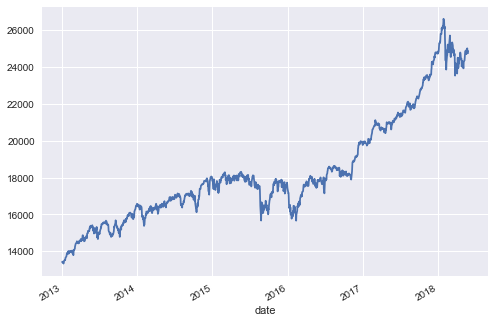

In [148]:
DJ['close'].plot()

# SOX

In [150]:
# SOX = load_csv('SOX.csv',Taiwan50).drop(['volume'],axis = 1)

In [ ]:
SOX['close'].plot()

# Put call ratio

In [151]:
with open('put_call_ratio-日-成交價.txt') as f:
    line = f.readlines()

In [152]:
pcr = load_txt('put_call_ratio-日-成交價.txt',Taiwan50)

In [153]:
print(pcr.shape)
print(pcr[pcr['volume']==0].shape)
print(pcr[pcr['open']==0].shape)
print(pcr[pcr['high']==0].shape)
print(pcr[pcr['low']==0].shape)
print(pcr[pcr['close']==0].shape)

(1317, 5)
(1317, 5)
(889, 5)
(271, 5)
(619, 5)
(1, 5)


In [154]:
pcr.drop(['volume','open','low'],axis = 1,inplace = True)

In [155]:
pcr.tail()

,high,close
date,,
2018-05-21,49.25,49.25
2018-05-22,30.06,30.06
2018-05-23,37.87,37.87
2018-05-24,41.89,41.89
2018-05-25,50.21,50.21


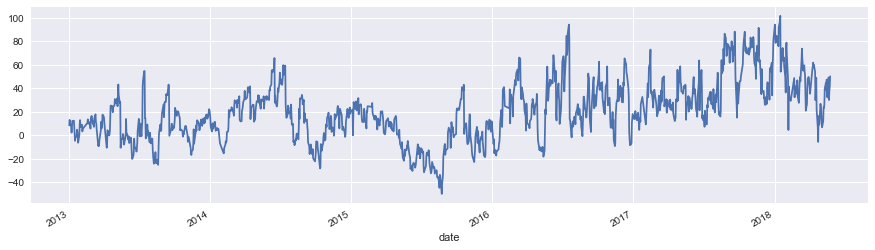

In [156]:
pcr['close'].plot(figsize = (15,4))

# Foreign Investor OI


In [157]:
def load_csv_3(filename,target):
    df = pd.read_excel(filename)
    columnnames = df.columns
    df = df.rename(columns = {'11TX 自營商－臺指期':'DOI','12TX 投信－臺指期':'IOI','13TX 外資－臺指期':'FOI'})
    df['DOI'] = df['DOI'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df['IOI'] = df['IOI'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    df['FOI'] = df['FOI'].map(lambda x:x if (type(x)==float or type(x)==int) else float(x.replace(',','')) )
    
    return df.loc[target.index[0]:]

In [158]:
OI = load_csv_3('OI.xlsx',Taiwan50)

In [159]:
OI.tail()

,DOI,IOI,FOI
2018-05-21,-2641.0,-23406.0,41852.0
2018-05-22,-515.0,-23950.0,37998.0
2018-05-23,-2794.0,-24380.0,39400.0
2018-05-24,-838.0,-24300.0,41686.0
2018-05-25,-2485.0,-24294.0,44997.0


In [160]:
FOI = load_txt('外資未平倉-成交價.txt',Taiwan50).drop(['volume'],axis = 1)

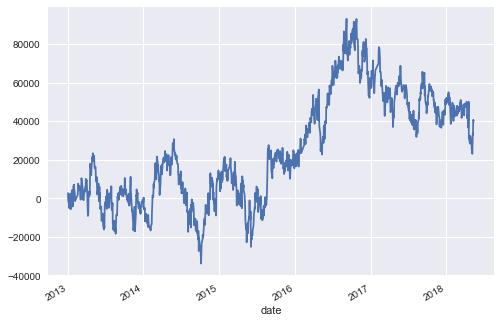

In [161]:
FOI['close'].plot()

# Investment Trust OI

In [162]:
IOI = load_txt('投信未平倉-日-成交價.txt',Taiwan50).drop(['volume'],axis = 1)

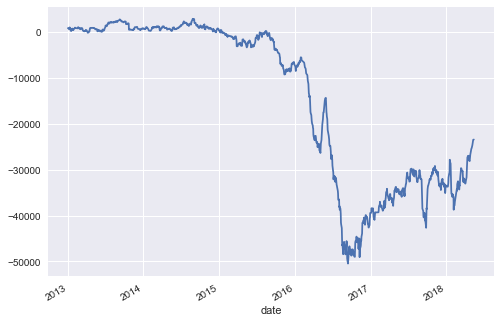

In [163]:
IOI['close'].plot()

# Dealer OI

In [164]:
DOI = load_txt('自營未平倉-日-成交價.txt',Taiwan50).drop(['volume'],axis = 1)

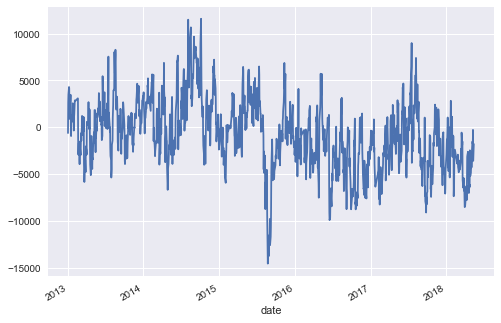

In [165]:
DOI['close'].plot()

# Orderbook data

In [166]:
orderbook_ = pd.read_hdf('twse_orderbook_comp.h5').rename(columns = {'時間':'date',
                                                                    '累積委託買進筆數':'ask_vol',
                                                                    '累積委託買進數量':'ask_count',
                                                                    '累積委託賣出筆數':'bid_vol',
                                                                    '累積委託賣出數量':'bid_count',
                                                                    '累積成交筆數':'vol',
                                                                    '累積成交數量':'count',
                                                                    '累積成交金額':'amount'})


orderbook = orderbook_[orderbook_.index==0].iloc[-1*Taiwan50.shape[0]-1:-1]
orderbook['date'] = Taiwan50.index.values
orderbook = orderbook.groupby('date').sum().drop(['vol','count','amount'],axis = 1)
orderbook.head()



,ask_vol,ask_count,bid_vol,bid_count
date,,,,
2013-01-02,124034,1693501,113997,721850
2013-01-03,115761,1721363,113227,709221
2013-01-04,119276,1827676,89216,561812
2013-01-07,116020,1759885,103484,666598
2013-01-08,118306,1809101,97434,579337


In [167]:
orderbook.tail()

,ask_vol,ask_count,bid_vol,bid_count
date,,,,
2018-05-21,423463,4225611,197285,1238490
2018-05-22,388051,3981349,203686,1273825
2018-05-23,353126,3978837,175522,1135260
2018-05-24,265981,3663708,196984,1190661
2018-05-25,362745,4095126,175289,1035834


# ETF data

In [168]:
def ETF_data_processing(filepath):
    ETFtable = pd.read_csv(filepath,encoding=' big5-hkscs ').rename(columns={'代碼':'code','日期':'date','中文簡稱':'name','開盤價(元)':'open','最高價(元)':'high','最低價(元)':'low','收盤價(元)':'close','成交張數(張)':'volume'})
   
    #processing data type 
    ETFtable['date'] = ETFtable['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y%m%d'))
#     ETFtable['week'] = ETFtable['date'].map(lambda x:x.isoweekday())
    ETFtable['close'] = ETFtable['close'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETFtable['open'] = ETFtable['open'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETFtable['high'] = ETFtable['high'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETFtable['low'] = ETFtable['low'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    ETFtable['volume'] = ETFtable['volume'].map(lambda x:x if (type(x)==float) else float(x.replace(',','')) )
    
    return ETFtable

In [169]:
ETFtable = ETF_data_processing('tetfp.csv')
ETFtable.head()

,code,date,name,open,high,low,close,volume
0,50,2013-01-02,元大台灣50,54.00,54.65,53.90,54.40,16487.0
1,50,2013-01-03,元大台灣50,54.90,55.05,54.65,54.85,29020.0
2,50,2013-01-04,元大台灣50,54.85,54.85,54.40,54.50,9837.0
3,50,2013-01-07,元大台灣50,54.55,54.55,53.90,54.25,8910.0
4,50,2013-01-08,元大台灣50,54.00,54.20,53.65,53.90,12507.0


## Target ETF Data

In [170]:
def extract_target_ETF(ETFtable,ETFcode,index_table,orderbook):
    ETF_target = ETFtable[ETFtable['code']==ETFcode].drop(['code','name'],axis = 1).groupby(['date']).sum()
    Combina_data = pd.concat([ETF_target,index_table,orderbook],axis = 1)
    
#     #caculate rise or fall
#     temp = []
#     for day,close in enumerate(ETF_target['close']):
#         if (day == 0):
#             temp.append(0)
#         else:
#             temp.append()
#     # move the target feature to the last column
#     t = ETF_target['close'].values
#     ETF_target.drop(['close'],axis=1,inplace = True)
#     ETF_target['close'] = t
    
    return ETF_target,Combina_data

In [171]:
Yunta50 , Combine_data = extract_target_ETF(ETFtable,50,Taiwan50,orderbook)
# Yunta50.drop(['Unnamed: 8'],axis = 1,inplace = True)
Yunta50.head()

,open,high,low,close,volume
date,,,,,
2013-01-02,54.00,54.65,53.90,54.40,16487.0
2013-01-03,54.90,55.05,54.65,54.85,29020.0
2013-01-04,54.85,54.85,54.40,54.50,9837.0
2013-01-07,54.55,54.55,53.90,54.25,8910.0
2013-01-08,54.00,54.20,53.65,53.90,12507.0


In [172]:
Combine_data.head()

,open,high,low,close,volume,i_open,i_high,i_low,i_close,i_volume,ask_vol,ask_count,bid_vol,bid_count
date,,,,,,,,,,,,,,
2013-01-02,54.00,54.65,53.90,54.40,16487.0,94.684852,96.551988,94.005632,96.233431,23918.3962,124034,1693501,113997,721850
2013-01-03,54.90,55.05,54.65,54.85,29020.0,96.772465,97.774109,96.002028,96.700293,29755.7235,115761,1721363,113227,709221
2013-01-04,54.85,54.85,54.40,54.50,9837.0,95.923933,96.701394,94.465837,95.679435,27253.8958,119276,1827676,89216,561812
2013-01-07,54.55,54.55,53.90,54.25,8910.0,95.366814,95.490941,92.904071,93.766549,25203.1961,116020,1759885,103484,666598
2013-01-08,54.00,54.20,53.65,53.90,12507.0,93.298728,93.838110,92.366784,93.389683,20860.6399,118306,1809101,97434,579337


# Ratio data

In [173]:
def get_change_rate(stock,back_day = 1):
    amount_of_features = stock.columns.shape[0]
    for back in range(back_day+1):
        if(back == 0):
            stock_rate = (stock - stock.shift(back+1).fillna(0))/stock
            stock_temp = stock_rate.copy()
        else:
            stock_shift = stock_temp.shift(back).fillna(0)
            
            #rename columns
            column_names = list(stock_temp.columns)
            dict_ = {}
            for column_name in column_names:
                dict_[column_name] = column_name+f'_{back}'
                
            stock_shift = stock_shift.rename(columns = dict_)
            
            stock_rate = pd.concat([stock_rate,stock_shift],axis = 1)
    return stock_rate[back_day+1:]

def get_backday(stock,backday = 1):
    amount_of_features = stock.columns.shape[0]
    for back in range(backday+1):
        if (back == 0):
            stock_rate = stock.copy()
            stock_temp = stock.copy()
        else:
            stock_shift = stock_temp.shift(back)
            
            #rename columns
            column_names = list(stock_temp.columns)
            dict_ = {}
            for column_name in column_names:
                dict_[column_name] = column_name+f'_{back}'
                
            stock_shift = stock_shift.rename(columns = dict_)
            
            stock_rate = pd.concat([stock_rate,stock_shift],axis = 1)
    return stock_rate[backday+1:]

In [174]:
get_backday(pcr,5).head()

,high,close,high_1,close_1,high_2,close_2,high_3,close_3,high_4,close_4,high_5,close_5
date,,,,,,,,,,,,
2013-01-10,12.24,12.24,7.40,7.40,2.37,2.37,7.12,7.12,10.68,10.68,13.14,13.14
2013-01-11,12.00,12.00,12.24,12.24,7.40,7.40,2.37,2.37,7.12,7.12,10.68,10.68
2013-01-14,12.49,12.49,12.00,12.00,12.24,12.24,7.40,7.40,2.37,2.37,7.12,7.12
2013-01-15,6.82,6.82,12.49,12.49,12.00,12.00,12.24,12.24,7.40,7.40,2.37,2.37
2013-01-16,2.75,2.75,6.82,6.82,12.49,12.49,12.00,12.00,12.24,12.24,7.40,7.40


### One decision:start from mean or start from zero

In [175]:
def isnoise(rate,describe,interval):
    if (rate <= 0+describe[2]*interval and rate >= 0-describe[2]*interval):
        return 1
    else :
        return 0
    
def isrise(rate,describe,interval):
    if (rate > 0+describe[2]*interval):
        return 1
    else :
        return 0
    
def isfall(rate,describe,interval):
    if(rate < 0-describe[2]*interval):
        return 1
    else :
        return 0 
    
def sign(x):
    if (x > 0):
        return 1
    elif(x < 0):
        return -1
    else:
        return 0

def get_rise_fall(df,interval):
    df_rise_fall_d = df['close'].describe()
    
    rise = []
    fall = []
    noise = []
    
    df_rf = pd.DataFrame(index=df.index)
    for day in range(df.shape[0]):
        rise.append(isrise(df['close'][day],df_rise_fall_d,interval))
        fall.append(isfall(df['close'][day],df_rise_fall_d,interval))
        noise.append(isnoise(df['close'][day],df_rise_fall_d,interval))

    df_rf['isrise'] = rise
    df_rf['isfall'] = fall
    df_rf['isnoise'] = noise
    return df_rf


In [176]:
Yunta50_rate = get_change_rate(Yunta50)

In [177]:
t = get_rise_fall(Yunta50_rate,0.5)
t.head()

,isrise,isfall,isnoise
date,,,
2013-01-04,0,1,0
2013-01-07,0,1,0
2013-01-08,0,1,0
2013-01-09,0,0,1
2013-01-10,1,0,0


In [178]:
print('isrise rate:',t['isrise'].sum()/t.shape[0])
print('isfall rate:',t['isfall'].sum()/t.shape[0])
print('isnoise rate:',t['isnoise'].sum()/t.shape[0])

isrise rate: 0.2765151515151515
isfall rate: 0.24242424242424243
isnoise rate: 0.4810606060606061


# Combine with TXF Taiwan50 Yunta50

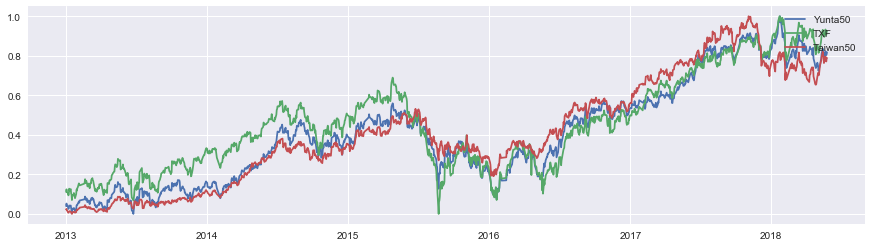

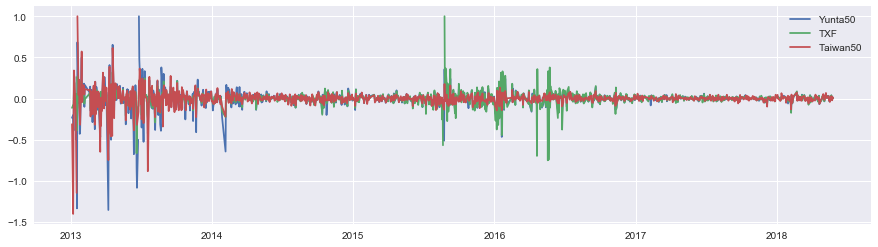

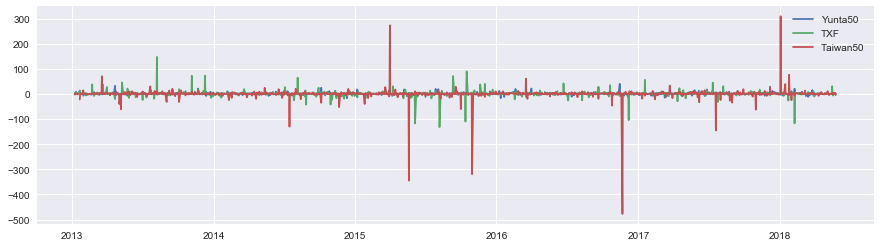

In [179]:
def normalize_data(df,columnname):
    min_max_scaler = preprocessing.MinMaxScaler()
    df_N = df.copy()
    
    df_N[columnname] = min_max_scaler.fit_transform(df_N[columnname].values.reshape(-1,1))
    
    return df_N 

Taiwan50_N = normalize_data(Taiwan50,'i_close')#.loc[TXF.index]
Yunta50_N = normalize_data(Yunta50,'close')#.loc[TXF.index]
TXF_N = normalize_data(TXF,'close')

Taiwan50_N_1 = get_change_rate(Taiwan50_N)
Yunta50_N_1 = get_change_rate(Yunta50_N)
TXF_N_1 = get_change_rate(TXF_N)

Taiwan50_N_2 = get_change_rate(Taiwan50_N_1)
Yunta50_N_2 = get_change_rate(Yunta50_N_1)
TXF_N_2 = get_change_rate(TXF_N_1)

plt.figure(figsize=(15,4))
plt.plot(Yunta50_N.index,Yunta50_N['close'],label='Yunta50')
plt.plot(TXF_N.index,TXF_N['close'],label='TXF')
plt.plot(Taiwan50_N.index,Taiwan50_N['i_close'],label = 'Taiwan50')
plt.legend(loc = 'upper right')
plt.show()

plt.figure(figsize=(15,4))
plt.plot(Yunta50_N_1.index,Yunta50_N_1['close'],label='Yunta50')
plt.plot(TXF_N_1.index,TXF_N_1['close'],label='TXF')
plt.plot(Taiwan50_N_1.index,Taiwan50_N_1['i_close'],label = 'Taiwan50')
plt.legend(loc = 'upper right')
plt.show()

plt.figure(figsize=(15,4))
plt.plot(Yunta50_N_2.index,Yunta50_N_2['close'],label='Yunta50')
plt.plot(TXF_N_2.index,TXF_N_2['close'],label='TXF')
plt.plot(Taiwan50_N_2.index,Taiwan50_N_2['i_close'],label = 'Taiwan50')
plt.legend(loc = 'upper right')
plt.show()

# Oil price


In [180]:
oil_price = pd.read_excel('oil_price.xls').rename(columns = {'FRED Graph Observations':'date','Unnamed: 1':'five_year'}).set_index('date').loc[Taiwan50.index[0]:]


# oil_price['date'] = oil_price['date'].map(lambda x:dt.datetime.strptime(str(x),'%Y/%m/%d'))

# oil_price = oil_price.set_index('date')

In [181]:
oil_price.tail()

,five_year
date,
2018-05-15 00:00:00,71.34
2018-05-16 00:00:00,71.43
2018-05-17 00:00:00,71.47
2018-05-18 00:00:00,71.23
2018-05-21 00:00:00,72.26


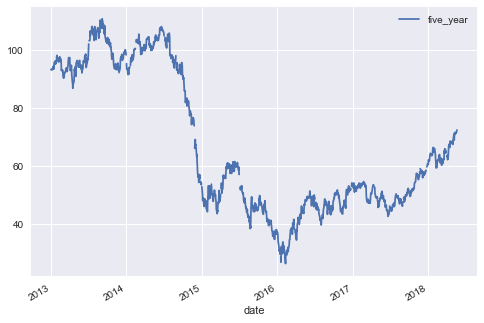

In [182]:
oil_price.loc[Taiwan50.index[0]:Taiwan50.index[-1]].plot()

# Bond price

In [183]:
fiveyear_bond = pd.read_excel('five_year_bond.xls').rename(columns = {'FRED Graph Observations':'date','Unnamed: 1':'five_year'}).set_index('date').loc[Taiwan50.index[0]:]
tenyear_bond = pd.read_excel('ten_year_bond.xls').rename(columns = {'FRED Graph Observations':'date','Unnamed: 1':'ten_year'}).set_index('date').loc[Taiwan50.index[0]:]
bond = pd.concat([fiveyear_bond,tenyear_bond],axis = 1).loc[Taiwan50.index[0]:].rename(columns = {'DGS5':'DGSfive'
                                                                                                                    ,'DGS10':'DGSten'})

In [184]:
bond.tail()

,five_year,ten_year
date,,
2018-05-21 00:00:00,2.898,3.065
2018-05-22 00:00:00,2.899,3.065
2018-05-23 00:00:00,2.83,3.003
2018-05-24 00:00:00,2.816,2.981
2018-05-25 00:00:00,2.764,2.931


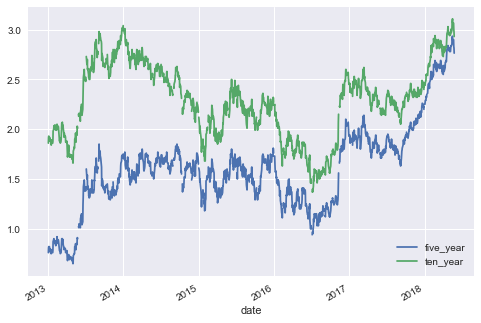

In [185]:
bond.plot()

In [186]:
bond.tail()

,five_year,ten_year
date,,
2018-05-21 00:00:00,2.898,3.065
2018-05-22 00:00:00,2.899,3.065
2018-05-23 00:00:00,2.83,3.003
2018-05-24 00:00:00,2.816,2.981
2018-05-25 00:00:00,2.764,2.931


# Inflation rate

In [187]:
inf = pd.read_excel('inflation_rate.xlsx')

In [188]:
inf.head()

,Year,jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec,ann
0,1990,0.05202,0.05263,0.05233,0.04712,0.04362,0.04674,0.04823,0.05618,0.06160,0.06290,0.06275,0.06106,0.05403
1,1991,0.05651,0.05313,0.04895,0.04888,0.04954,0.04696,0.04448,0.03799,0.03391,0.02921,0.02990,0.03064,0.04208
2,1992,0.02600,0.02819,0.03185,0.03180,0.03024,0.03088,0.03157,0.03148,0.02988,0.03202,0.03048,0.02901,0.03010
3,1993,0.03259,0.03247,0.03087,0.03226,0.03221,0.02996,0.02776,0.02768,0.02689,0.02750,0.02676,0.02748,0.02994
4,1994,0.02525,0.02516,0.02507,0.02361,0.02288,0.02493,0.02770,0.02901,0.02963,0.02608,0.02675,0.02675,0.02561


# Distribution of features

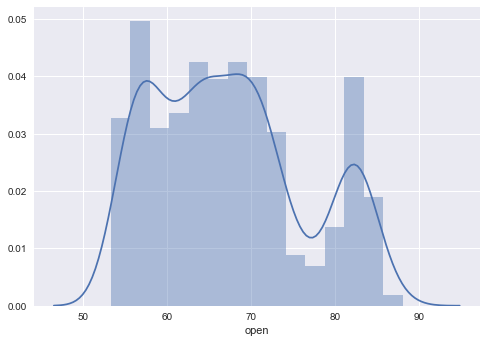

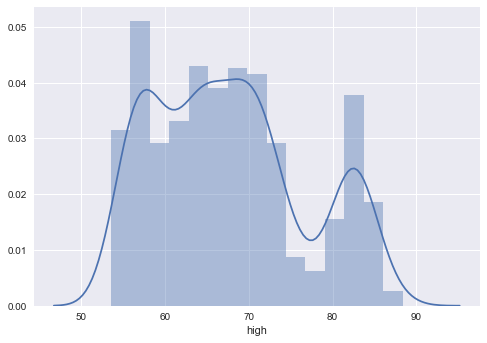

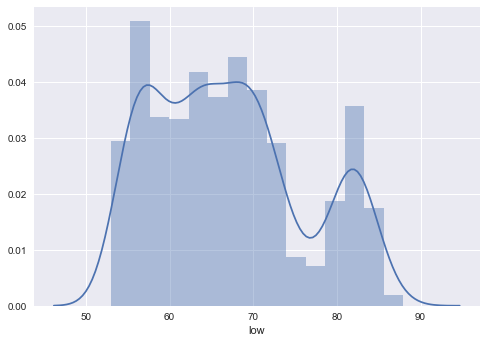

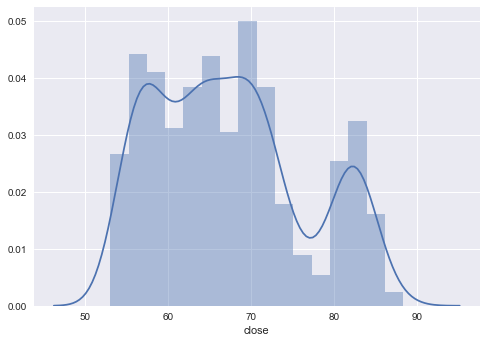

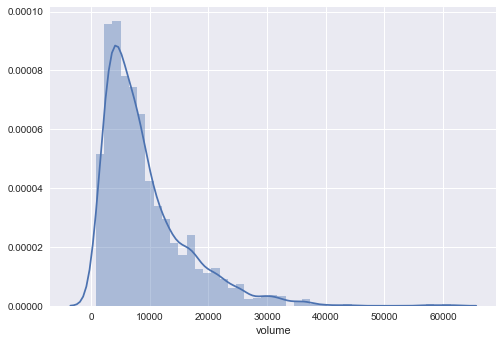

...

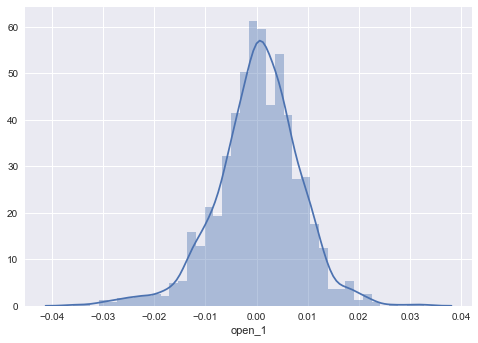

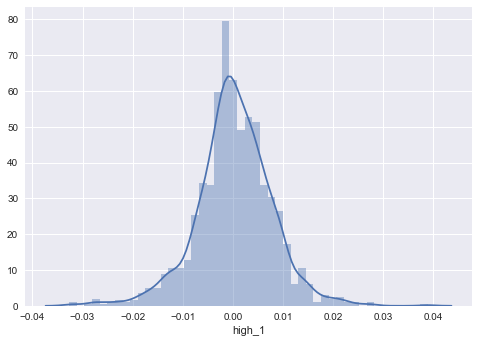

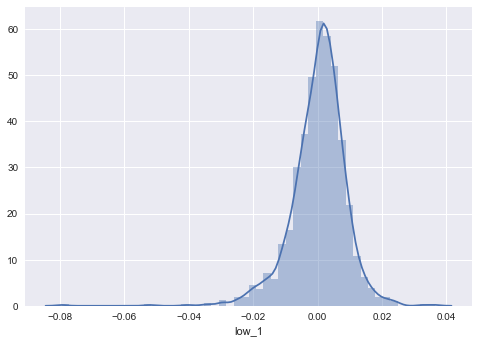

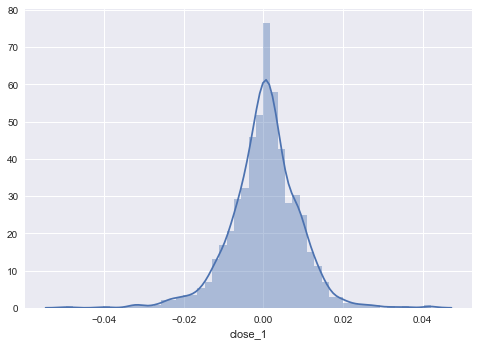

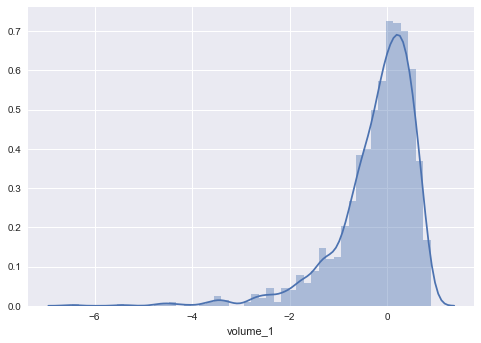

In [189]:
for columnname in Yunta50.columns:
    sns.distplot(Yunta50[columnname])
    plt.show()
for columnname in Yunta50_rate.columns:
    sns.distplot(Yunta50_rate[columnname])
    plt.show()


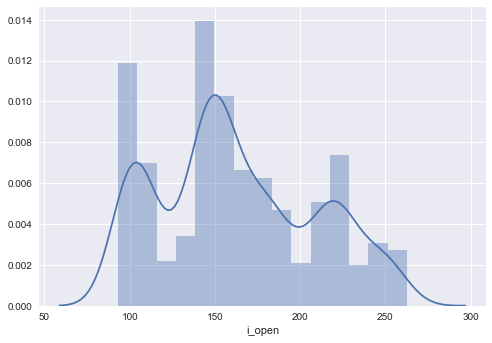

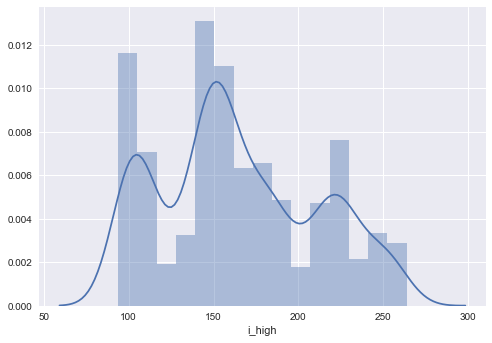

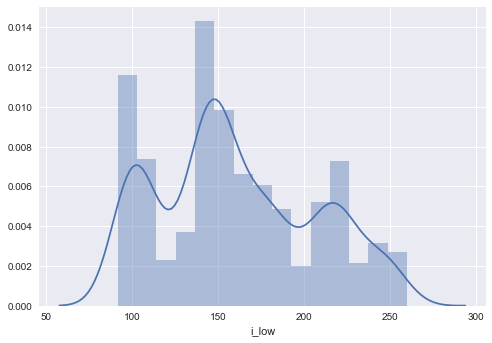

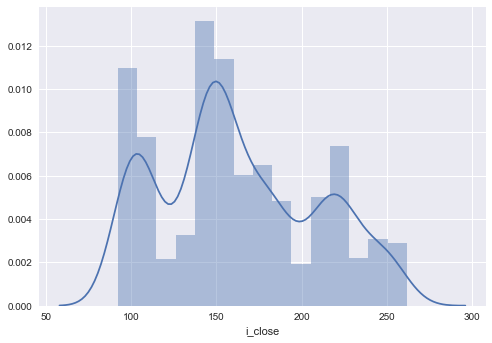

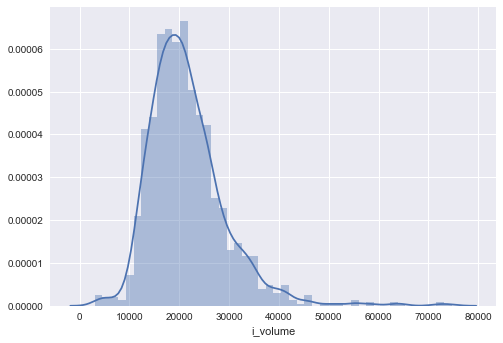

In [190]:
for columnname in Taiwan50.columns:
    sns.distplot(Taiwan50[columnname])
    plt.show()
# for columnname in Taiwan50_rate.columns:
#     sns.distplot(Taiwan50_rate[columnname])
#     plt.show()

### Some conclusion of distrition
1. We need to do some adjustment for volume and low to the normal distribution data.
2. Taiwan50_rate data is noiseless than Yunta50_rate


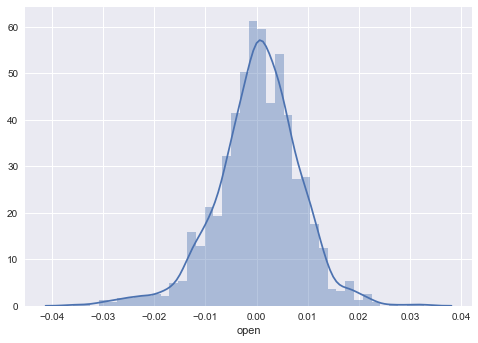

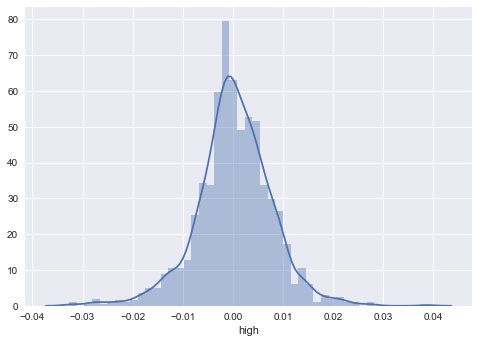

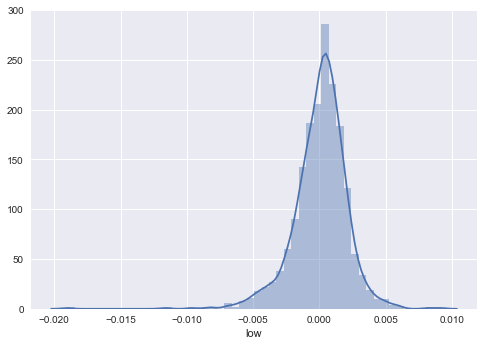

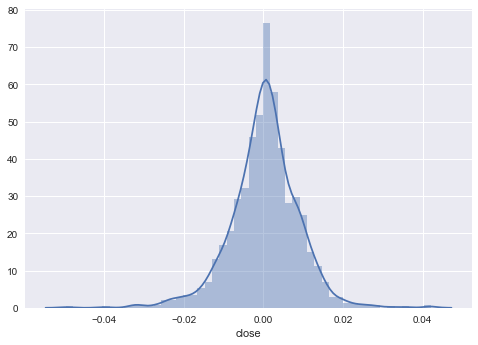

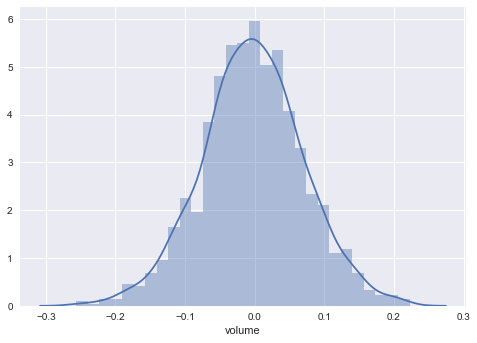

...

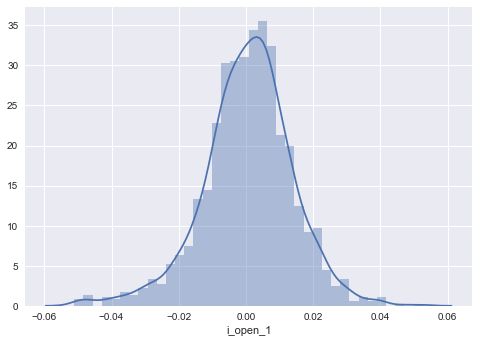

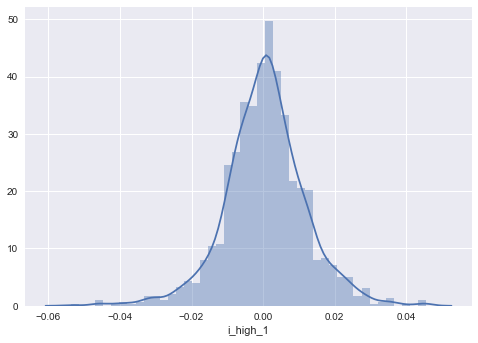

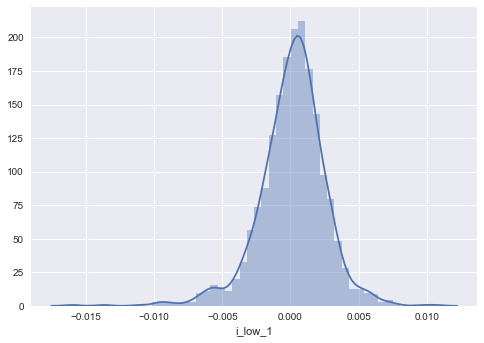

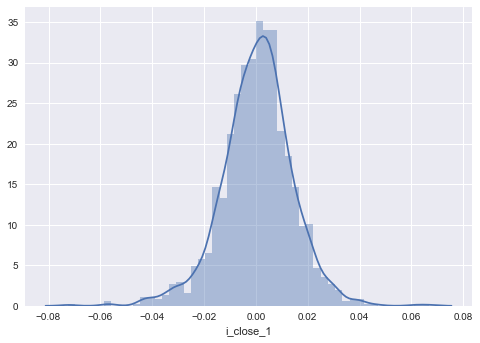

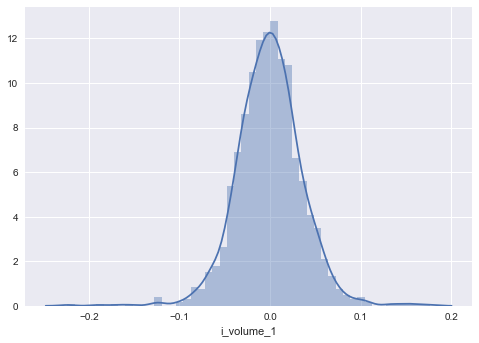

In [191]:
# adjustment
Yunta50['volume'] = list(map(math.log,Yunta50['volume']))
Yunta50['low'] = list(map(math.log,Yunta50['low']))
Taiwan50['i_volume'] = list(map(math.log,Taiwan50['i_volume']))
Taiwan50['i_low'] = list(map(math.log,Taiwan50['i_low']))
Yunta50_rate = get_change_rate(Yunta50,1)
get_rise_fall(Yunta50_rate,0.5)
Taiwan50_rate = get_change_rate(Taiwan50,1)

# just see the ratio data
for columnname in Yunta50_rate.columns:
    sns.distplot(Yunta50_rate[columnname])
    plt.show()

for columnname in Taiwan50_rate.columns:
    sns.distplot(Taiwan50_rate[columnname])
    plt.show()  

# low has some outlier

# Boxplot of rise_fall

In [192]:
# for columnname in Yunta50_rate.columns:
#     sns.boxplot(x = 't_rise_fall',y = columnname,data = Yunta50_rate)
#     sns.stripplot(x = 't_rise_fall',y = columnname,data = Yunta50_rate,jitter=True,edgecolor="gray")
#     plt.show()
# for columnname in Yunta50_rate.columns:
#     sns.boxplot(x = 'rise_fall',y = columnname,data = Yunta50_rate)
#     sns.stripplot(x = 'rise_fall',y = columnname,data = Yunta50_rate,jitter=True,edgecolor="gray")
#     plt.show()
# for columnname in Yunta50_rate.columns:
#     sns.boxplot(x = 'close_ca',y = columnname,data = Yunta50_rate)
#     sns.stripplot(x = 'close_ca',y = columnname,data = Yunta50_rate,jitter=True,edgecolor="gray")
#     plt.show()

In [193]:
# for columnname in Taiwan50_rate.columns:
#     sns.boxplot(x = 'it_rise_fall',y = columnname,data = Taiwan50_rate)
#     sns.stripplot(x = 'it_rise_fall',y = columnname,data = Taiwan50_rate,jitter=True,edgecolor="gray")
#     plt.show()
# for columnname in Taiwan50_rate.columns:
#     sns.boxplot(x = 'i_rise_fall',y = columnname,data = Taiwan50_rate)
#     sns.stripplot(x = 'i_rise_fall',y = columnname,data = Taiwan50_rate,jitter=True,edgecolor="gray")
#     plt.show()


### Some conclusion of Bloxplot
1. open data doesn't tell the rise_fall clearly
2. low , high , close have tendency with risr_fall data
3. volume extreme data can help us tell it_rise_fall , but not help us for i_rise_fall
4. Taiwan50_rate is better than Yunta50_rate 

### Use 20 day mean for checking whether rise or fall
- mean_20day 
- mean_20day_diff : the difference of mean_20day
- mean_rise_fall :
use the recent 5 mean_20day_diff to indicate 'rise' or 'fall'(if the probability of the positive mean_20day_diff is higher, make it 'rise')

In [194]:
#include today data
mean_20day = Yunta50['close'].rolling(window = 20).mean()
mean_20day_diff = ((mean_20day - mean_20day.shift(1) )/mean_20day.shift(1))*100.0

In [195]:
def get_mean_rate_plot(mean_20day_diff,day,window,mean_20day):
    if(day-window < 20):
        return mean_20day_diff[0]
    data = mean_20day_diff[day - window : day]
    rise = sum(data > 0)
    rate = rise/(window*1.0)
    if (rate > 0.5 ):
        return mean_20day[day]+1
    else :
        return mean_20day[day] -1
    
def get_mean_rate(mean_20day_diff,day,window,mean_20day):
    if(day-window < 20):
        return mean_20day_diff[0]
    data = mean_20day_diff[day - window : day] # not include today
    rise = sum(data > 0)
    rate = rise/(window*1.0)
    if (rate > 0.5 ):
        return 1
    else :
        return -1
    
def get_mean_rf(stock,columnname,window,days):
    mean_20day = stock[columnname].rolling(window = window).mean()
    mean_20day_diff = ((mean_20day - mean_20day.shift(1) )/mean_20day.shift(1))*100.0
    mean_rise_fall = []
    for day in range(mean_20day_diff.shape[0]):
        mean_rise_fall.append(get_mean_rate(mean_20day_diff,day,days,mean_20day))
    return np.array(mean_rise_fall)

In [196]:
mean_rise_fall_plot = []
for day in range(mean_20day_diff.shape[0]):
    mean_rise_fall_plot.append(get_mean_rate_plot(mean_20day_diff,day,5,mean_20day))

mean_rise_fall = []
for day in range(mean_20day_diff.shape[0]):
    mean_rise_fall.append(get_mean_rate(mean_20day_diff,day,5,mean_20day))
        


In [197]:
def visualization_close(day):
    plt.figure(figsize=(15,8))
    plt.plot(Yunta50.index[:day],Yunta50['close'][:day],mean_20day[:day])
    plt.scatter(Yunta50.index[:day],mean_rise_fall_plot[:day],color = 'k',s = 10)
    plt.show()

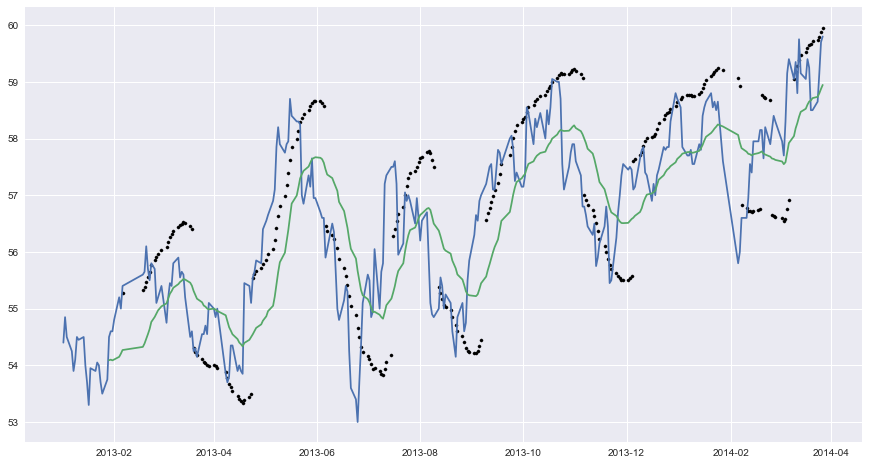

In [198]:
visualization_close(300)

# Current data
major:
1. Yuanta50
2. Taiwan50
3. orderbook (day orderbook data for INDEX)
5. oil_price
6. bond(fiveyear + ten year)
7. TXF
8. EXF
9. FXF
10. Nikkei
11. SP(S&P 500)
12. DJ(Dow Jones)
13. Russel
14. VIX
15. pcr(put call ratio)
16. FOI(foreign investor OI)
17. IOI(Investment Trust OI)
18. DOI(Dealer OI) 
19. inf(infaltion rate)
20. SOX
21. E_F

minor:
1. df_rf ( Yunata50 rise fall )
2. mrf (use 20day_mean to indicate rise or fall) 

## Statistics for the recent 5 day and the label

In [31]:
from data_processing import *

In [200]:
#parameter
interval = 0.5

# target
df_rf = get_rise_fall(Yunta50_rate,interval)

#feature


Yunta50_5 = get_change_rate(Yunta50,5).iloc[:,Yunta50.shape[1]:]
# Taiwan50_5 = get_change_rate(Taiwan50,5).iloc[:,Taiwan50.shape[1]:]
# orderbook_5 = get_change_rate(orderbook,5).iloc[:,orderbook.shape[1]:]
# oil_price_5 = get_change_rate(oil_price,5)
# bond_5 = get_change_rate(bond,5).iloc[:,bond.shape[1]:]
# TXF_5 = get_change_rate(TXF,5).iloc[:,TXF.shape[1]:]
# EXF_5 = get_change_rate(EXF,5).iloc[:,EXF.shape[1]:]
# FXF_5 = get_change_rate(FXF,5).iloc[:,FXF.shape[1]:]
# Nikkei_5 = get_change_rate(Nikkei,5).iloc[:,Nikkei.shape[1]:]
# SP_5 = get_change_rate(SP,5).iloc[:,SP.shape[1]:]
# Russell_5 = get_change_rate(Russell,5).iloc[:,Russell.shape[1]:]
# DJ_5 = get_change_rate(DJ,5).iloc[:,DJ.shape[1]:]
# VIX_5 = get_change_rate(VIX,5).iloc[:,VIX.shape[1]:]
# pcr_5 = get_change_rate(pcr,5).iloc[:,pcr.shape[1]:]
# FOI_5 = get_change_rate(FOI,5).iloc[:,FOI.shape[1]:]
# IOI_5 = get_change_rate(IOI,5).iloc[:,IOI.shape[1]:]
# DOI_5 = get_change_rate(DOI,5).iloc[:,DOI.shape[1]:]

#display
Yunta50_5.head()

,open_1,high_1,low_1,close_1,volume_1,open_2,high_2,low_2,close_2,volume_2,...,open_4,high_4,low_4,close_4,volume_4,open_5,high_5,low_5,close_5,volume_5
date,,,,,,,,,,,,,,,,,,,,,
2013-01-10,-0.004651,0.001842,0.000467,0.003697,-0.056856,-0.010185,-0.006458,-0.001167,-0.006494,0.035946,...,-0.000912,-0.003646,-0.001147,-0.006422,-0.117669,0.016393,0.007266,0.003454,0.008204,0.055024
2013-01-11,0.010129,0.006404,0.001857,0.007339,0.064645,-0.004651,0.001842,0.000467,0.003697,-0.056856,...,-0.005500,-0.005500,-0.002316,-0.004608,-0.010883,-0.000912,-0.003646,-0.001147,-0.006422,-0.117669
2013-01-14,0.007313,0.002737,0.000923,-0.000918,-0.017535,0.010129,0.006404,0.001857,0.007339,0.064645,...,-0.010185,-0.006458,-0.001167,-0.006494,0.035946,-0.005500,-0.005500,-0.002316,-0.004608,-0.010883
2013-01-15,-0.012963,-0.005505,-0.002552,0.000917,-0.054629,0.007313,0.002737,0.000923,-0.000918,-0.017535,...,-0.004651,0.001842,0.000467,0.003697,-0.056856,-0.010185,-0.006458,-0.001167,-0.006494,0.035946
2013-01-16,0.003690,-0.000918,0.000466,-0.009259,-0.011024,-0.012963,-0.005505,-0.002552,0.000917,-0.054629,...,0.010129,0.006404,0.001857,0.007339,0.064645,-0.004651,0.001842,0.000467,0.003697,-0.056856


#### Get category of features of each day and average fiveday

In [201]:
def category(stock_column,ca ):
    category = pd.qcut(stock_column.rank(method='first'),ca,labels = [_+1 for _ in range(ca)]).astype(np.float64)
    return category

def get_ca(stock,rf_df,ca ):
    stock_ca = stock.copy().astype(np.float64)
    for columnname in stock_ca.columns:
        stock_ca[columnname] = category(stock_ca[columnname] , ca)
        
    stock_ca = pd.concat([stock_ca,rf_df.loc[stock_ca.index[0]:stock_ca.index[-1]]],axis = 1).dropna(axis = 0,how = 'any')
    
    return stock_ca

# rfdata 表示isnrise isfall isnoise的來源
def get_av_ca(stock,rf_df,window,ca):
    amount_of_features = int(stock.columns.shape[0] / window)
    stock_av = stock.iloc[:,:amount_of_features].copy()
    for index,columnname in enumerate(stock_av.columns):
        for backday in range(window-1):
            stock_av[columnname] += stock[columnname.replace(columnname[-1],f'{backday+2}')]
        stock_av[columnname] /= amount_of_features
        stock_av[columnname] = category(stock_av[columnname],ca)
    
    stock_av = pd.concat([stock_av,rf_df.loc[stock_av.index[0]:stock_av.index[-1]]],axis = 1).dropna(axis = 0,how = 'any')
    
    return stock_av


In [202]:
window = 5
ca = 4
Yunta50_ca = get_ca(Yunta50_5,df_rf,ca)
Yunta50_av = get_av_ca(Yunta50_5,df_rf,window,ca)

# Taiwan50_ca = get_ca(Taiwan50_5,df_rf)
# Taiwan50_av = get_av_ca(Taiwan50_5,df_rf,window)

# orderbook_ca = get_ca(orderbook_5,df_rf)
# orderbook_av = get_av_ca(orderbook_5,df_rf,window)

# bond_ca = get_ca(bond_5,df_rf)
# bond_av = get_av_ca(bond_5,df_rf,window)

In [203]:
Yunta50_ca.head()

,open_1,high_1,low_1,close_1,volume_1,open_2,high_2,low_2,close_2,volume_2,...,close_4,volume_4,open_5,high_5,low_5,close_5,volume_5,isrise,isfall,isnoise
date,,,,,,,,,,,,,,,,,,,,,
2013-01-10,1.0,3.0,3.0,3.0,1.0,1.0,1.0,1.0,1.0,3.0,...,1.0,1.0,4.0,4.0,4.0,4.0,4.0,1,0,0
2013-01-11,4.0,4.0,4.0,4.0,4.0,1.0,3.0,3.0,3.0,1.0,...,1.0,2.0,2.0,1.0,1.0,1.0,1.0,0,0,1
2013-01-14,4.0,3.0,3.0,2.0,2.0,4.0,4.0,4.0,4.0,4.0,...,1.0,3.0,1.0,1.0,1.0,1.0,2.0,0,0,1
2013-01-15,1.0,1.0,1.0,3.0,1.0,4.0,3.0,3.0,2.0,2.0,...,3.0,1.0,1.0,1.0,1.0,1.0,3.0,0,1,0
2013-01-16,3.0,2.0,3.0,1.0,2.0,1.0,1.0,1.0,3.0,1.0,...,4.0,4.0,1.0,3.0,3.0,3.0,1.0,0,1,0


#### Noise rate

In [204]:
Yunta50_av[['isrise']].sum()/Yunta50_av.shape[0]

isrise    0.277356
dtype: float64

In [205]:
Yunta50_av[['isfall']].sum()/Yunta50_av.shape[0]

isfall    0.240881
dtype: float64

In [206]:
Yunta50_av[['isnoise']].sum()/Yunta50_av.shape[0]

isnoise    0.481763
dtype: float64

In [207]:
df_rf[['isnoise']].sum()/df_rf.shape[0]

isnoise    0.481061
dtype: float64

## Function for Statistic table

In [224]:
pcr_rate.head()

,high_1,close_1
date,,
2007-01-04,14.96,14.96
2007-01-05,11.75,11.75
2007-01-08,8.12,8.12
2007-01-09,4.39,4.39
2007-01-10,0.00,-4.10


In [205]:
aaa = get_av_ca(pcr_rate,df_rf,ca = 4,window=1)
bbb = get_ca(pcr_rate,df_rf,ca = 4)
# aaa['high'][aaa['high'] == 1]

In [262]:
df1 =get_all_stable_(df_list,df_name,df_option,mrf,0,Yunta50_rate,1,ca = 4,one = True,everyday = False,two = False,day = 1)

Noise rate is 5.606060606060606


In [263]:
df1[-3]

[                  isfall   isnoise     isrise        r_f     abs_rf
 feature level                                                      
 open_1  1.0    38.938053  5.604720  55.457227  16.519174  16.519174
         2.0    46.579805  6.840391  46.579805   0.000000   0.000000
         3.0    45.454545  3.703704  50.841751   5.387205   5.387205
         4.0    49.085366  5.182927  45.731707  -3.353659   3.353659
 high_1  1.0    34.417344  4.607046  60.975610  26.558266  26.558266
         2.0    42.446043  4.676259  52.877698  10.431655  10.431655
         3.0    44.014085  8.450704  47.535211   3.521127   3.521127
         4.0    59.117647  4.117647  36.764706 -22.352941  22.352941
 low_1   1.0    31.610942  5.167173  63.221884  31.610942  31.610942
         2.0    48.024316  6.686930  45.288754  -2.735562   2.735562
         3.0    48.148148  4.040404  47.811448  -0.336700   0.336700
         4.0    52.531646  5.379747  42.088608 -10.443038  10.443038
 close_1 1.0    28.254848  4.70914

In [264]:
df_rf = get_rise_fall(Yunta50_rate,0).shift(-3)
orderbook_rate = get_change_rate(features[0],30).iloc[:,features[0].shape[1]:]
pcr_rate = get_backday(features[-2],1).iloc[:,features[-2].shape[1]:]
NAS_rate = get_change_rate(NAS,1).iloc[:,NAS.shape[1]:]
SP_rate = get_change_rate(features[-3],1).iloc[:,features[-3].shape[1]:]

In [260]:
col = aa.columns
i = 0
pd.concat([aa.iloc[:,[i,-3]].groupby(col[i]).sum(),
          aa.iloc[:,[i,-2]].groupby(col[i]).sum(),
          aa.iloc[:,[i,-1]].groupby(col[i]).sum(),],axis = 1)

,isrise,isfall,isnoise
open_1,,,
1.0,145.0,115.0,13.0
2.0,183.0,136.0,18.0
3.0,165.0,166.0,19.0
4.0,152.0,135.0,21.0


In [265]:
aa = get_av_ca(SP_rate,df_rf,ca = 4,window = 1)
get_stable(aa)

isfall   isnoise     isrise        r_f     abs_rf
feature level                                                      
open_1  1.0    44.378698  5.917160  49.704142   5.325444   5.325444
        2.0    39.739414  6.514658  53.745928  14.006515  14.006515
        3.0    46.283784  5.067568  48.648649   2.364865   2.364865
        4.0    43.730887  4.892966  51.376147   7.645260   7.645260
high_1  1.0    40.921409  7.588076  51.490515  10.569106  10.569106
        2.0    43.115942  5.072464  51.811594   8.695652   8.695652
        3.0    44.014085  5.281690  50.704225   6.690141   6.690141
        4.0    46.312684  4.129794  49.557522   3.244838   3.244838
low_1   1.0    41.641337  7.902736  50.455927   8.814590   8.814590
        2.0    45.121951  4.878049  50.000000   4.878049   4.878049
        3.0    45.423729  6.101695  48.474576   3.050847   3.050847
        4.0    42.088608  3.481013  54.430380  12.341772  12.341772
close_1 1.0    43.611111  6.111111  50.277778   6.666667   6.666667
        2.0    43.772242  7.117438  49.110320   5.338078   5.338078
        3.0    38.965517  6.206897  54.827586  15.862069  15.862069
        4.0    47.181009  3.264095  49.554896   2.373887   2.373887

In [32]:
def get_stable(stock):
    stock_s = pd.DataFrame()
    first = stock.columns[0]
    df1=stock.iloc[:,[0,-3]].groupby(first).sum()
    df2=stock.iloc[:,[0,-2]].groupby(first).sum()
    df3=stock.iloc[:,[0,-1]].groupby(first).sum()
    close = pd.concat([df1,df2,df3],axis = 1)
    stock_s = pd.concat([stock_s,close],keys = ['',first],names=['feature','level'])

    for columnname in stock.columns[1:-3]:
        temp = pd.DataFrame()
        dfr=stock[[columnname,'isrise']].groupby(columnname).sum()
        dff=stock[[columnname,'isfall']].groupby(columnname).sum()
        dfn=stock[[columnname,'isnoise']].groupby(columnname).sum()
        df = pd.concat([dfr,dff,dfn],axis = 1)
        temp = pd.concat([temp,df],keys = ['',columnname],names=['feature','level'])
        stock_s = pd.concat([stock_s,temp])
        
    for row in range(stock_s.shape[0]):
        stock_s.iloc[row] /= stock_s.iloc[row].sum()/100
    
    
    stock_s['r_f'] = (stock_s['isrise'] - stock_s['isfall'] )
    stock_s['abs_rf'] = abs(stock_s['r_f'])
    return stock_s

In [33]:
def plot_rf(stock,name,range_):
    plt.figure(figsize=(15,8))
    plt.title(name)

    colors = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
    patch_list = []
    for index,color in enumerate(colors):
        patch_list.append(mpatches.Patch(color = color,label = f'{index+1}'))
    stock['r_f'].plot(kind = 'bar',colors = colors[:stock.index.levels[1].shape[0]]*stock.index.levels[0].shape[0])
    plt.ylim((-1*range_,range_))
    plt.legend(handles = patch_list[:stock.index.levels[1].shape[0]])
    plt.show()

In [52]:
def plot_rf_(stock,name,range_):
    plt.figure(figsize=(15,8))
    plt.title(name)

    colors = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple', 'tab:brown', 'tab:pink', 'tab:gray', 'tab:olive', 'tab:cyan']
    patch_list = []
    for index,color in enumerate(colors):
        patch_list.append(mpatches.Patch(color = color,label = f'{index+1}'))
    stock.plot(kind = 'bar',colors = colors[:stock.index.levels[1].shape[0]]*stock.index.levels[0].shape[0])
    plt.ylim((-1*range_,range_))
    plt.legend(handles = patch_list[:stock.index.levels[1].shape[0]])
    plt.show()

In [51]:
# mrf = pd.DataFrame(data=mean_rise_fall,index=mean_20day_diff.index,columns = ['mean_rise_fall'])

def get_stable_ud(stock,mrf):
    labelname = mrf.columns[0]
    stock_m = pd.concat([stock,mrf],axis = 1).dropna(axis = 0,how = 'any')

    stock_u = stock_m[stock_m[labelname ] == 1].drop([labelname],axis = 1)
    stock_d = stock_m[stock_m[labelname ] == -1].drop([labelname],axis = 1)
    stock_u_s = get_stable(stock_u)
    stock_d_s = get_stable(stock_d)
    stock_com = pd.concat([stock_u_s,stock_d_s],axis = 0,keys = ['rise','fall'],names = ['status'])

    return stock_com
#可直接將feature rename 使畫圖方便

def plot_rf_2(stock,name,range_):
    stock.unstack(level = 0)['r_f'].plot(kind='bar', subplots=True,figsize=(15,8),ylim=((-1*range_,range_)),title = name)
    plt.show()

In [36]:
def get_all_stable(df_list,df_name,df_rate,df_mix,interval,target,window,ca=4,one = True,everyday = False,two = False,day = 1):
    df_rf = get_rise_fall(target,interval).shift(-1*day+1)
    noise_rate = (df_rf['isnoise'].sum()/df_rf.shape[0])*100
    range_ = (100 - noise_rate)//3
    
    print('Noise rate is',noise_rate)
    df_return = []

    for index,df in enumerate(df_list):
        df_kind = []
        if(df_rate[index]):
            df_5 = get_change_rate(df,window).iloc[:,df.shape[1]:]
        else:
            df_5 = get_backday(df,window).iloc[:,df.shape[1]:]
#         df_ca = get_ca(df_5,df_rf,ca)
        df_av = get_av_ca(df_5,df_rf,window,ca)
        df_av_s = get_stable(df_av)
#         df_ca_s = get_stable(df_ca)
#         df_av_ud_s = get_stable_ud(df_av,df_mix)
#         df_ca_ud_s = get_stable_ud(df_av,df_mix)

#         if (one and everyday):
#             plot_rf(df_ca_s,df_name[index],range_)
#             df_kind.append(df_ca_s['r_f'])
        if (one):
            plot_rf(df_av_s,df_name[index],range_)
            df_kind.append(df_av_s)
#         if (two and everyday):
#             plot_rf_2(df_ca_ud_s,df_name[index],range_)
#             df_kind.append(df_ca_ud_s['r_f'])
        if (two):
            plot_rf_2(df_av_ud_s,df_name[index],range_)
            df_kind.append(df_av_ud_s)
        
        df_return.append(df_kind)
    
    return df_return

In [55]:
def get_all_stable_(df_list,df_name,df_rate,df_mix,interval,target,window,ca = 4,one = True,everyday = False,two = False,day = 1):
    df_rf = get_rise_fall(target,interval).shift(-1*day+1)
    noise_rate = (df_rf['isnoise'].sum()/df_rf.shape[0])*100
    range_ = (100 - noise_rate)//3
    
    print('Noise rate is',noise_rate)
    df_return = []

    for index,df in enumerate(df_list):
        df_kind = []
        if(df_rate[index]):
            df_5 = get_change_rate(df,window).iloc[:,df.shape[1]:]
        else:
            df_5 = get_backday(df,window).iloc[:,df.shape[1]:]
#         df_ca = get_ca(df_5,df_rf,ca)
        df_av = get_av_ca(df_5,df_rf,window,ca)
        df_av_s = get_stable(df_av)
#         df_ca_s = get_stable(df_ca)
#         df_av_ud_s = get_stable_ud(df_av,df_mix)
#         df_ca_ud_s = get_stable_ud(df_av,df_mix)

#         if (one and everyday):
#             df_kind.append(df_ca_s['r_f'])
        if (one):
            df_kind.append(df_av_s)
#         if (two and everyday):
#             df_kind.append(df_ca_ud_s['r_f'])
#         if (two):
#             df_kind.append(df_av_ud_s)
        
        df_return.append(df_kind)
    
    return df_return

In [38]:
def get_all_stable_5day(df_list,df_name,df_rate,df_mix,interval,target,window,ca = 4,one = True,everyday = False,two = False):
    df_rf = get_rise_fall(target,interval)
    noise_rate = (df_rf['isnoise'].sum()/df_rf.shape[0])*100
    range_ = (100 - noise_rate)//3
    
    df_1 = get_all_stable_(df_list,df_name,df_rate,df_mix,interval,target,window,ca,one,everyday,two,1)
    df_2 = get_all_stable_(df_list,df_name,df_rate,df_mix,interval,target,window,ca,one,everyday,two,2)
    df_3 = get_all_stable_(df_list,df_name,df_rate,df_mix,interval,target,window,ca,one,everyday,two,3)
    df_4 = get_all_stable_(df_list,df_name,df_rate,df_mix,interval,target,window,ca,one,everyday,two,4)
    df_5 = get_all_stable_(df_list,df_name,df_rate,df_mix,interval,target,window,ca,one,everyday,two,5)
    
    for index in range(len(df_1)):
        for kind in range(len(df_1[0])):
            if (one):
                df_all = pd.concat([df_1[index][kind]['r_f'],df_2[index][kind]['r_f'],df_3[index][kind]['r_f'],df_4[index][kind]['r_f'],df_5[index][kind]['r_f']],
                              axis = 0)
                amount_of_features = df_1[index][kind]['r_f'].index.levels[0].shape[0]
                category = df_1[index][kind]['r_f'].index.levels[1].shape[0]
                number = amount_of_features*category
                colors = ['r']*number+['b']*number+['g']*number+['y']*number+['k']*number
                patch_list = []
                for i,color in enumerate(['r','b','g','y','k']):
                    patch_list.append(mpatches.Patch(color = color,label = f'day = {i+1}'))
                df_all.plot(kind = 'bar',color=colors,figsize=(15,4),title = df_name[index],ylim=((-1*range_,range_)))
                plt.legend(handles = patch_list)
                plt.show()
            if(two):
                df_all = pd.concat([df_1[index][kind]['r_f'].unstack(level=0),df_2[index][kind]['r_f'].unstack(level=0)
                                   ,df_3[index][kind]['r_f'].unstack(level=0),df_4[index][kind]['r_f'].unstack(level=0)
                                   ,df_5[index][kind]['r_f'].unstack(level=0)], axis = 0)
                
                df_all.plot(kind='bar', subplots=True,figsize=(15,8),ylim=((-1*range_,range_)),title = df_name[index])
                plt.show()

In [39]:
def get_compare_ca(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window):
    ca_list = [3,4,5,6,7,8,9,10]
    
    df_3 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 3)
    df_4 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 4)
    df_5 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 5)
    df_6 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 6)
    df_7 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 7)
    df_8 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 8)
    df_9 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 9)
    df_10 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = 10)
    
    for index in range(len(df_3)):
        for kind in range(len(df_3[0])):
            df_3_ = (df_3[index][kind].groupby('feature').sum()/3)['abs_rf']
            df_4_ = (df_4[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_5_ = (df_5[index][kind].groupby('feature').sum()/5)['abs_rf']
            df_6_ = (df_6[index][kind].groupby('feature').sum()/6)['abs_rf']
            df_7_ = (df_7[index][kind].groupby('feature').sum()/7)['abs_rf']
            df_8_ = (df_8[index][kind].groupby('feature').sum()/8)['abs_rf']
            df_9_ = (df_9[index][kind].groupby('feature').sum()/9)['abs_rf']
            df_10_ = (df_10[index][kind].groupby('feature').sum()/10)['abs_rf']

            df_all = pd.concat([df_3_,df_4_,df_5_,df_6_,df_7_,df_8_,df_9_,df_10_],
                          axis = 0)
    #             amount_of_features = df_3[index][kind]['absr_f'].index.levels[0].shape[0]
    #             category = df_1[index][kind]['r_f'].index.levels[1].shape[0]
            n = df_3_.values.shape[0]
            colors = ['tab:blue']*n+['tab:orange']*n+['tab:green']*n+['tab:red']*n+['tab:purple']*n+['tab:brown']*n+['tab:pink']*n+['tab:gray']*n
            color_l = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple', 'tab:brown', 'tab:pink', 'tab:gray']
            patch_list = []
            for i,color in enumerate(color_l):
                patch_list.append(mpatches.Patch(color = color,label = f'ca = {i+3}'))
            df_all.plot(kind = 'bar',color=colors,figsize=(15,4),title = df_name[index])
            plt.legend(handles = patch_list)

            plt.show()

In [40]:
def get_compare_window(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate):
    window_list = [1,5,10,15,20,25,30,35]
    
    df_3 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window = 1)
    df_4 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window =5)
    df_5 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window =10)
    df_6 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window = 15)
    df_7 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window = 20)
    df_8 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window = 25)
    df_9 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window = 30)
    df_10 = get_all_stable_(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window=35)
    
    for index in range(len(df_3)):
        for kind in range(len(df_3[0])):
            df_3_ = (df_3[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_4_ = (df_4[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_5_ = (df_5[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_6_ = (df_6[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_7_ = (df_7[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_8_ = (df_8[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_9_ = (df_9[index][kind].groupby('feature').sum()/4)['abs_rf']
            df_10_ = (df_10[index][kind].groupby('feature').sum()/4)['abs_rf']

            df_all = pd.concat([df_3_,df_4_,df_5_,df_6_,df_7_,df_8_,df_9_,df_10_],
                          axis = 0)
    #             amount_of_features = df_3[index][kind]['absr_f'].index.levels[0].shape[0]
    #             category = df_1[index][kind]['r_f'].index.levels[1].shape[0]
            n = df_3_.values.shape[0]
            colors = ['tab:blue']*n+['tab:orange']*n+['tab:green']*n+['tab:red']*n+['tab:purple']*n+['tab:brown']*n+['tab:pink']*n+['tab:gray']*n
            color_l = ['tab:blue','tab:orange','tab:green','tab:red','tab:purple', 'tab:brown', 'tab:pink', 'tab:gray']
            patch_list = []
            for i,color in enumerate(color_l):
                if(i == 0):
                    patch_list.append(mpatches.Patch(color = color,label = f'w = {i+1}'))
                else:
                    patch_list.append(mpatches.Patch(color = color,label = f'w = {i*5}'))
            df_all.plot(kind = 'bar',color=colors,figsize=(15,4),title = df_name[index])
            plt.legend(handles = patch_list)

            plt.show()

In [87]:
NAS = load_csv('NASDAQ.csv').iloc[:,:-1]

In [261]:
df_list = [Yunta50,Yunta50_n,Yunta50_p,NAS]+features
df_option = [True,True,True,True,True,True,True,True,True,False,True,True,True,True,True,False,True]
df_name = ['Yunta50','Yunta50_n','Yunta50_p','NAS','orderbook','bond','TXF','EXF','FXF','E_F','Nikkei','SP','Russell','DJ','VIX','pcr','OI']

In [49]:
mrf = pd.Series(get_mean_rf(Yunta50,'close',20,5),index=Yunta50.index)

In [42]:
data,ETFtable,features = get_dflist()

In [46]:
Yunta50 ,Yunta50_rate= get_targetdata(ETFtable,50)


Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


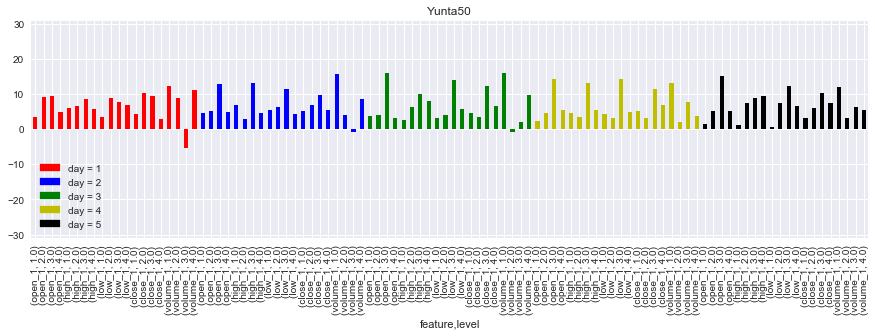

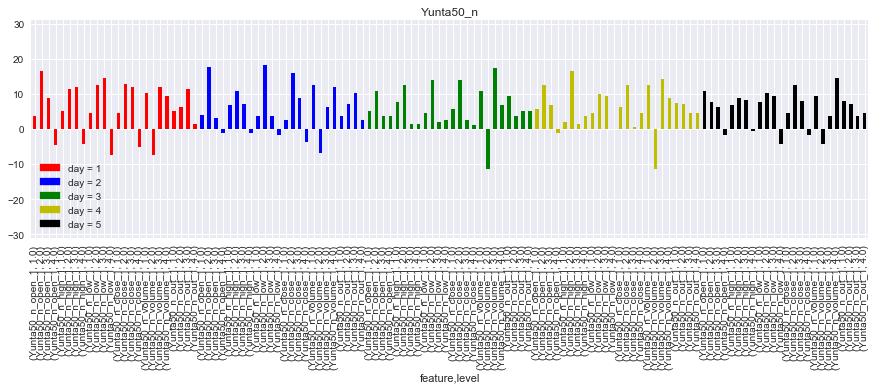

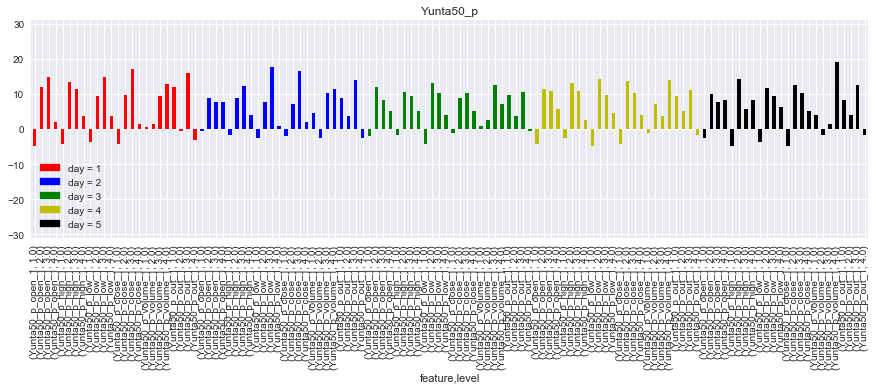

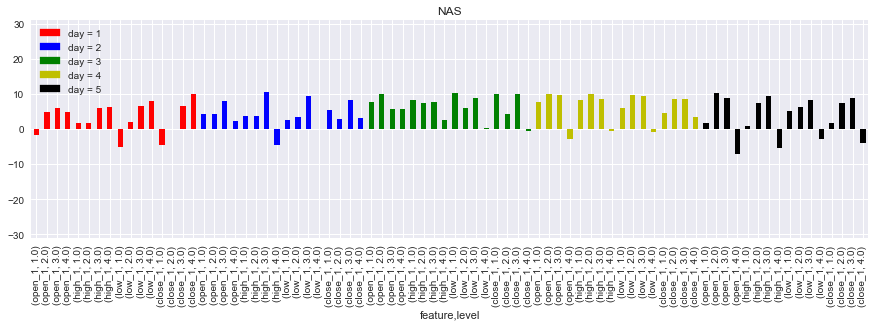

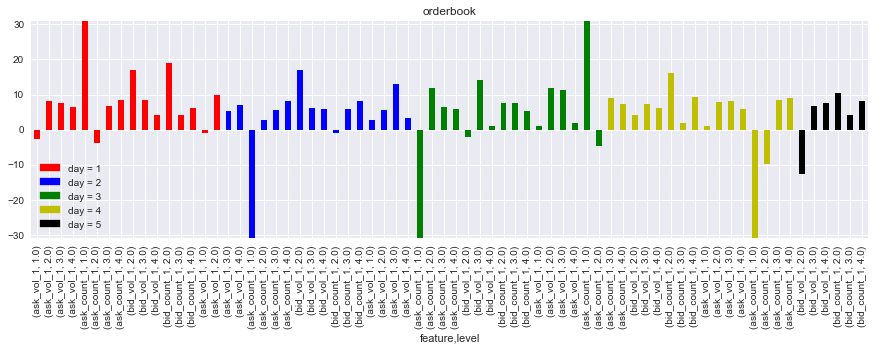

...

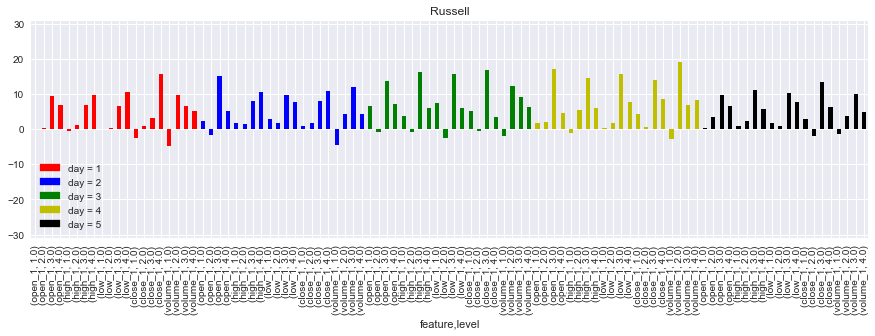

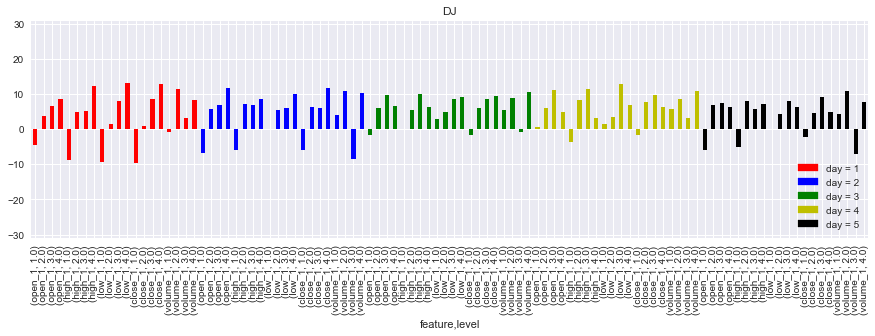

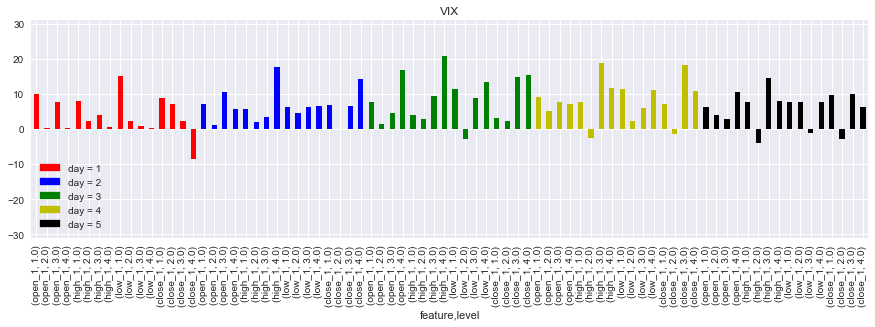

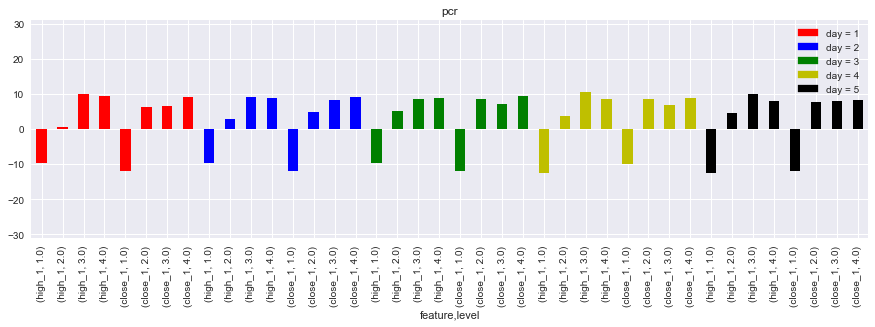

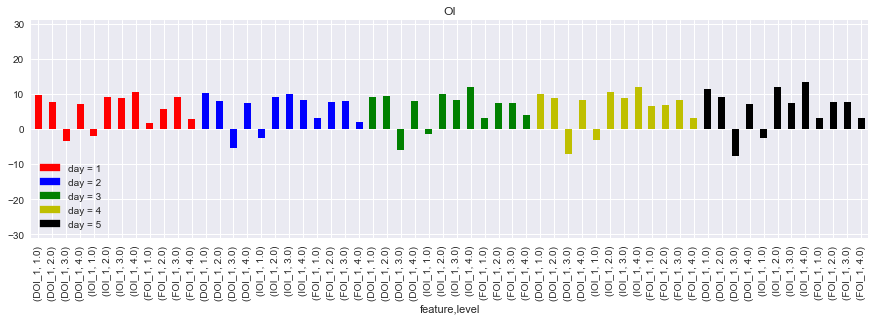

In [96]:
# just use orderbook for mon tue wed thus
interval = 0
window = 100
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


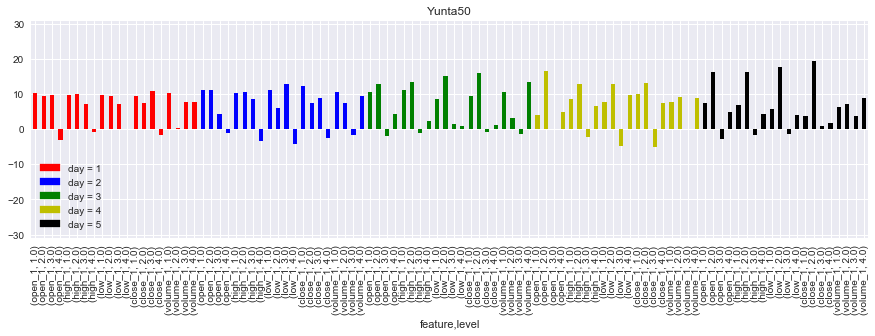

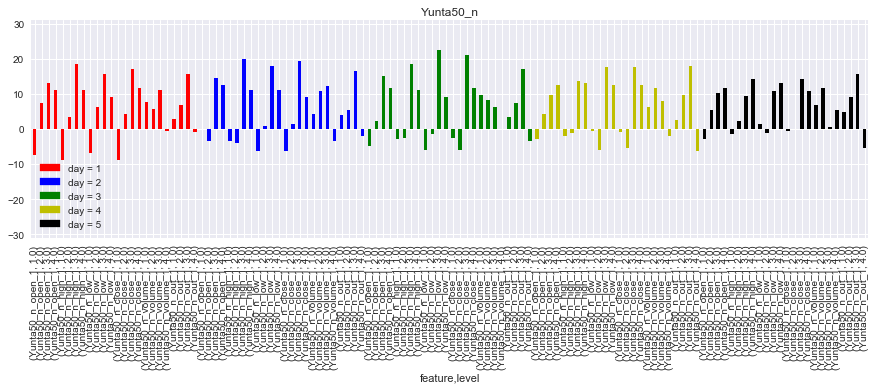

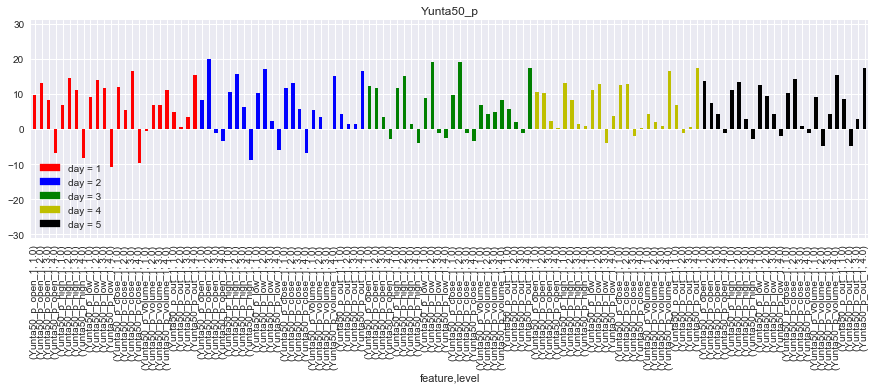

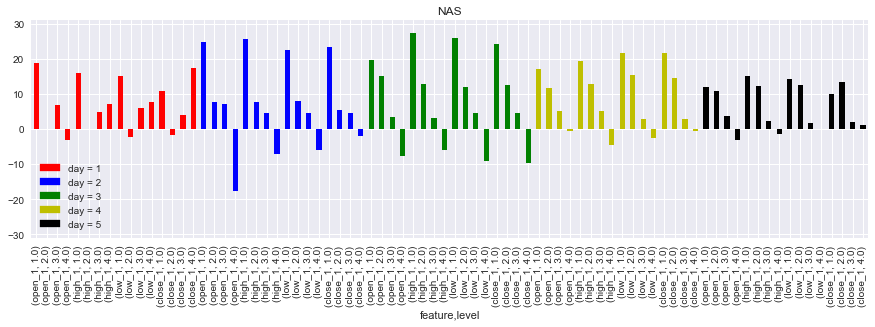

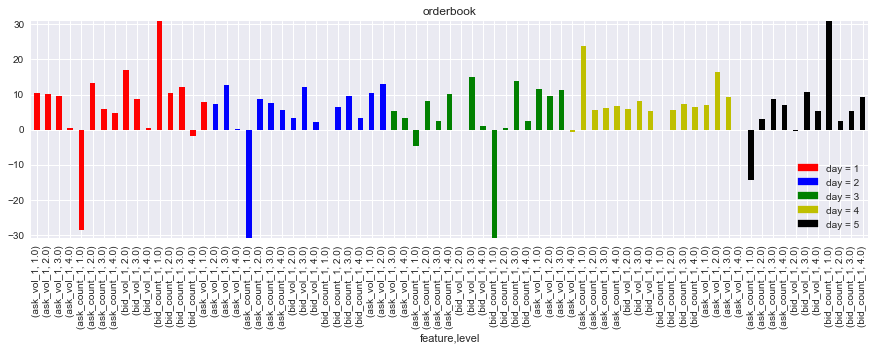

...

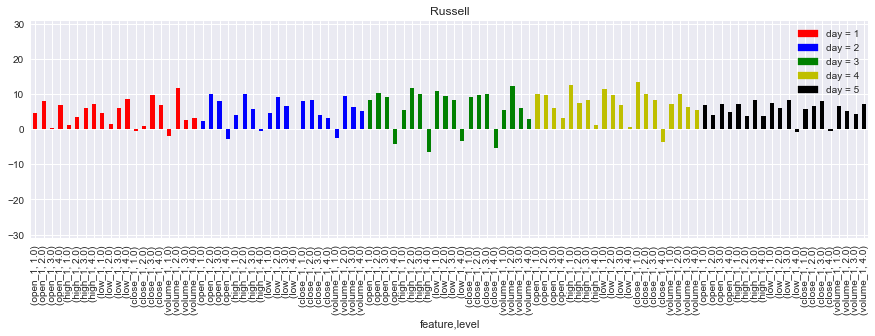

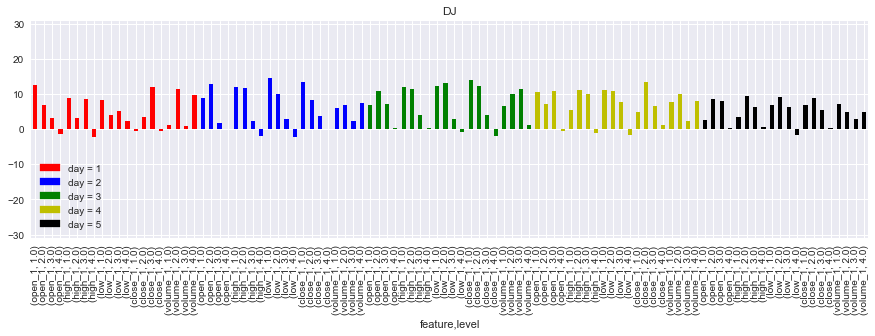

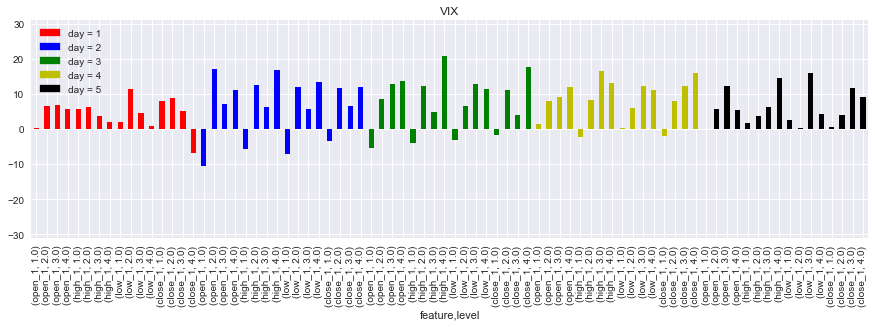

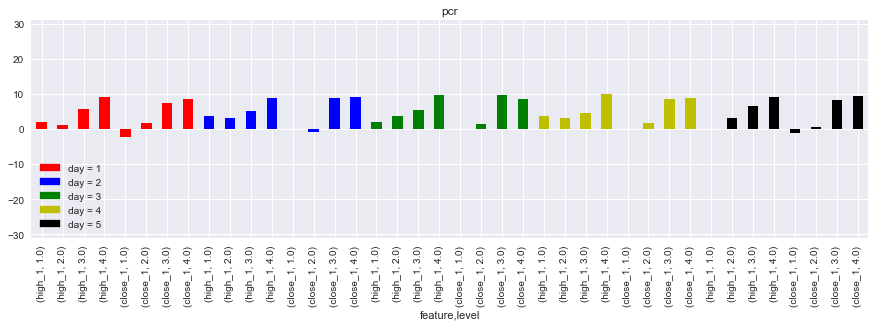

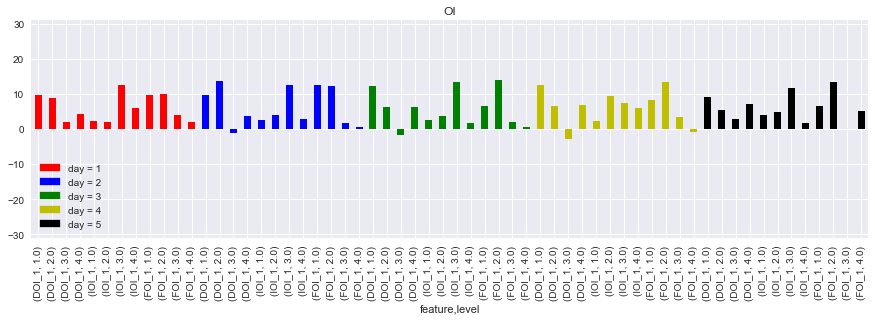

In [95]:
# just use orderbook for mon tue wed fri
interval = 0
window = 50
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


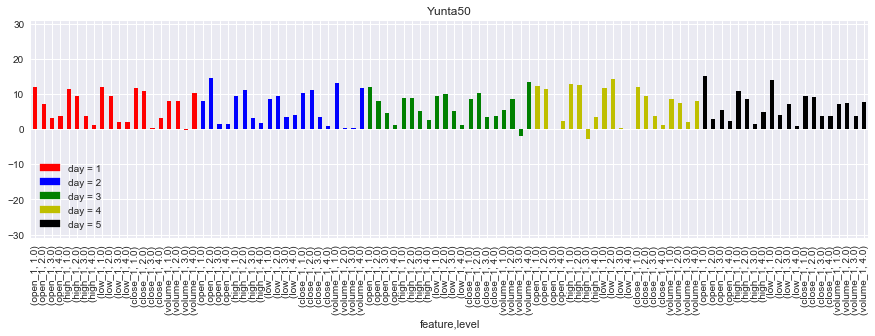

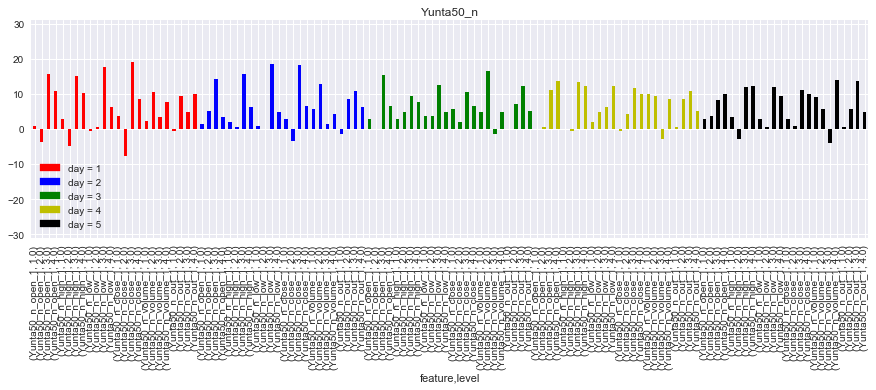

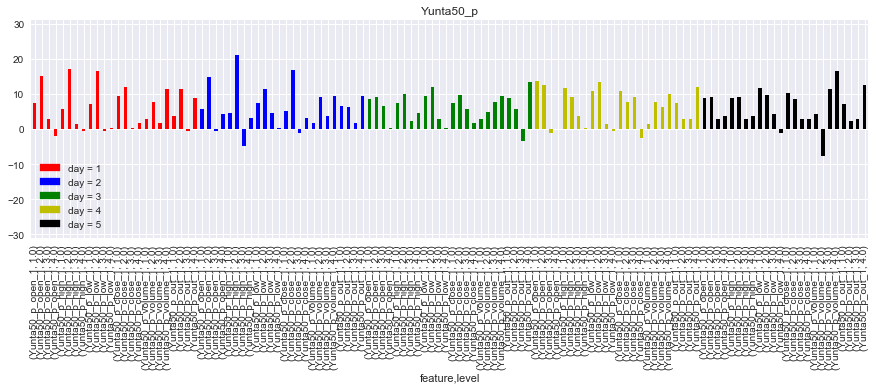

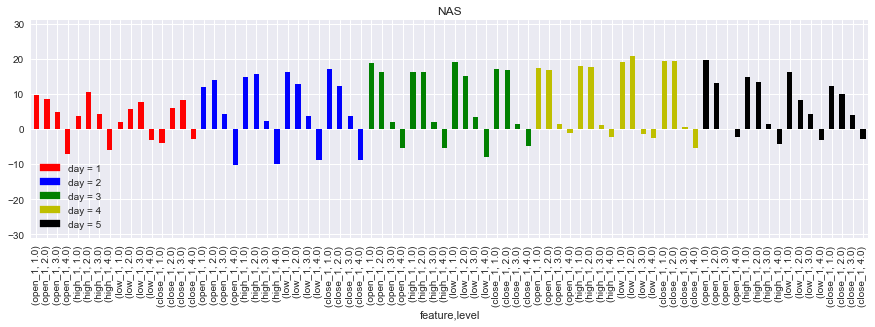

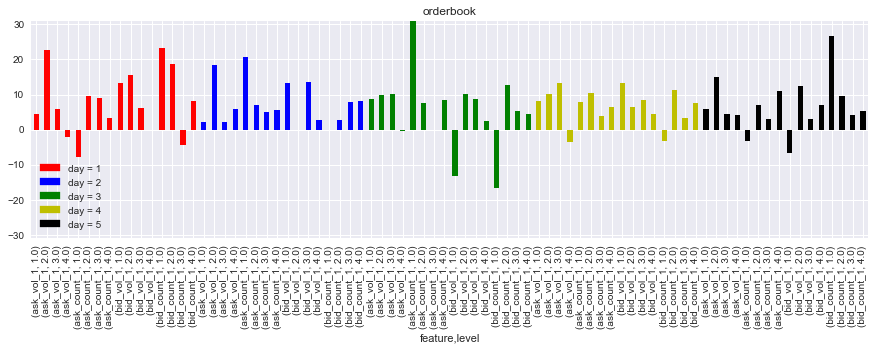

...

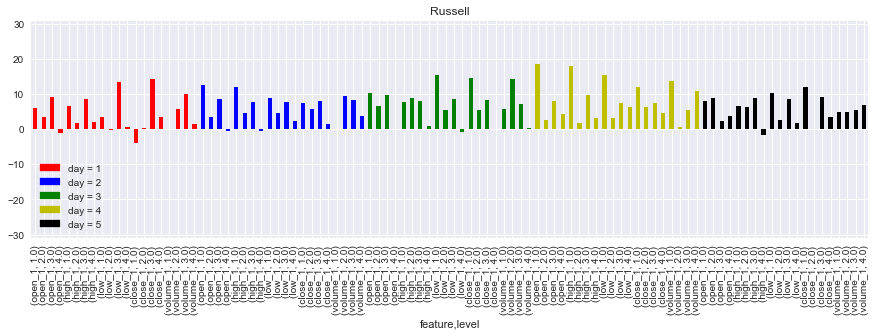

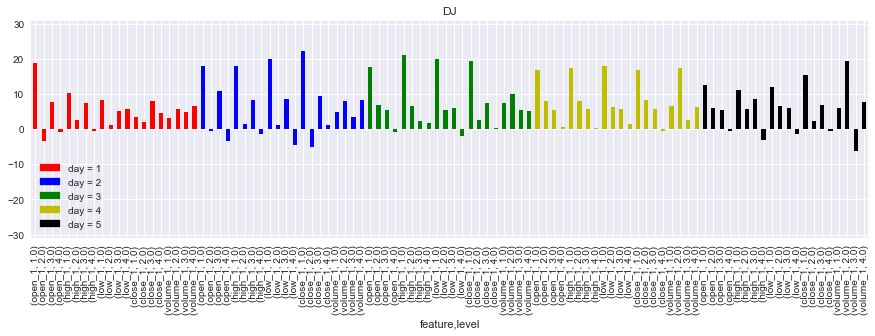

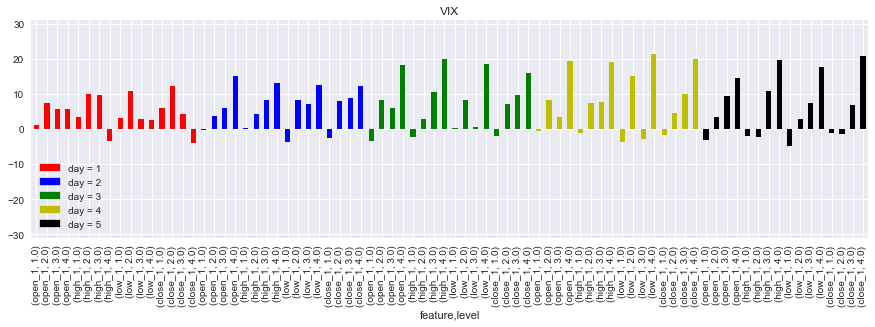

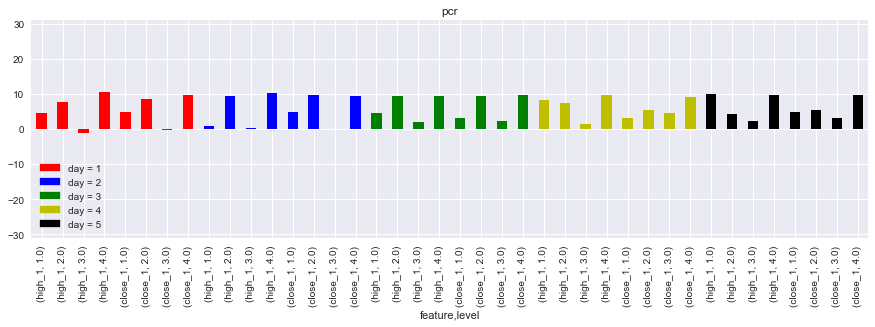

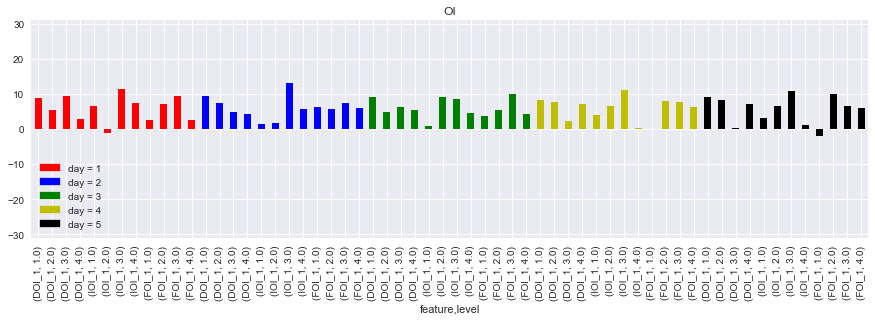

In [93]:
# can use all
interval = 0
window = 30
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


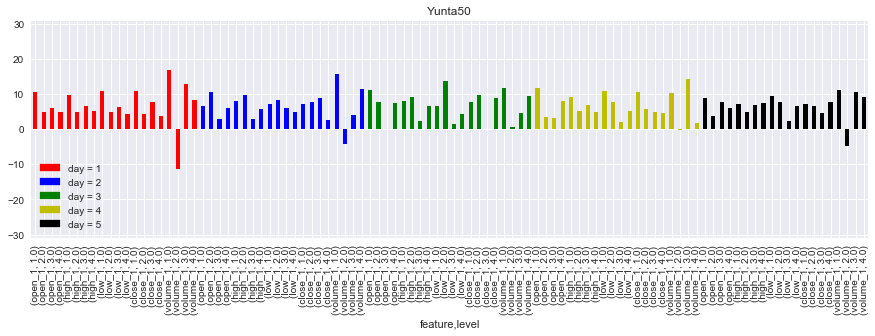

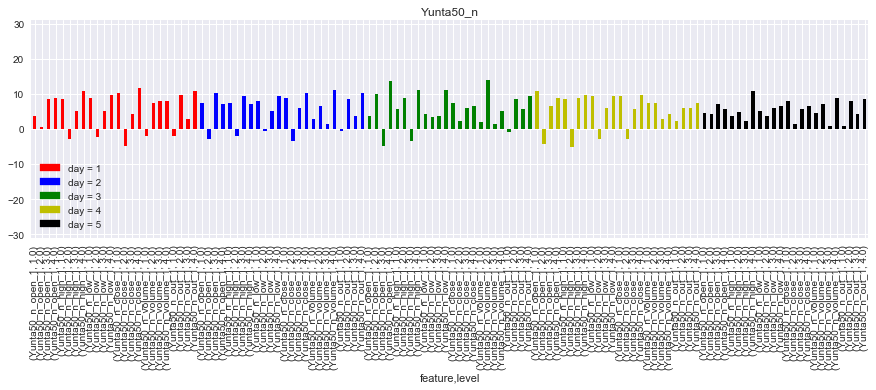

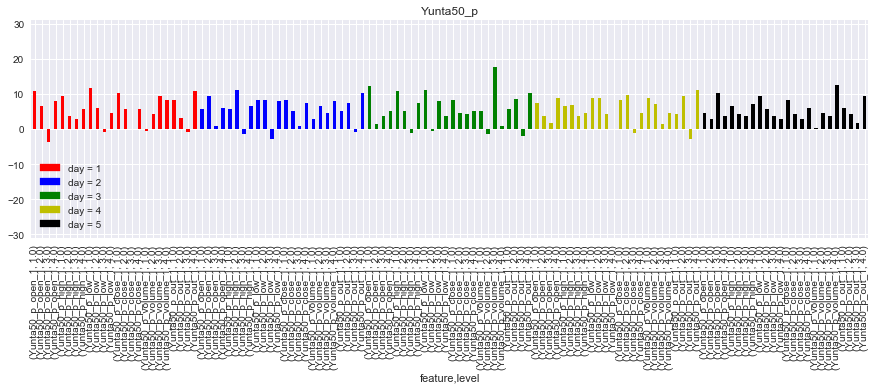

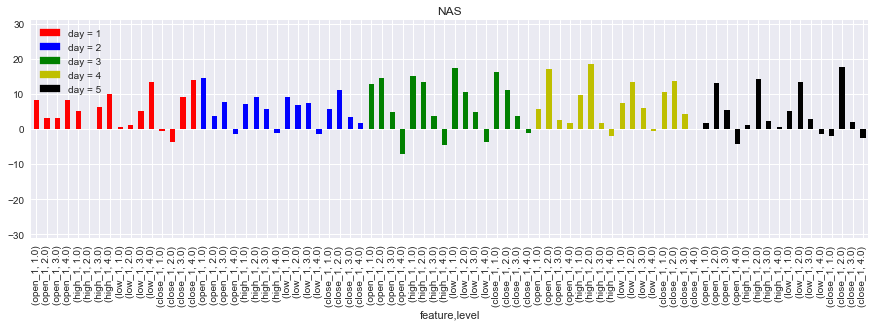

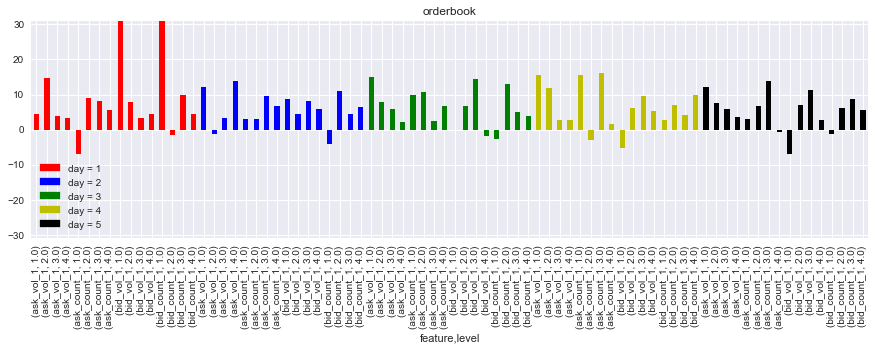

...

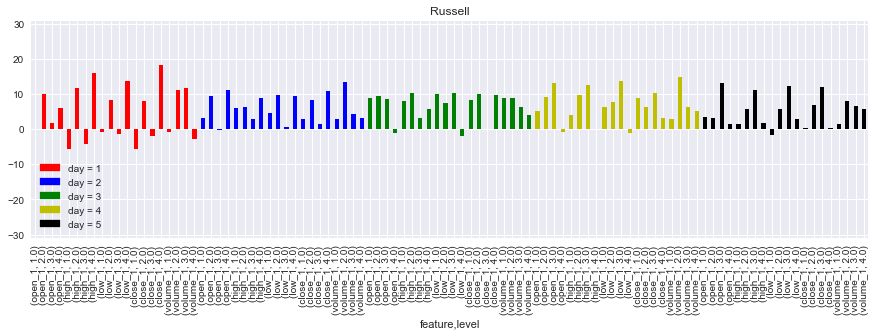

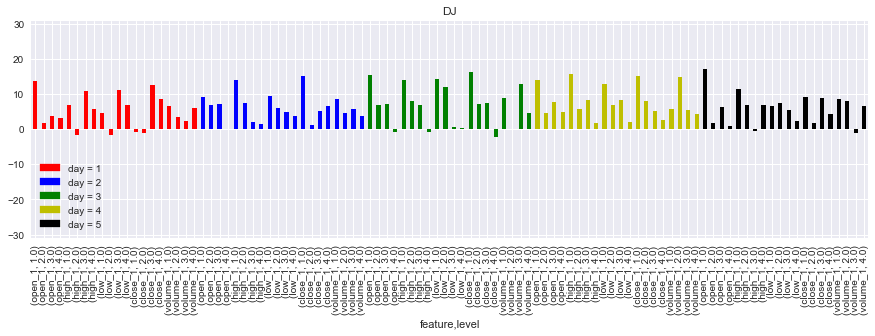

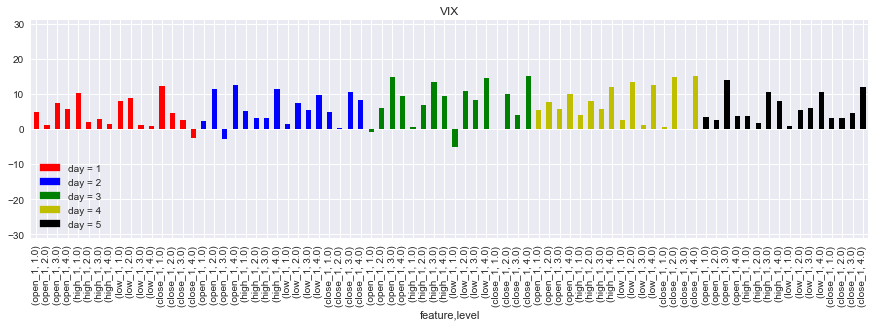

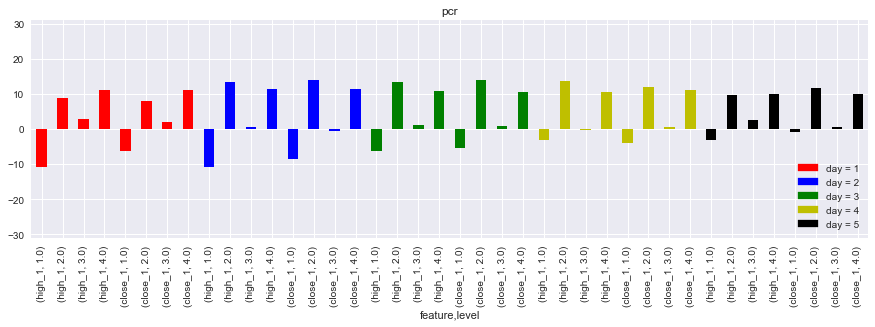

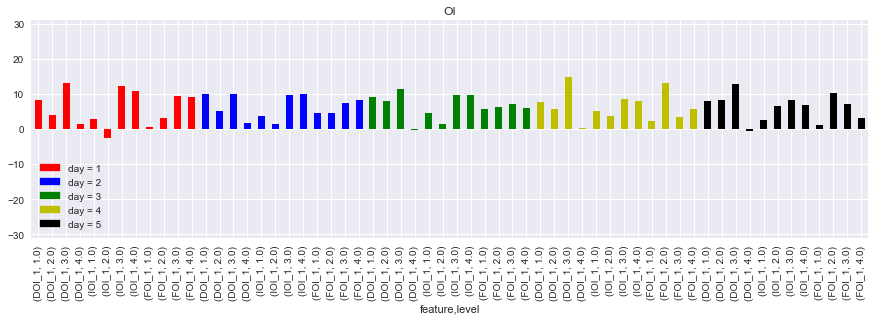

In [99]:
interval = 0
window = 20
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


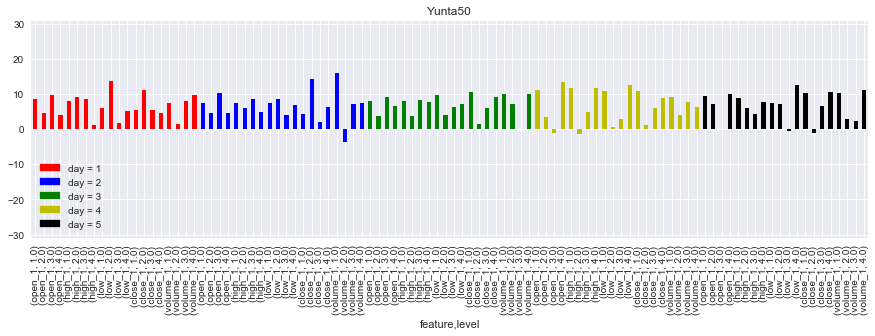

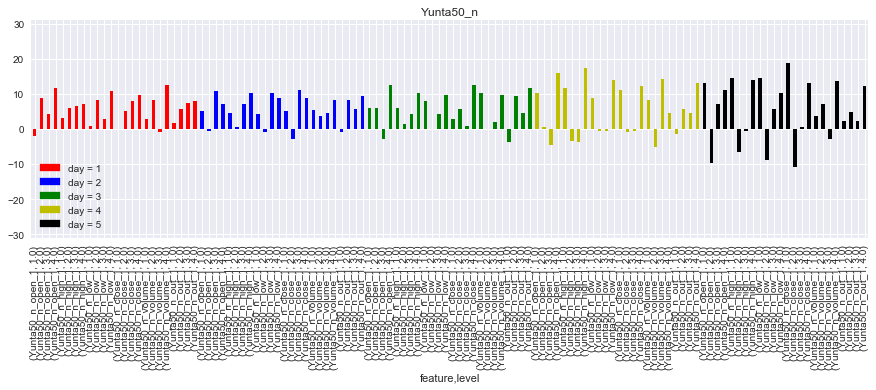

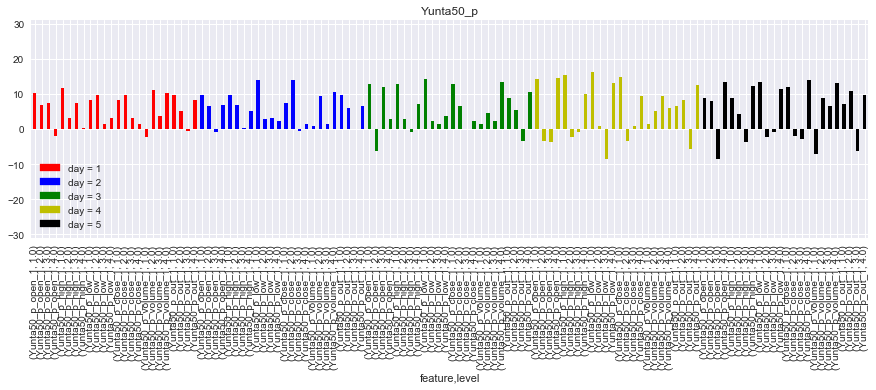

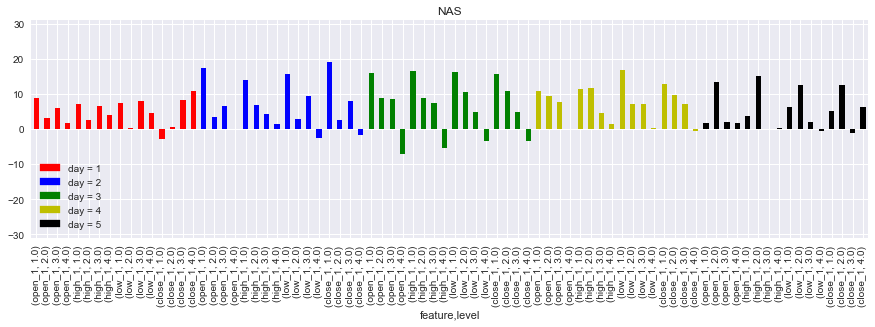

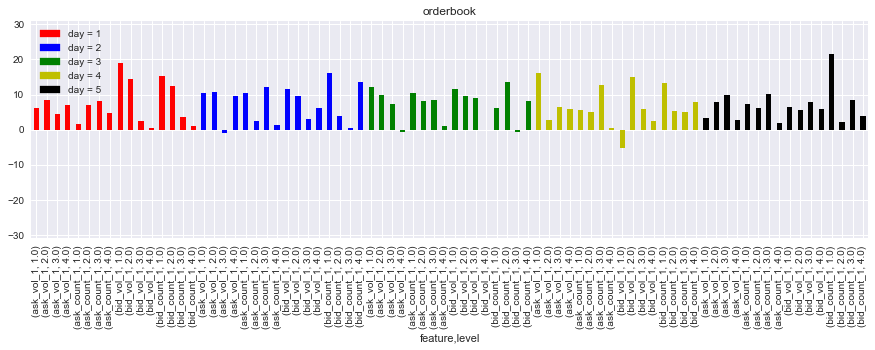

...

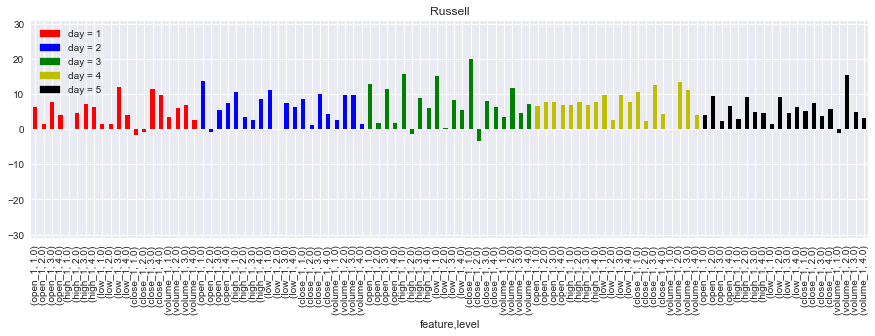

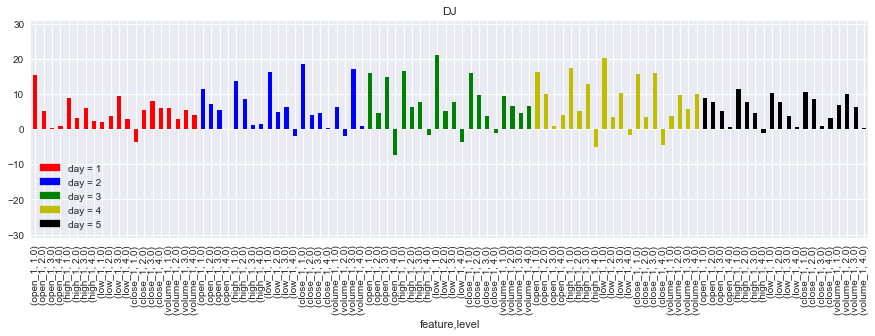

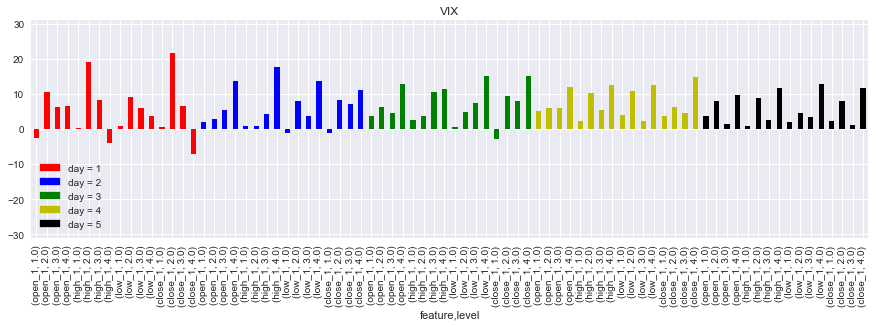

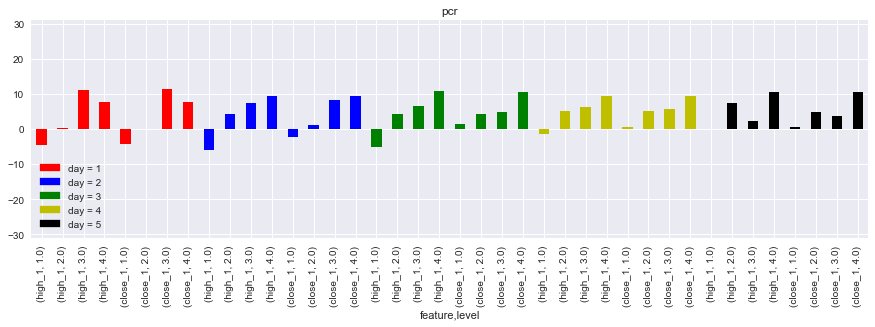

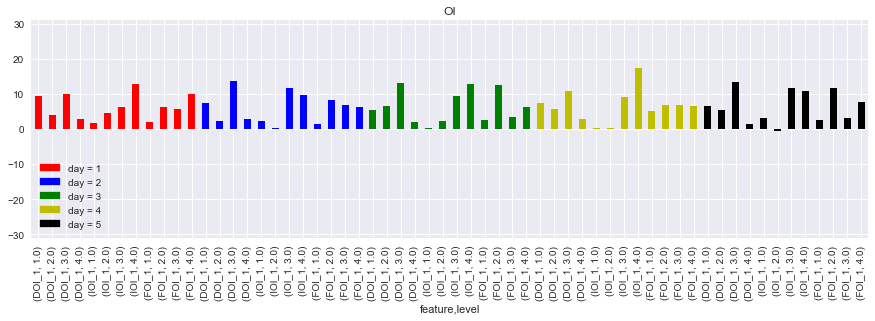

In [98]:
interval = 0
window = 15
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


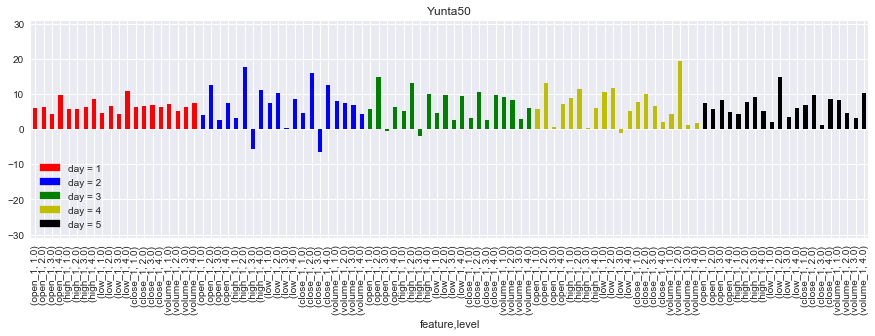

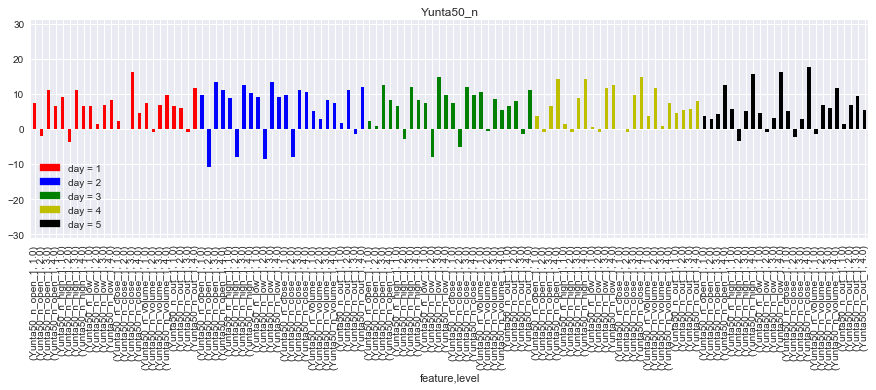

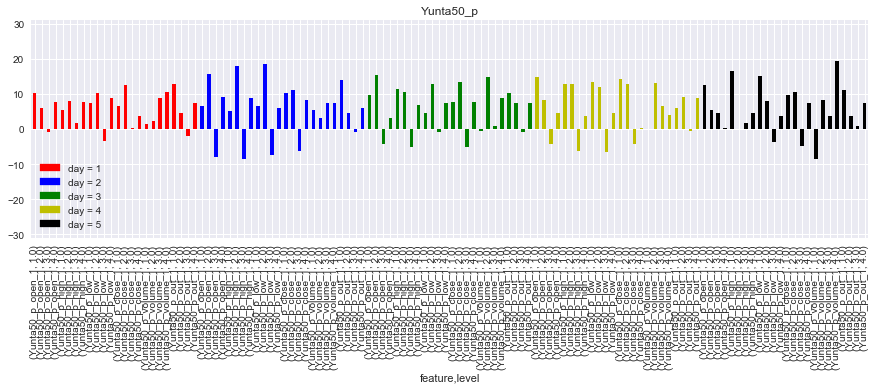

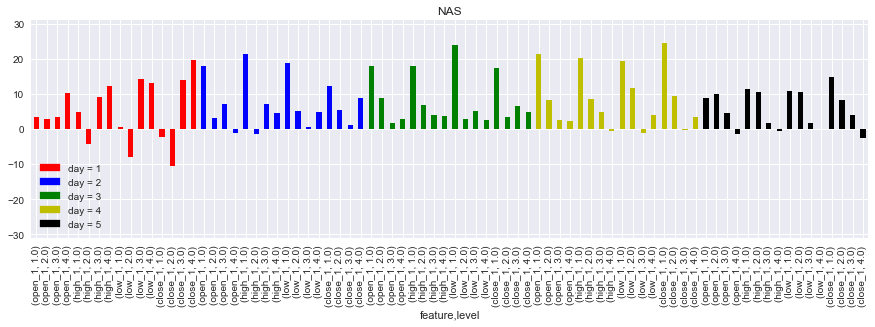

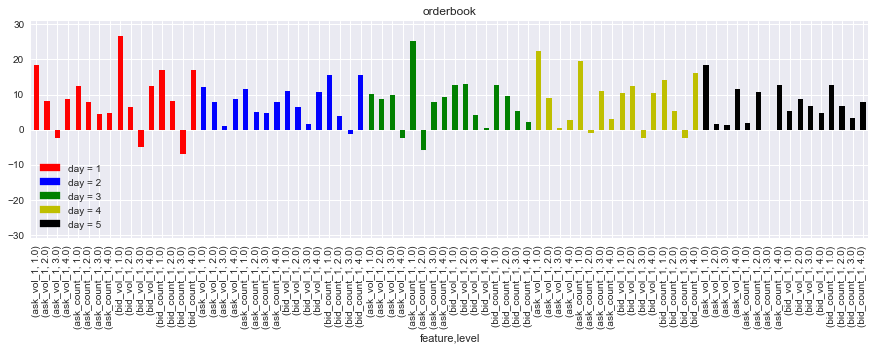

...

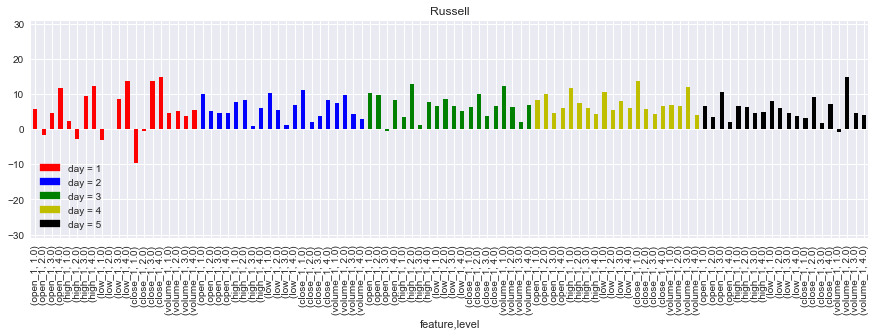

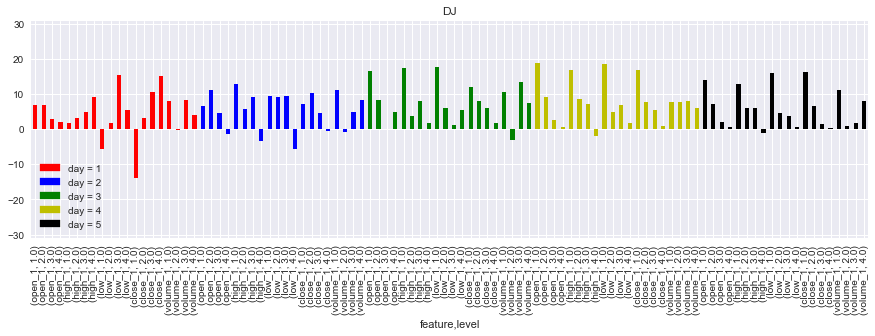

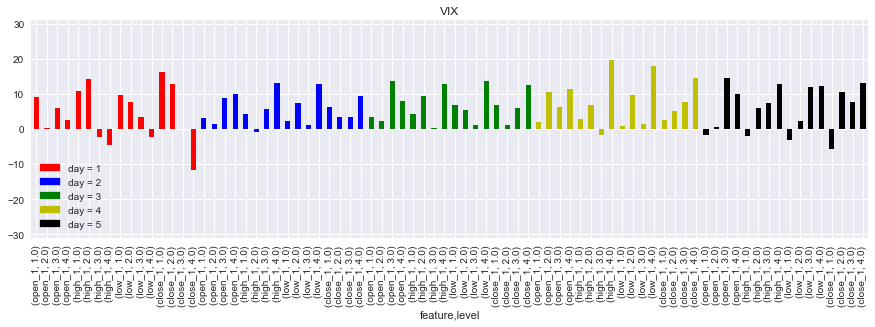

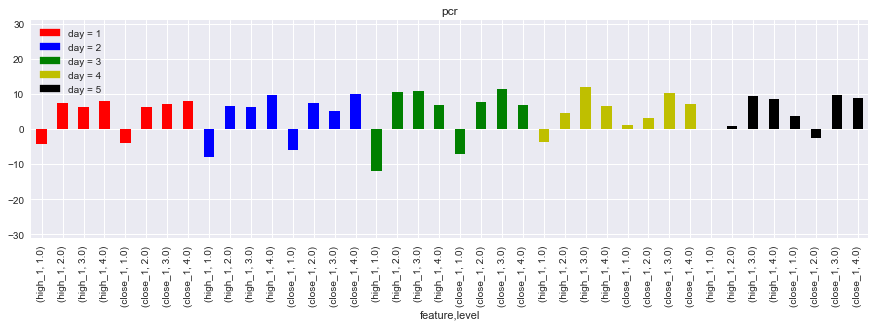

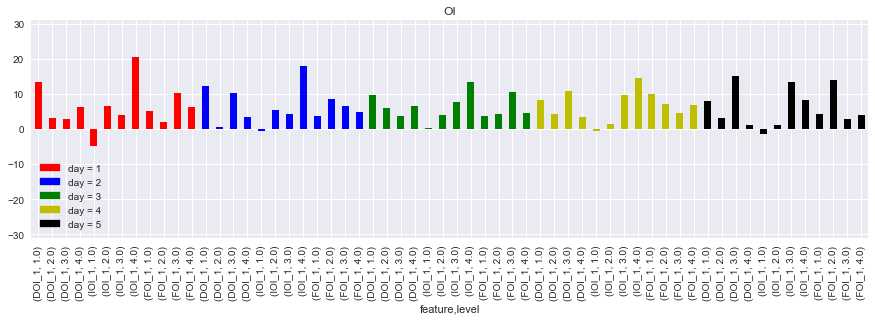

In [97]:
interval = 0
window = 10
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


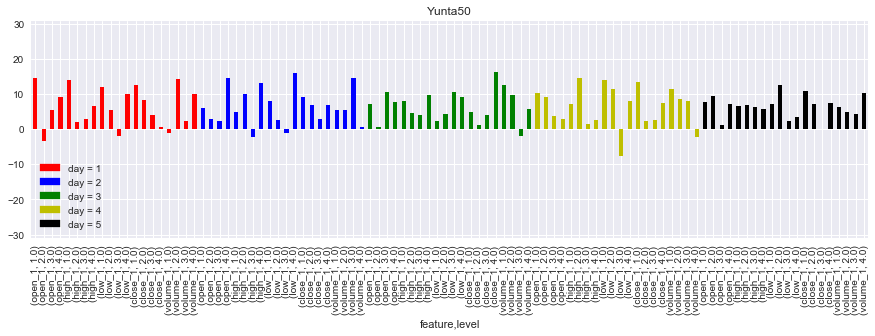

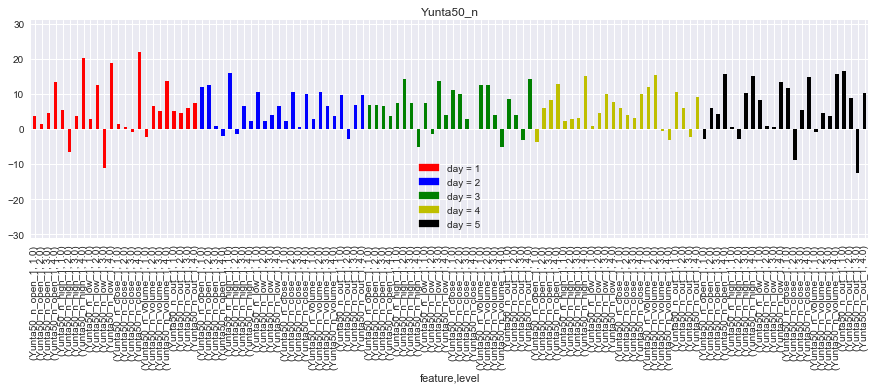

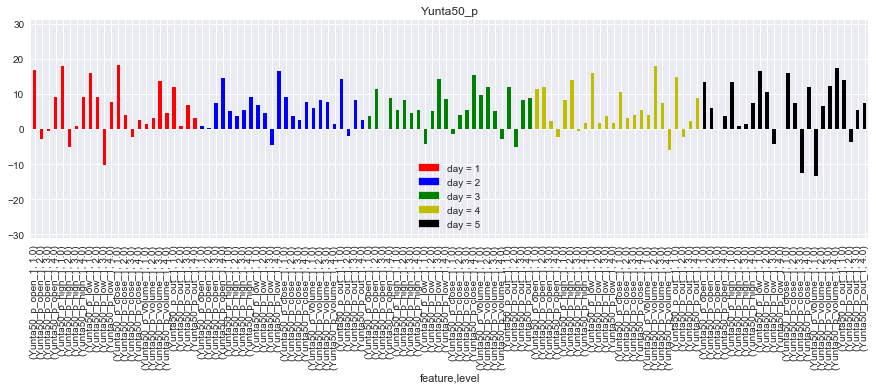

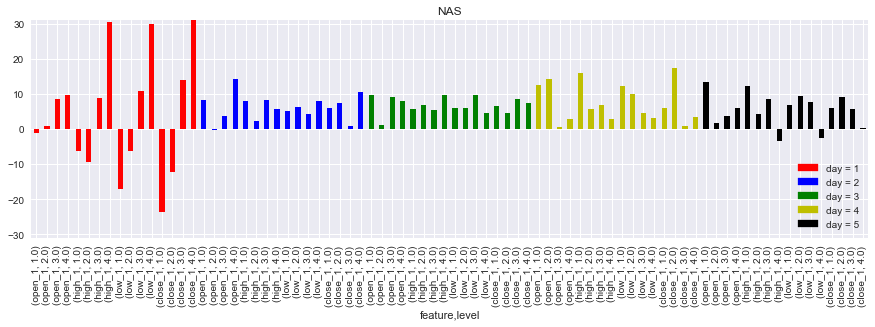

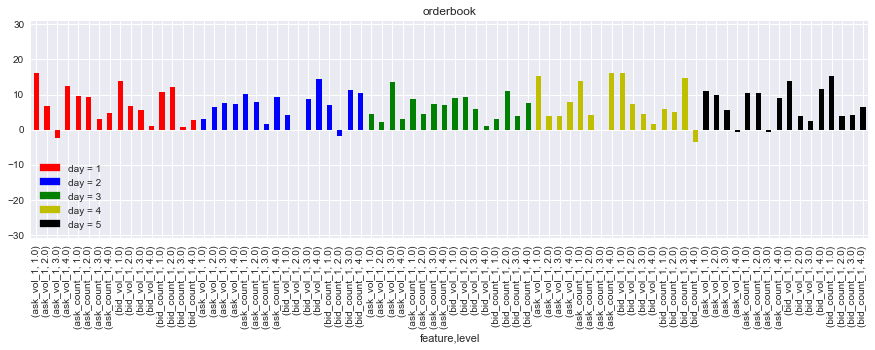

...

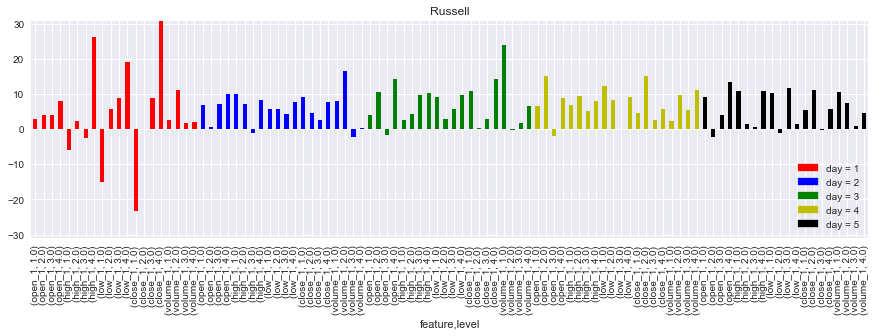

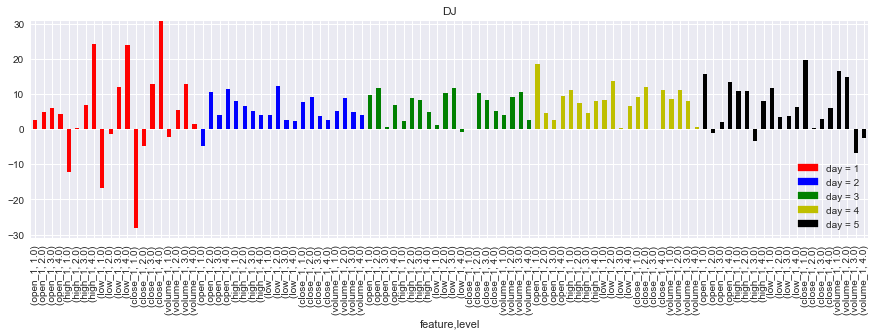

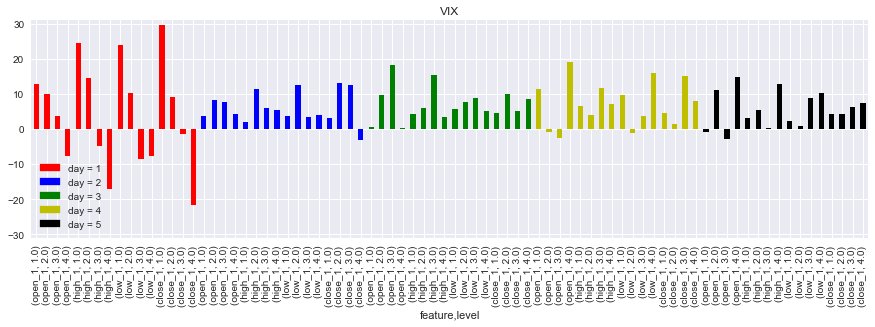

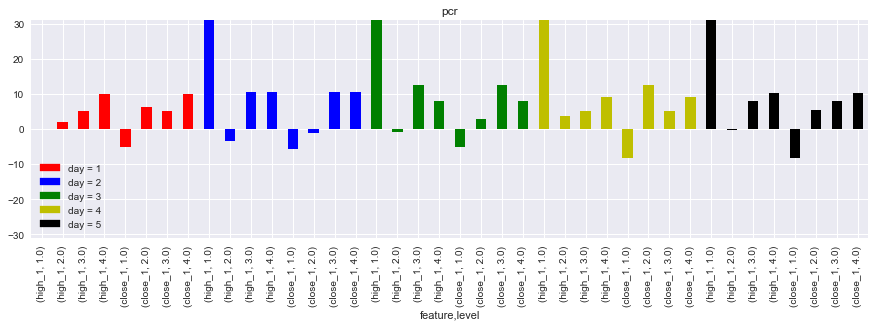

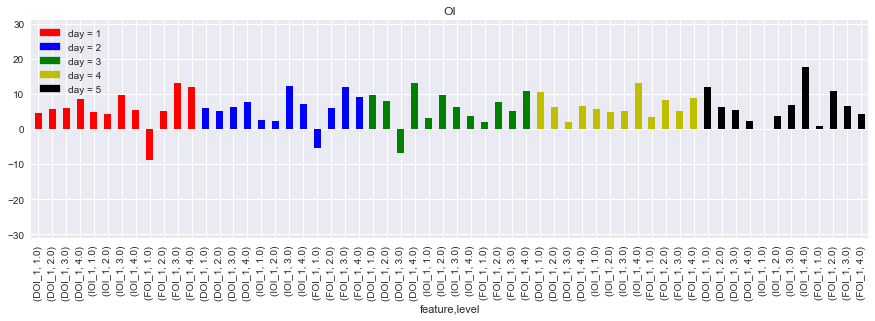

In [90]:
# can use pcr
interval = 0
window = 2
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606
Noise rate is 5.606060606060606


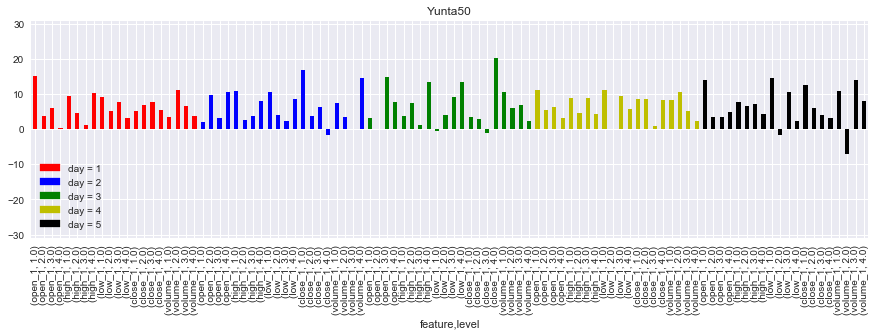

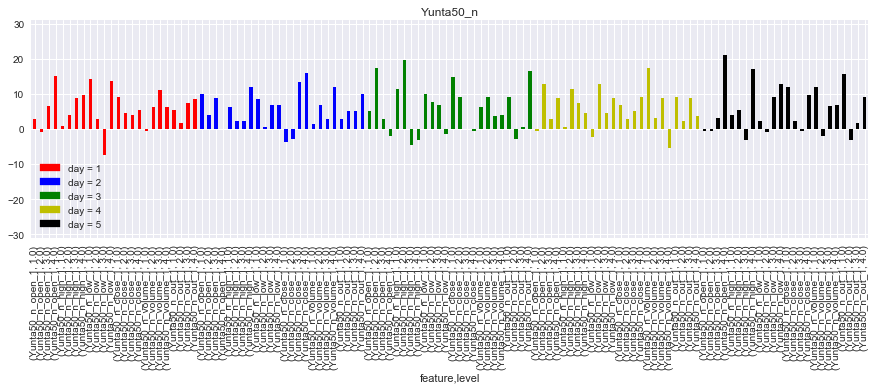

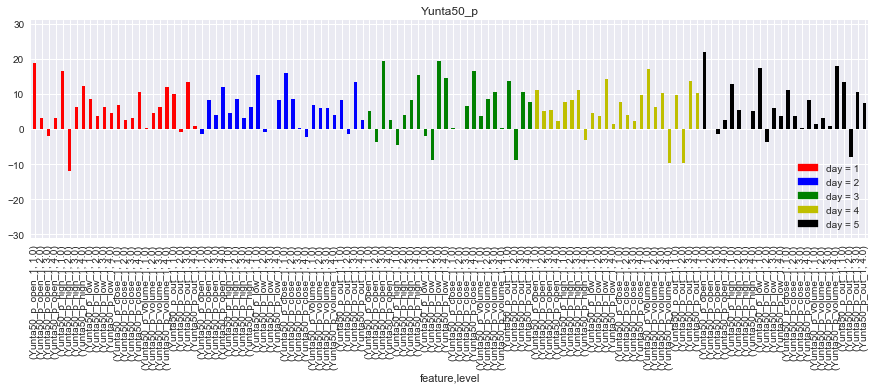

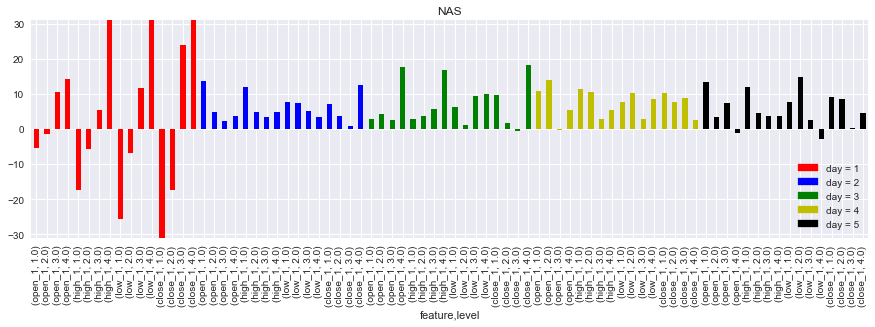

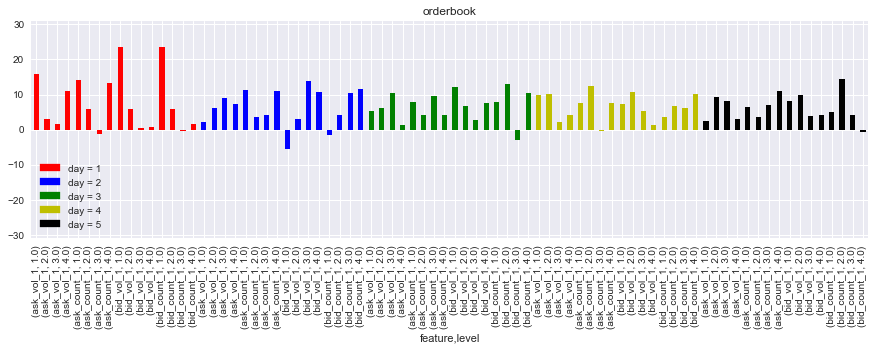

...

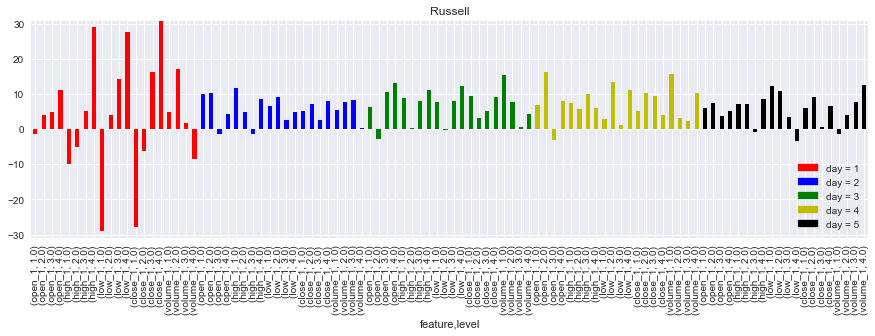

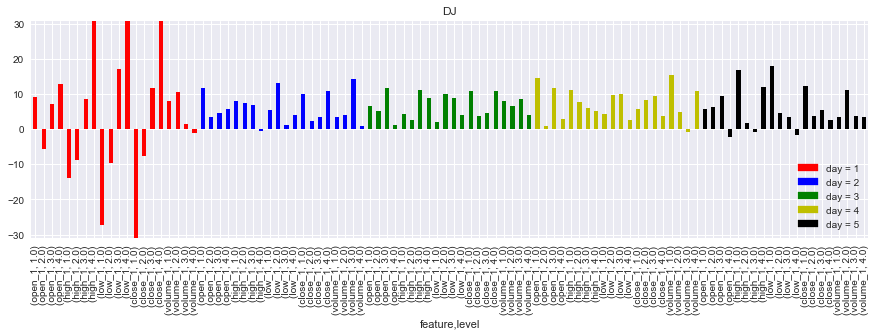

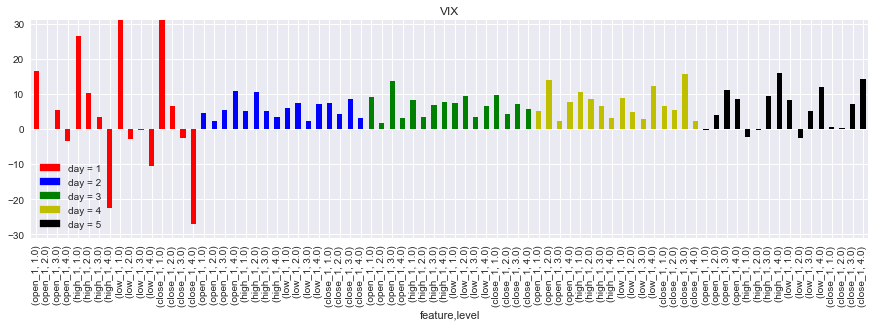

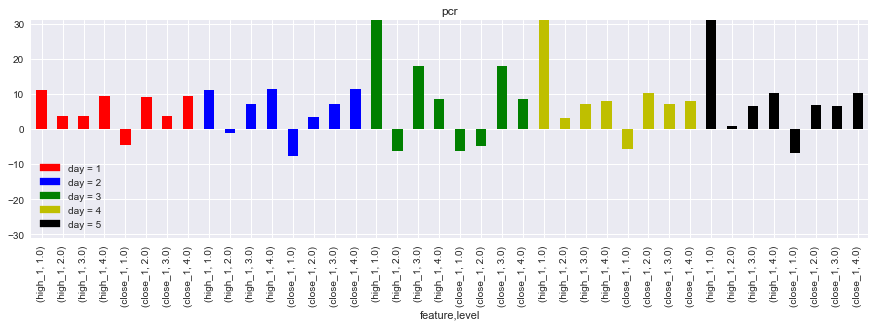

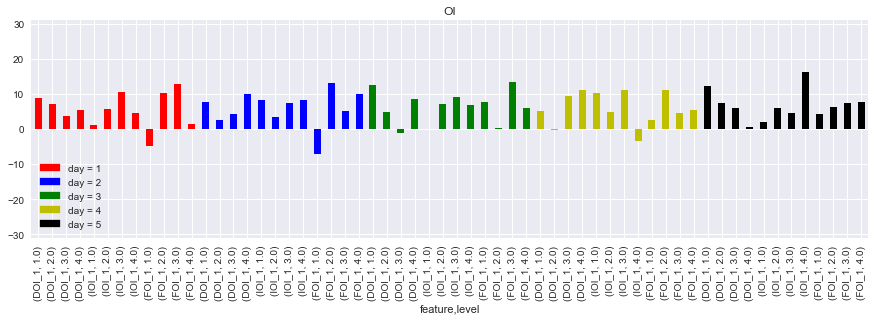

In [89]:
#use american and bond pcr
interval = 0
window = 1
get_all_stable_5day(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 47.98479087452471


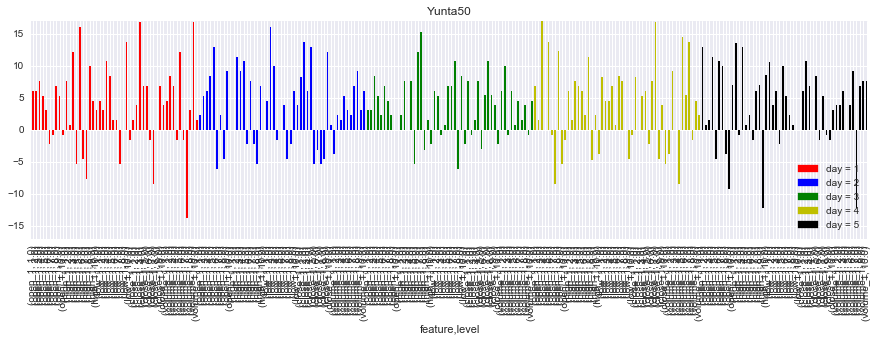

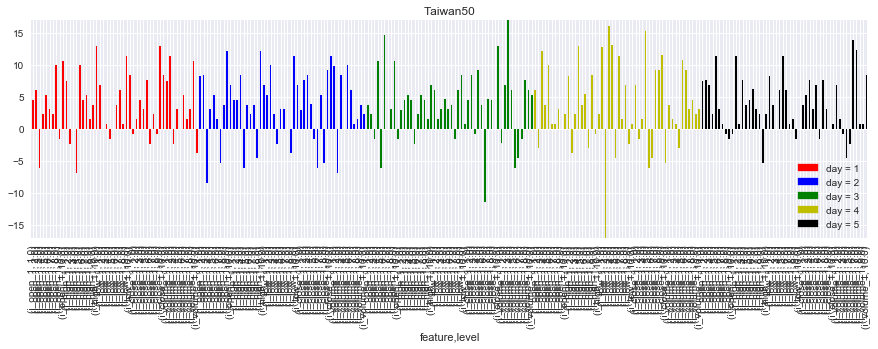

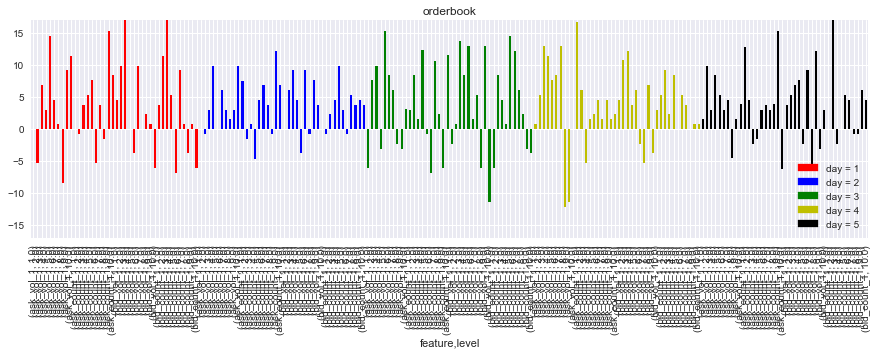

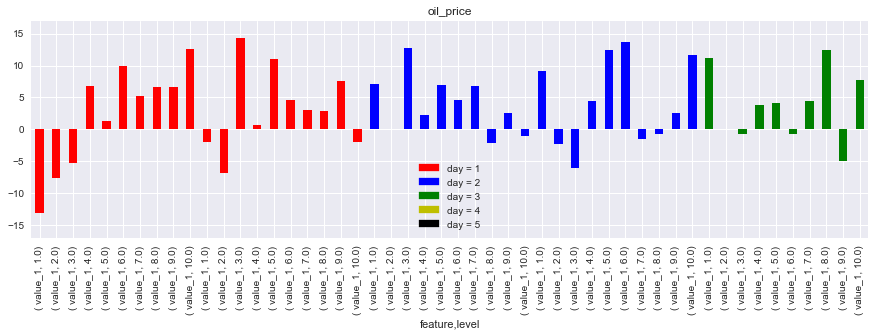

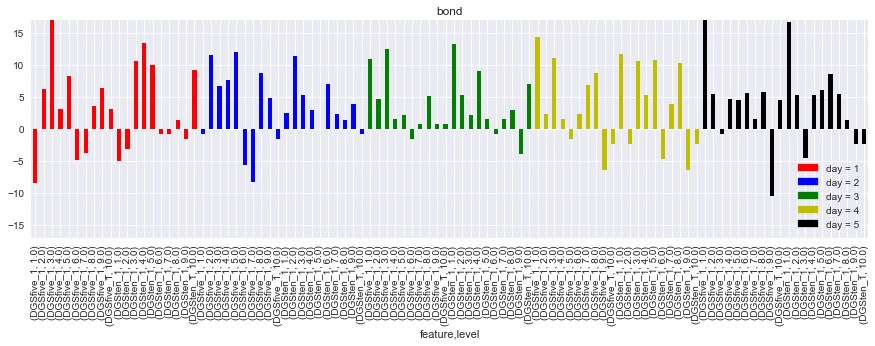

...

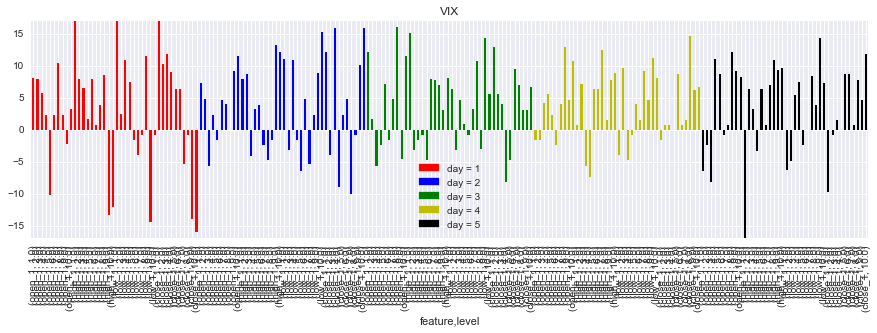

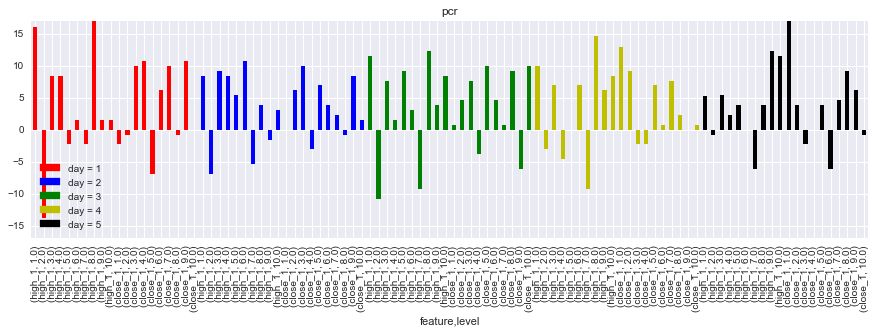

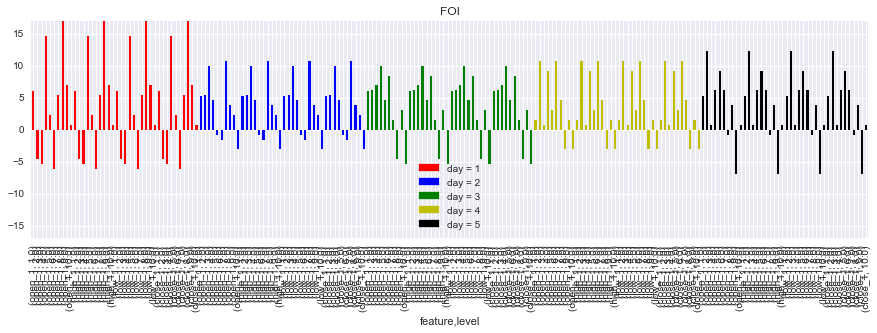

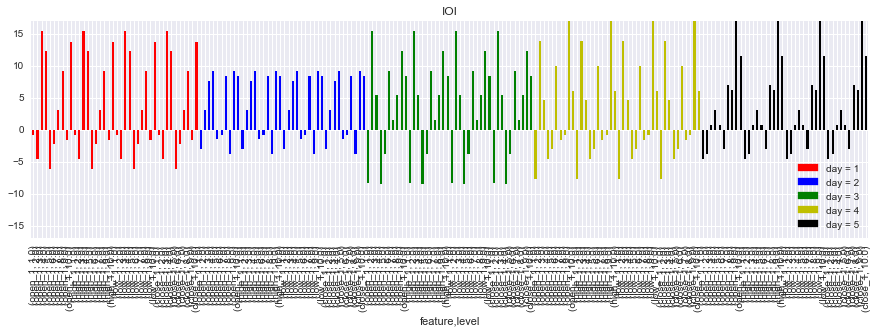

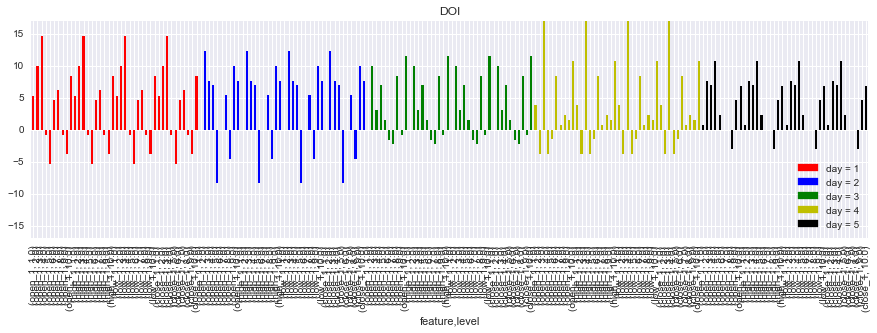

In [225]:
interval = 0.5
window = 5
ca = 10
get_all_stable_5day(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,ca = ca)

Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
0
Yunta50


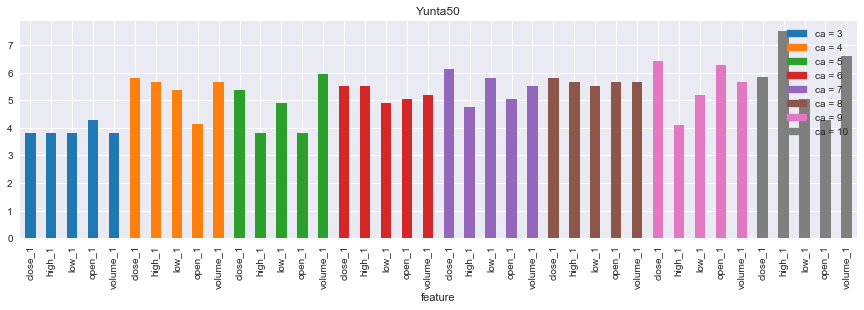

1
Taiwan50


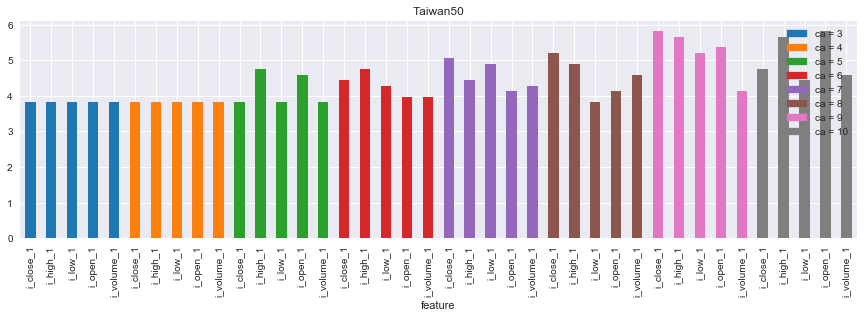

2
orderbook


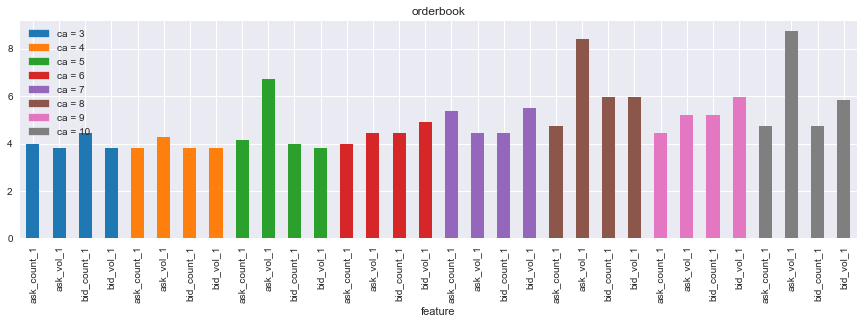

3
oil_price


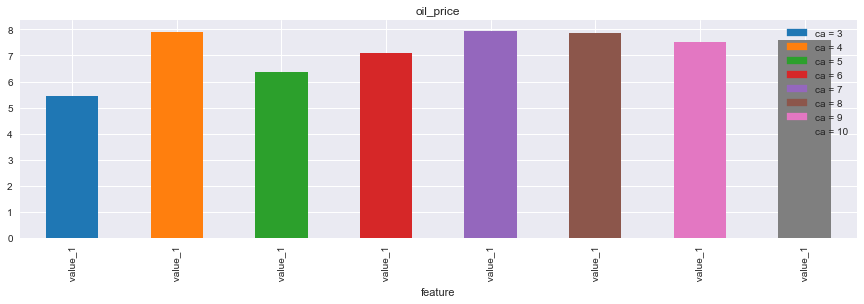

4
bond


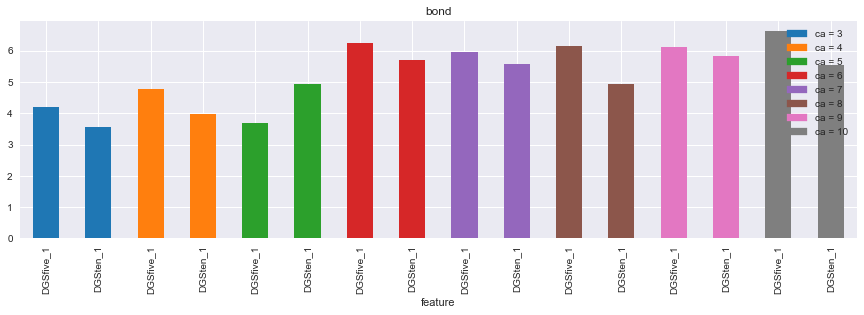

5
TXF


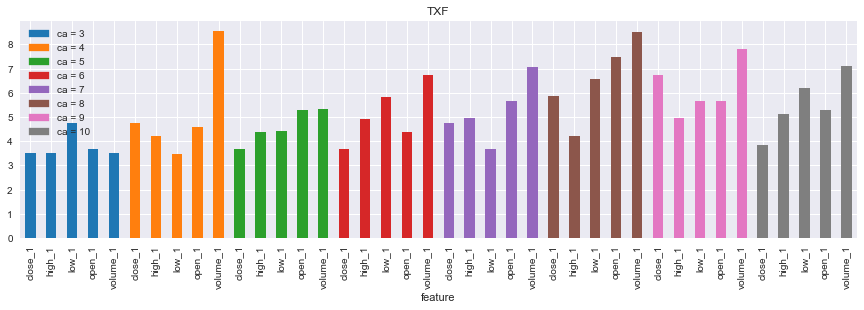

6
EXF


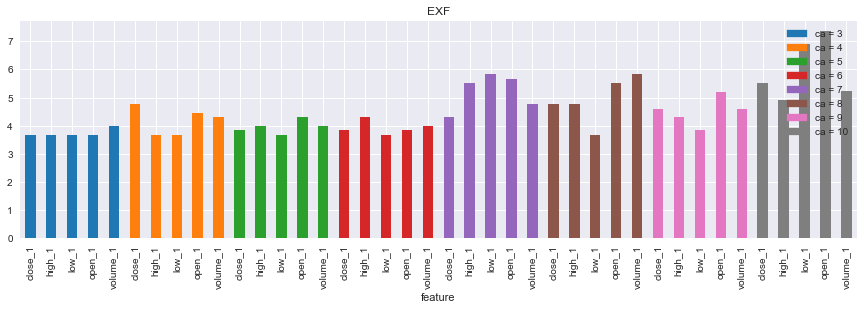

7
FXF


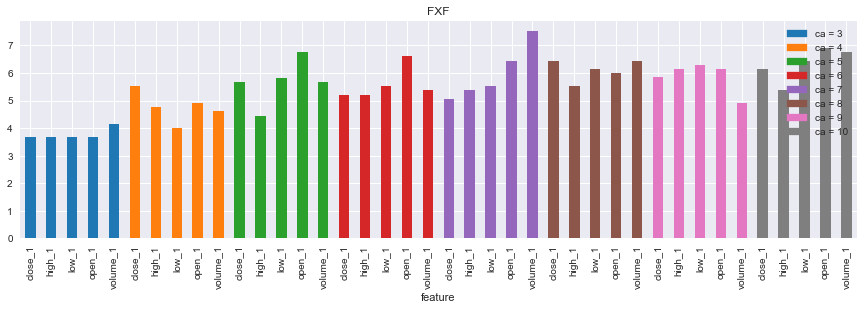

8
E_F


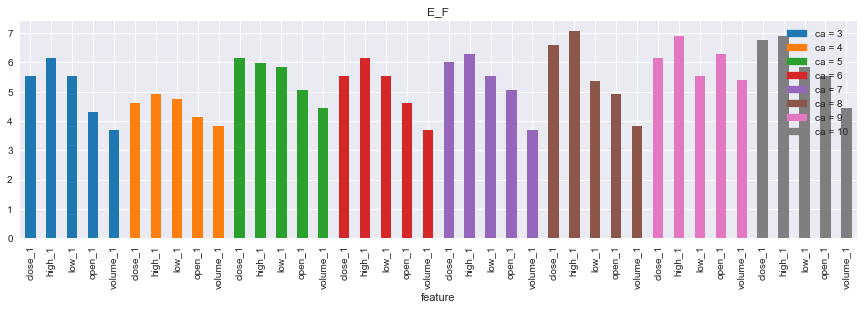

9
Nikkei


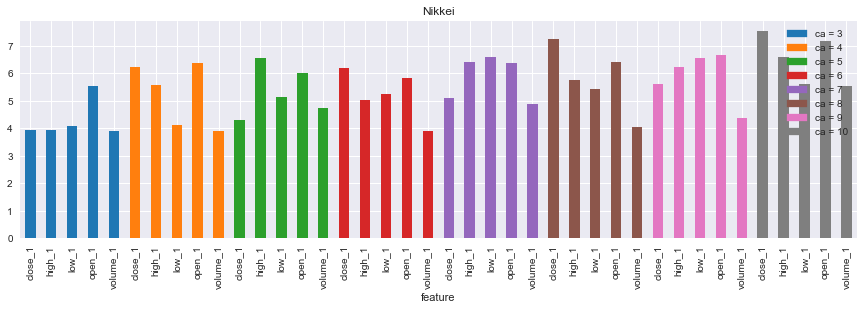

10
SP


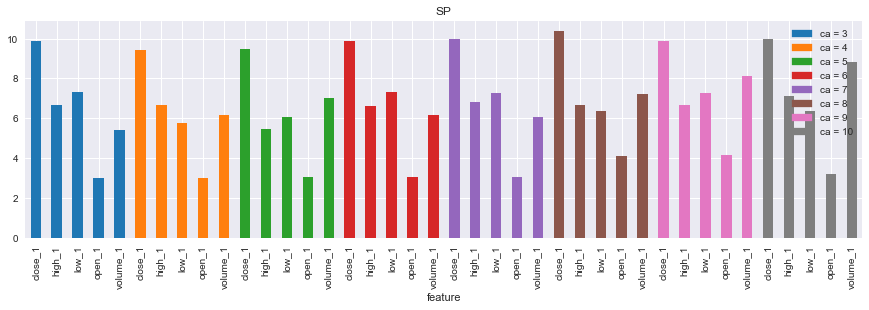

11
Russell


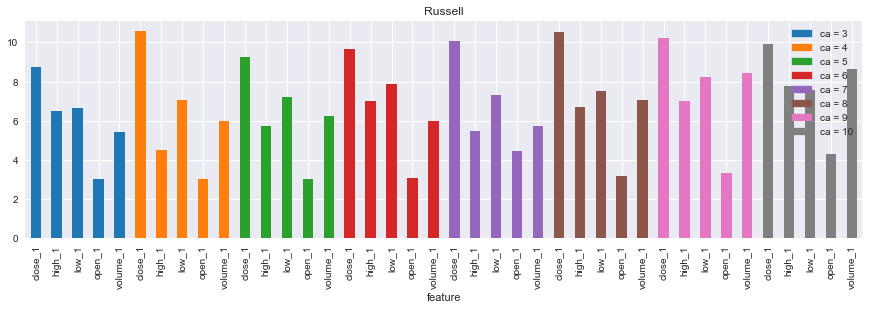

12
DJ


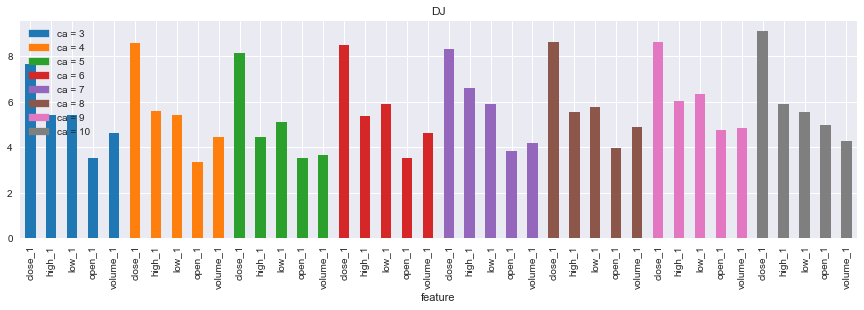

13
SOX


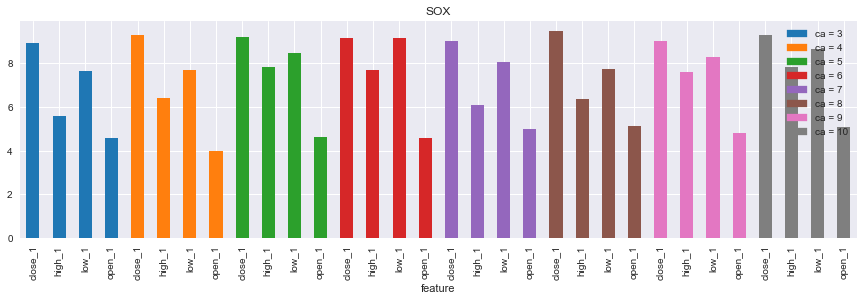

14
VIX


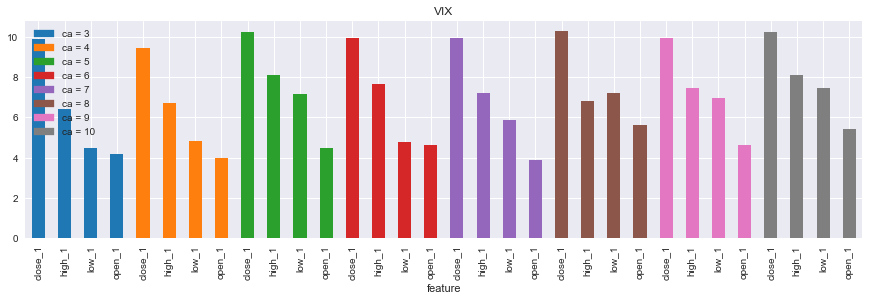

15
pcr


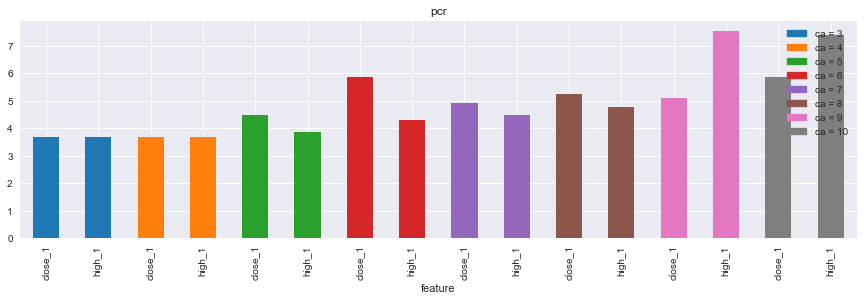

16
FOI


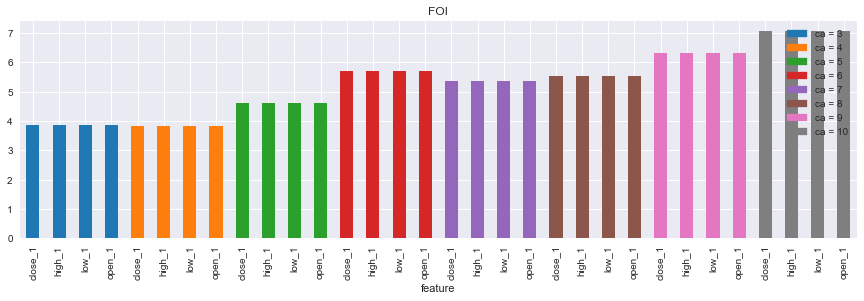

17
IOI


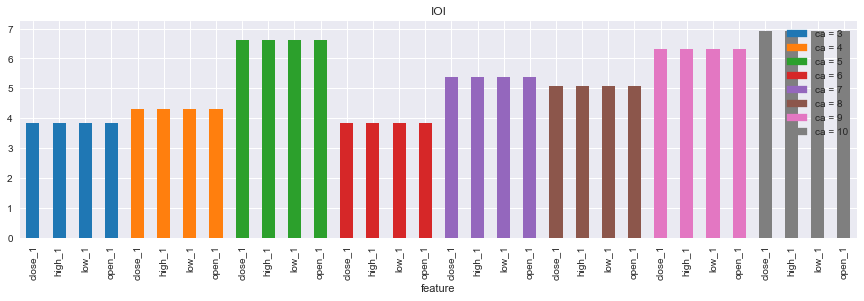

18
DOI


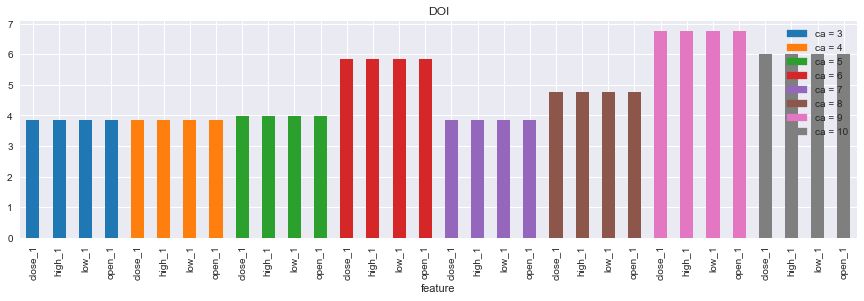

In [220]:
interval = 0.5
window = 5
get_compare_ca(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window)

Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136


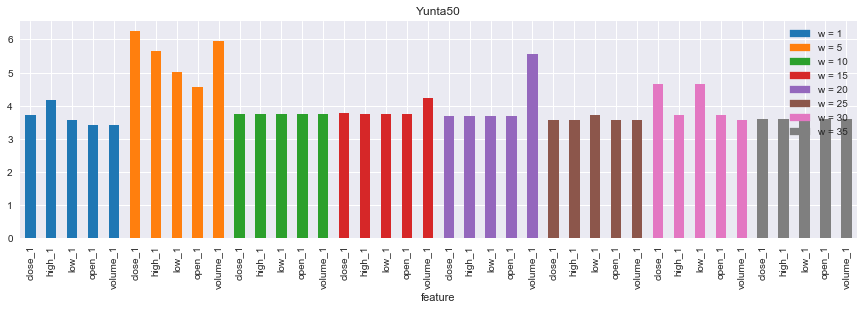

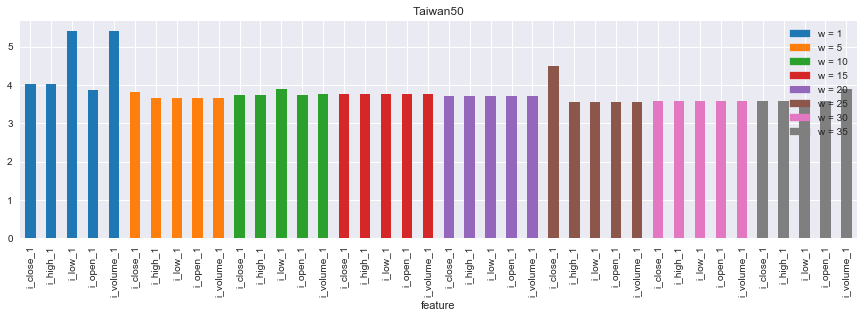

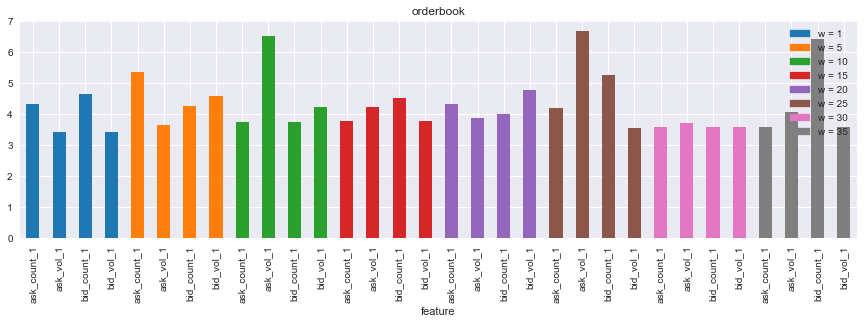

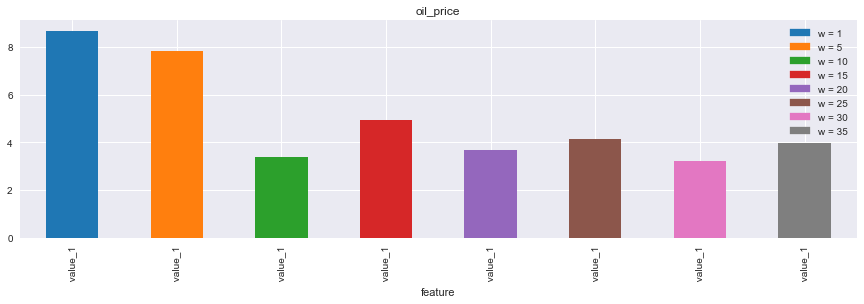

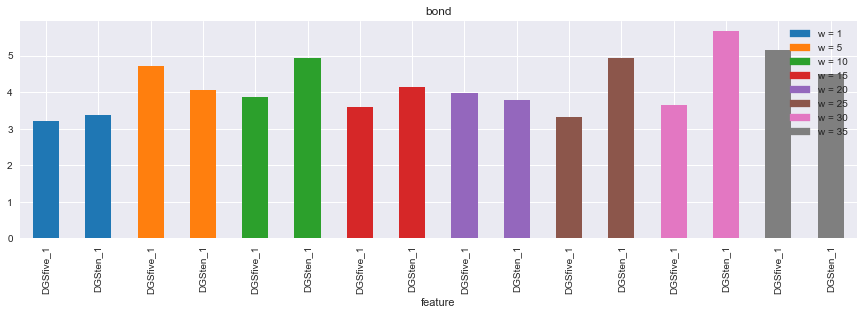

...

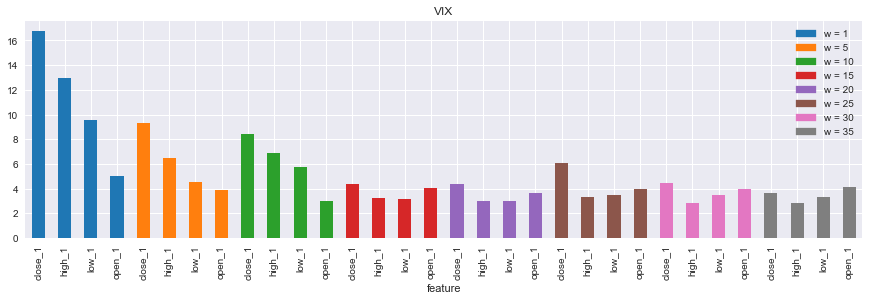

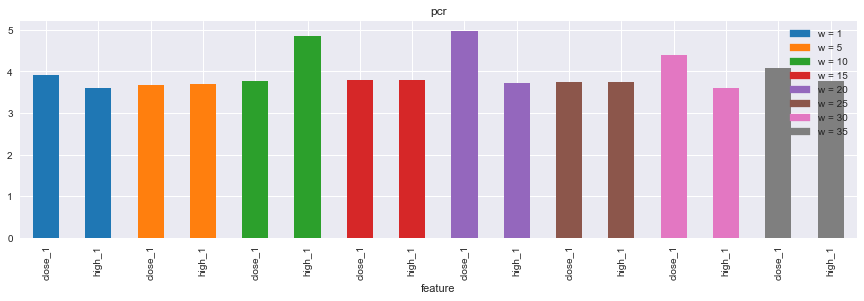

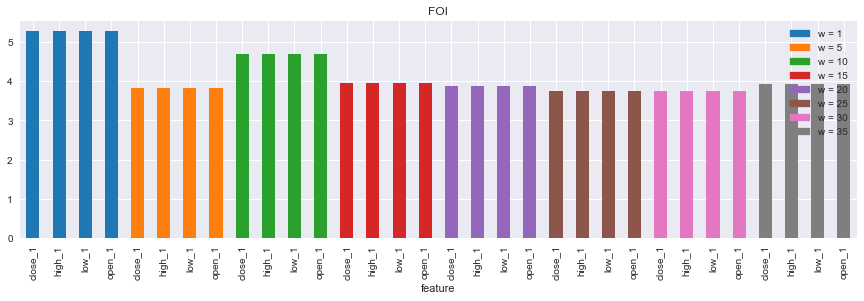

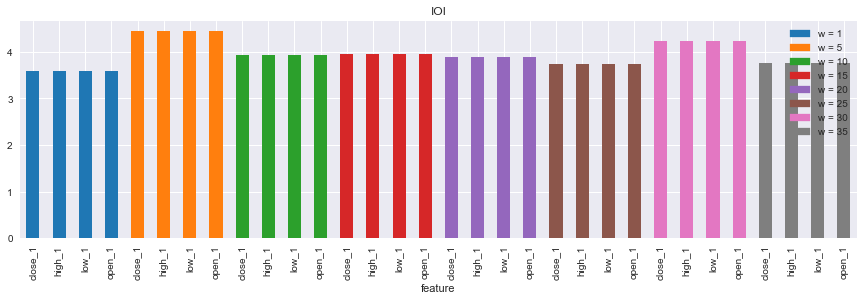

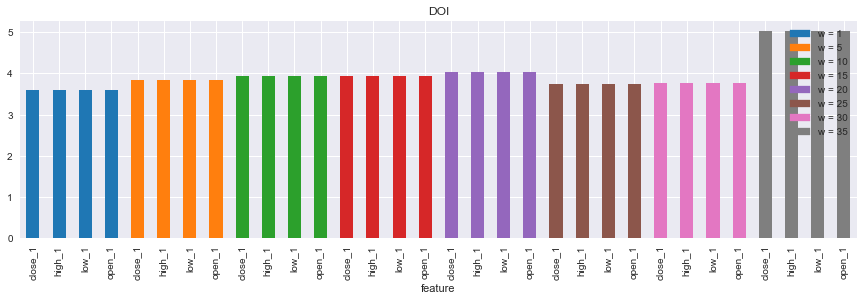

In [232]:
# 美股、原油相關資料再window = 1時，對預測第一天的資料效果非常強
interval = 0.5
get_compare_window(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate)

predict :5/19
data: 5/18 5/17 5/16 5/15 5/14 -> average -> 1, 2 ,3 ,4 (2013~2018)
close is1 is2 is3 is4

## Statistic table for 1 vs label

### day = 1

Noise rate is 5.648854961832061


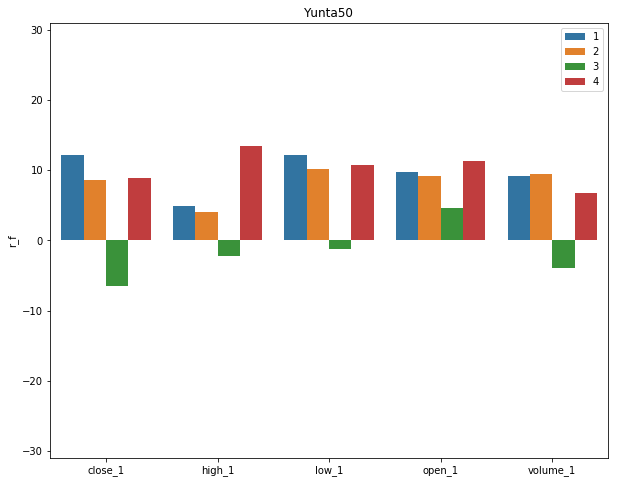

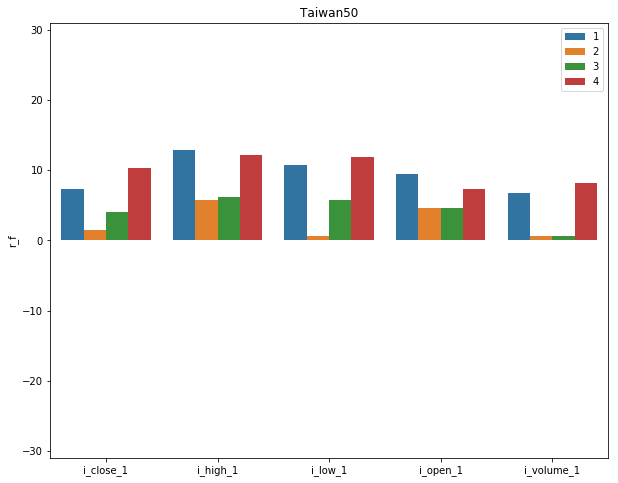

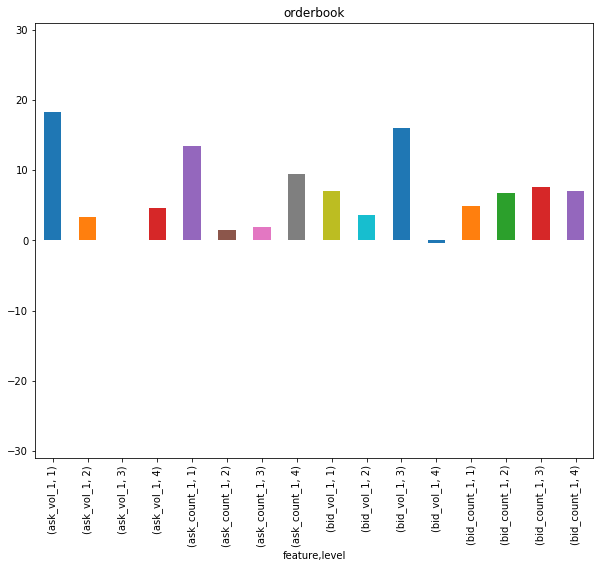

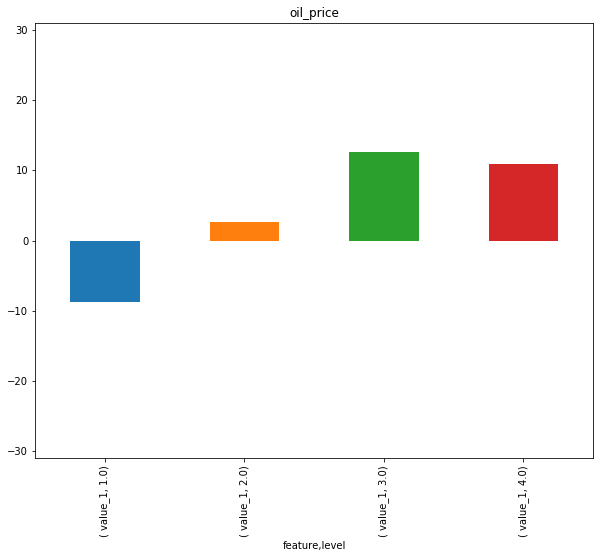

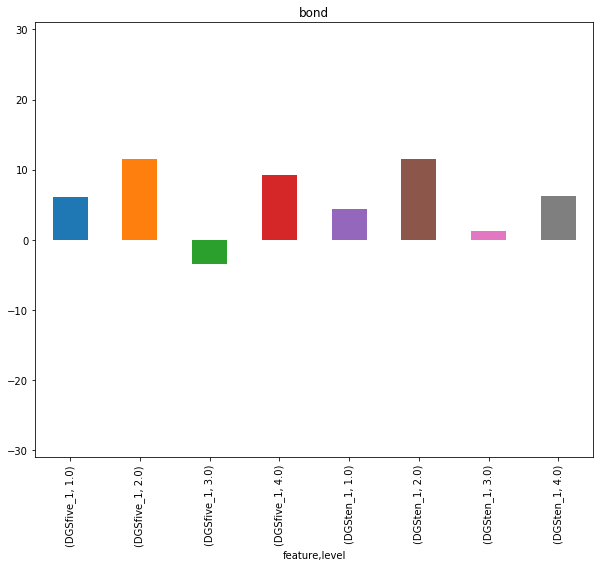

...

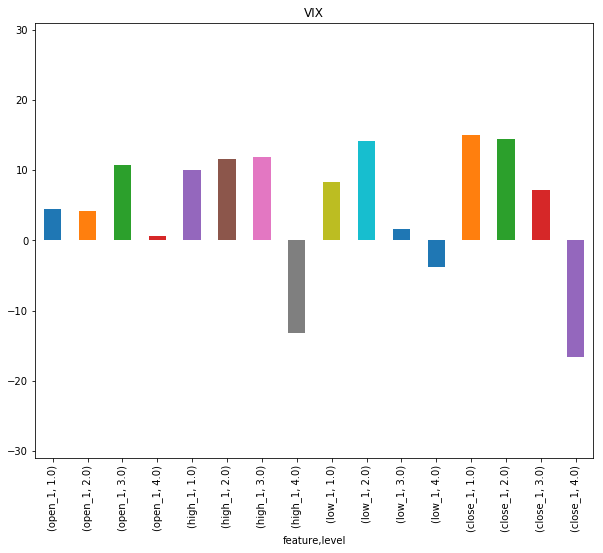

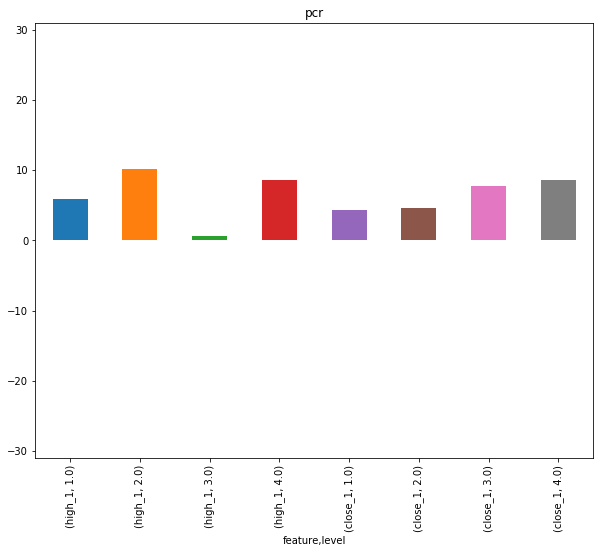

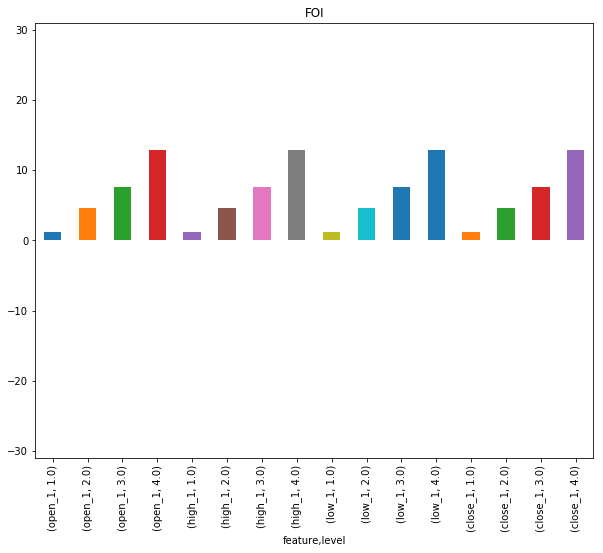

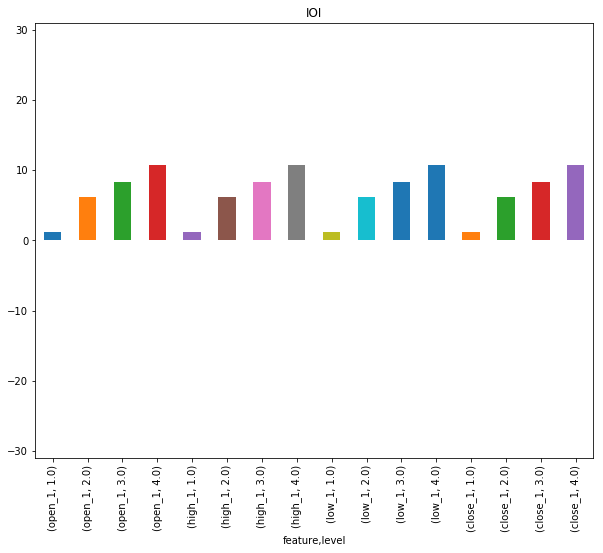

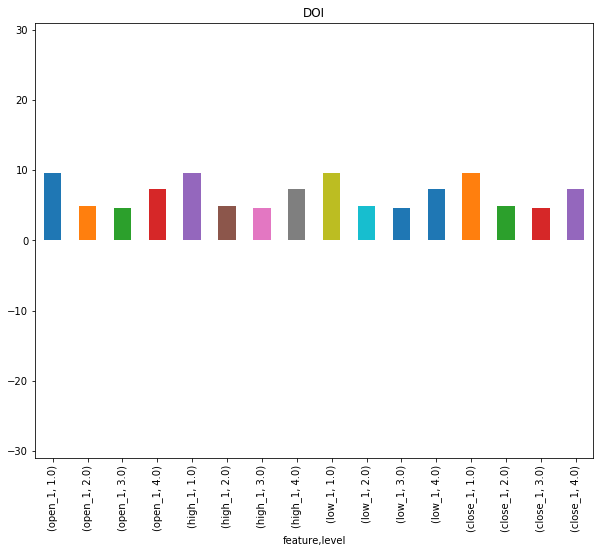

In [136]:
interval = 0
window = 5
df_return = get_all_stable(df_list,df_name,mrf,interval,Yunta50_rate,window)

Noise rate is 48.16793893129771


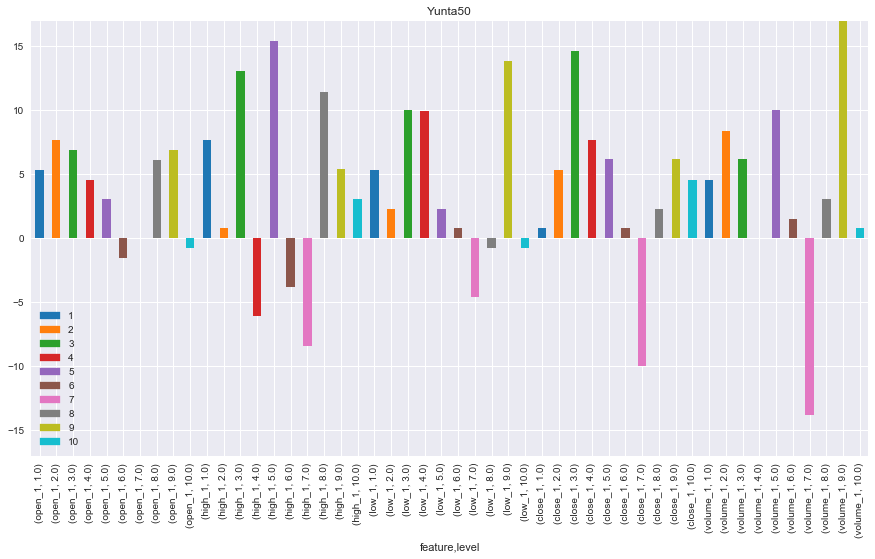

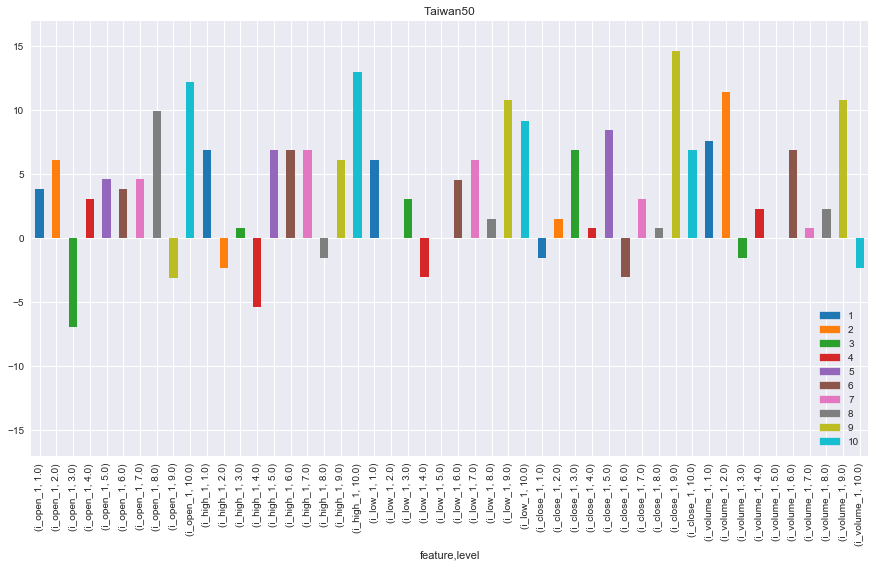

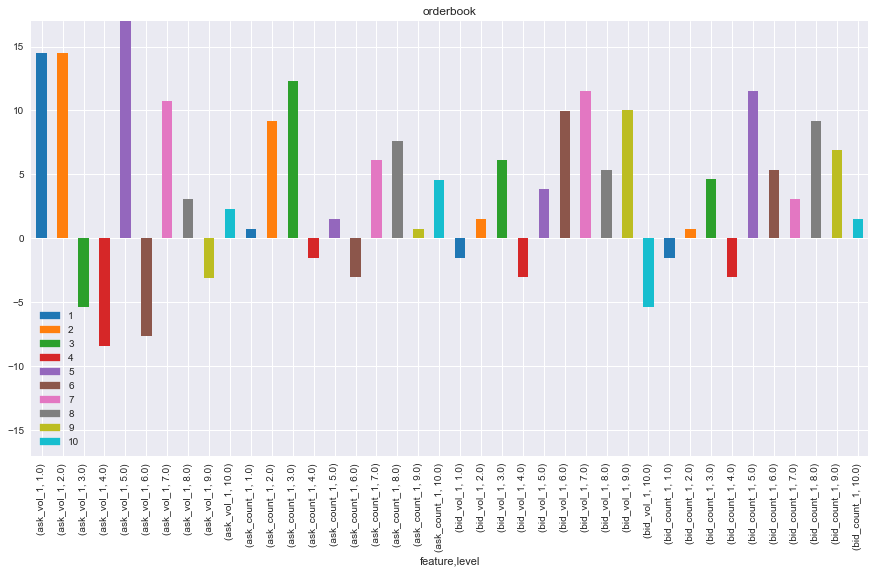

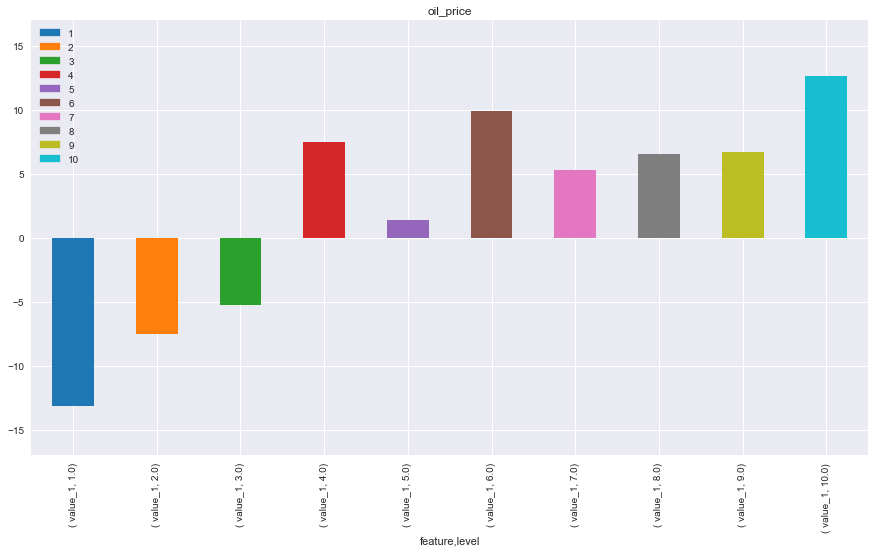

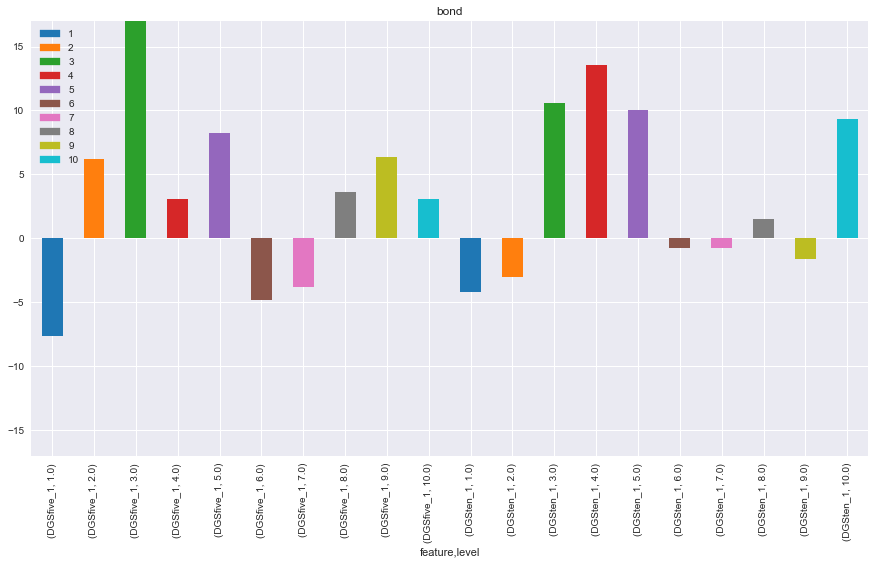

...

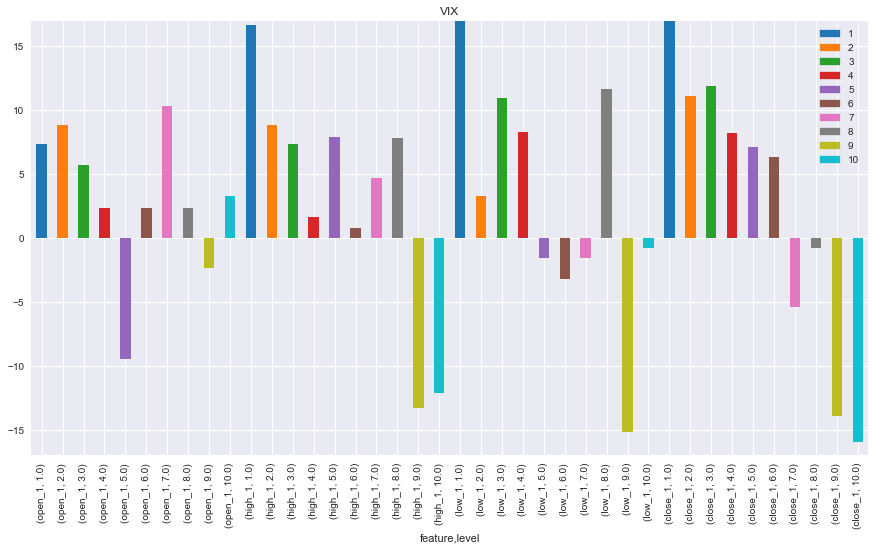

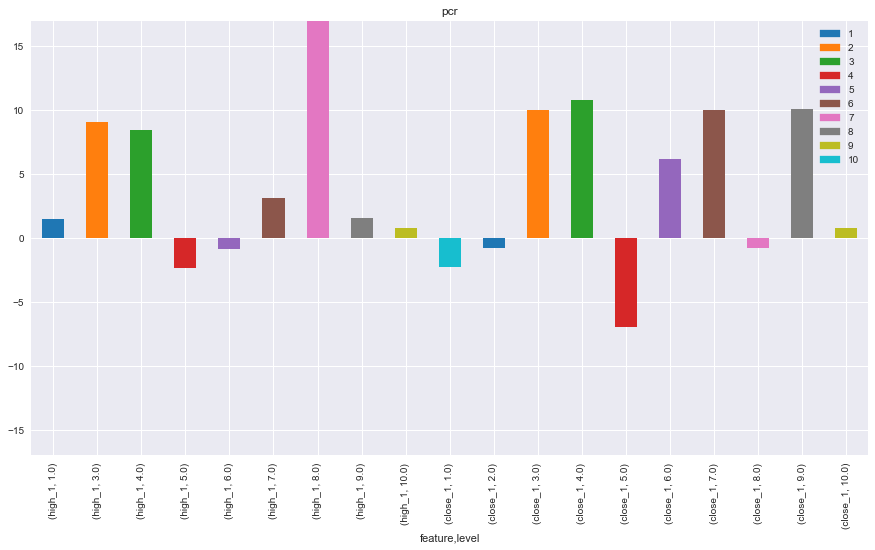

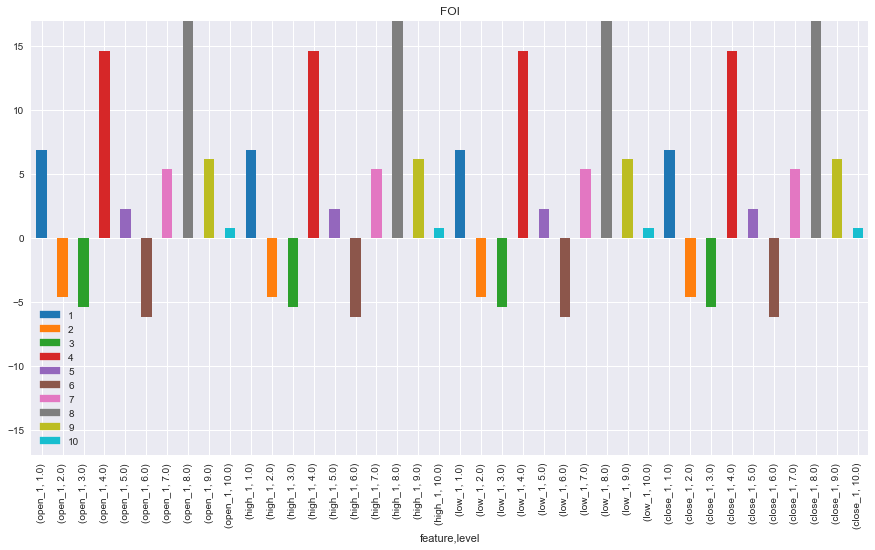

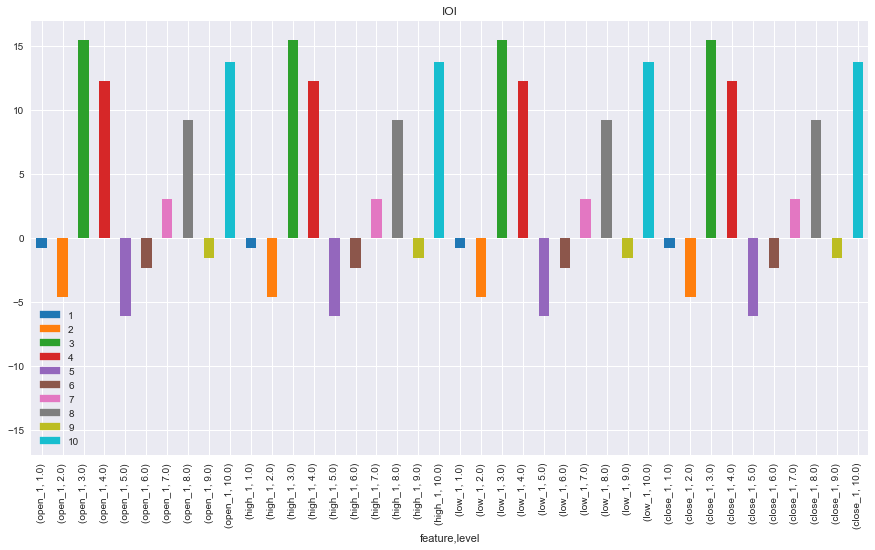

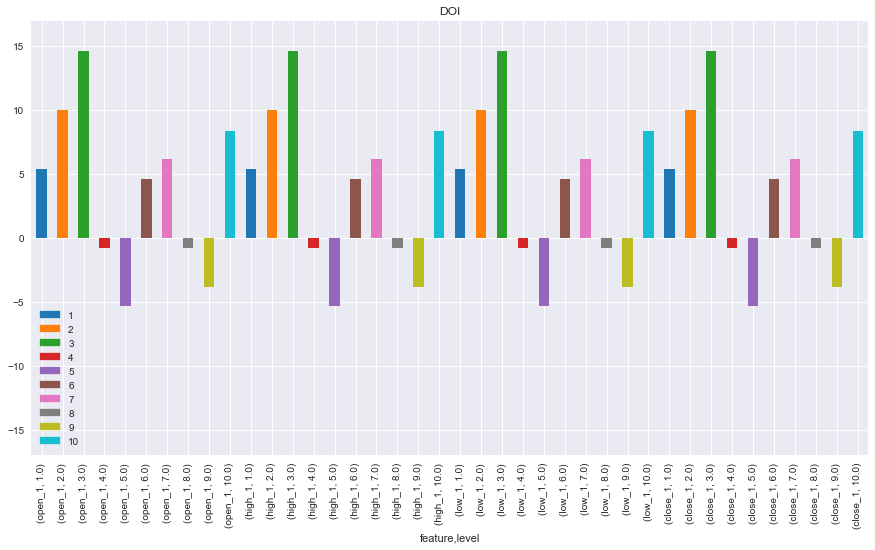

ValueError: cannot copy sequence with size 50 to array axis with dimension 5

In [142]:
#TXF is better on the rise but worse on the fall
#pcr,FOI,IOI is better a lot
interval = 0.5
window = 5
ca = 10
df_return_1 = get_all_stable(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = ca)

Noise rate is 48.16793893129771


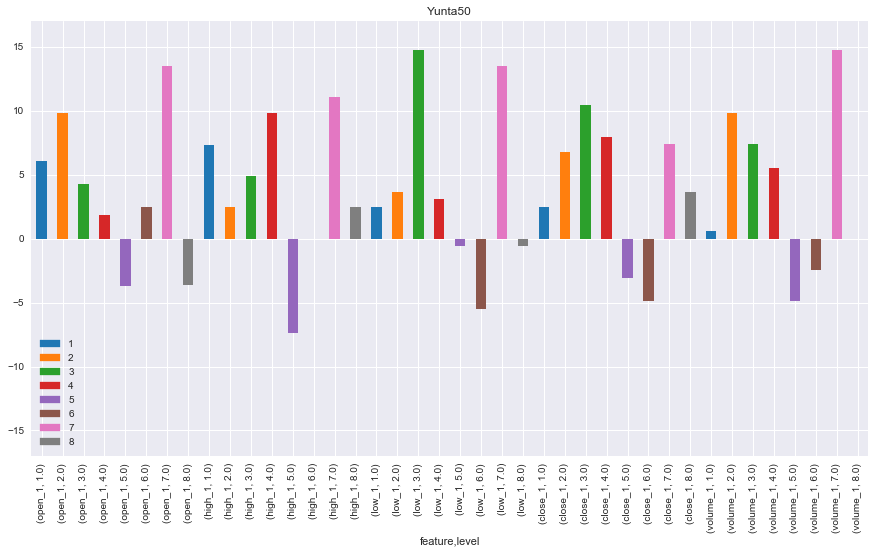

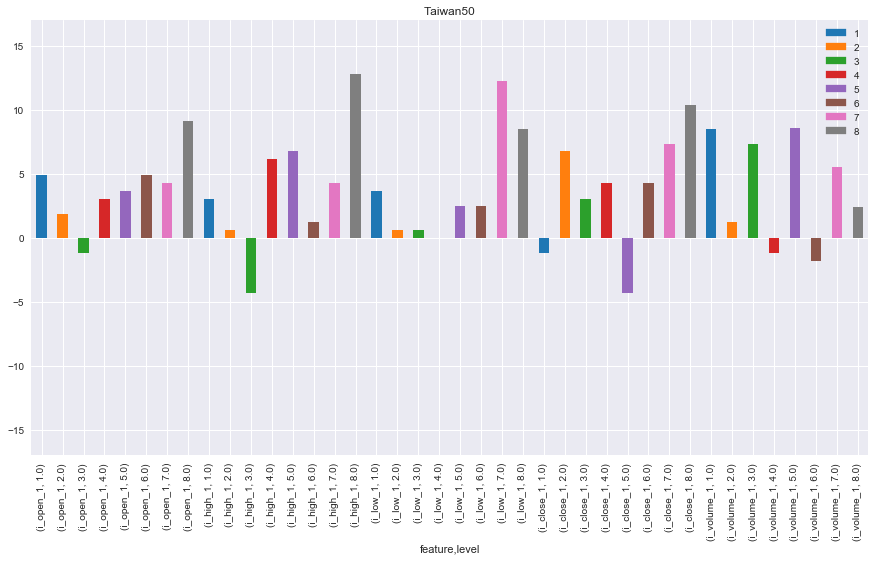

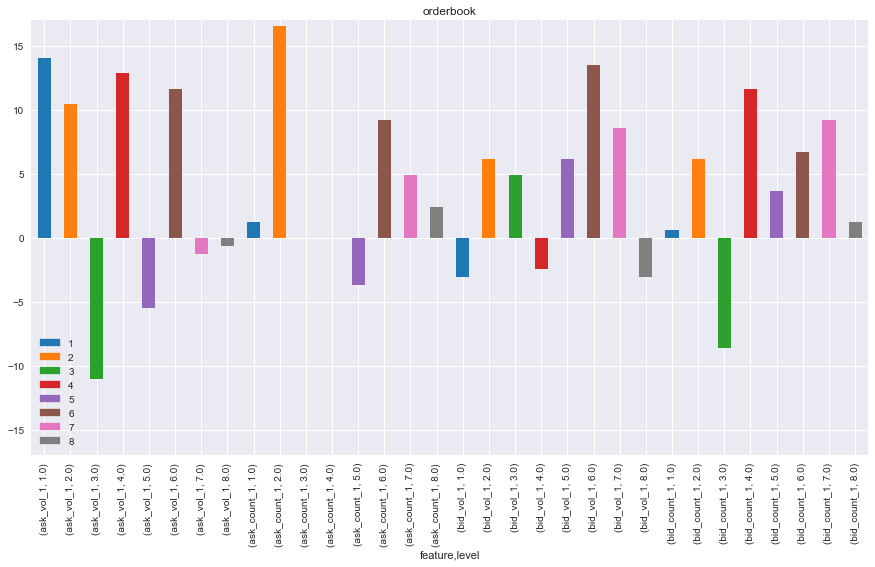

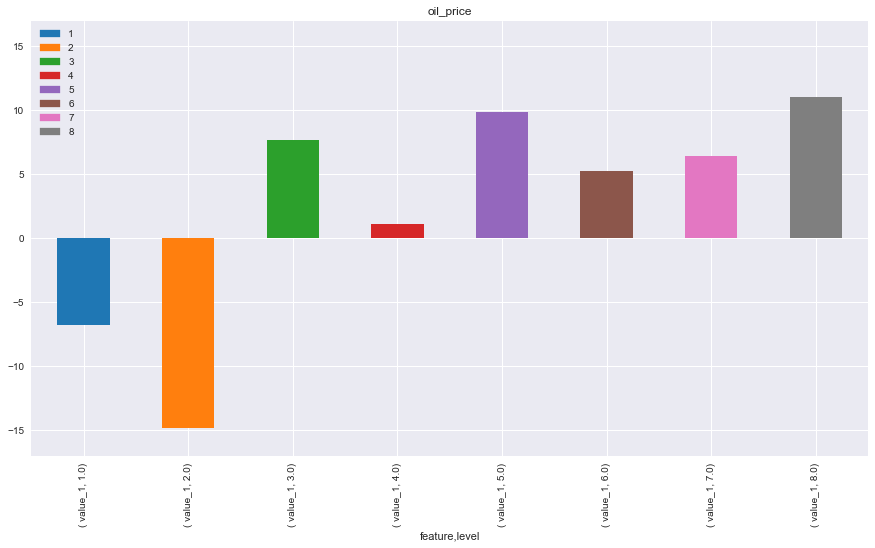

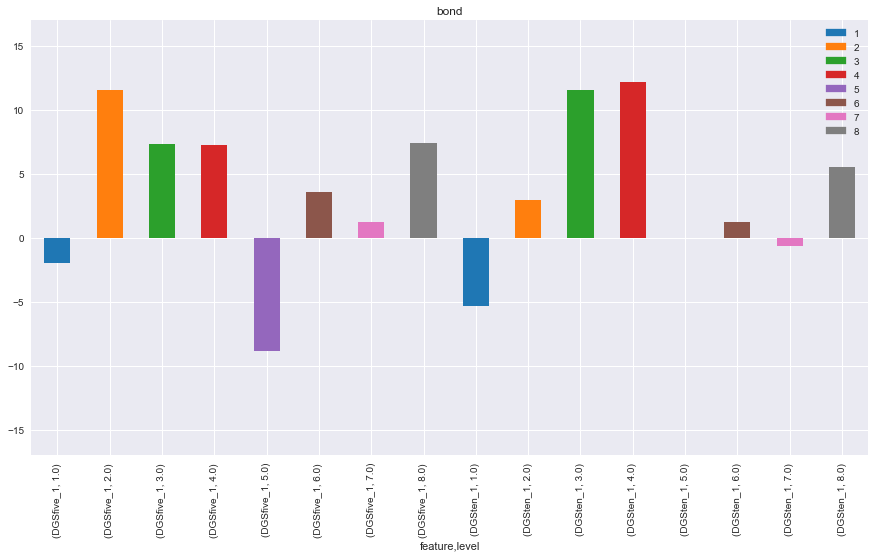

...

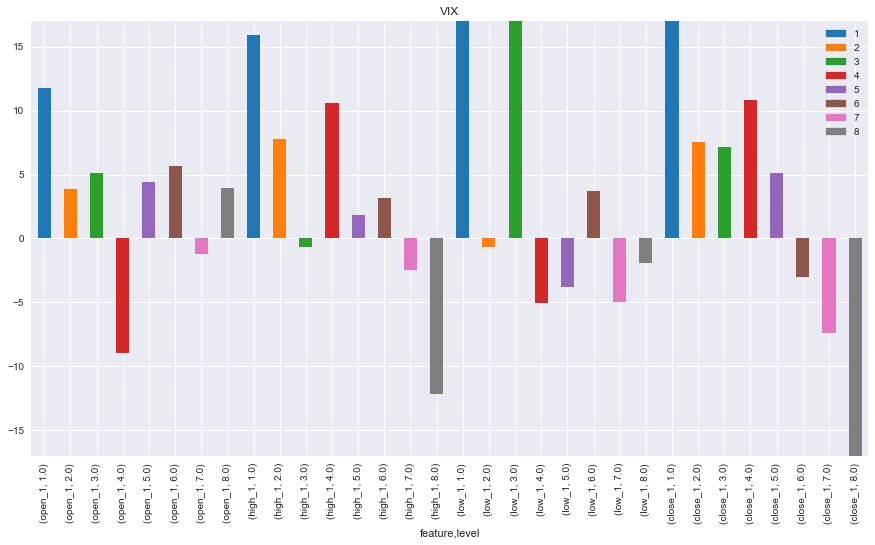

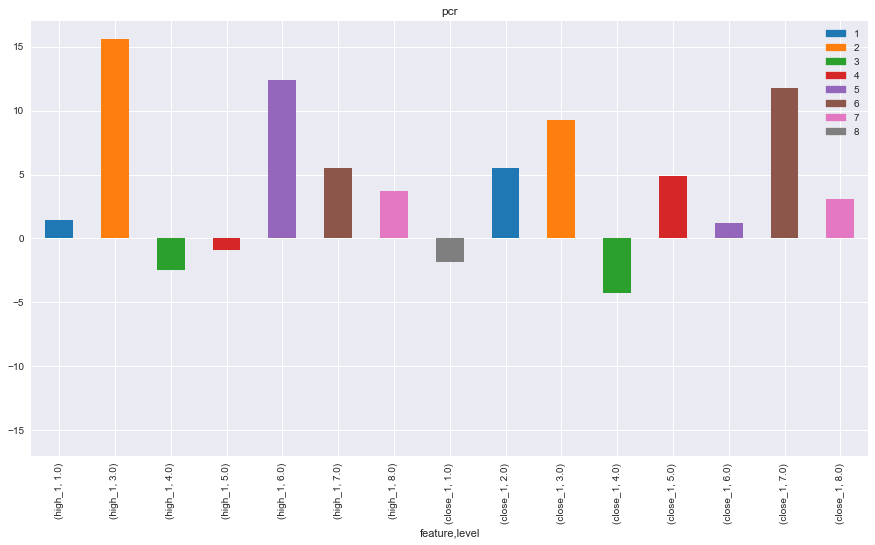

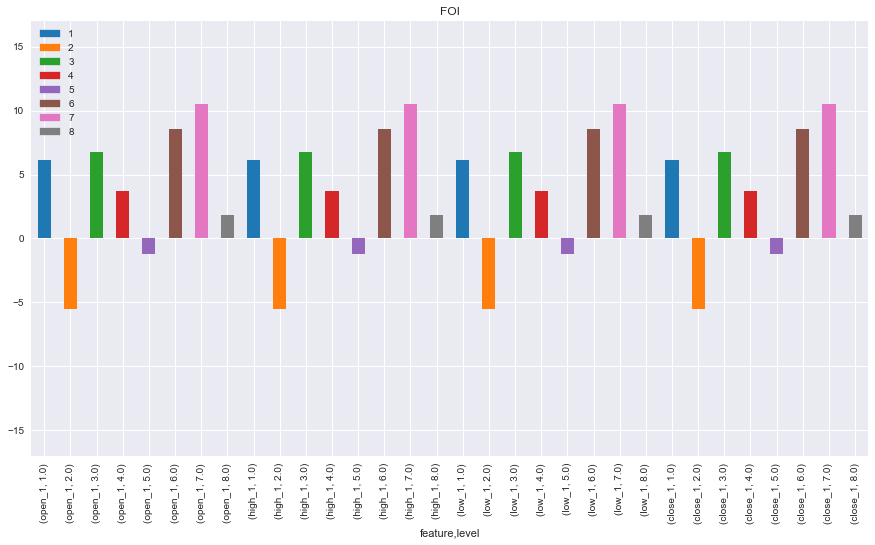

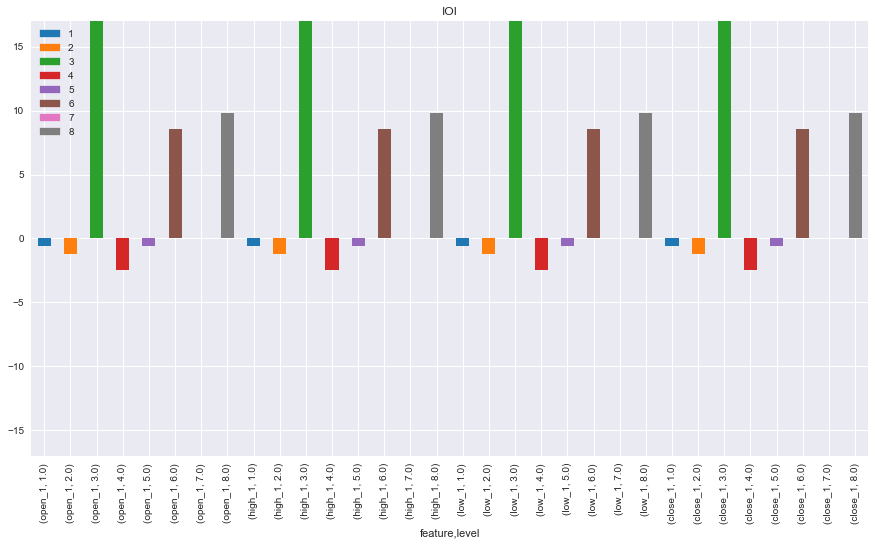

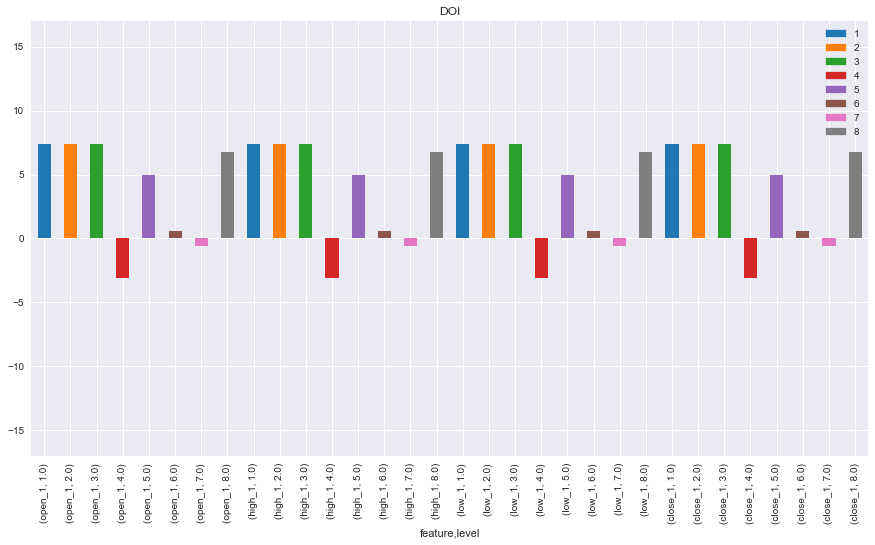

In [119]:
interval = 0.5
window = 5
ca = 8
df_return_1 = get_all_stable(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = ca)

Noise rate is 48.16793893129771


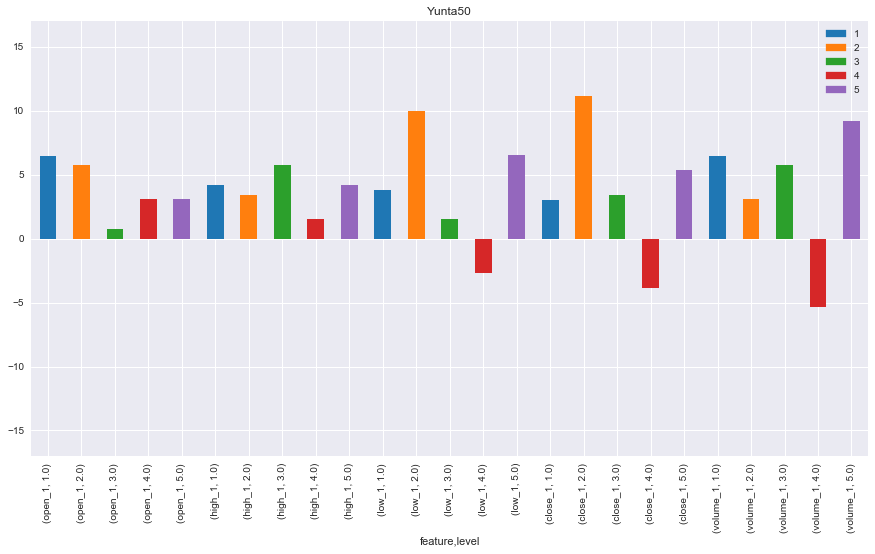

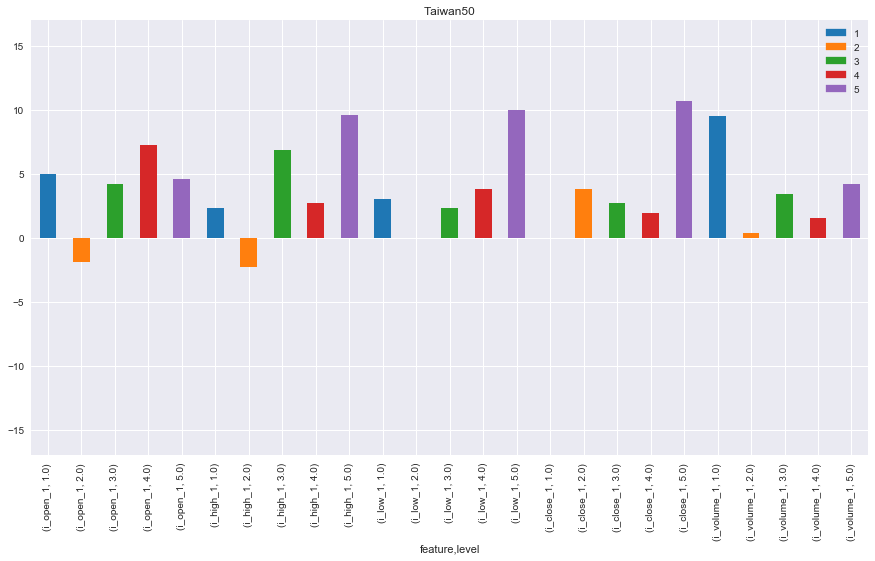

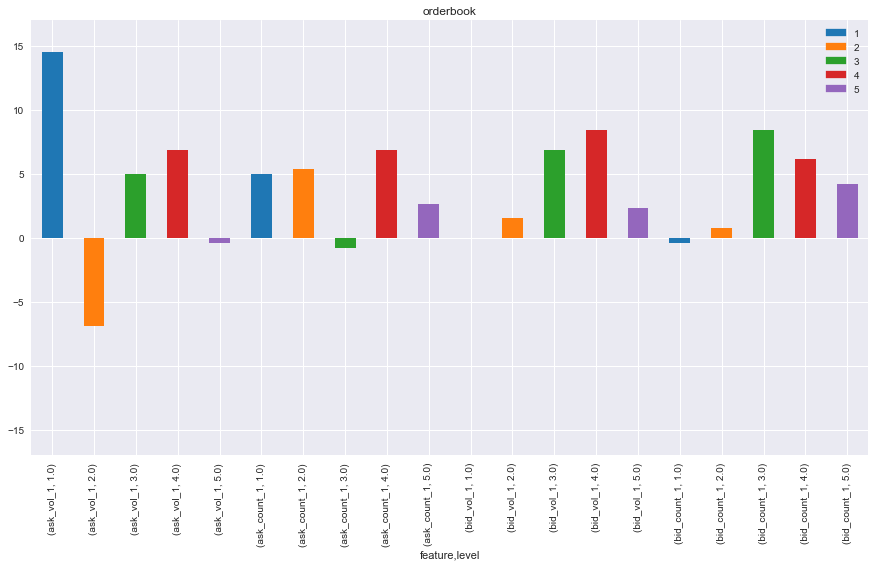

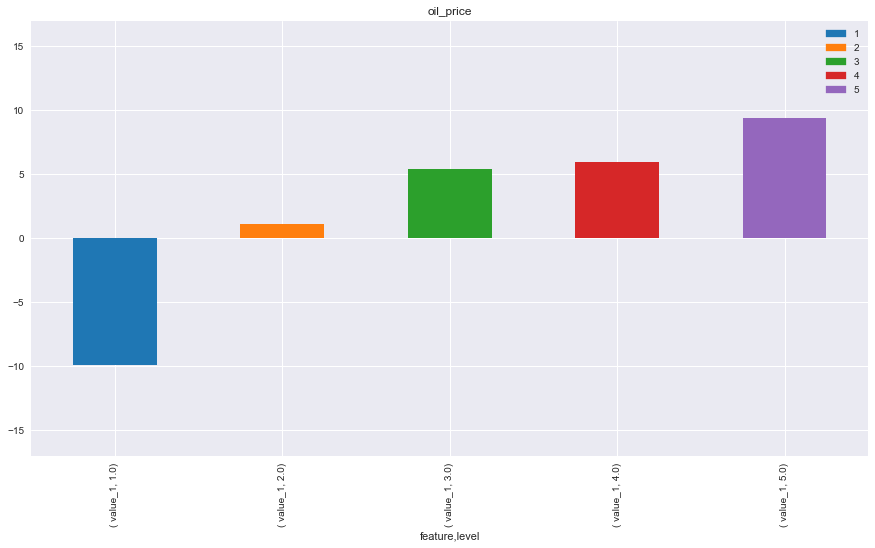

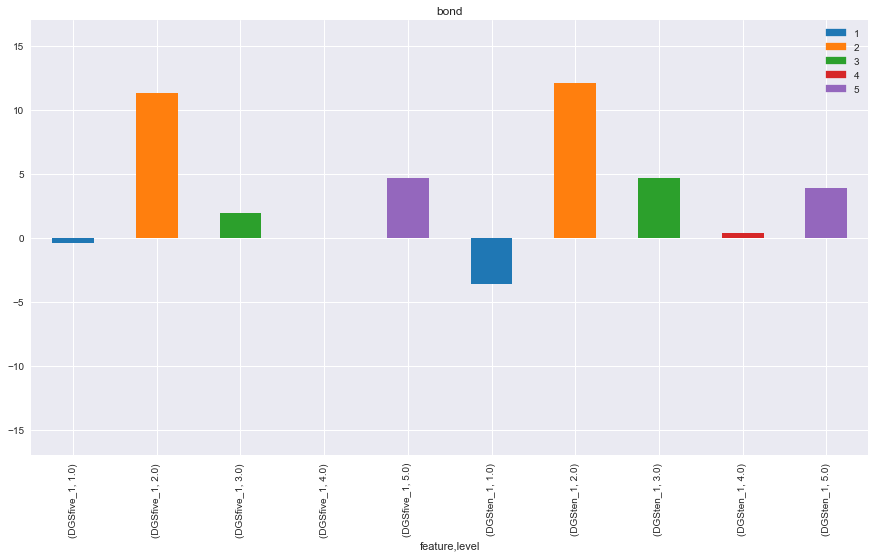

...

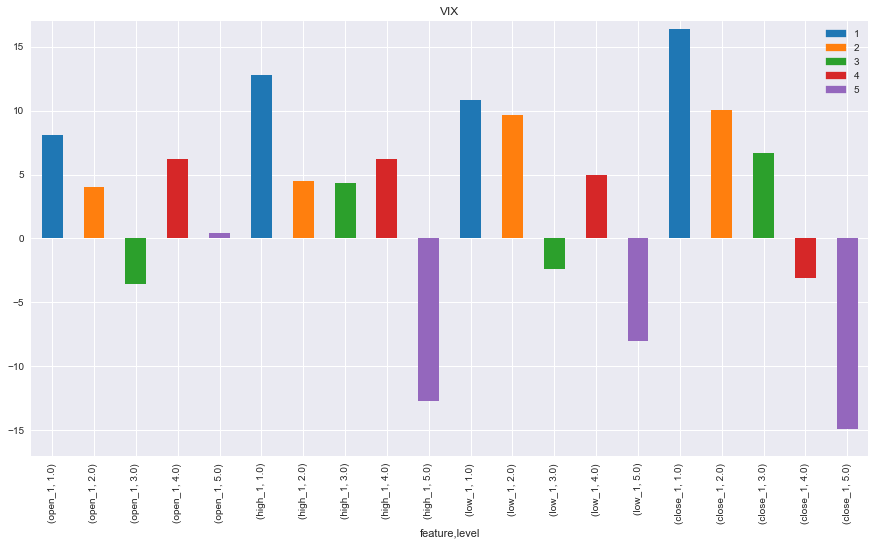

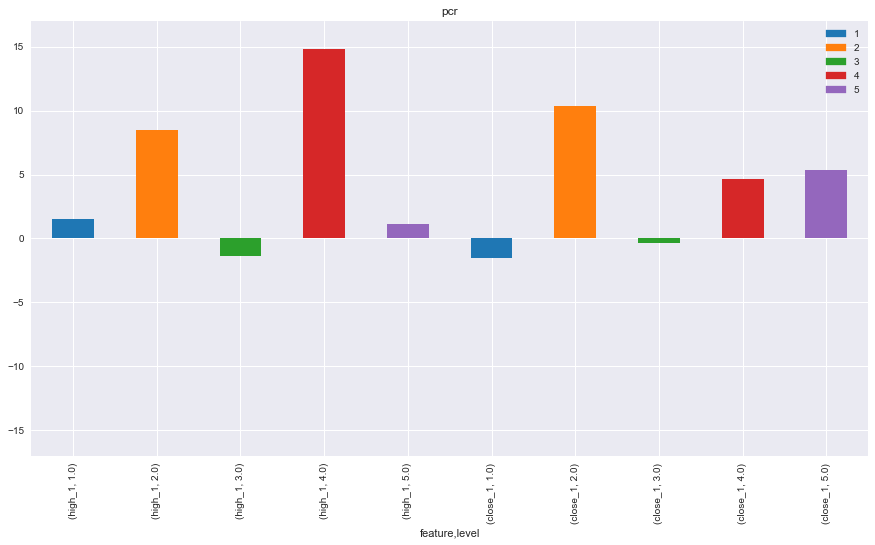

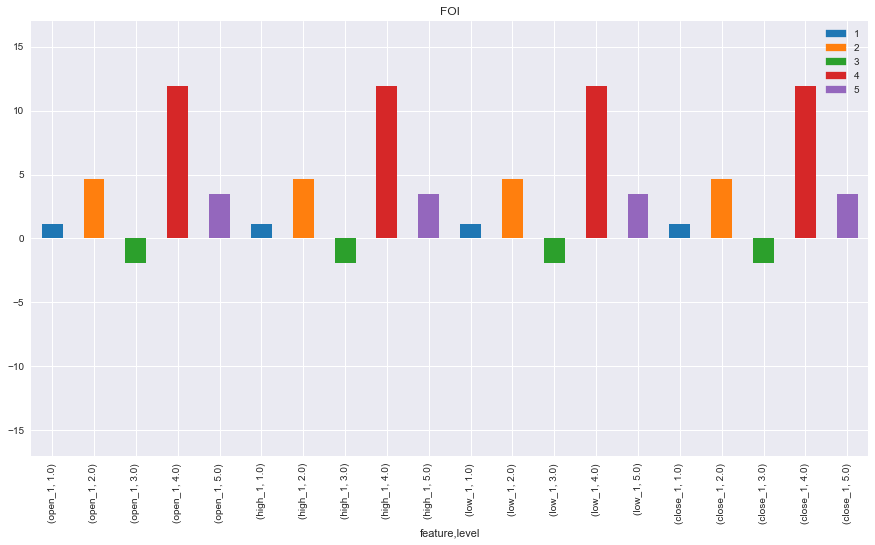

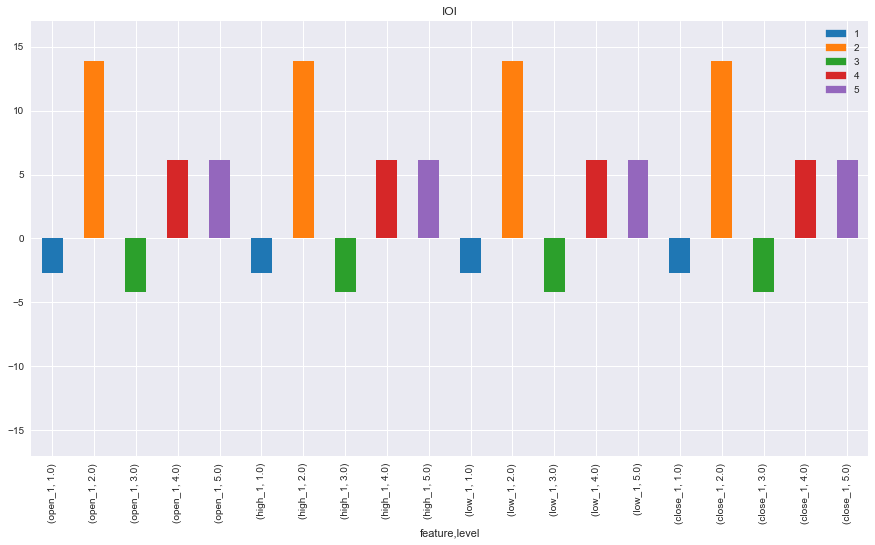

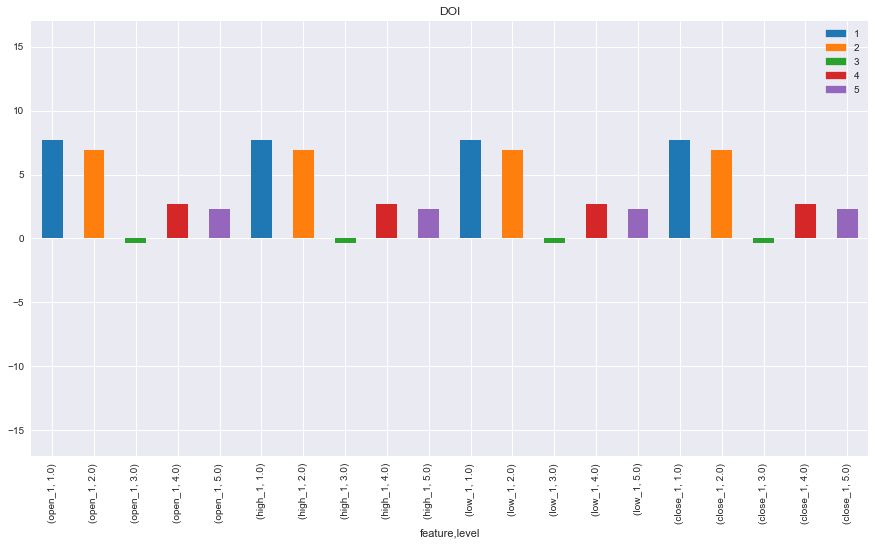

In [85]:
#TXF is better on the rise but worse on the fall
#pcr,FOI,IOI is better a lot
interval = 0.5
window = 5
ca = 5
df_return_1 = get_all_stable(df_list,df_name,df_rate_1,mrf,interval,Yunta50_rate,window,ca = ca)

Noise rate is 48.16793893129771


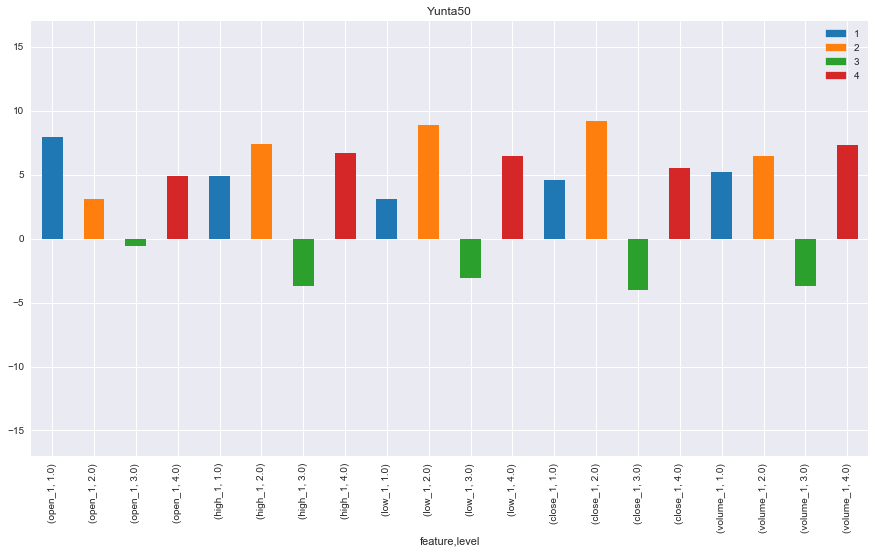

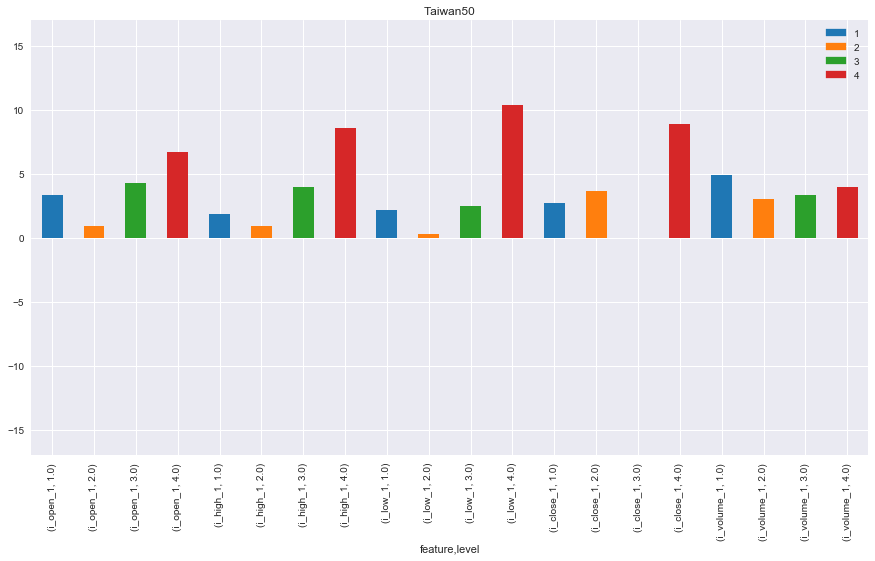

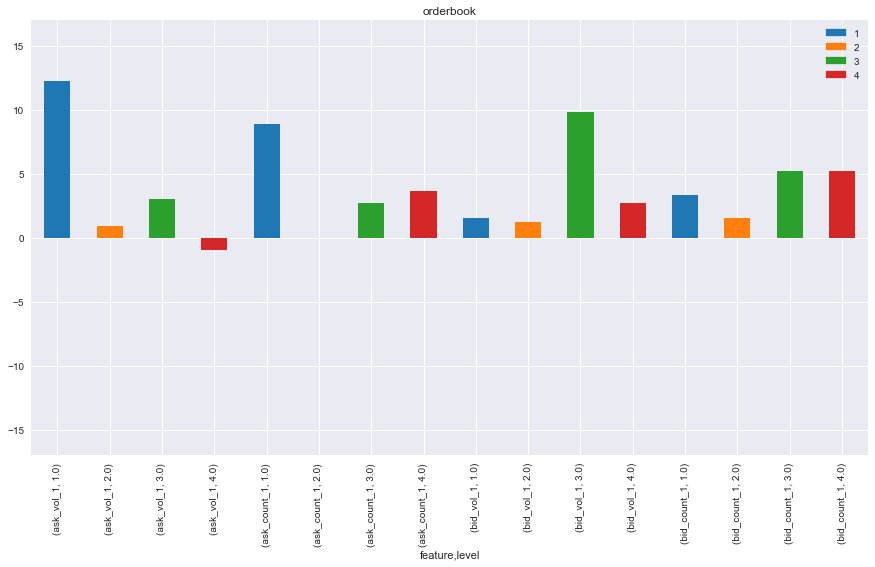

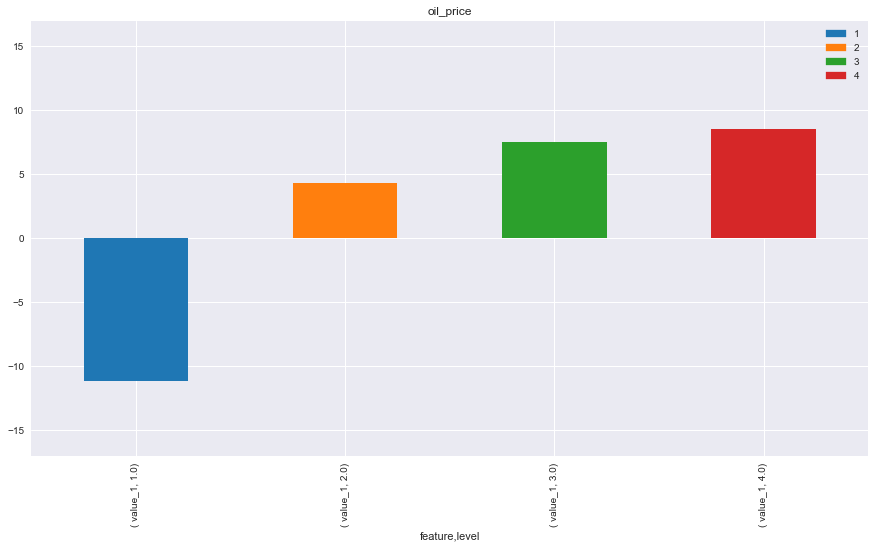

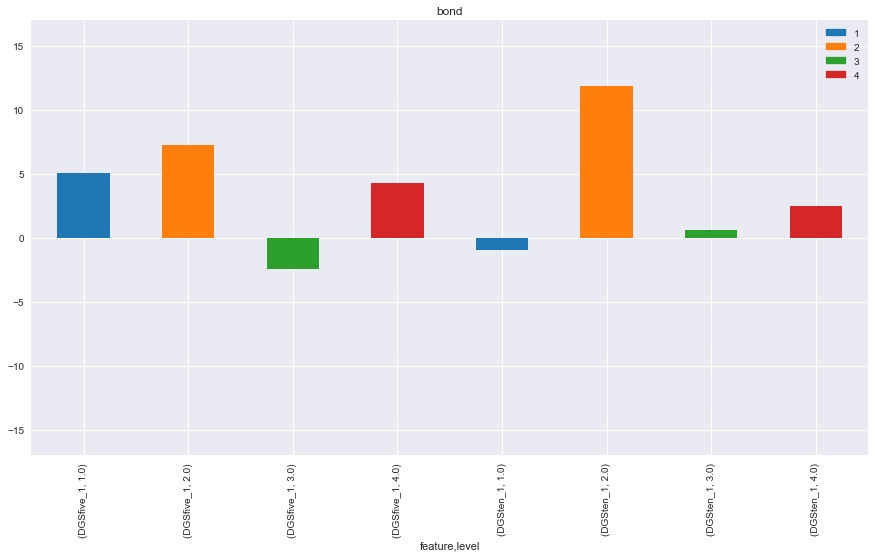

...

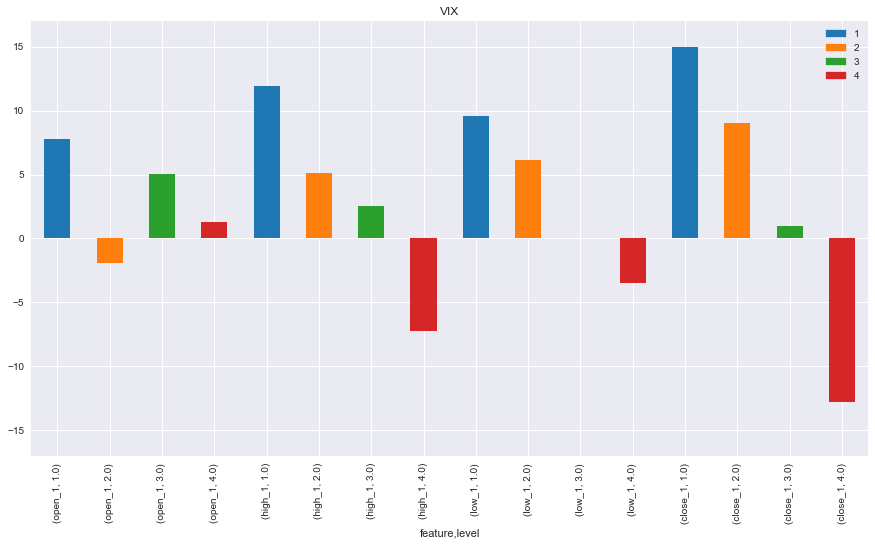

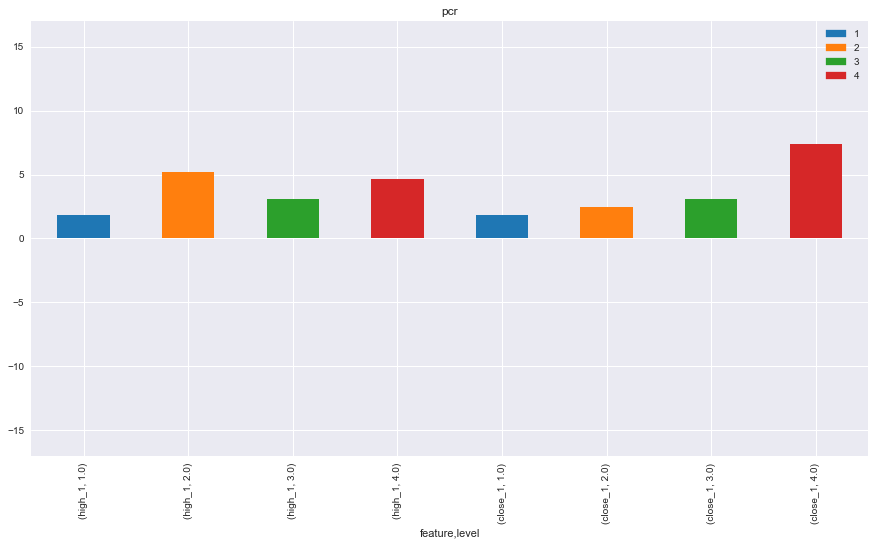

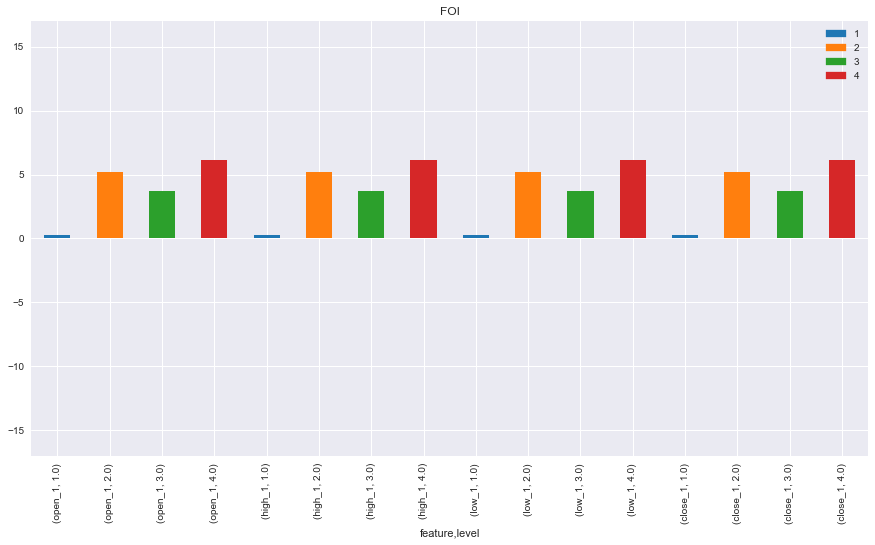

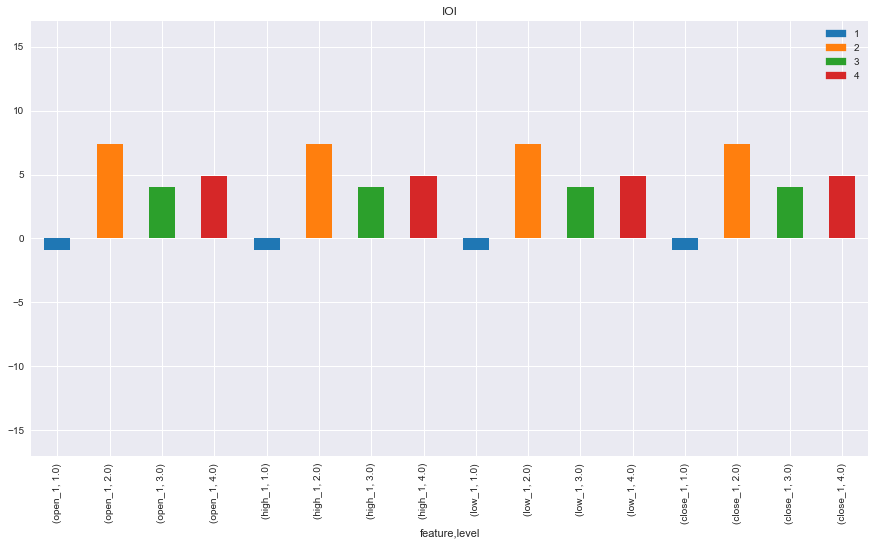

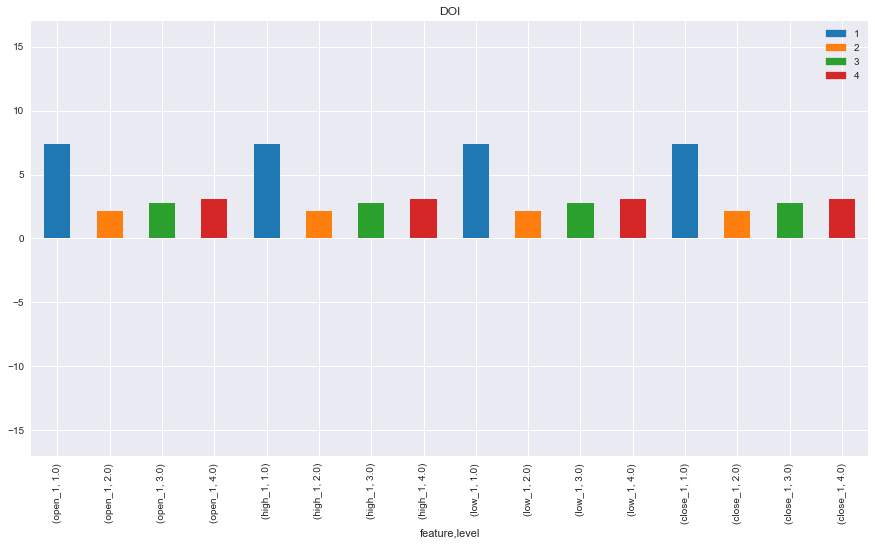

In [122]:
#pcr,E_F,Nikkie,DOI is better when use pure value
#VIX is better when use rate value
interval = 0.5
window = 5
df_return_1 = get_all_stable(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window)

Noise rate is 48.16793893129771


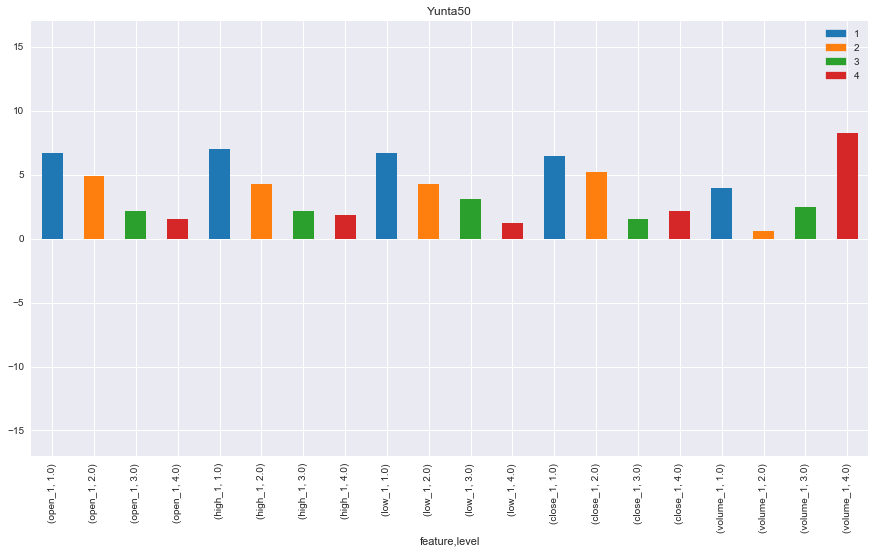

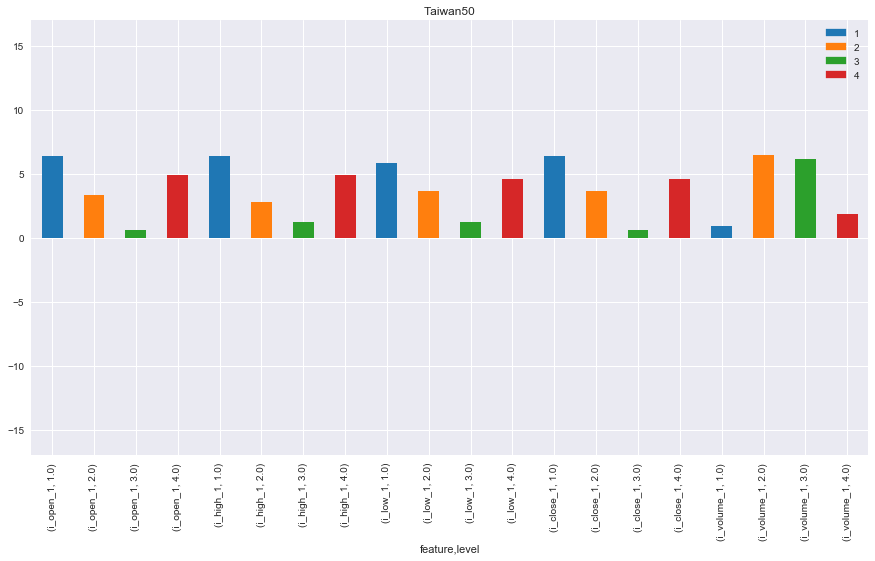

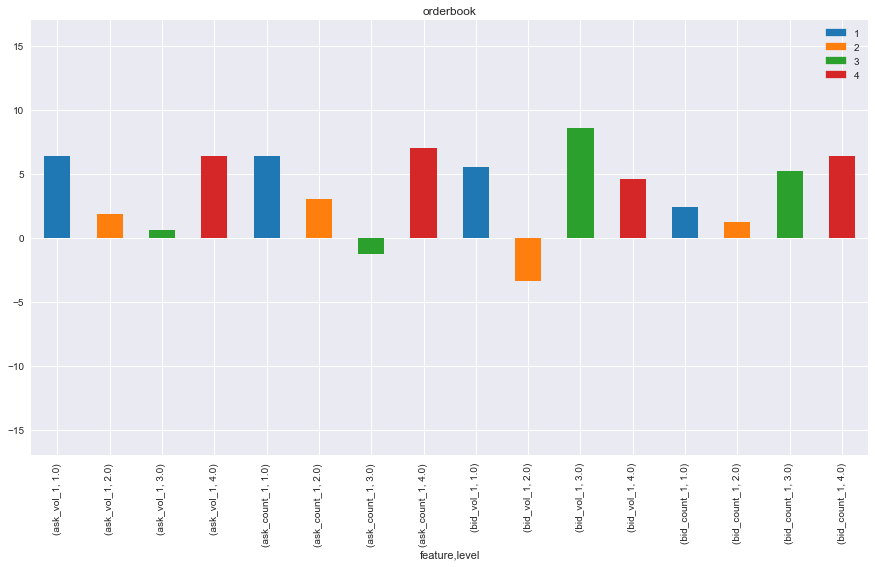

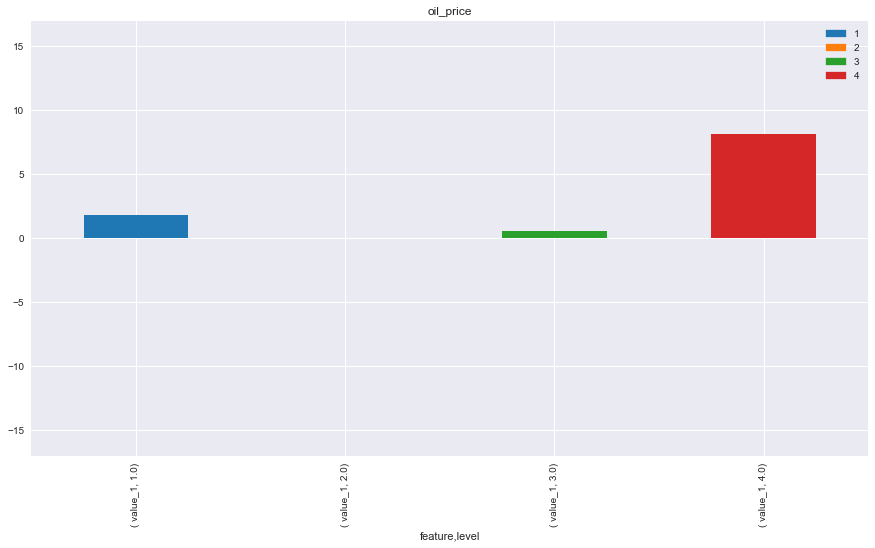

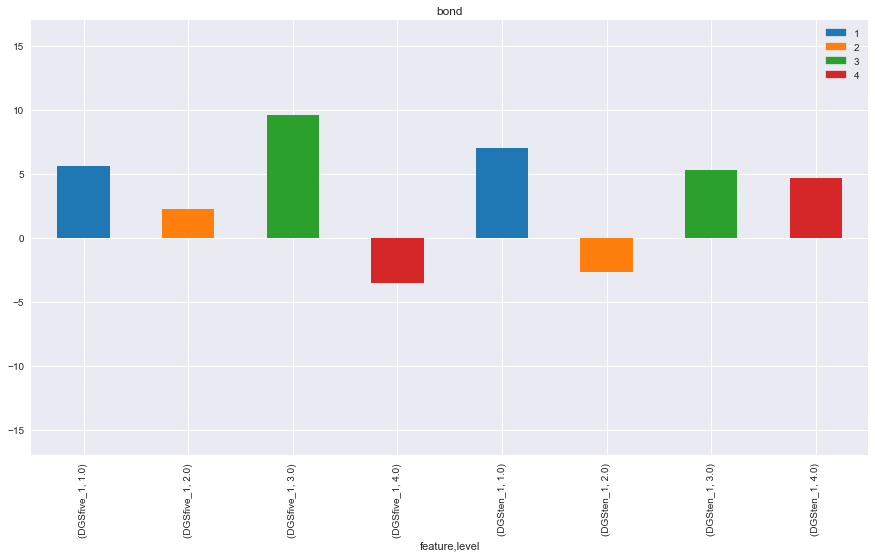

...

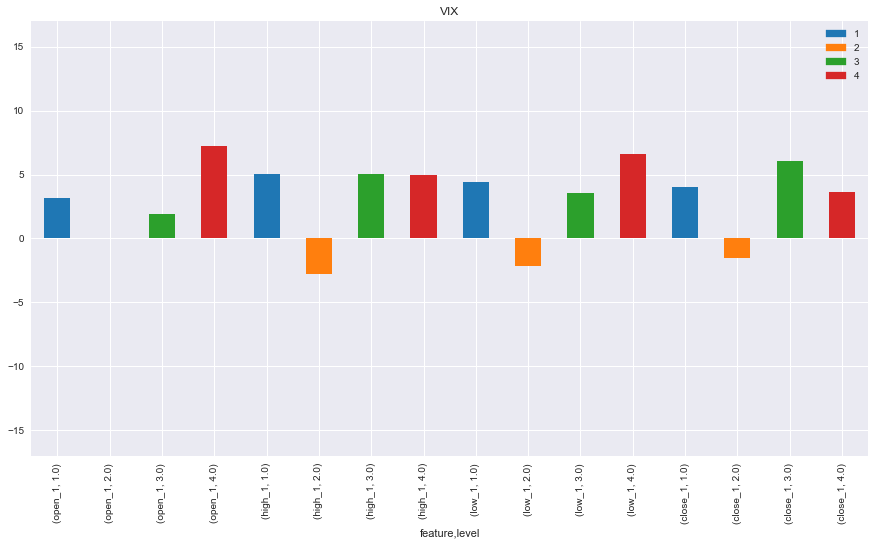

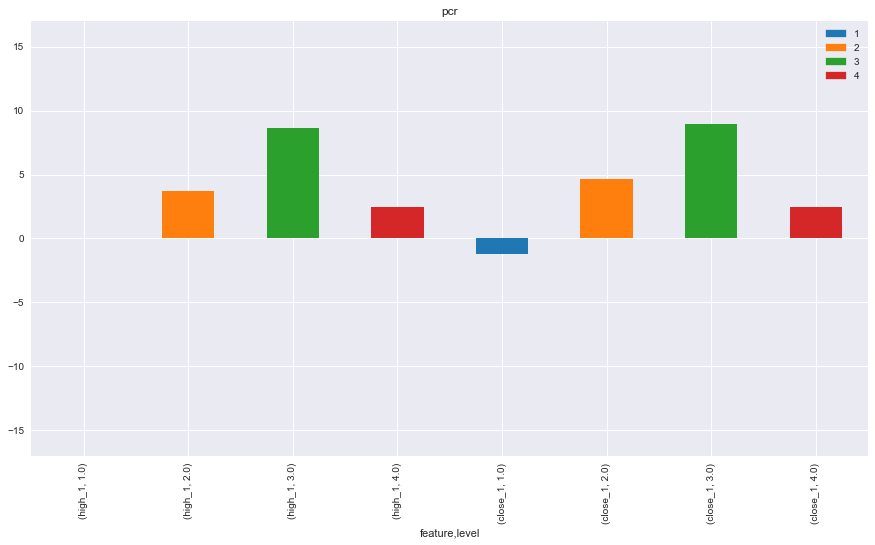

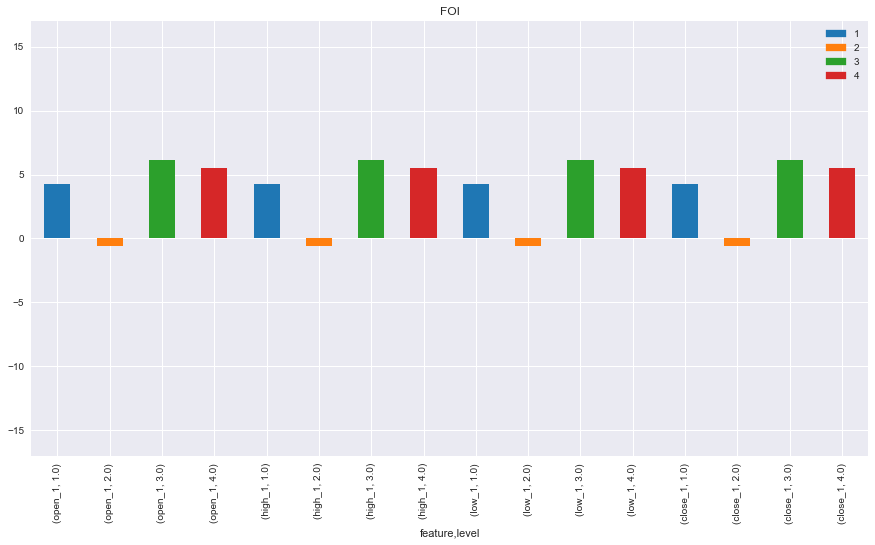

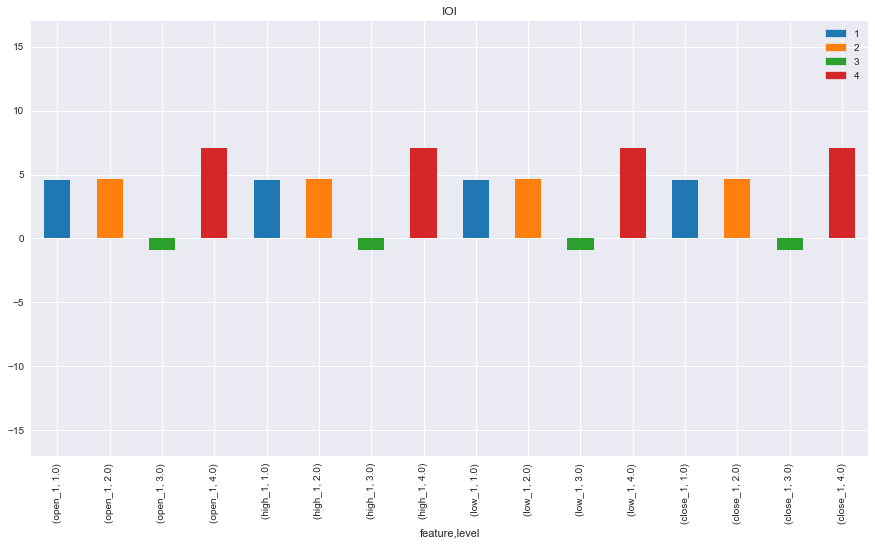

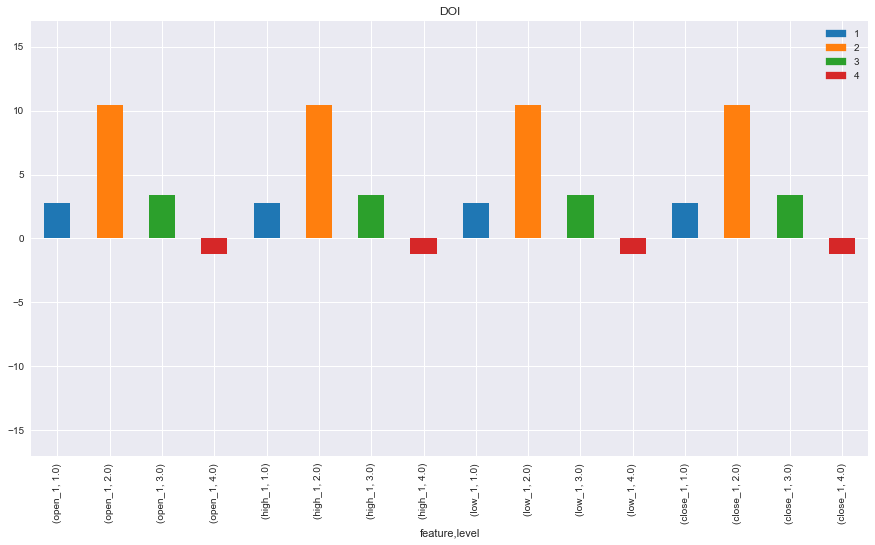

In [123]:
interval = 0.5
window = 5
df_return_1 = get_all_stable(df_list,df_name,df_allvalue,mrf,interval,Yunta50_rate,window)

Noise rate is 48.16793893129771


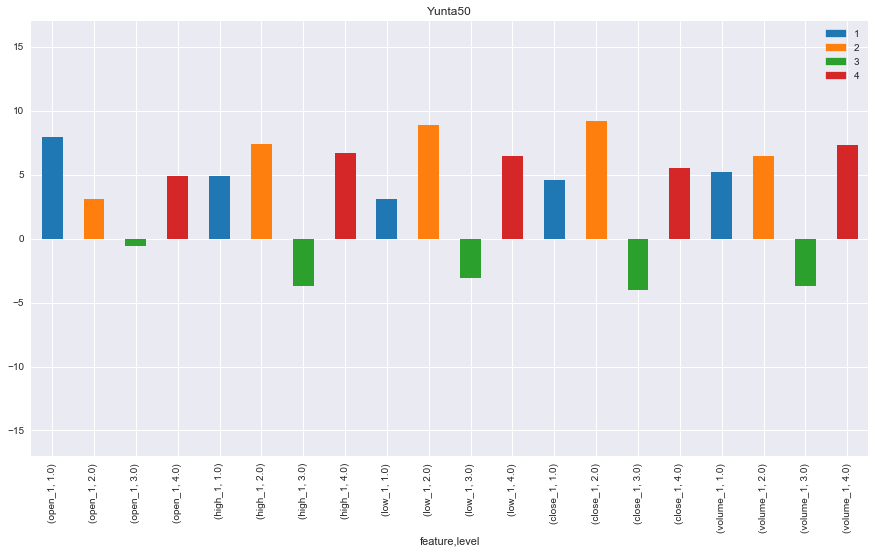

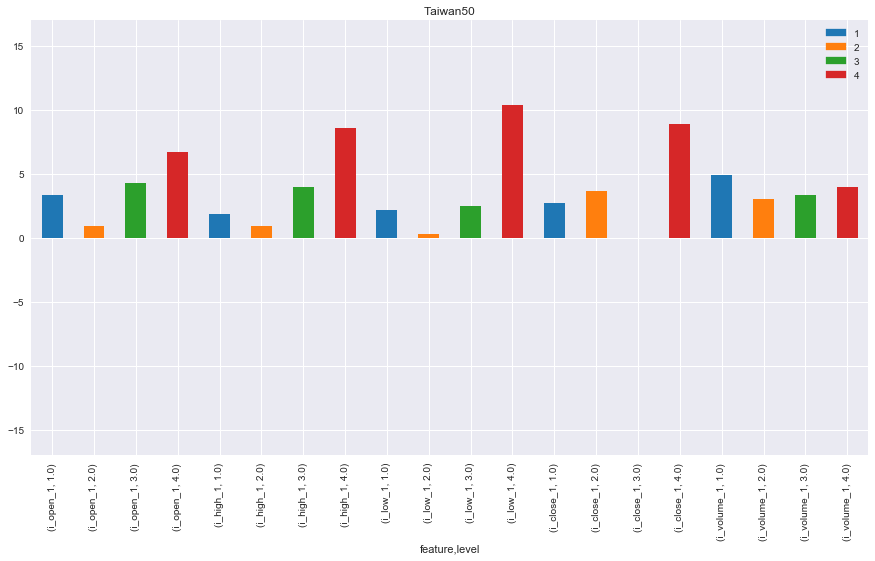

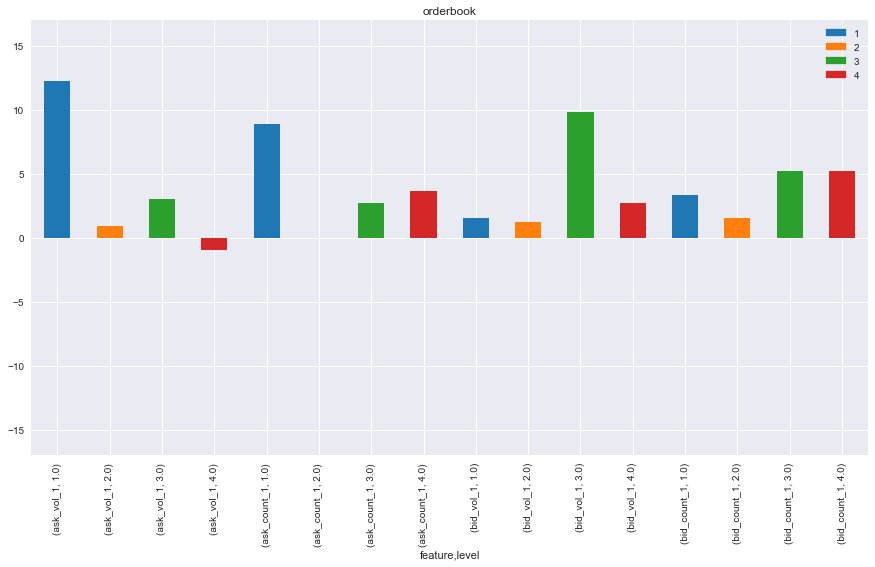

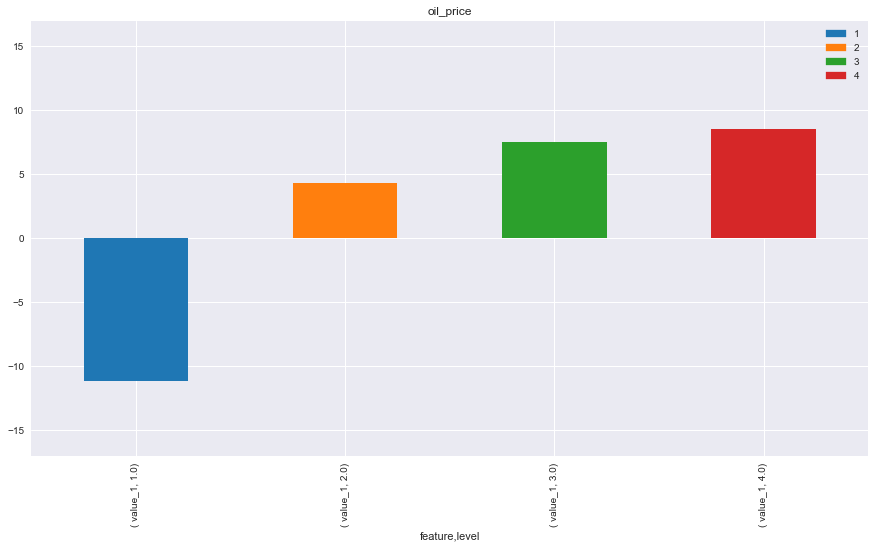

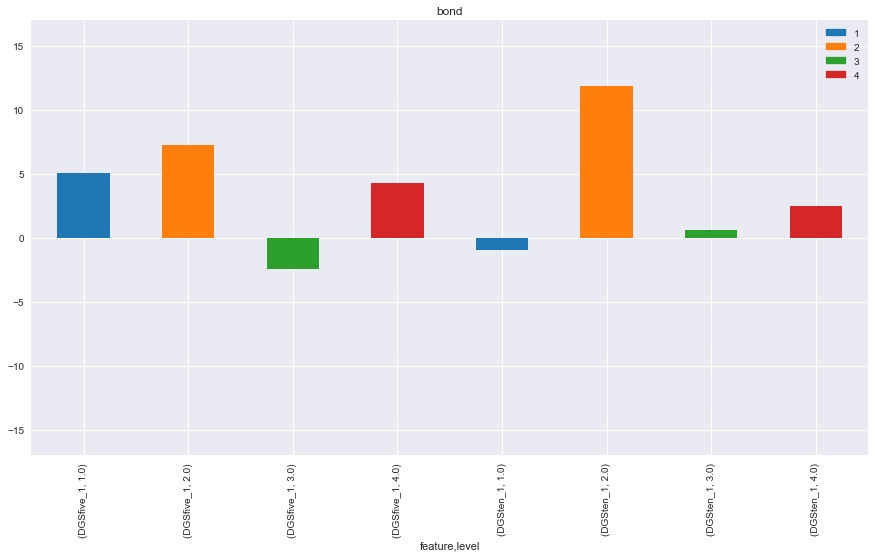

...

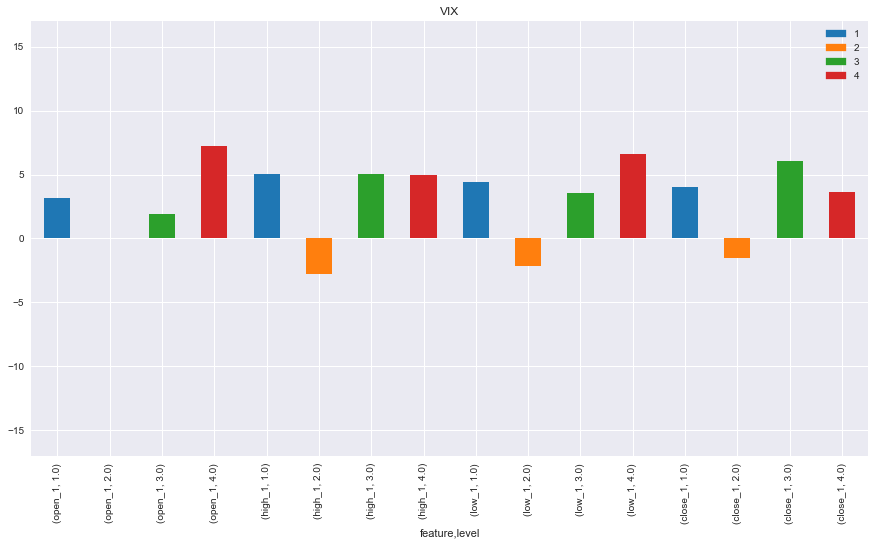

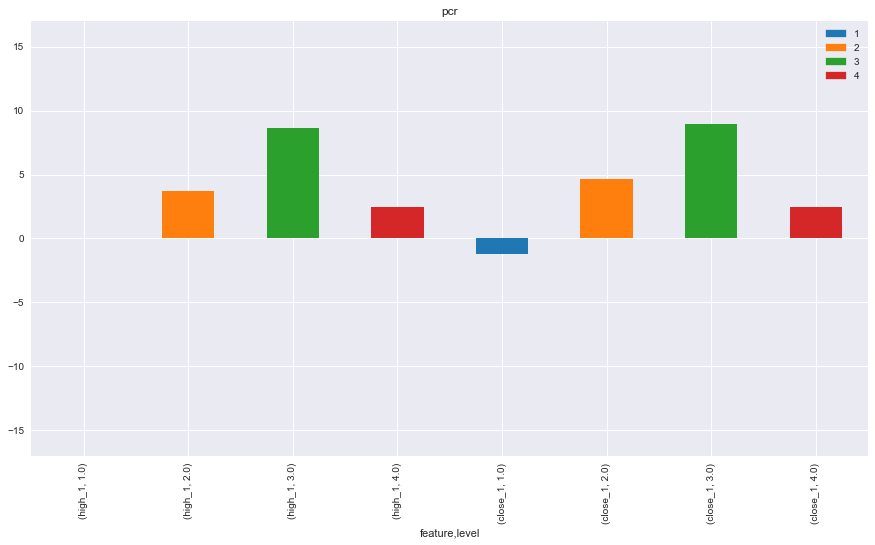

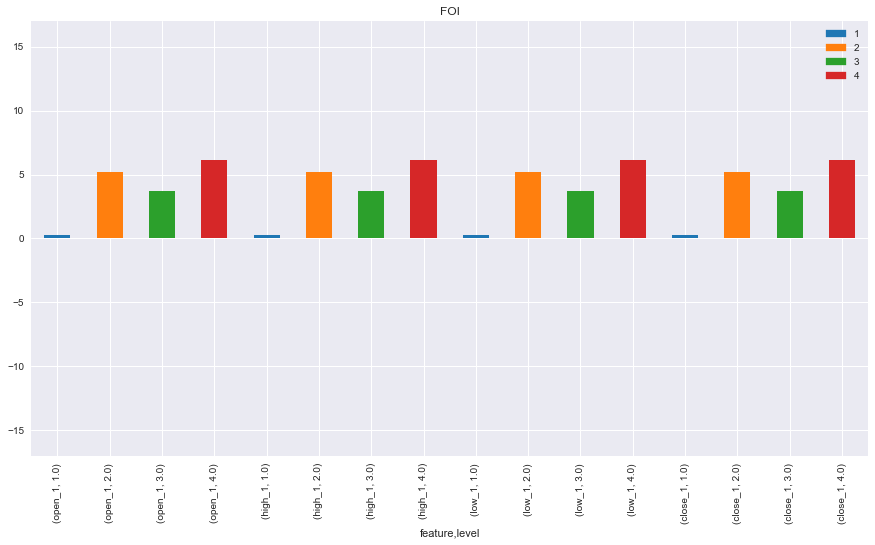

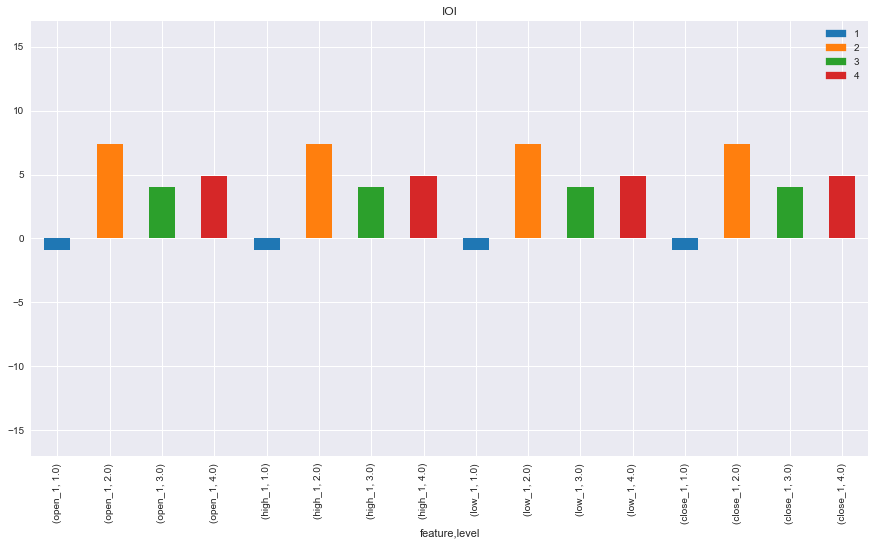

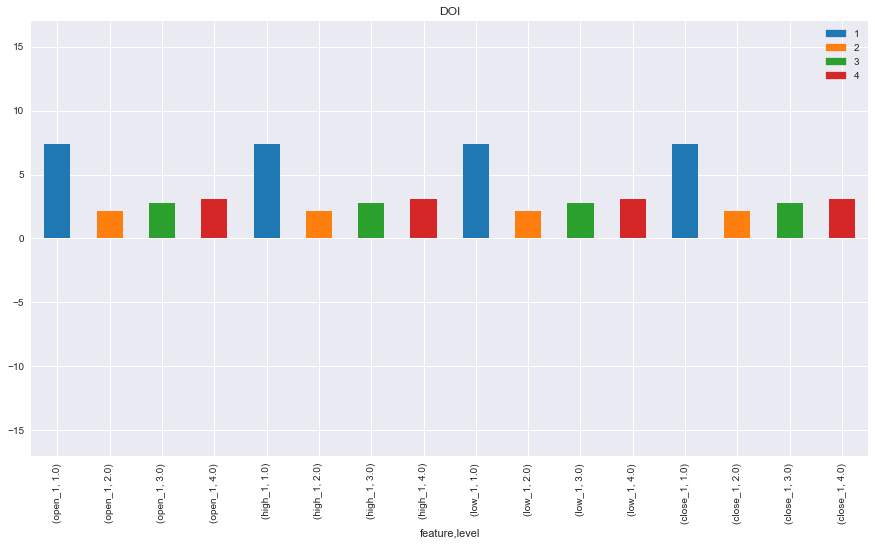

In [127]:
interval = 0.5
window = 5
df_return_1 = get_all_stable(df_list,df_name,df_option,mrf,interval,Yunta50_rate,window)

Noise rate is 73.84030418250951


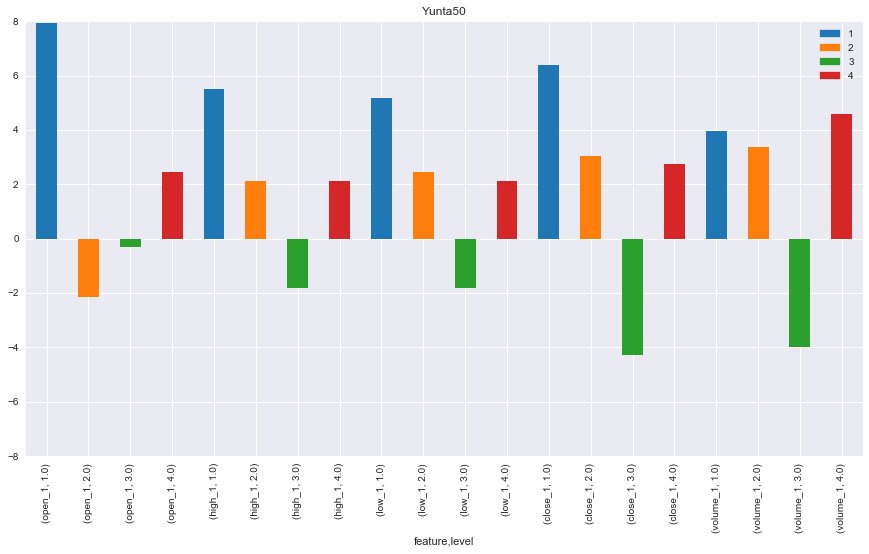

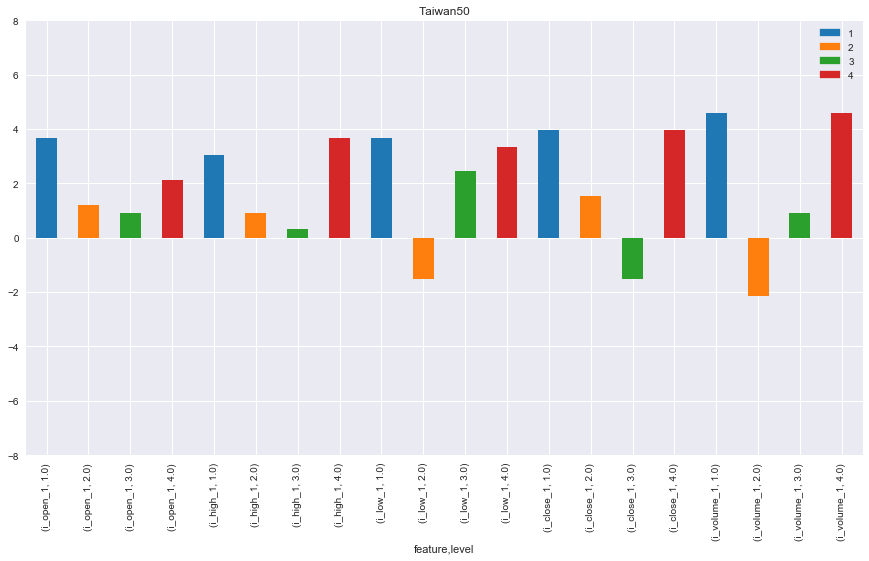

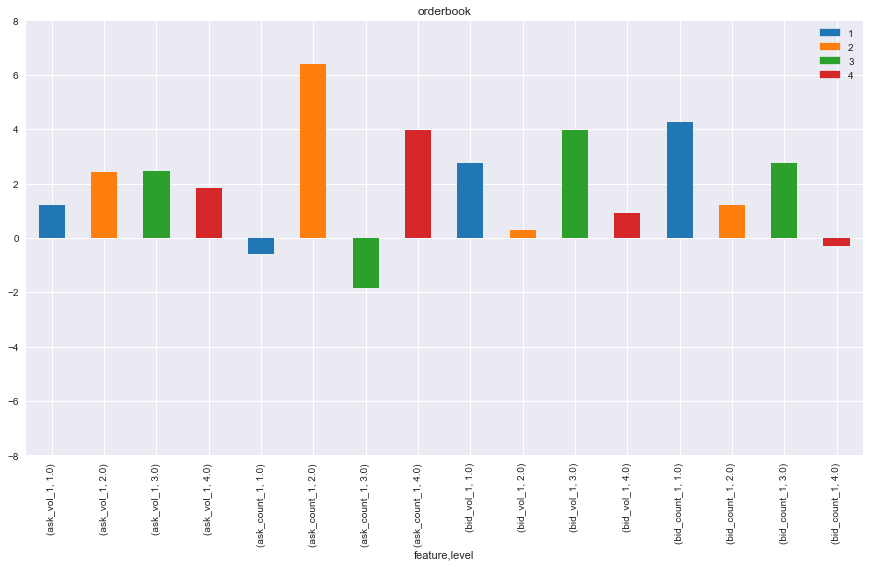

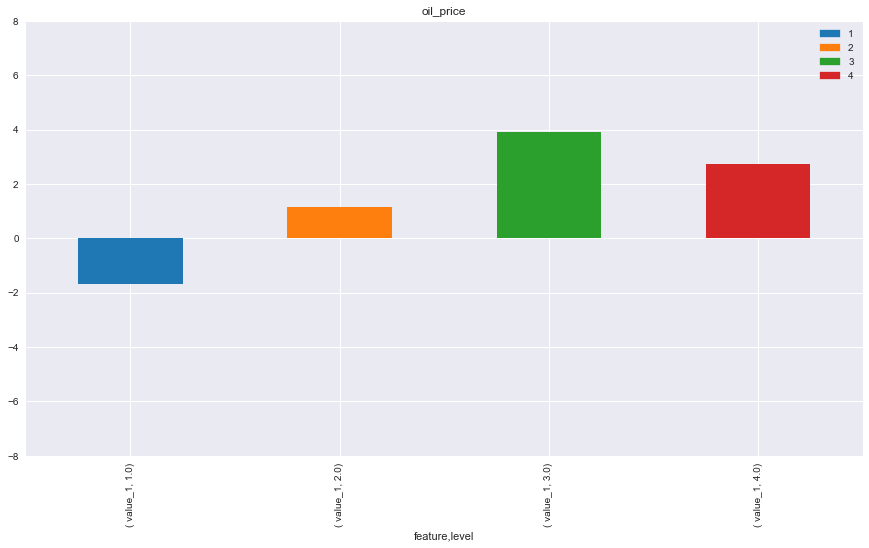

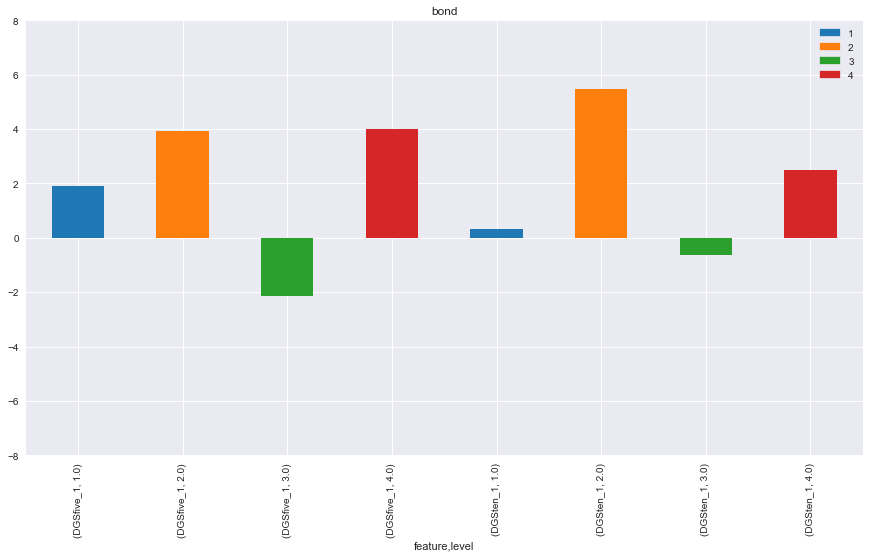

...

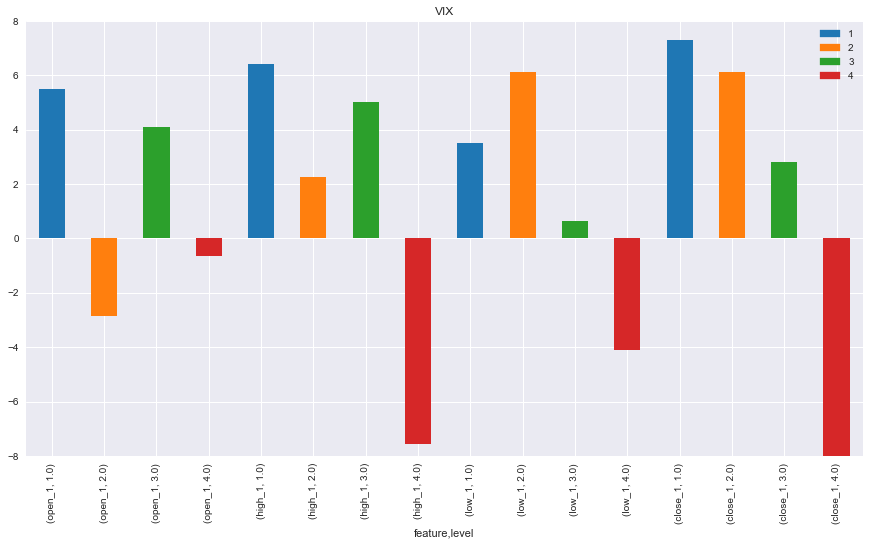

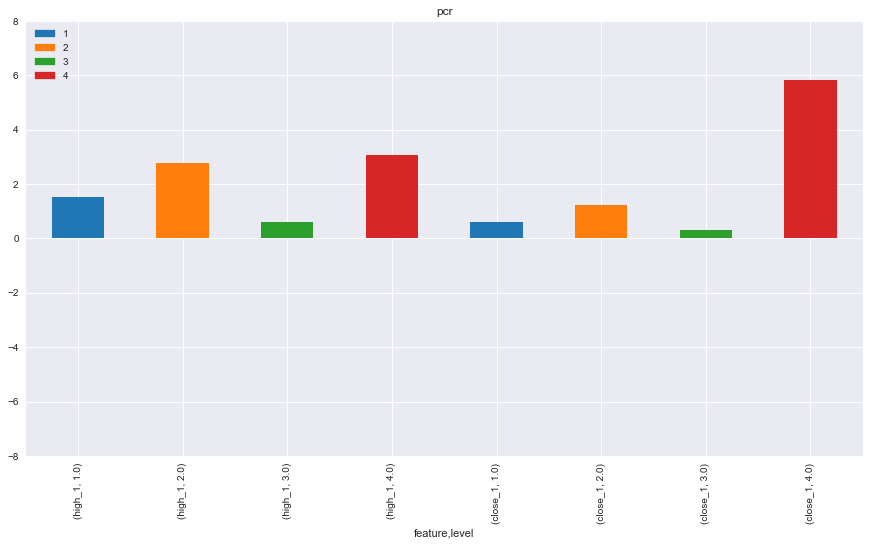

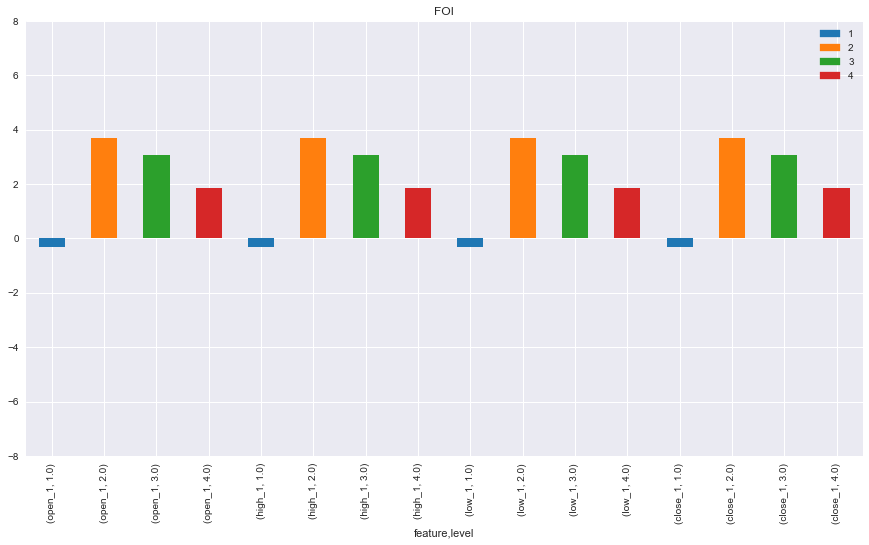

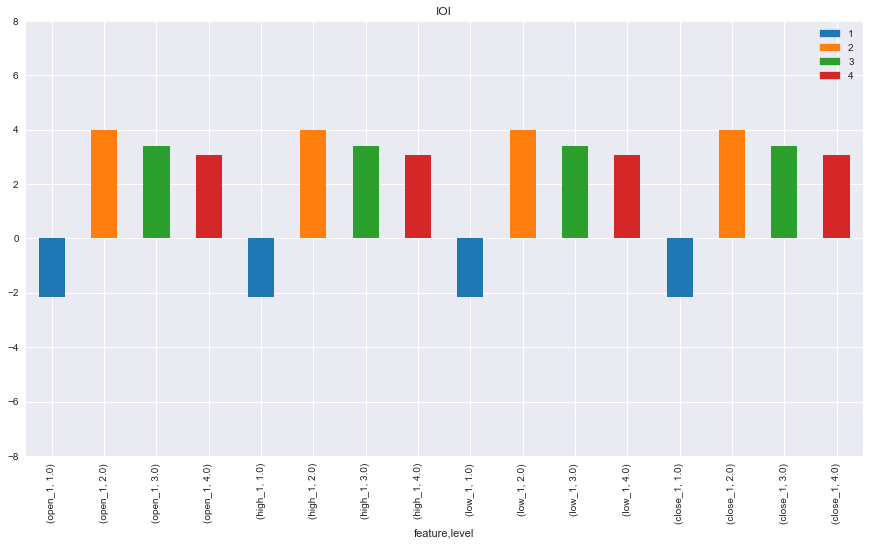

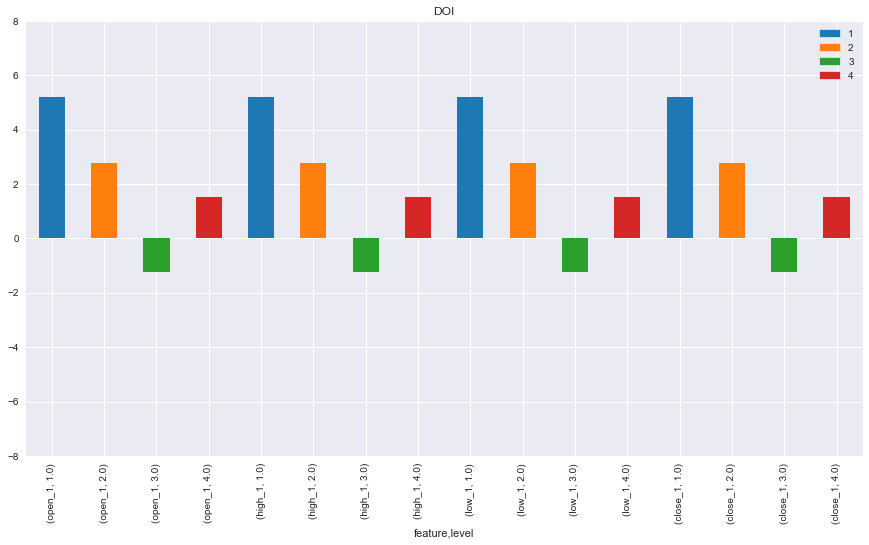

In [92]:
interval = 1
window = 5
df_return = get_all_stable(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window)

Noise rate is 48.060836501901136


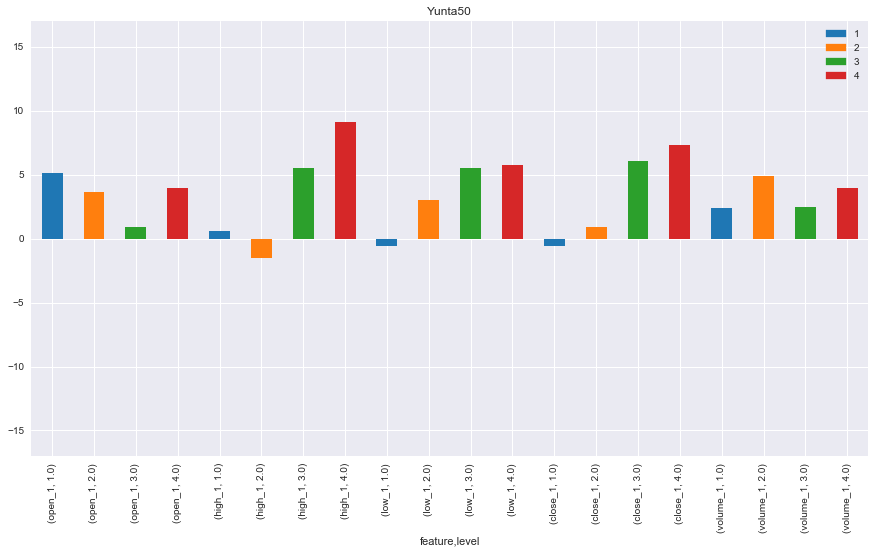

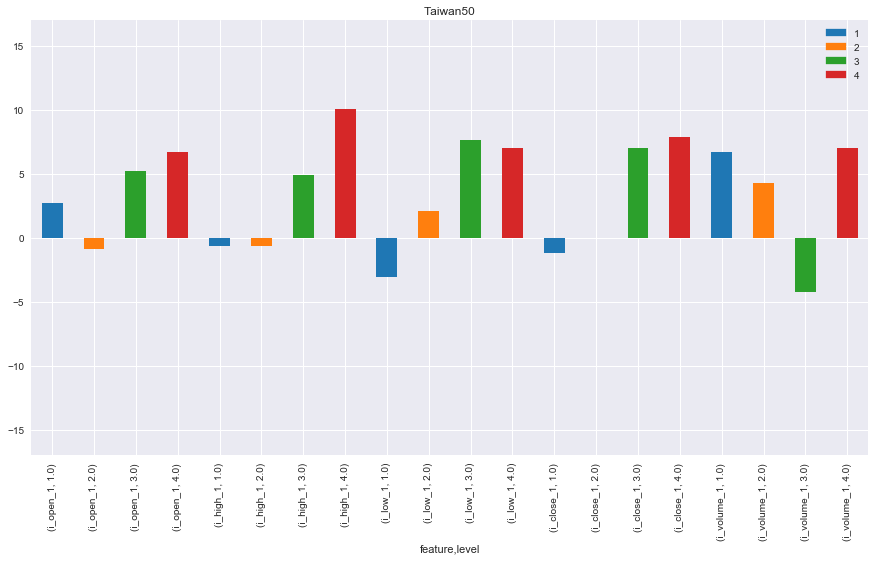

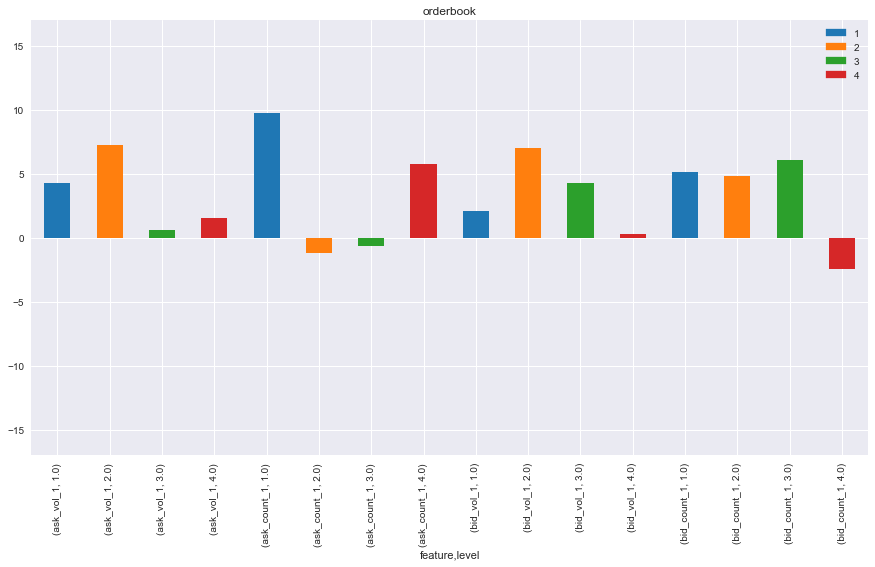

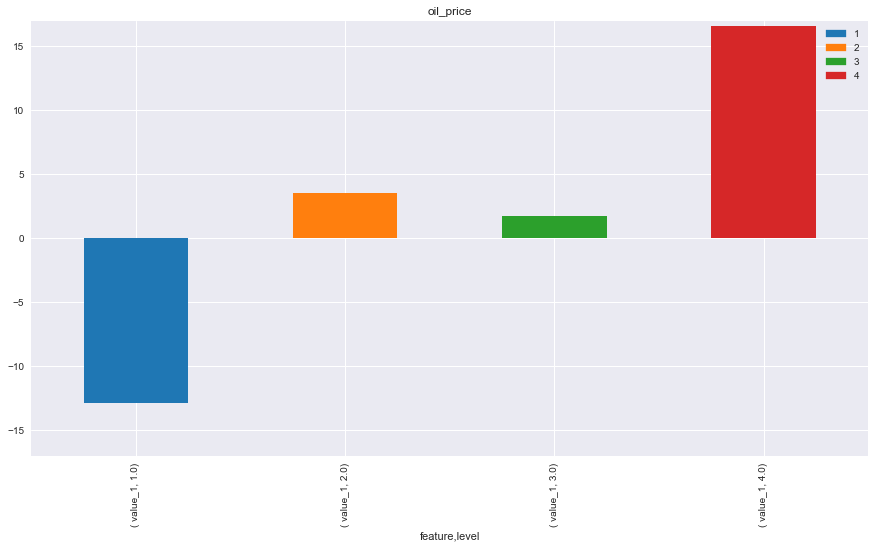

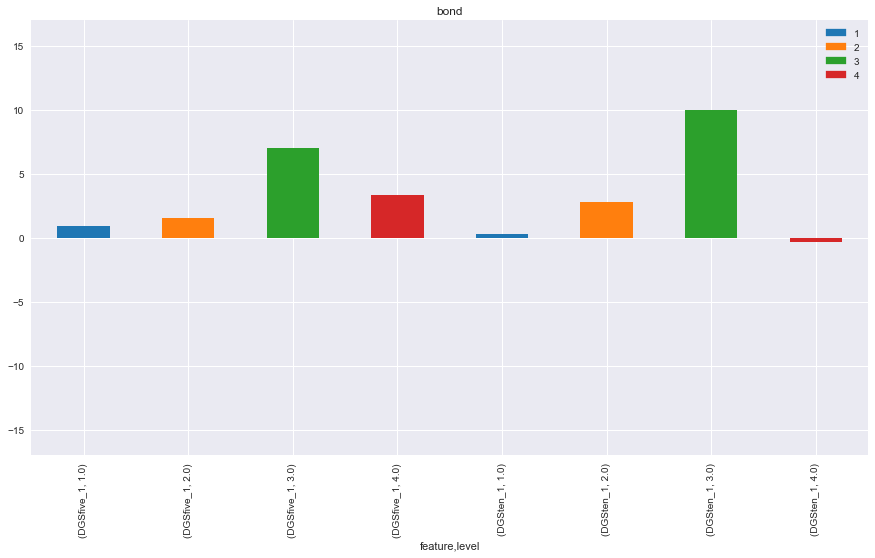

...

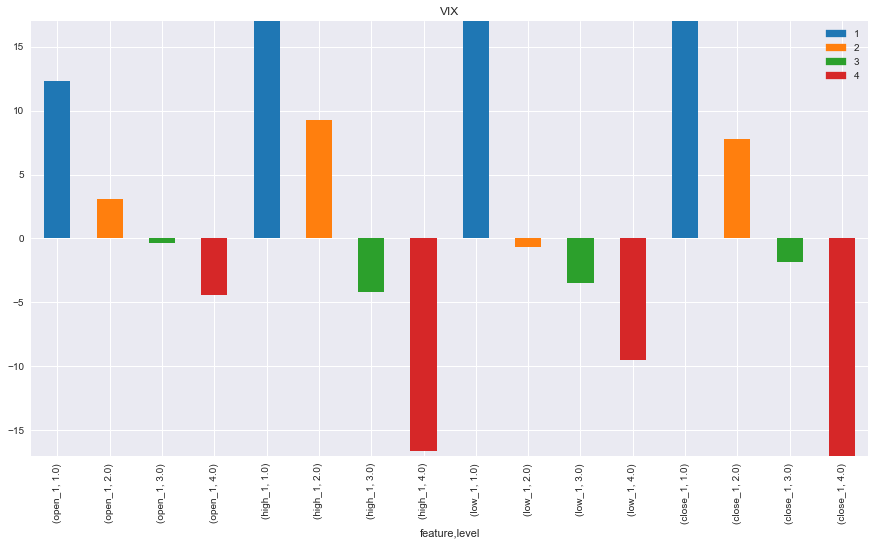

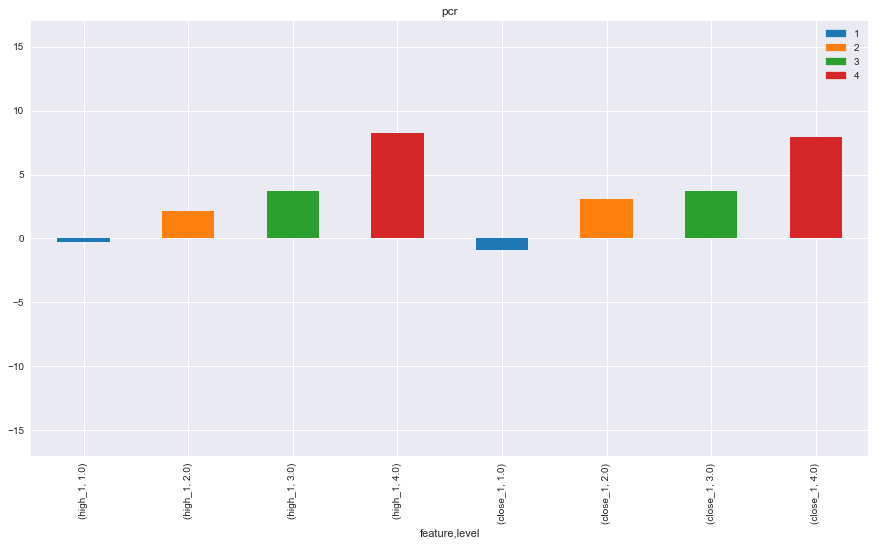

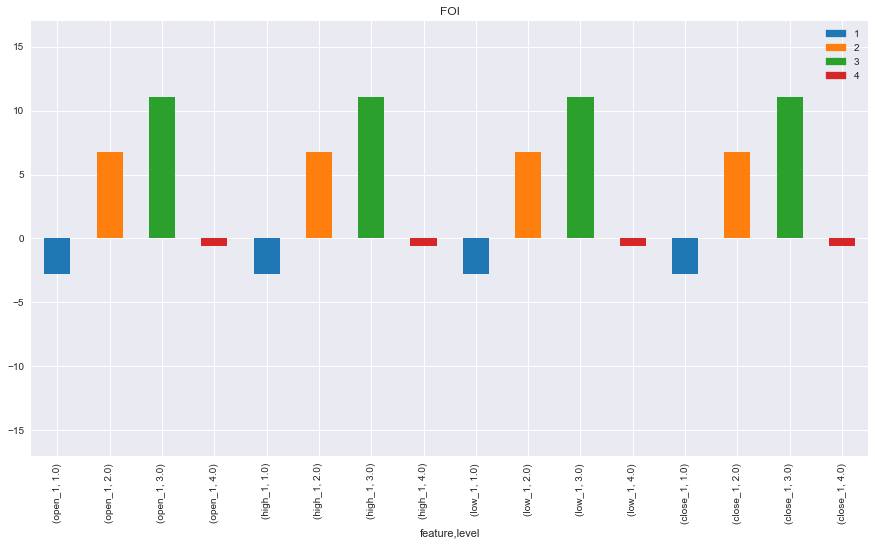

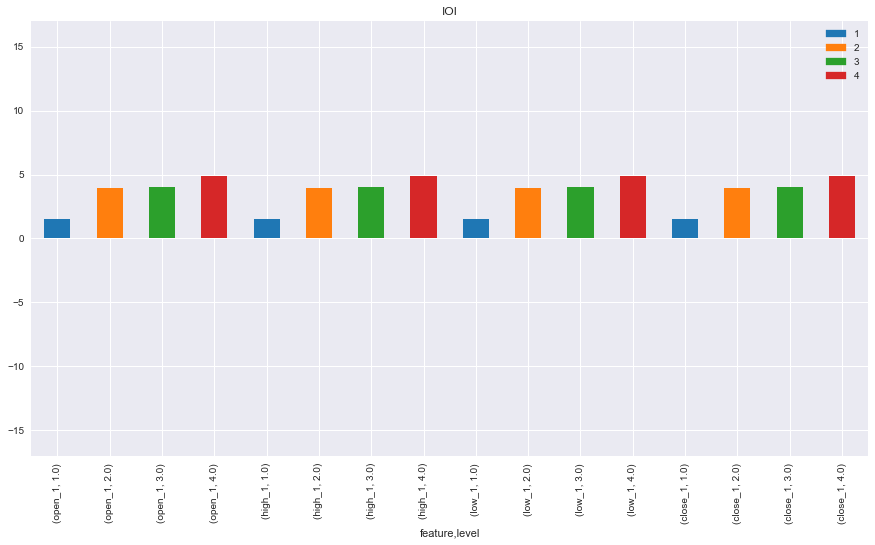

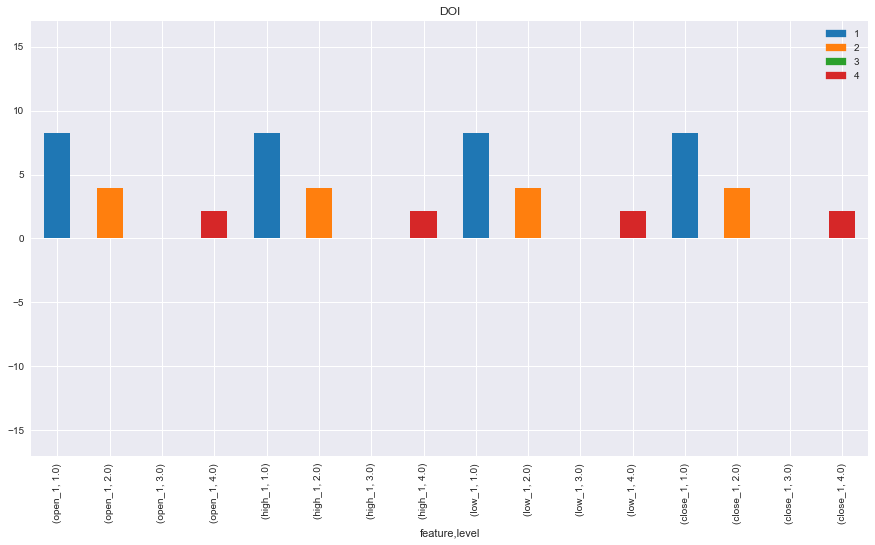

In [95]:
interval = 0.5
window = 1
df_return = get_all_stable(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window)

Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 48.060836501901136
Noise rate is 47.98479087452471


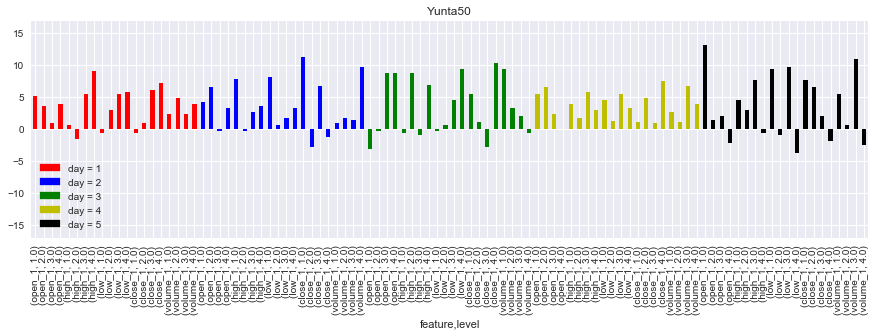

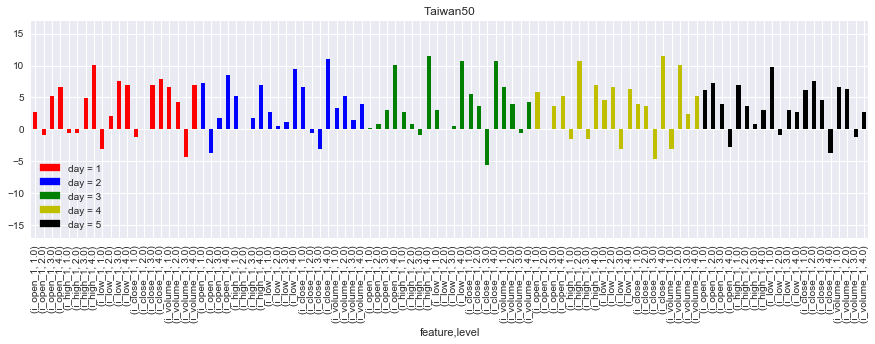

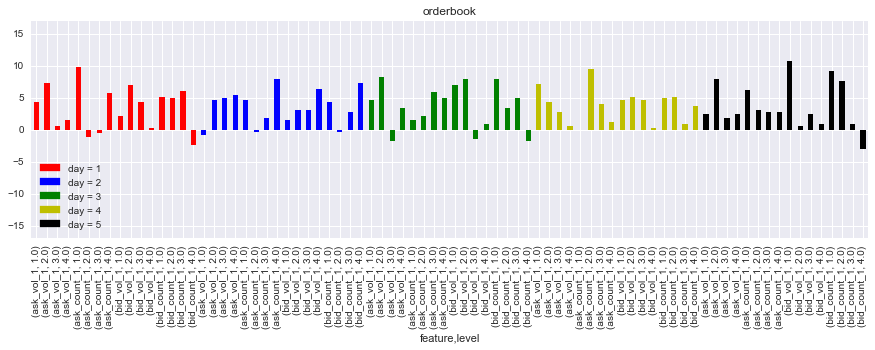

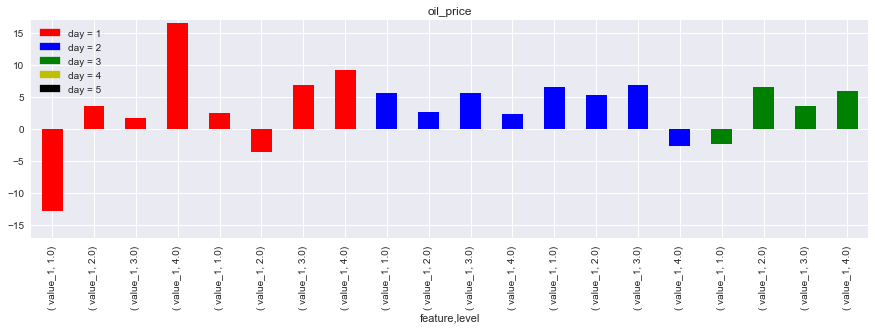

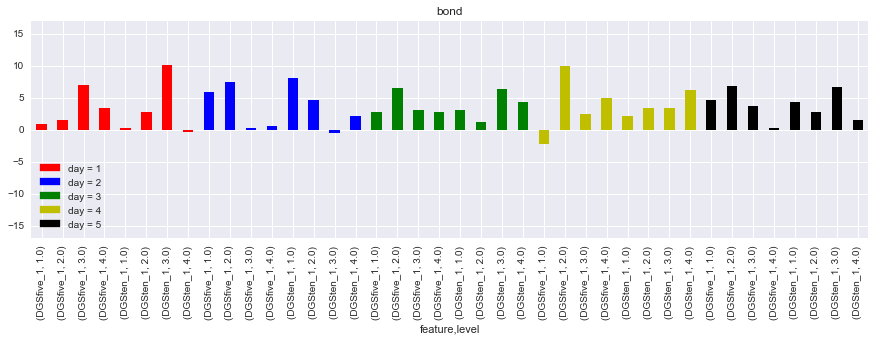

...

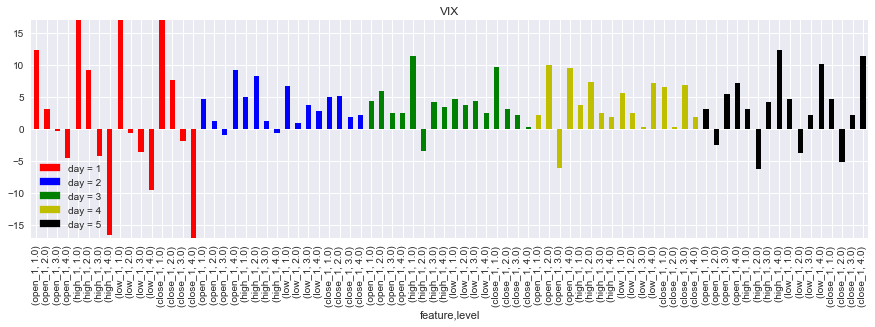

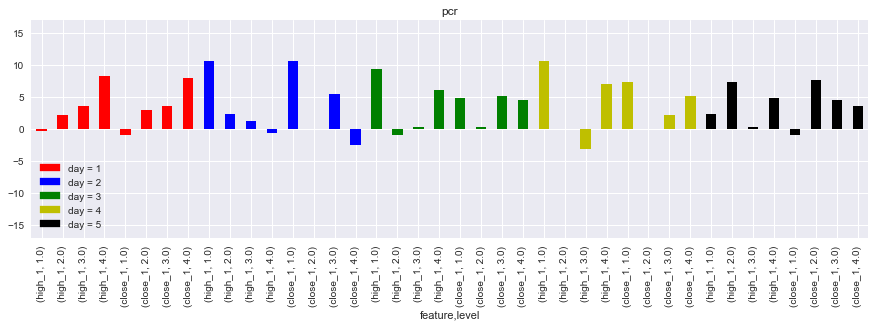

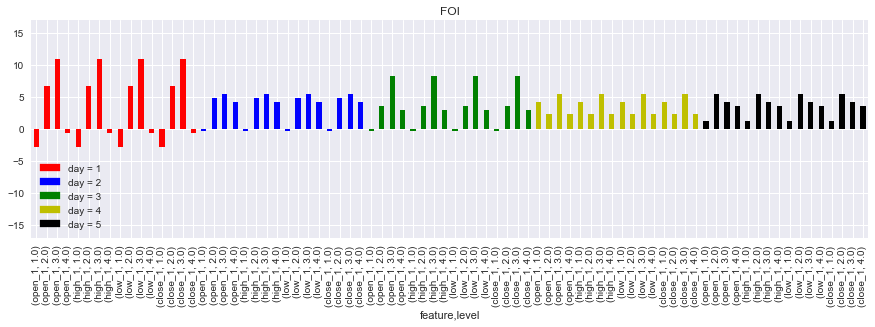

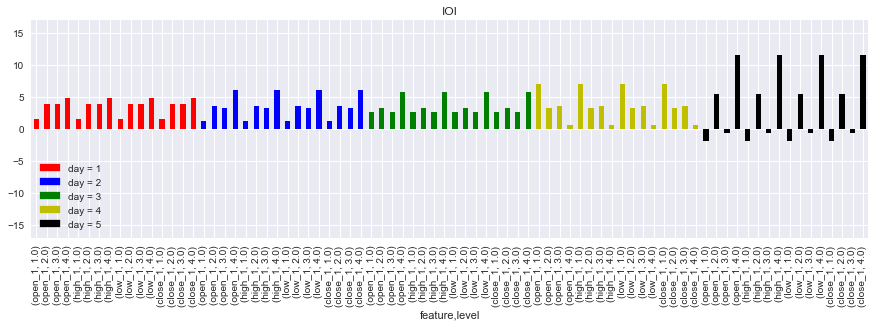

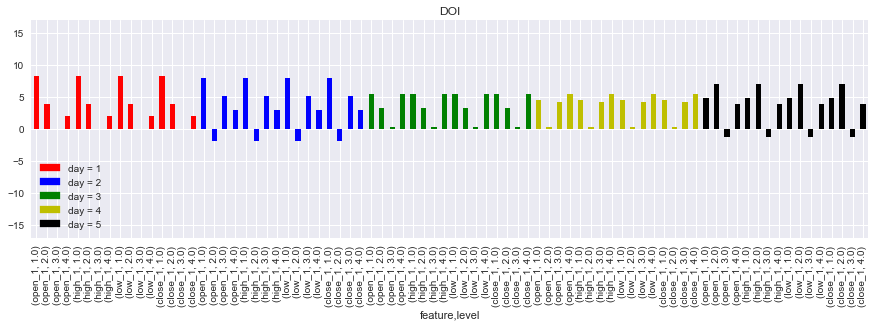

In [96]:
interval = 0.5
window = 1
get_all_stable_5day(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window)

## Statistic table for 2 vs label

Noise rate is 5.648854961832061


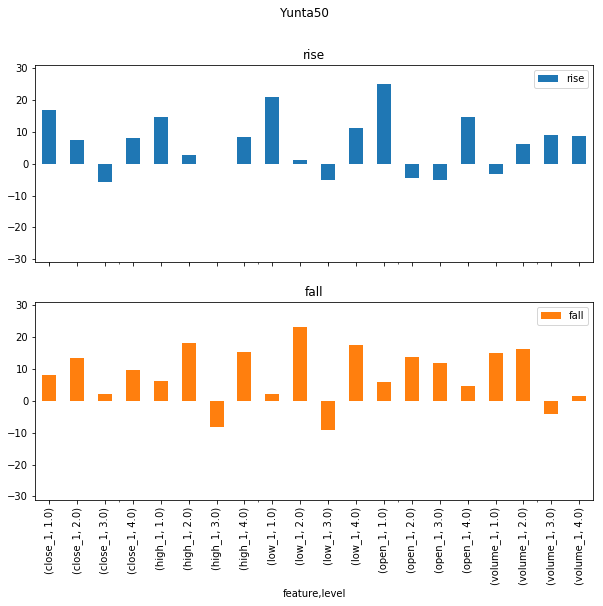

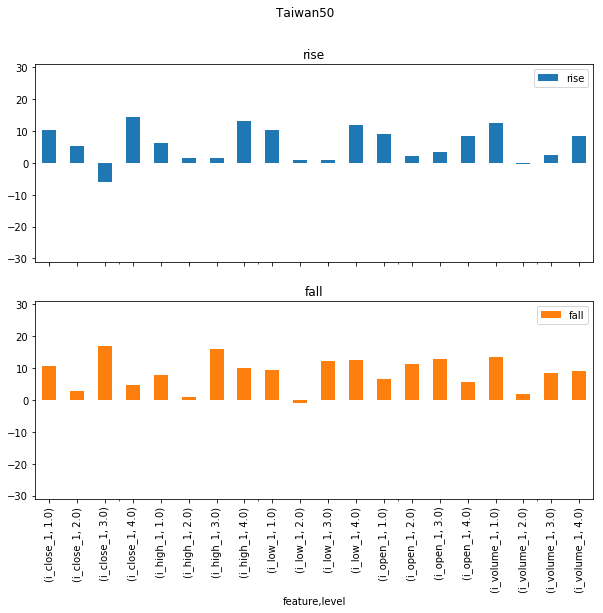

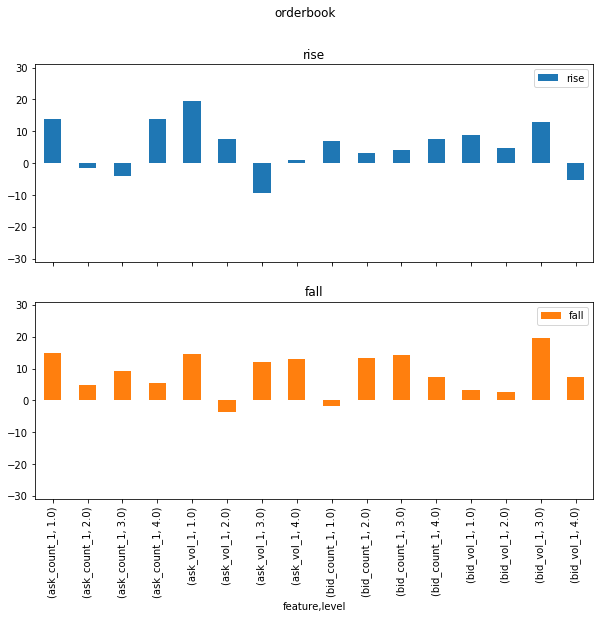

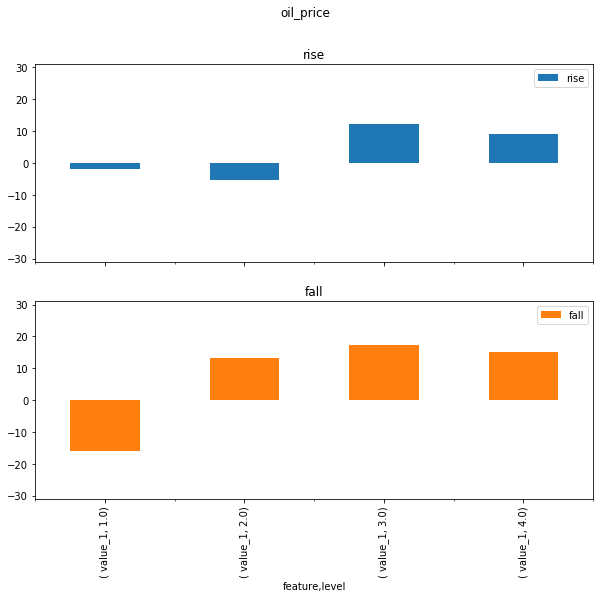

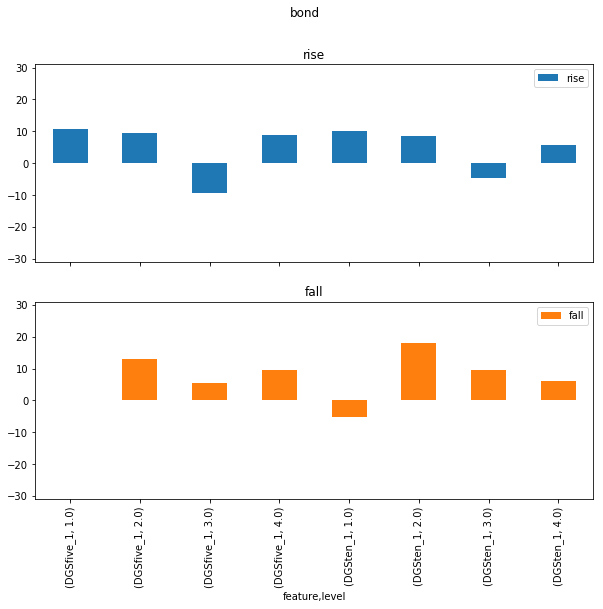

...

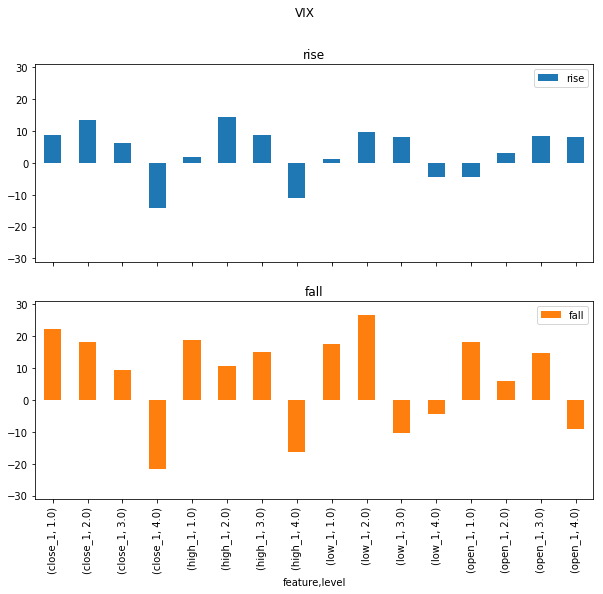

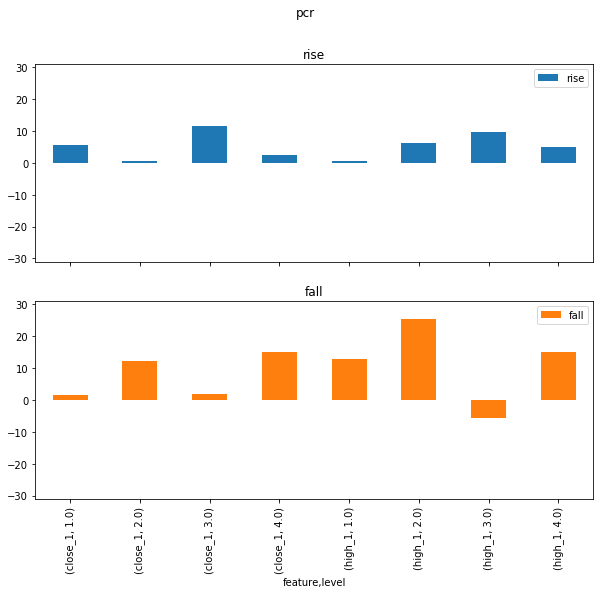

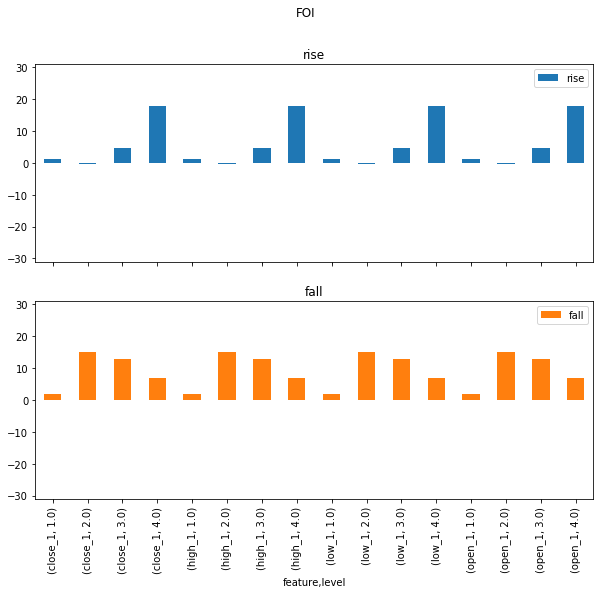

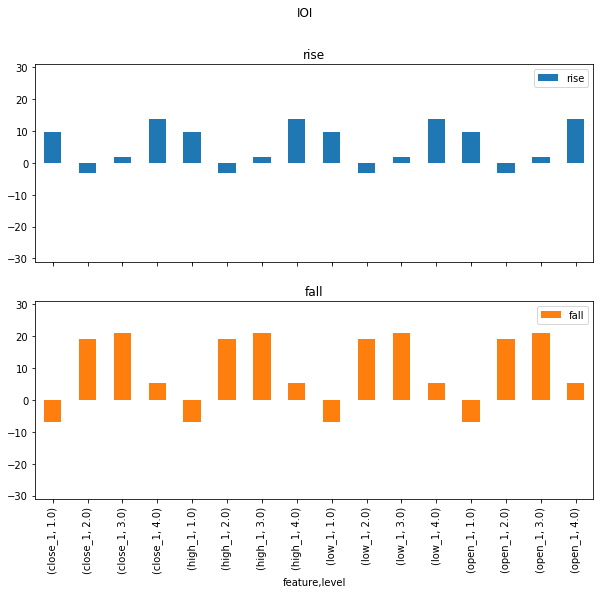

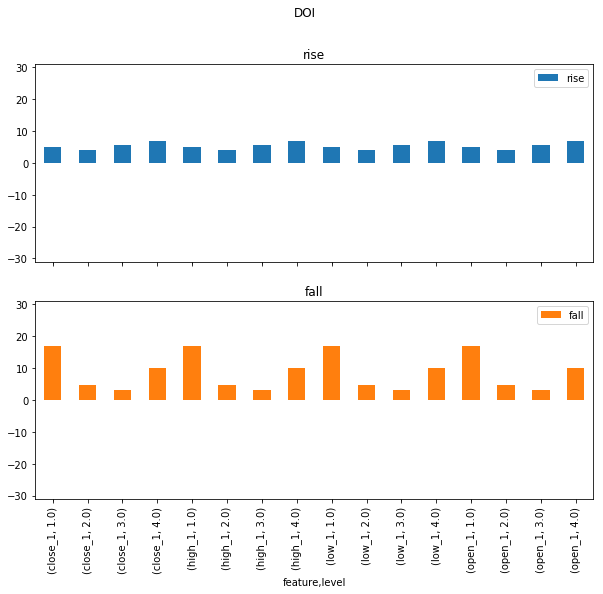

In [139]:
interval = 0
window = 5
df_return = get_all_stable(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,one= False,two=True)

Noise rate is 48.16793893129771


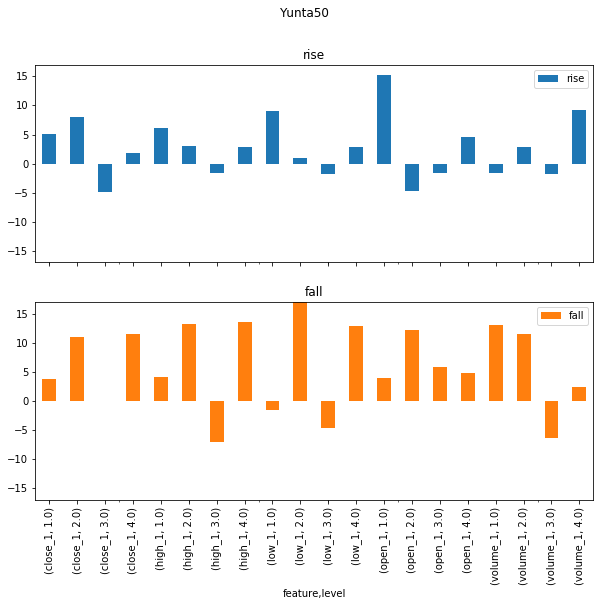

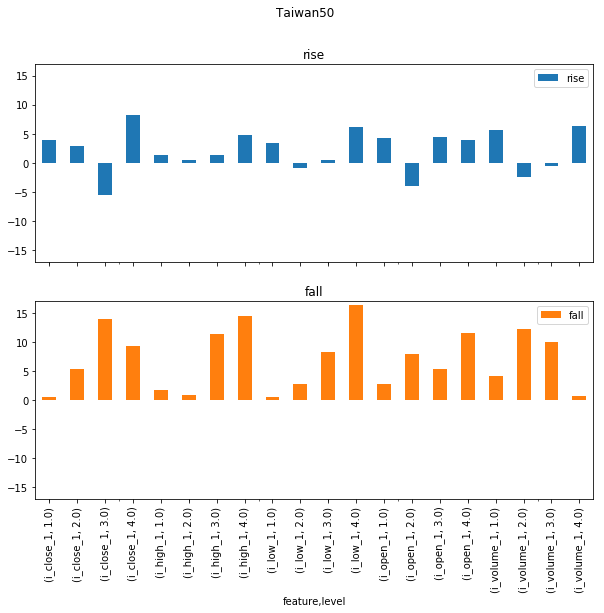

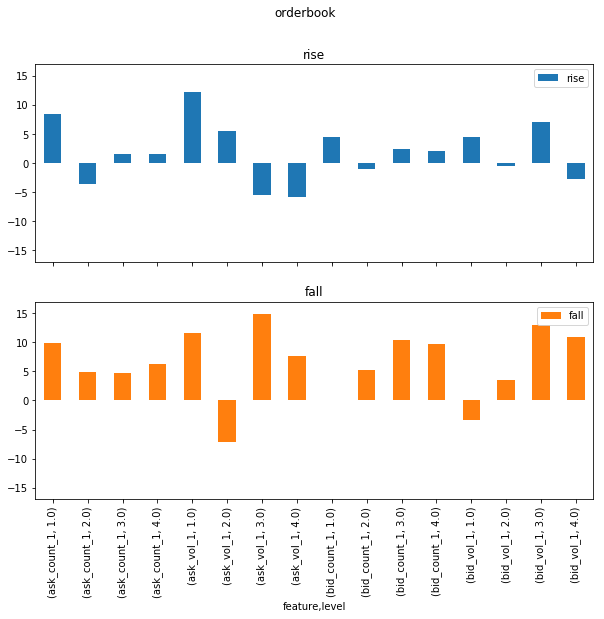

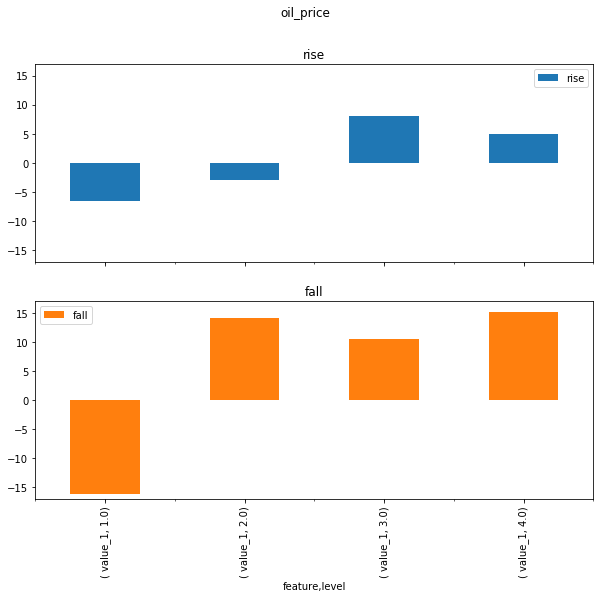

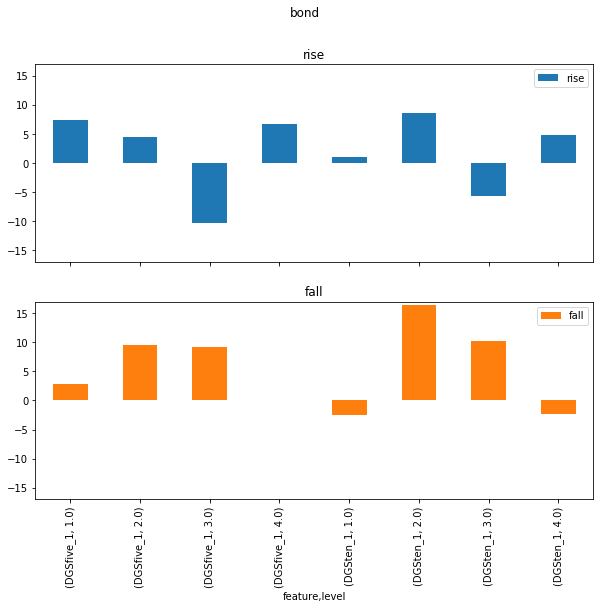

...

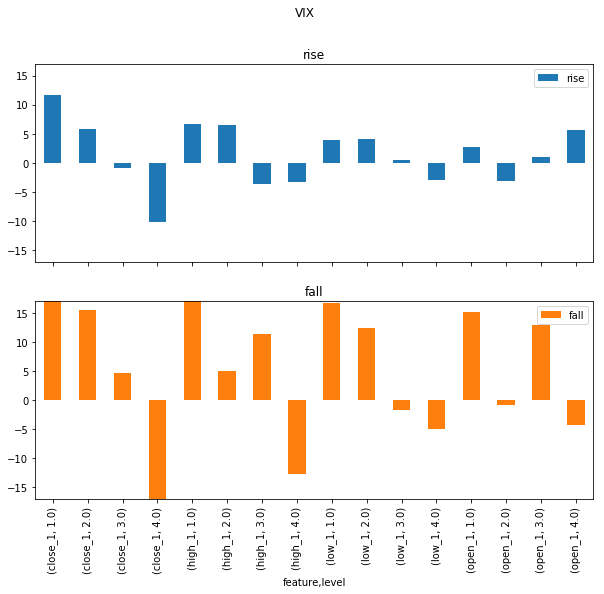

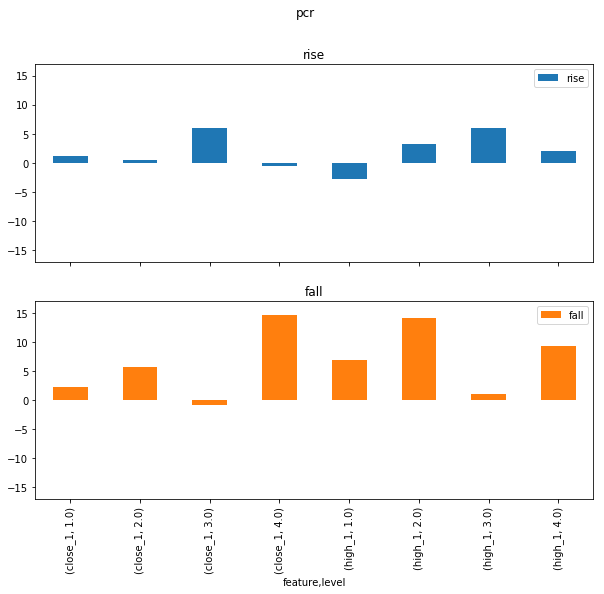

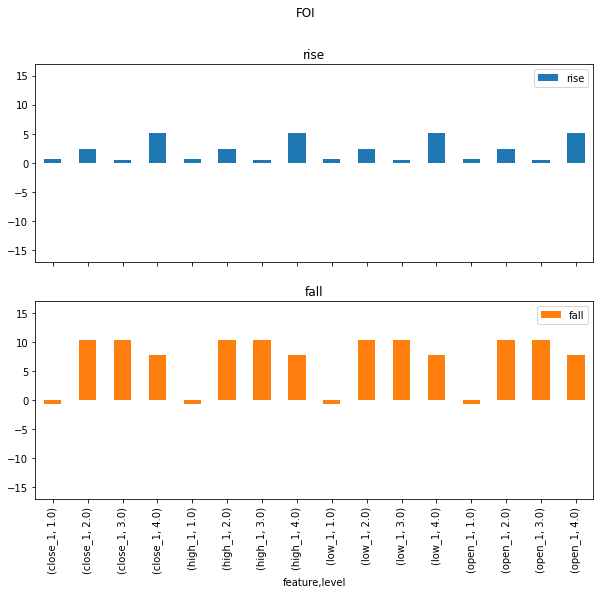

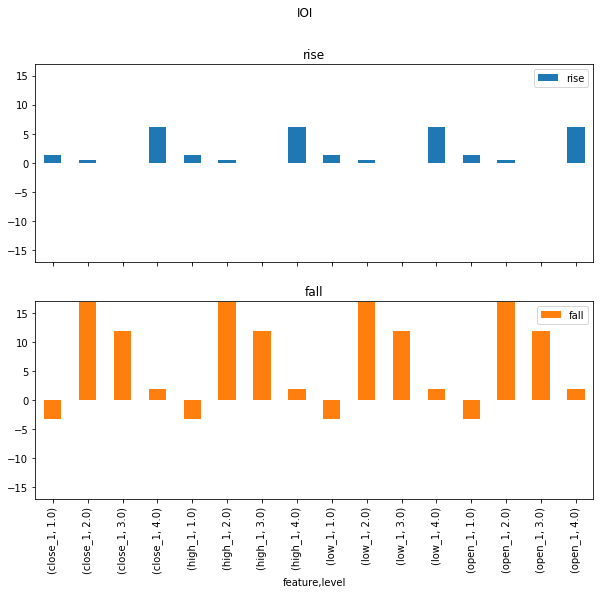

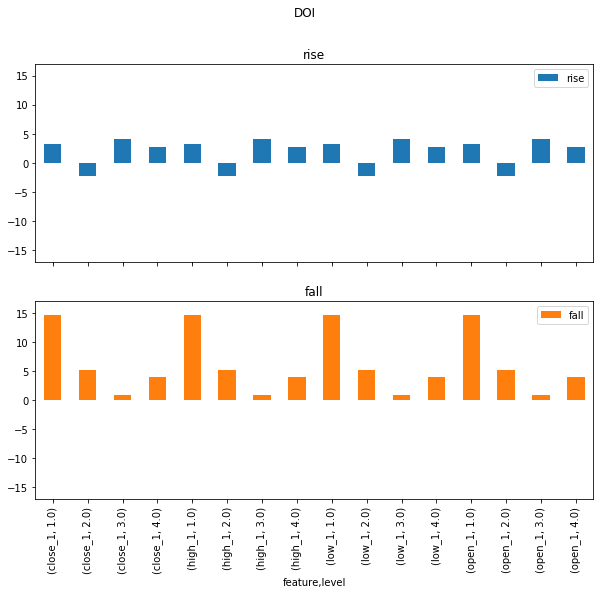

In [140]:
interval = 0.5
window = 5
df_return = get_all_stable(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,one= False,two=True)

Noise rate is 73.89312977099237


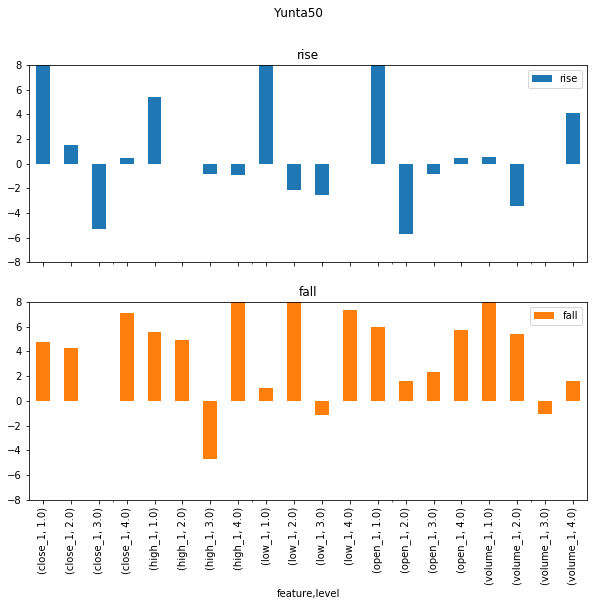

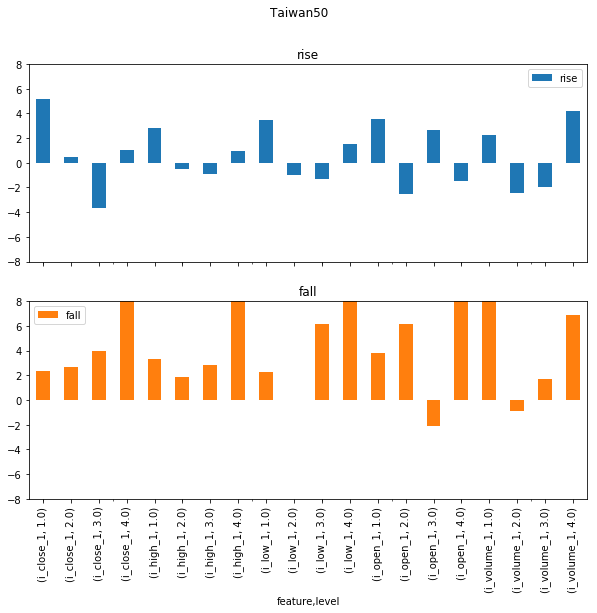

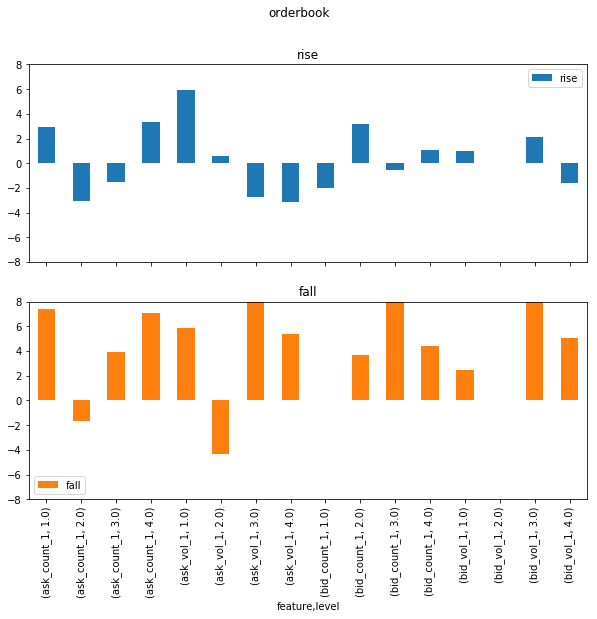

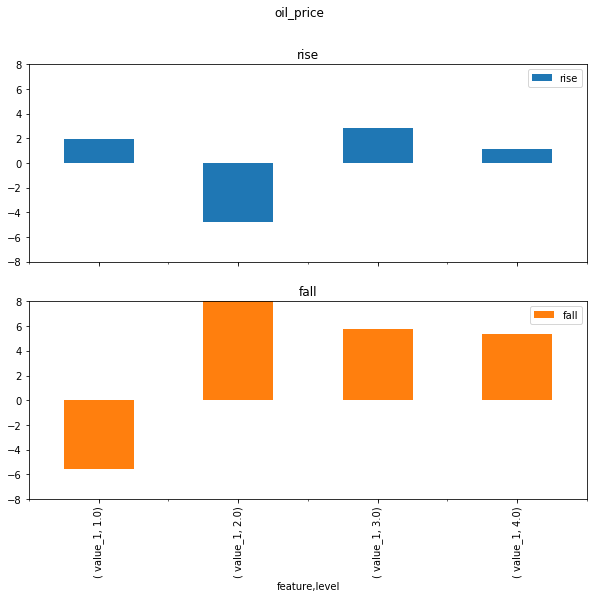

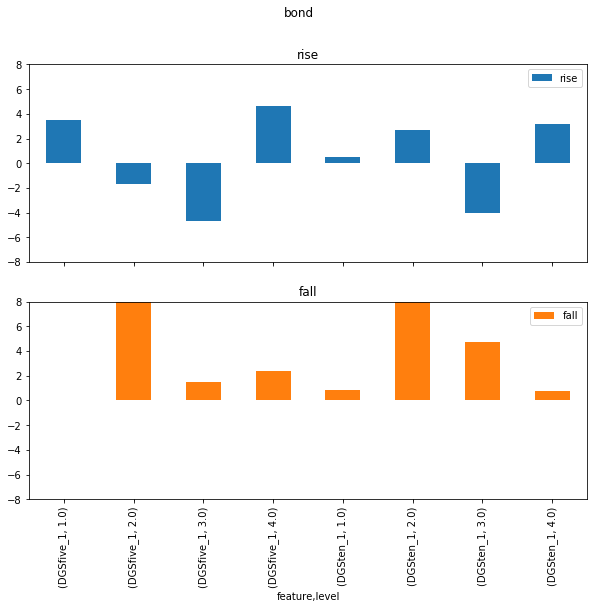

...

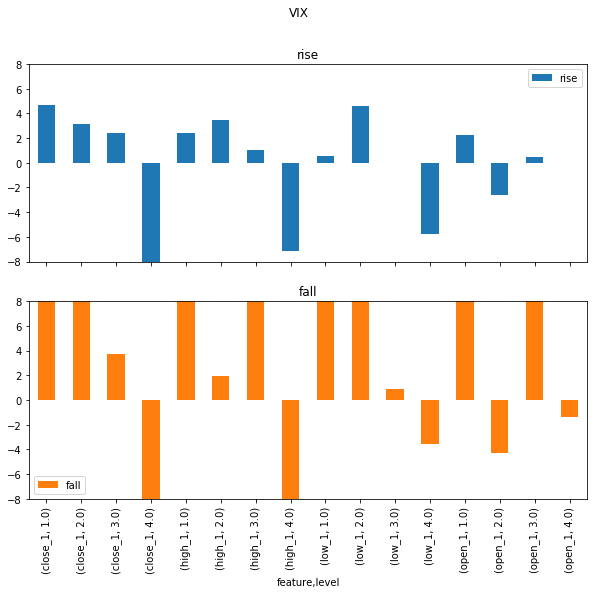

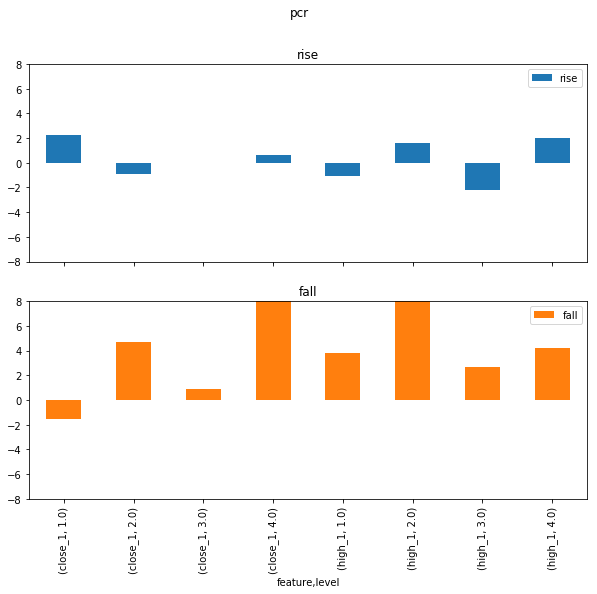

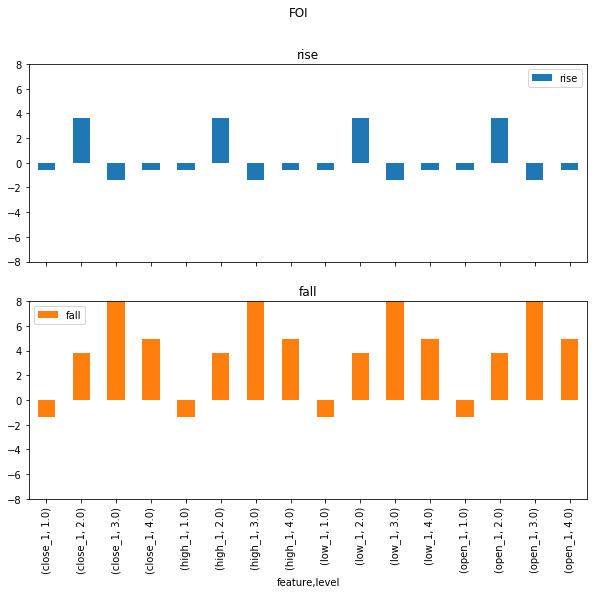

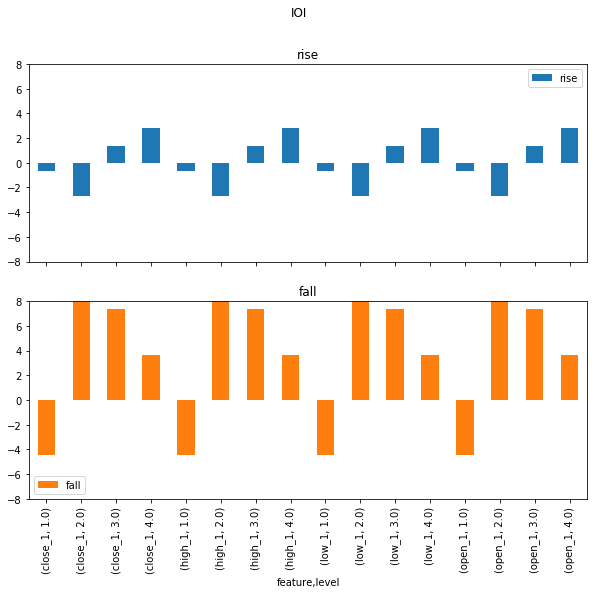

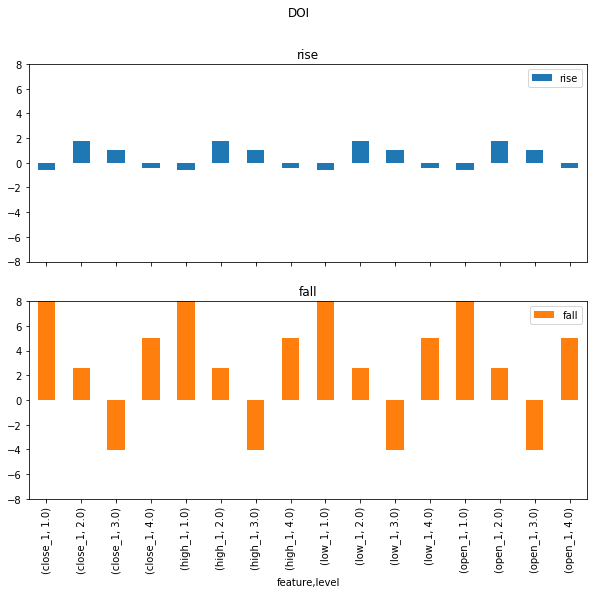

In [141]:
interval = 1
window = 5
df_return = get_all_stable(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,one= False,two=True)

Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.091603053435115


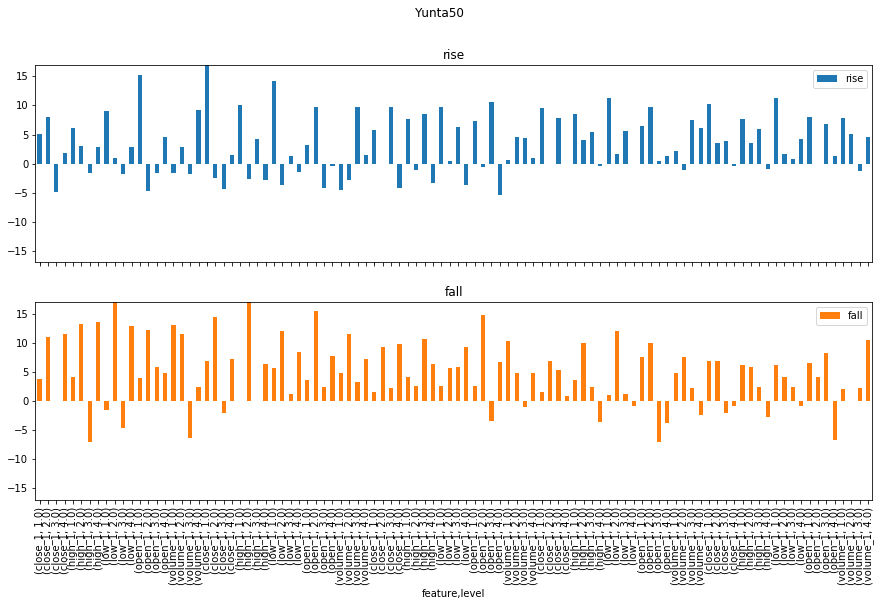

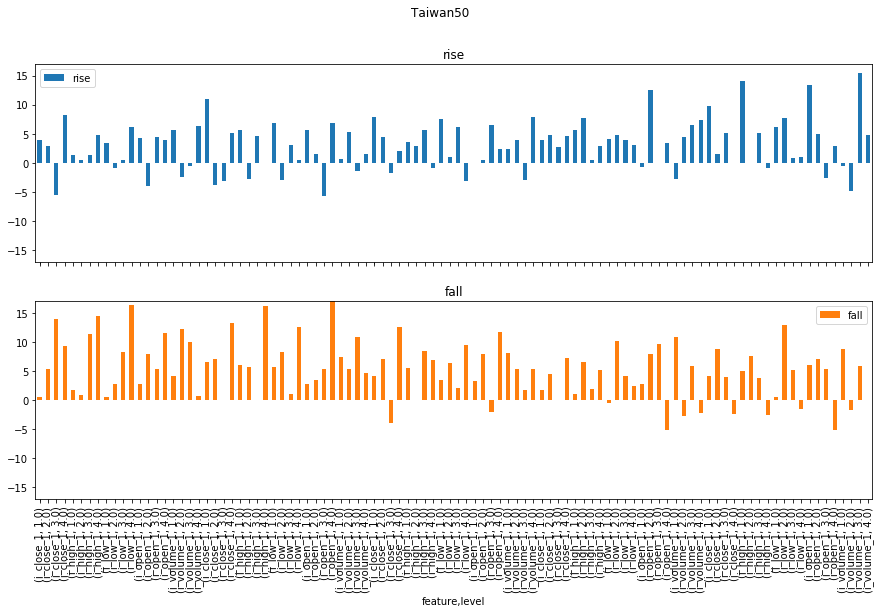

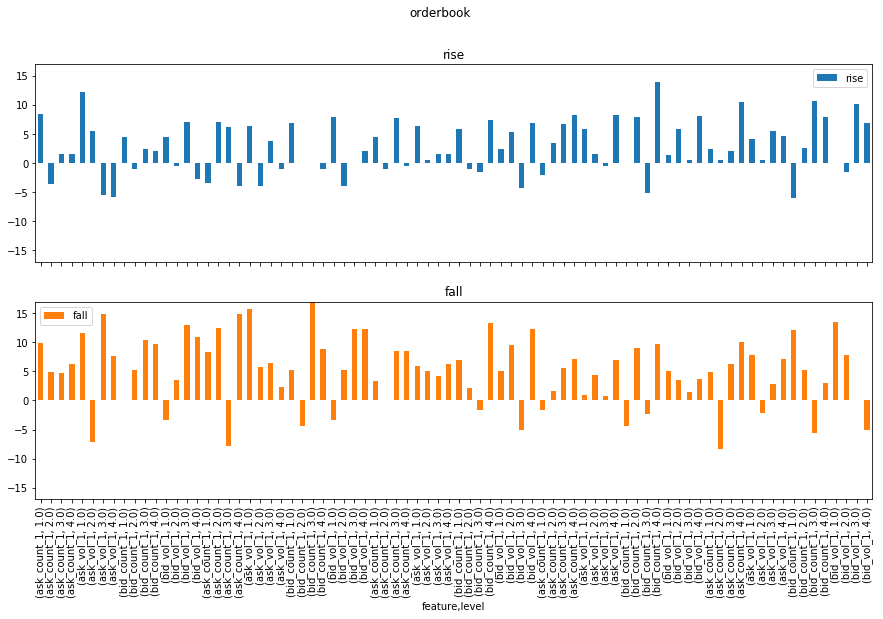

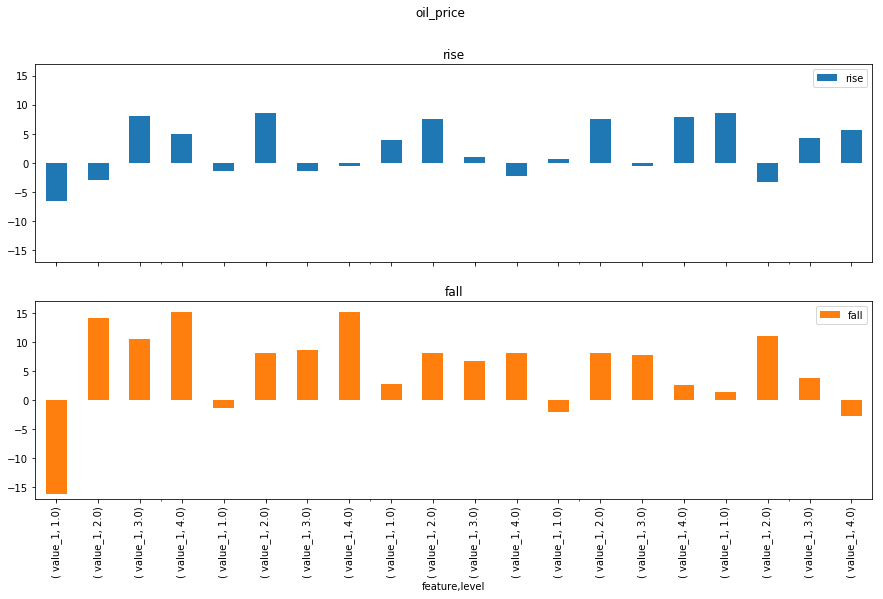

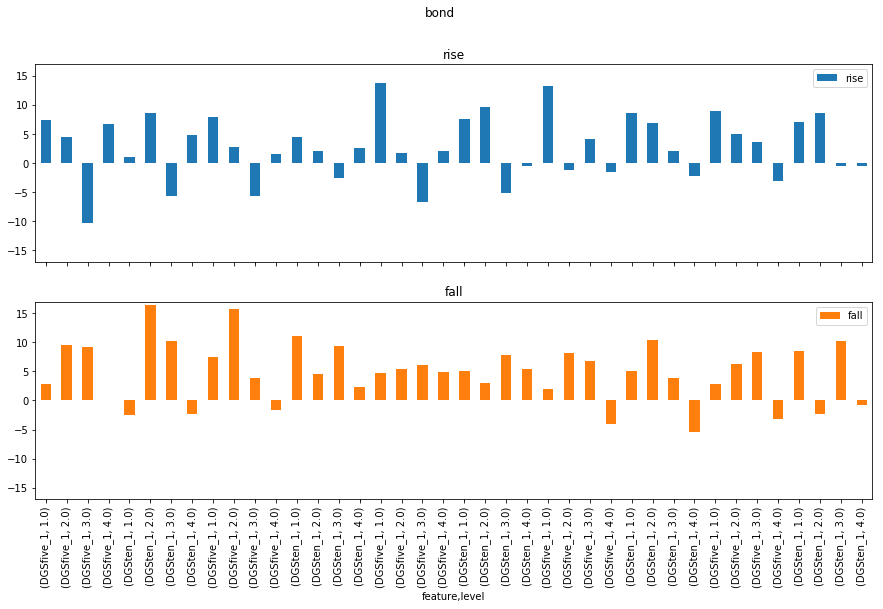

...

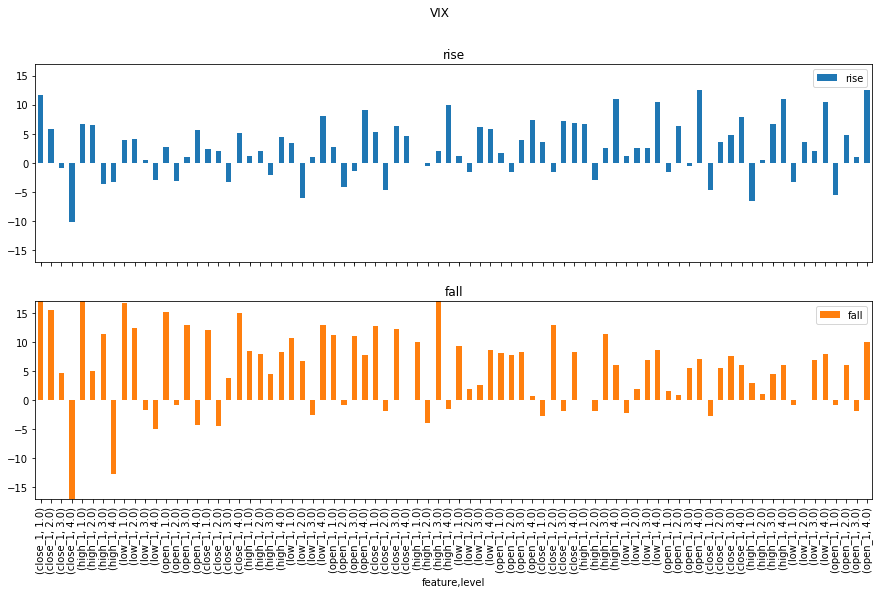

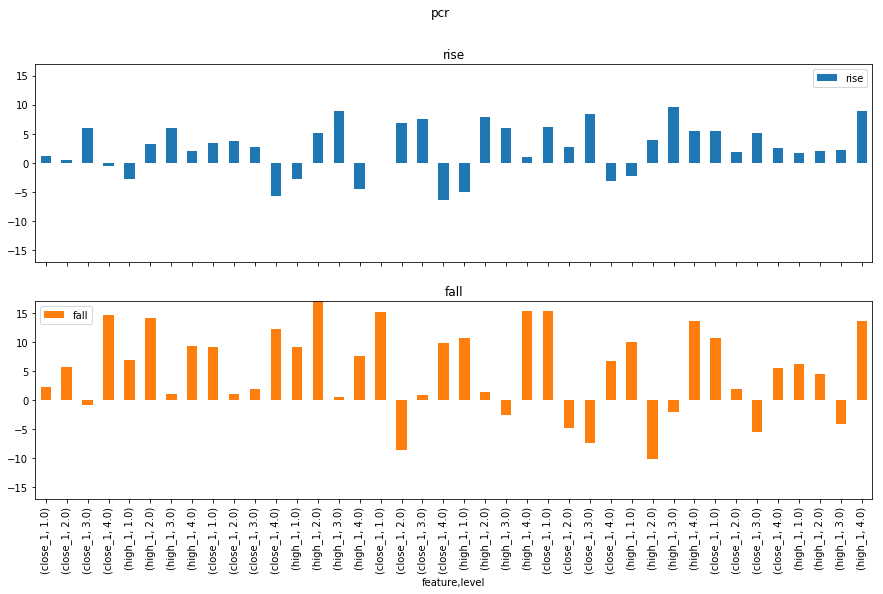

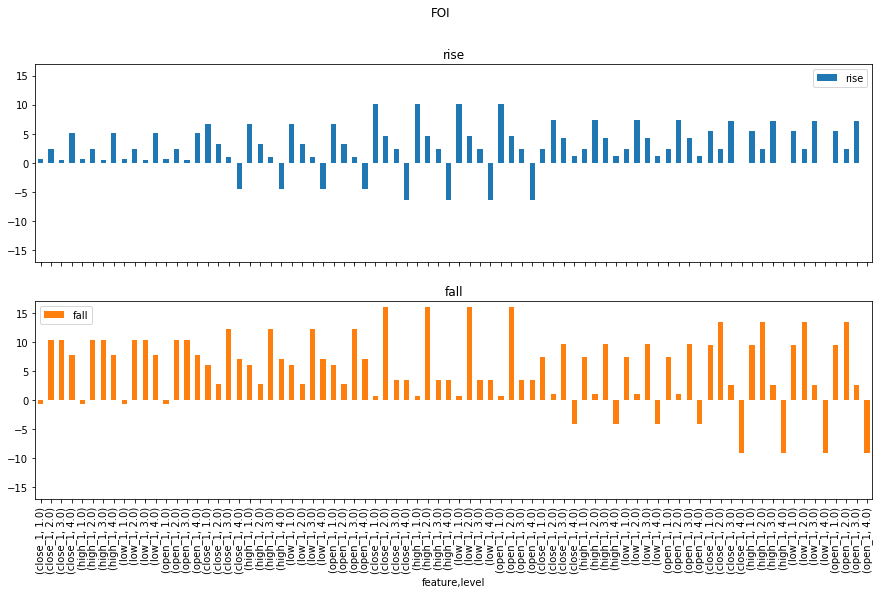

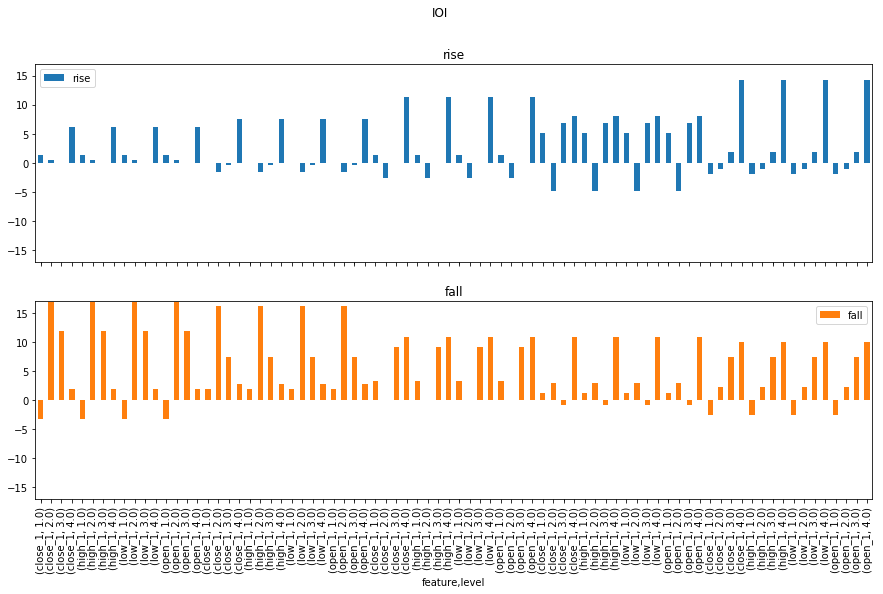

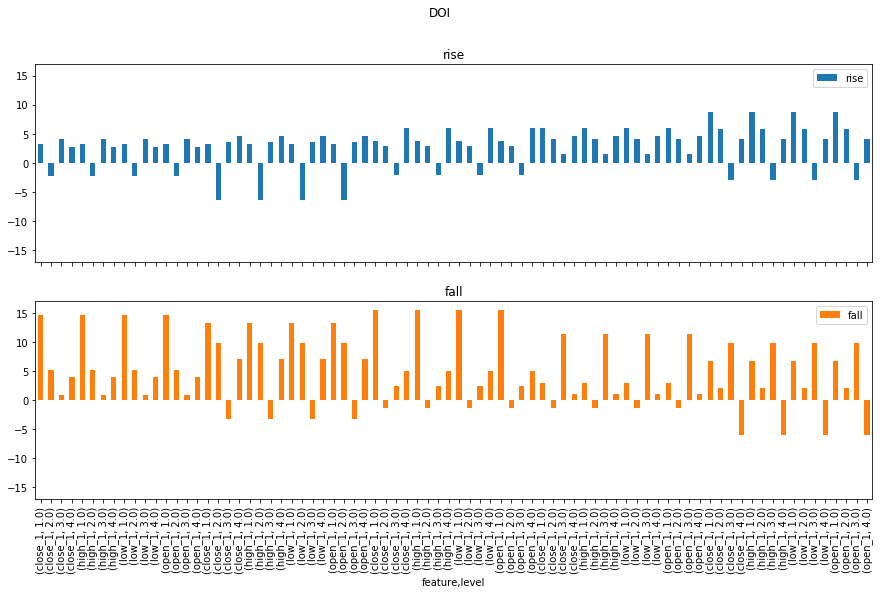

In [142]:
interval = 0.5
window = 5
get_all_stable_5day(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,one=False,two = True)

Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.16793893129771
Noise rate is 48.091603053435115


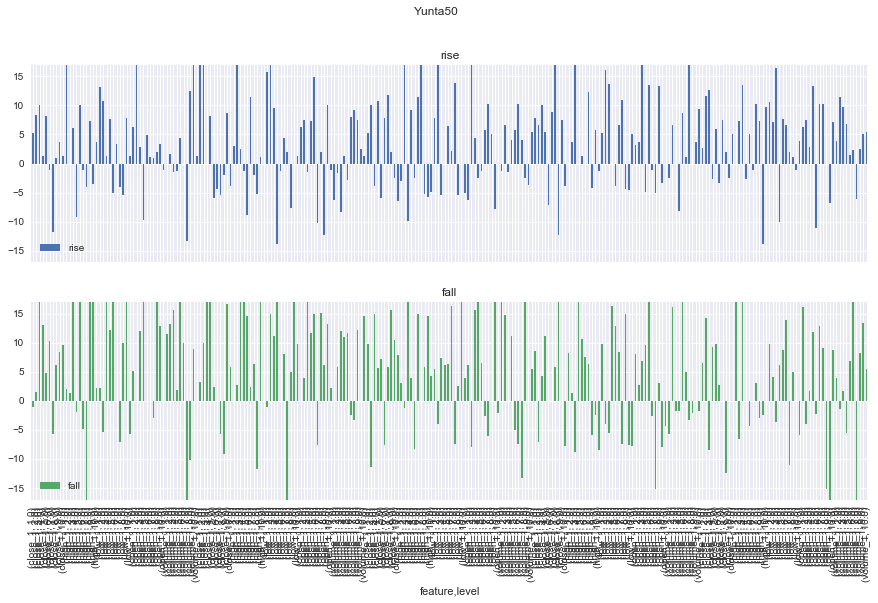

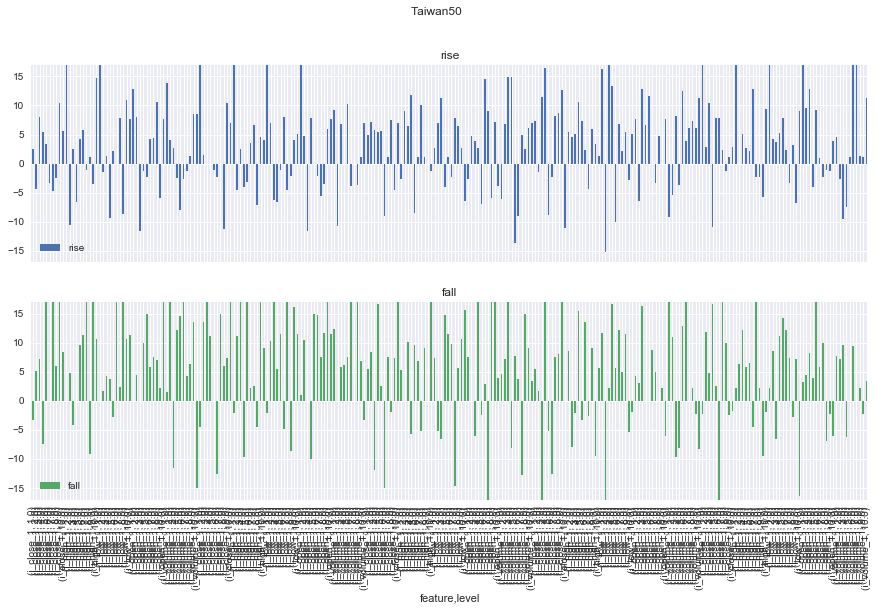

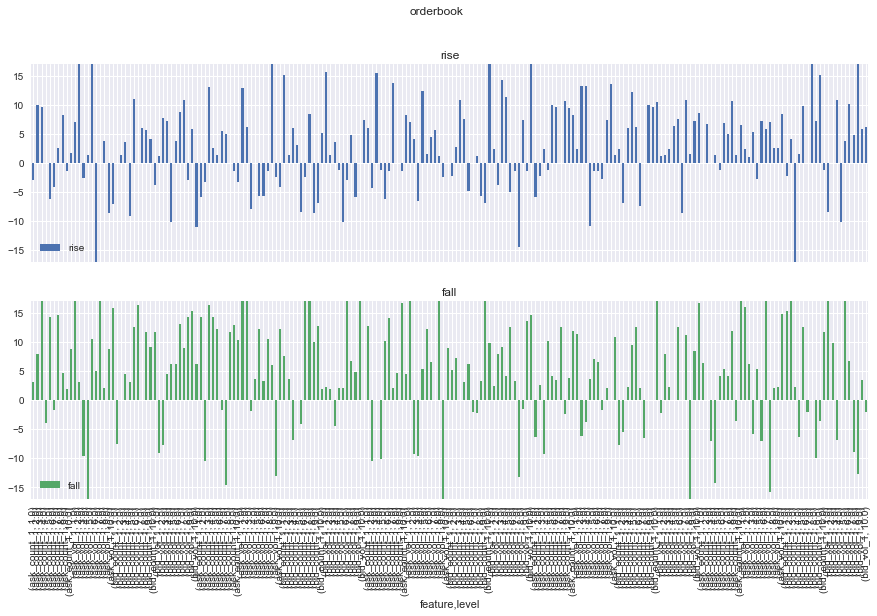

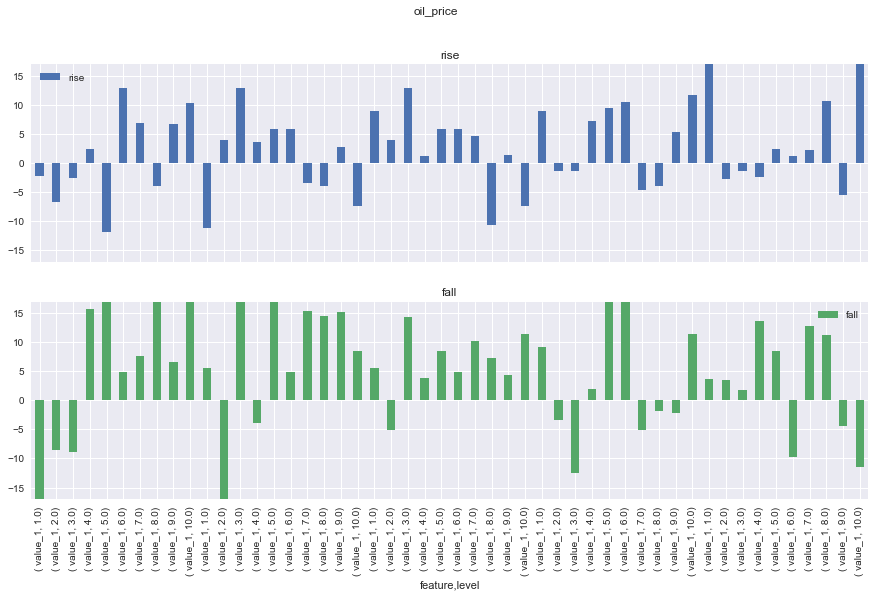

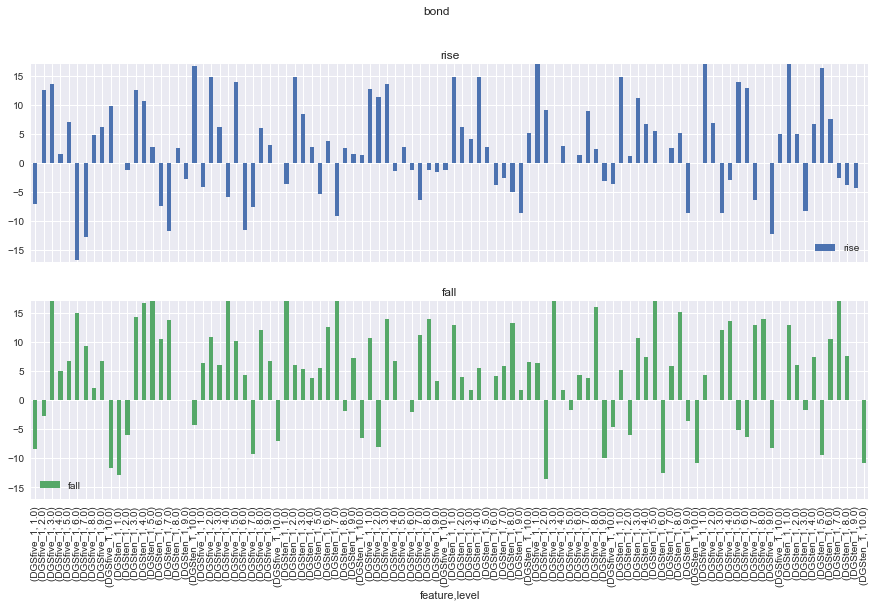

...

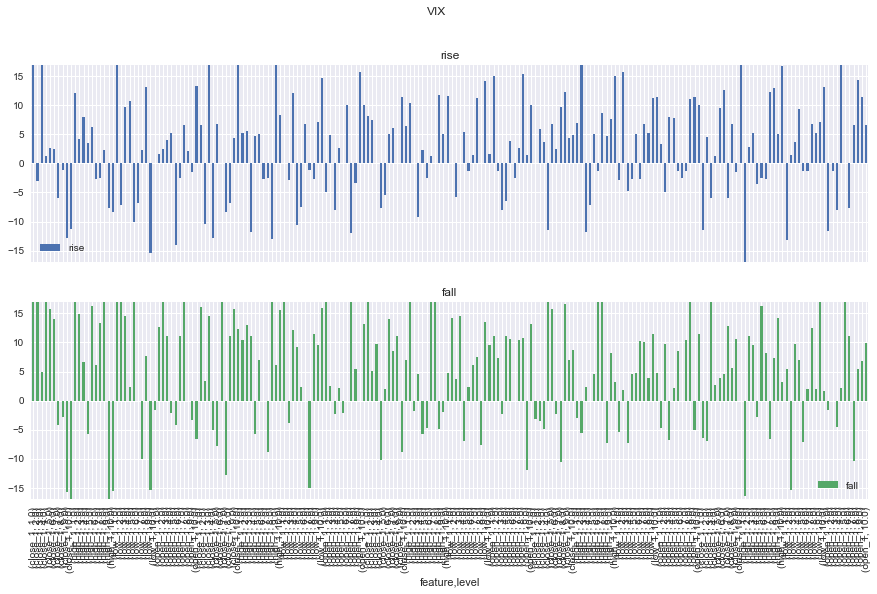

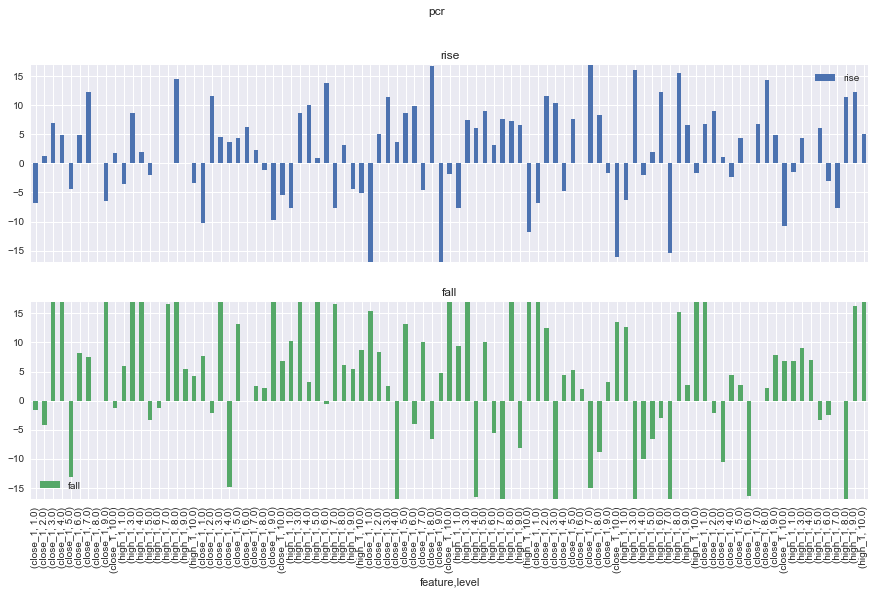

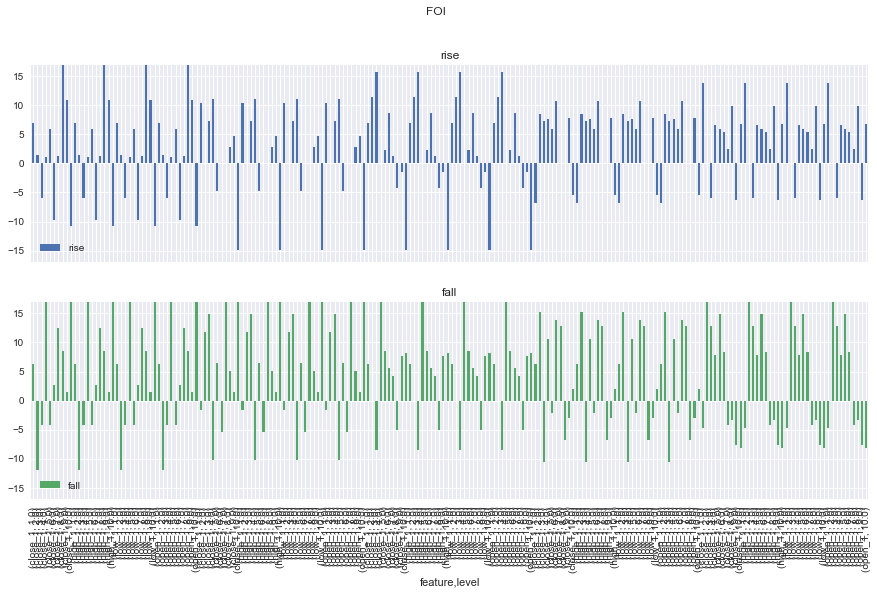

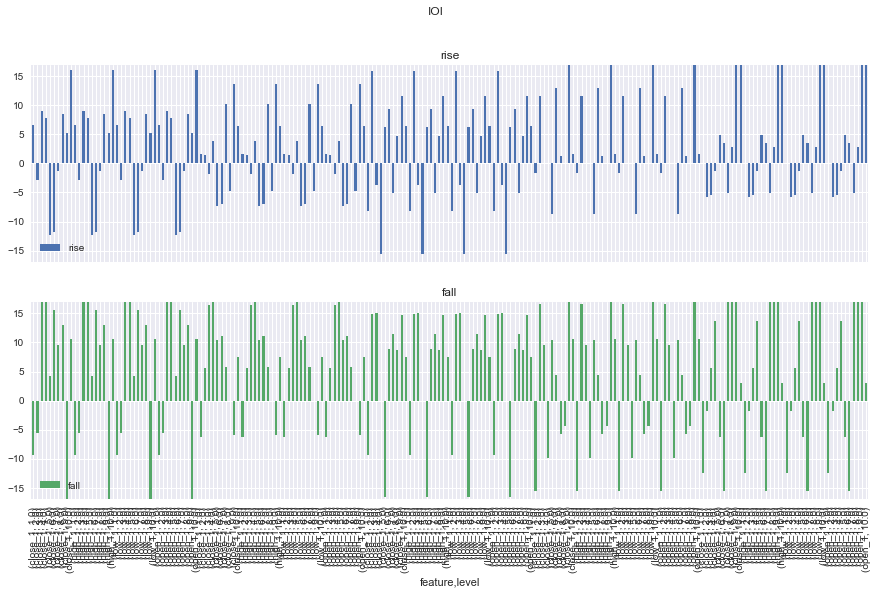

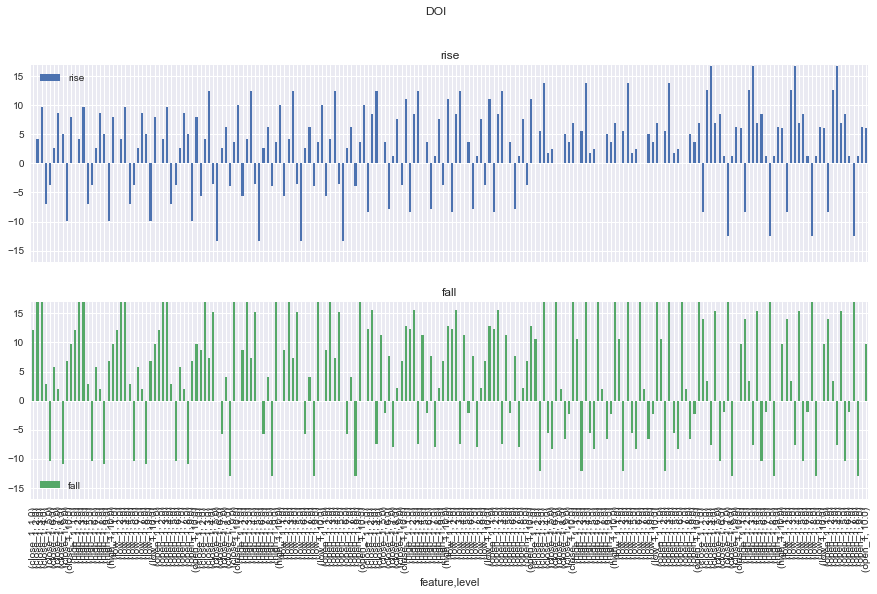

In [128]:
interval = 0.5
window = 5
ca= 10
get_all_stable_5day(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,one=False,two = True,ca = ca)

Noise rate is 5.6273764258555135
Noise rate is 5.6273764258555135
Noise rate is 5.6273764258555135
Noise rate is 5.6273764258555135
Noise rate is 5.6273764258555135


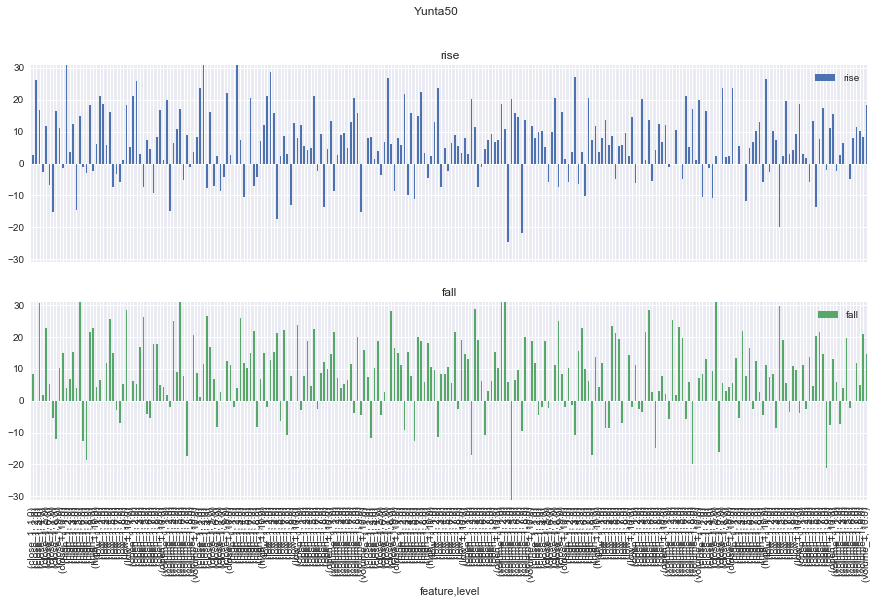

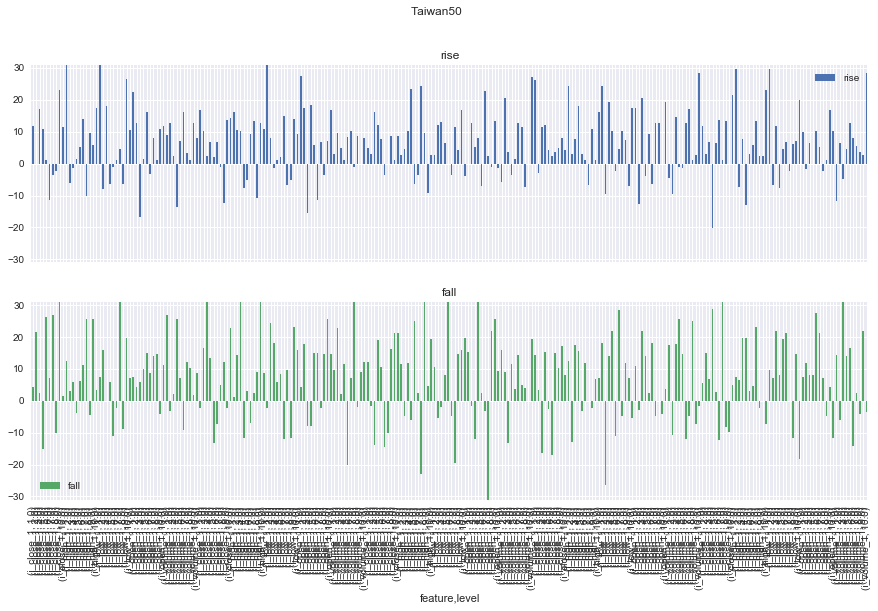

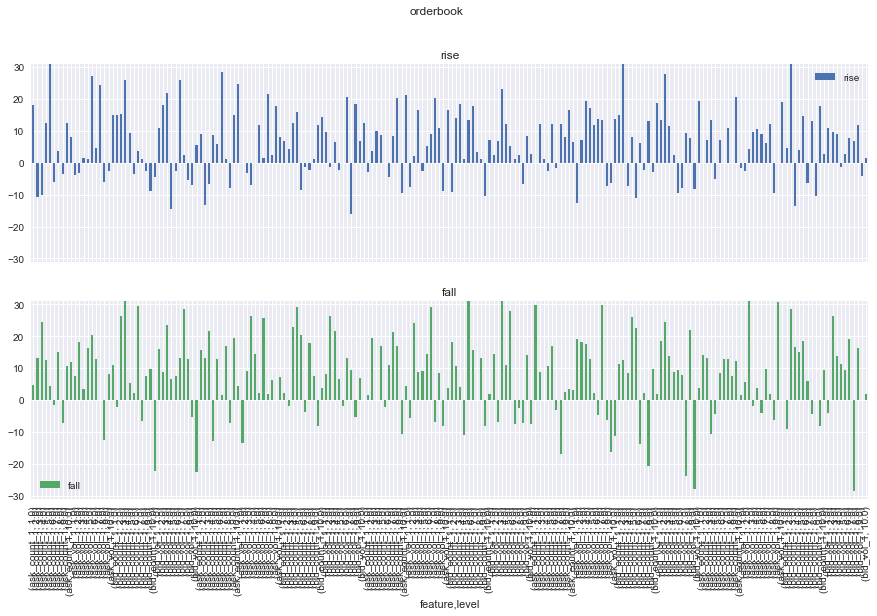

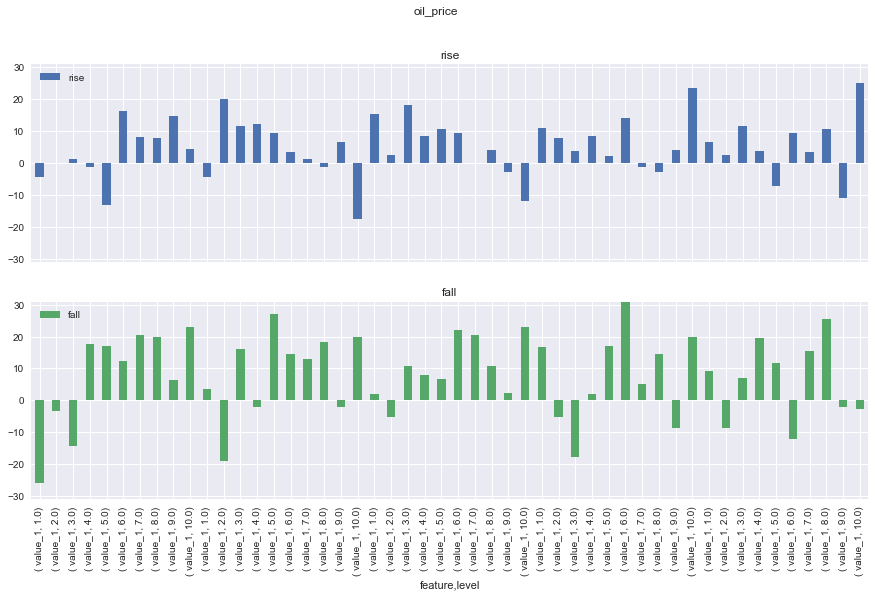

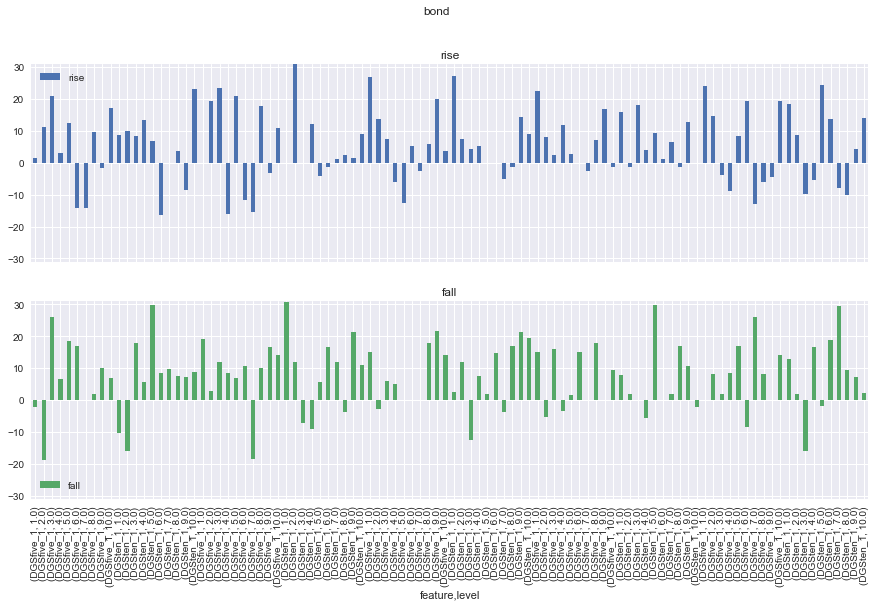

...

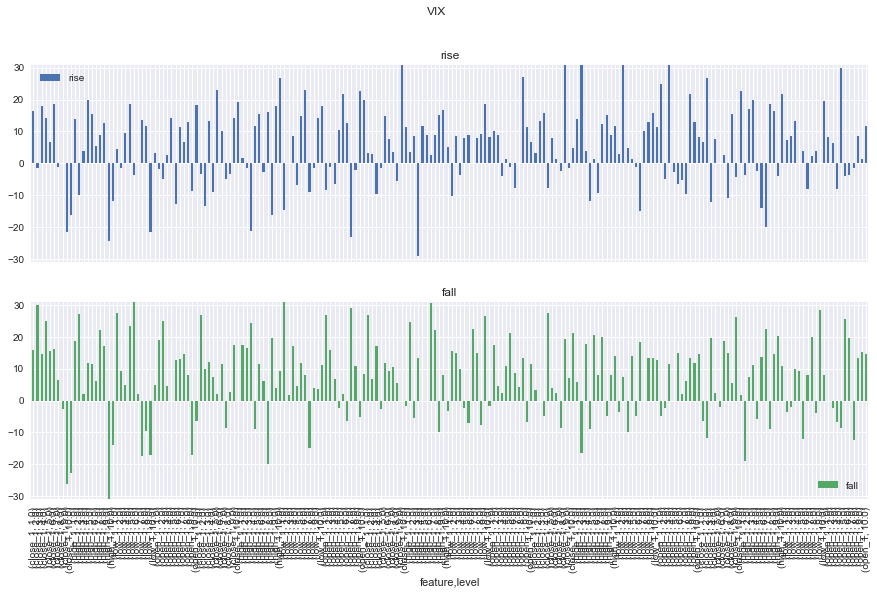

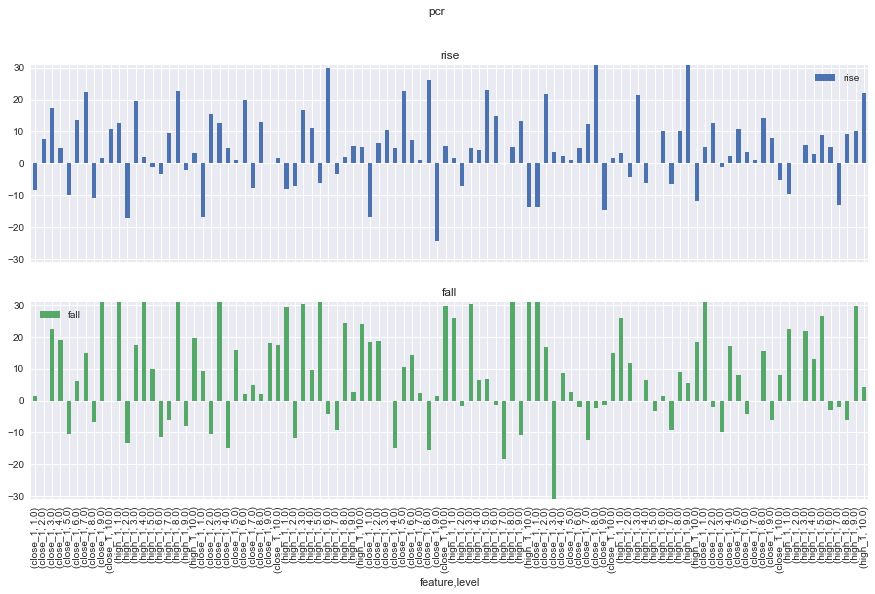

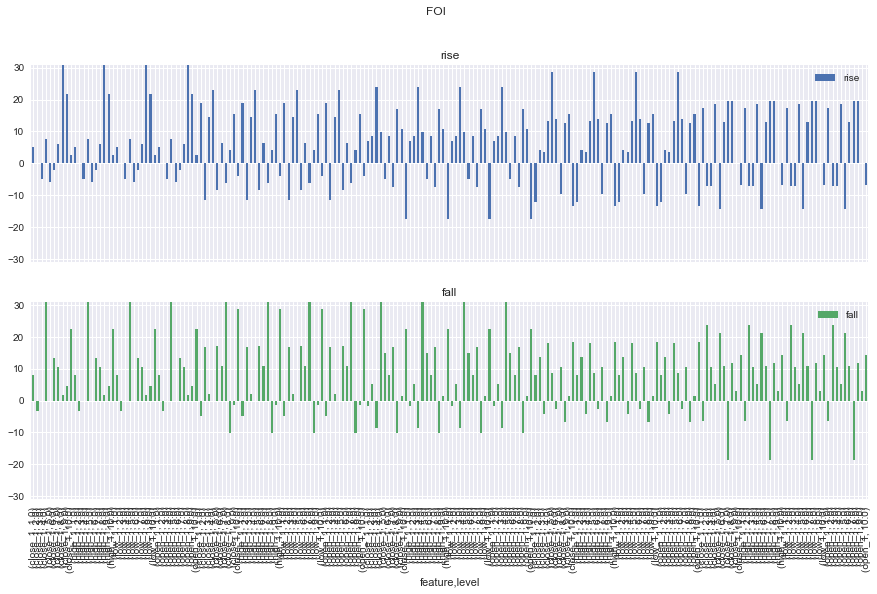

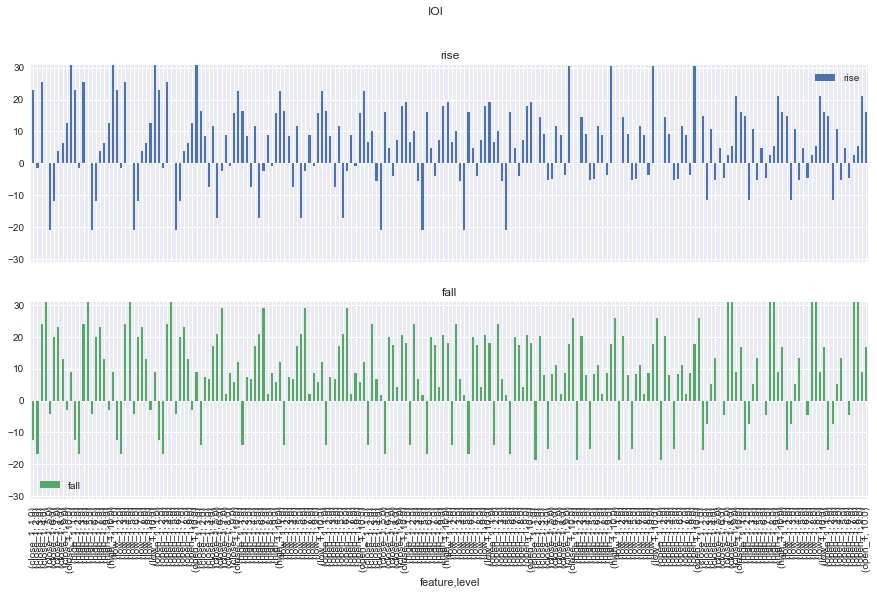

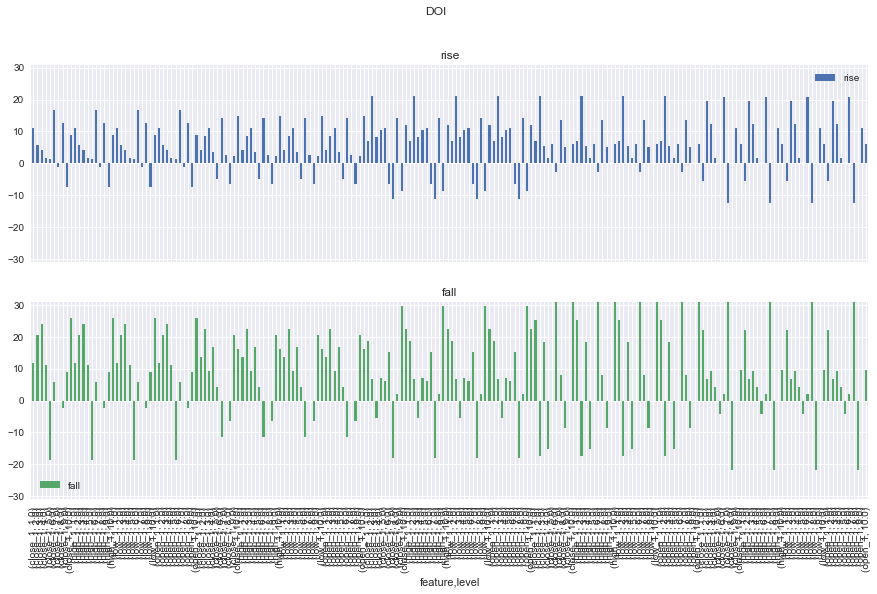

In [208]:
interval = 0
window = 5
ca= 10
get_all_stable_5day(df_list,df_name,df_allrate,mrf,interval,Yunta50_rate,window,one=False,two = True,ca = ca)

## Statistic table for 3 vs label

In [95]:
o5 = get_change_rate(orderbook,5).iloc[:,orderbook.shape[1]:]
oav = get_av_ca(o5,window=5,rf_df=df_rf,ca=5)
oca = get_ca(o5,rf_df=df_rf,ca=5)
# orf = get_mean_rf(orderbook,columnname='')

In [96]:
l = []
for i in range(5):
    l.append(f'bid_count_{i+1}')

### Yunta50 mean + Yunta50 rise fall

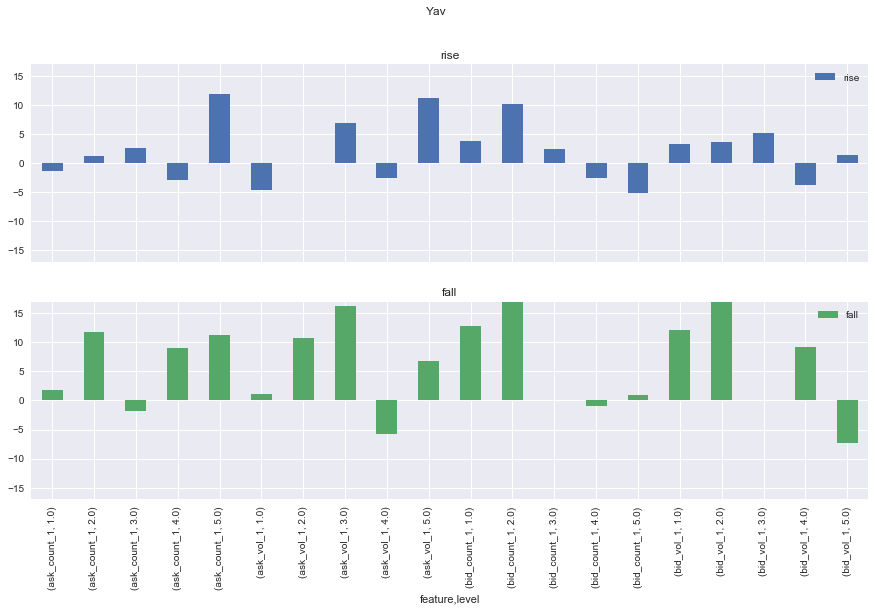

In [101]:
oav_ud_s = get_stable_ud(oav,mrf)
plot_rf_2(oav_ud_s,'Yav',17)

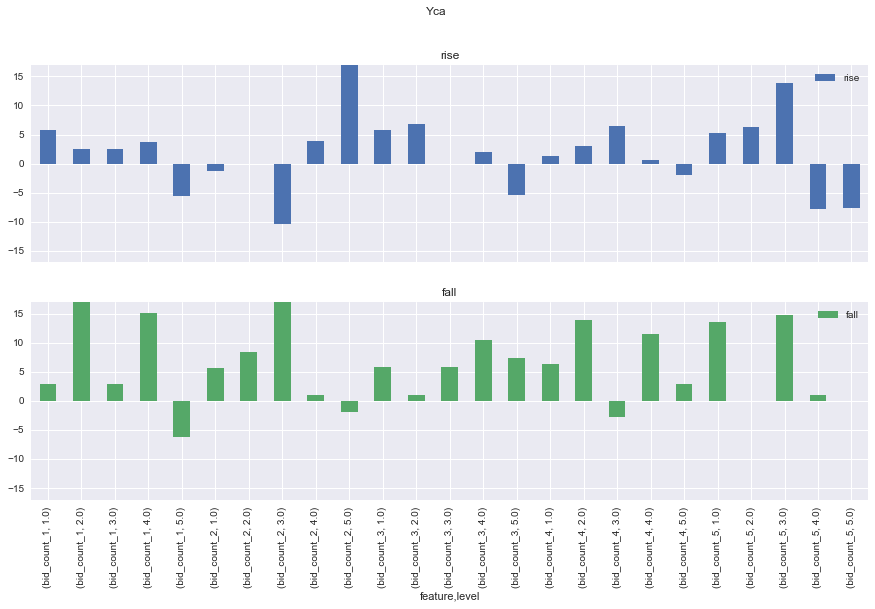

In [102]:
obl = pd.concat([oca[l],oca.iloc[:,-3:]],axis = 1)
oca_ud_s = get_stable_ud(obl,mrf)
plot_rf_2(oca_ud_s,'Yca',17)

### TXF mean + TXF rise fall(more clear)

In [103]:
TXF_rate = get_change_rate(TXF)
TXF_rf = get_rise_fall(TXF_rate,0.5)
TRF = get_mean_rf(columnname='close',stock=TXF,window=20,days=5)
trf = pd.DataFrame(data=TRF,index=TXF.index,columns = ['mean_rise_fall'])


In [104]:
oav = get_av_ca(o5,window=5,rf_df=TXF_rf,ca=5)
oca = get_ca(o5,rf_df=TXF_rf,ca=5)

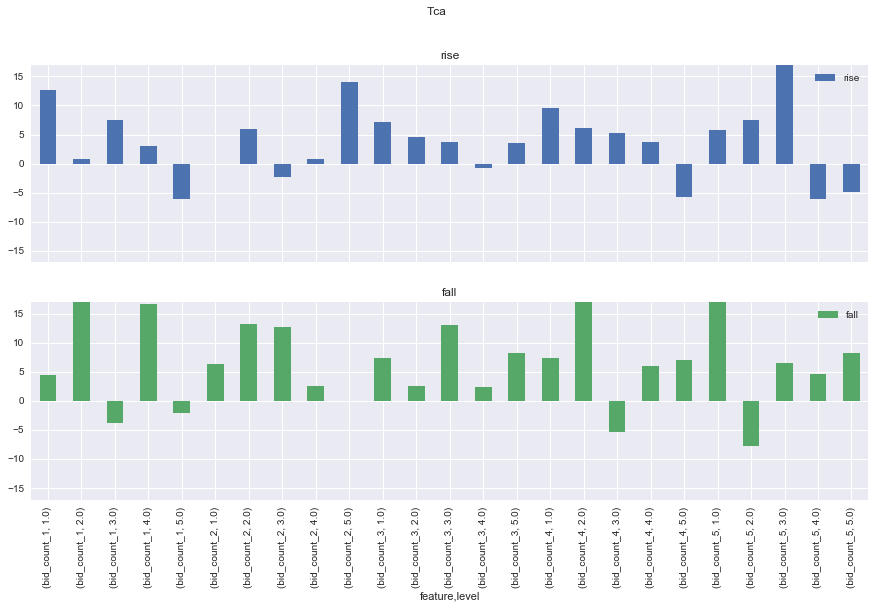

In [107]:
obl = pd.concat([oca[l],oca.iloc[:,-3:]],axis = 1)
oca_ud_s = get_stable_ud(obl,trf)
plot_rf_2(oca_ud_s,'Tca',17)

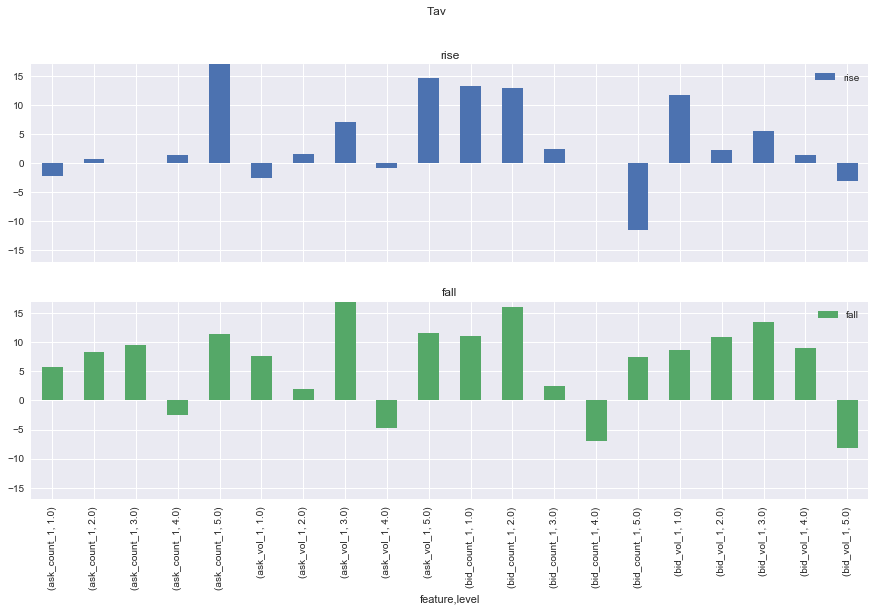

In [108]:
oav_ud_s = get_stable_ud(oav,trf)
plot_rf_2(oav_ud_s,'Tav',17)

# One day rise_fall prediction